In [1]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import numpy as np
import torch
from torch.utils.data import DataLoader, TensorDataset
import torch.nn as nn
import torch.nn.functional as F
from torch.optim.lr_scheduler import ReduceLROnPlateau
import matplotlib.pyplot as plt
import re
from sklearn.decomposition import PCA
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, adjusted_rand_score, confusion_matrix
from sklearn.mixture import GaussianMixture
from sklearn.manifold import TSNE
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve, auc
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score, recall_score
from itertools import product
from sklearn.model_selection import StratifiedKFold
import optuna
import plotly.express as px
from collections import Counter
import umap

/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def fill_repeater_from_source(row, data):
    if row['Source'] == 'FRB20220912A':
        return 1
    else:
        return row['Repeater']

In [3]:
frb_data = pd.read_csv('frb-data.csv')
frb_data['Repeater'] = frb_data['Repeater'].map({'Yes': 1, 'No': 0})
frb_data['Repeater'] = frb_data['Repeater'].fillna(0)
frb_data['Repeater'] = frb_data['Repeater'].astype(int)
frb_data['Repeater'] = frb_data.apply(fill_repeater_from_source, axis=1, data=frb_data)

frb_data['Repeater'].isna().sum()

np.int64(0)

In [4]:
labels = frb_data['Repeater']

# Function to clean numerical strings and convert to float
def clean_numeric_value(value):
    if isinstance(value, str):
        value = value.strip()
        if not value:
            return np.nan
        try:
            # Remove special characters and split if necessary
            for char in ['/', '+', '<', '>', '~']:
                value = value.replace(char, '')
            if '-' in value:
                value = value.split('-')[0]
            return float(value)
        except ValueError:
            return np.nan
    try:
        return float(value)
    except (ValueError, TypeError):
        return np.nan
    
error_features = [
    'DM_SNR', 'DM_alig', 'Flux_density', 'Fluence', 'Energy',
    'Polar_l', 'Polar_c', 'RM_syn', 'RM_QUfit', 'Scatt_t', 
    #'Scin_f'
]
base_features = [
    'Observing_band', 
    # 'GL', 'GB', 
    'SNR', 'Freq_high',
    'Freq_low', 'Freq_peak', 
    'Width'
    # 'Repeater',
    #'MJD'
]

for feature in base_features + error_features:
    frb_data[feature] = frb_data[feature].apply(clean_numeric_value)

for feature in error_features:
    frb_data[f'{feature}_err'] = frb_data[f'{feature}_err'].apply(clean_numeric_value)

for feature in error_features:
    frb_data[f'{feature}_upper'] = frb_data[feature] + frb_data[f'{feature}_err']
    frb_data[f'{feature}_lower'] = frb_data[feature] - frb_data[f'{feature}_err']
    frb_data[f'{feature}_lower'] = frb_data[f'{feature}_lower'].clip(lower=0)

features = (
    base_features +
    error_features +
    [f'{feature}_upper' for feature in error_features] +
    [f'{feature}_lower' for feature in error_features]
)

In [47]:
frb_data_clean = frb_data[features].fillna(0)
scaler = StandardScaler()
frb_data_scaled = scaler.fit_transform(frb_data_clean)

# Retain the original indices
indices = frb_data_clean.index

# Split the data and retain indices
train_data, val_data, train_labels, val_labels, train_indices, val_indices = train_test_split(
    frb_data_scaled, labels, indices, test_size=0.2, random_state=42, stratify=labels
)

# Convert to PyTorch tensors
train_tensor = torch.tensor(train_data, dtype=torch.float32)
val_tensor = torch.tensor(val_data, dtype=torch.float32)
train_labels_tensor = torch.tensor(train_labels.values, dtype=torch.long)
val_labels_tensor = torch.tensor(val_labels.values, dtype=torch.long)

# Create datasets and dataloaders
batch_size = 64
train_dataset = TensorDataset(train_tensor, train_labels_tensor)
val_dataset = TensorDataset(val_tensor, val_labels_tensor)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [7]:
class SupervisedVAE(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim, dropout_rate=0.3, activation=nn.LeakyReLU(0.1)):
        super(SupervisedVAE, self).__init__()

        self.activation = activation

        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            self.activation,
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            self.activation,
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_dim, hidden_dim),  # Additional dense layer
            nn.BatchNorm1d(hidden_dim),
            self.activation,
            nn.Dropout(dropout_rate)
        )

        self.fc_mu = nn.Linear(hidden_dim, latent_dim)
        self.fc_logvar = nn.Linear(hidden_dim, latent_dim)

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            self.activation,
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            self.activation,
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_dim, hidden_dim),  # Additional dense layer
            nn.BatchNorm1d(hidden_dim),
            self.activation,
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_dim, input_dim)
        )

        # Classification head for binary classification - tune hyperparameters
        self.classifier = nn.Sequential(
            nn.Linear(latent_dim, hidden_dim // 2),
            self.activation,
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_dim // 2, hidden_dim // 4),  # Added extra linear layer
            self.activation,
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_dim // 4, 1),
        )


    def encode(self, x):
        h = self.encoder(x)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon_x = self.decode(z)
        class_prob = self.classifier(mu)
        return recon_x, mu, logvar, class_prob


In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_dim = val_tensor.shape[1]
hidden_dim = 256
latent_dim = 10
stop_patience = 8
num_epochs = 150

In [9]:
def loss_function(recon_x, x, mu, logvar, class_prob, labels, beta, gamma, class_weight, classification_multiplier):
    reconstruction_loss_fn = nn.MSELoss(reduction='sum')
    pos_weight = torch.tensor([class_weight], dtype=torch.float32, device=device)
    classification_loss_fn = nn.BCEWithLogitsLoss(pos_weight=pos_weight) # check this loss function
    recon_loss = reconstruction_loss_fn(recon_x, x)
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    class_loss = classification_multiplier * classification_loss_fn(class_prob, labels.unsqueeze(1).float())
    total_loss = recon_loss + beta * kl_loss + gamma * class_loss
    return total_loss, recon_loss, kl_loss, class_loss

In [10]:
def train_supervised(model, optimizer, scheduler, epoch, beta, gamma, class_weight, classification_multiplier):
    model.train()
    train_loss = 0
    recon_loss_total = 0
    kl_loss_total = 0
    classification_loss_total = 0
    
    correct = 0
    total = 0
    
    for batch_idx, (data, labels) in enumerate(train_loader):
        data, labels = data.to(device), labels.to(device)
        optimizer.zero_grad()
        recon_batch, mu, logvar, class_logits = model(data)
        
        # Supervised loss function
        loss, recon_loss, kl_loss, classification_loss = loss_function(
            recon_batch, data, mu, logvar, class_logits, labels, beta, gamma, class_weight, classification_multiplier
        )
        
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        recon_loss_total += recon_loss.item()
        kl_loss_total += kl_loss.item()
        classification_loss_total += classification_loss.item()
        
        predicted = (class_logits > 0.5).float()
        total += labels.size(0)
        correct += (predicted.squeeze() == labels).sum().item()
        
        # if batch_idx % 100 == 0:
            # print(classification_loss)
            # print(f'Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)} '
            #       f'({100. * batch_idx / len(train_loader):.0f}%)]\tLoss: {loss.item() / len(data):.6f}')
    
    # Calculate average loss and accuracy for the epoch
    avg_loss = train_loss / len(train_loader.dataset)
    avg_recon = recon_loss_total / len(train_loader.dataset)
    avg_kl = kl_loss_total / len(train_loader.dataset)
    avg_class = classification_loss_total / len(train_loader.dataset)
    accuracy = correct / total
    
    # print(f'====> Epoch: {epoch} Average loss: {avg_loss:.4f}, Recon: {avg_recon:.4f}, KL: {avg_kl:.4f}, '
    #       f'Class: {avg_class:.4f}, Accuracy: {accuracy:.4f}')
    return avg_loss, avg_recon, avg_kl, avg_class, accuracy

def validate_supervised(model, scheduler, optimizer, epoch, beta, gamma, class_weight, classification_multiplier):
    model.eval()
    val_loss = 0
    recon_loss_total = 0
    kl_loss_total = 0
    classification_loss_total = 0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for data, labels in val_loader:
            data, labels = data.to(device), labels.to(device)
            recon_batch, mu, logvar, class_logits = model(data)
            
            loss, recon_loss, kl_loss, classification_loss = loss_function(
                recon_batch, data, mu, logvar, class_logits, labels, beta, gamma, class_weight, classification_multiplier
            )
            
            val_loss += loss.item()
            recon_loss_total += recon_loss.item()
            kl_loss_total += kl_loss.item()
            classification_loss_total += classification_loss.item()
            
            predicted = (class_logits > 0.5).float()
            total += labels.size(0)
            correct += (predicted.squeeze() == labels).sum().item()
    
    avg_loss = val_loss / len(val_loader.dataset)
    avg_recon = recon_loss_total / len(val_loader.dataset)
    avg_kl = kl_loss_total / len(val_loader.dataset)
    avg_class = classification_loss_total / len(val_loader.dataset)
    accuracy = correct / total
    
    # print(f'====> Validation loss: {avg_loss:.4f}, Recon: {avg_recon:.4f}, KL: {avg_kl:.4f}, '
    #       f'Class: {avg_class:.4f}, Accuracy: {accuracy:.4f}')
    return avg_loss, avg_recon, avg_kl, avg_class, accuracy


def early_stopping(val_losses, patience):
    if len(val_losses) > patience:
        if all(val_losses[-i-1] <= val_losses[-i] for i in range(1, patience+1)):
            return True
    return False



In [11]:
def evaluate_classifier(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, labels in dataloader:
            data = data.to(device)
            labels = labels.to(device)
            class_logits = model(data)[-1]
            preds = (class_logits > 0.5).float().cpu().numpy().squeeze()
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())
    
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    
    accuracy = accuracy_score(all_labels, all_preds)
    class_report = classification_report(all_labels, all_preds, target_names=["Non-Repeater", "Repeater"])
    conf_matrix = confusion_matrix(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds, average='weighted')

    
    false_positives = np.sum((all_labels == 0) & (all_preds == 1))

    return accuracy, class_report, conf_matrix, recall, false_positives  # Return F1 score as well

def get_activation_function(name):
    if name == 'ReLU':
        return nn.ReLU()
    elif name == 'LeakyReLU':
        return nn.LeakyReLU(0.1)
    elif name == 'ELU':
        return nn.ELU()
    elif name == 'SELU':
        return nn.SELU()
    elif name == 'GELU':
        return nn.GELU()
    else:
        raise ValueError(f"Unknown activation function: {name}")

In [12]:
from sklearn.metrics import roc_auc_score, roc_curve, auc, f1_score
import sklearn.metrics

def evaluate_classifier_full(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, labels in dataloader:
            data = data.to(device)
            class_logits = model(data)[-1]
            preds = (class_logits > 0.5).float().cpu().numpy().squeeze()
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())
    
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    
    accuracy = accuracy_score(all_labels, all_preds)
    f1 = sklearn.metrics.f1_score(all_labels, all_preds)
    class_report = classification_report(all_labels, all_preds, target_names=["Non-Repeater", "Repeater"])
    conf_matrix = confusion_matrix(all_labels, all_preds)
    
    return f1, class_report, conf_matrix, all_preds, all_labels

original_data = pd.read_csv('frb-data.csv')
original_data['Repeater'] = original_data['Repeater'].map({'Yes': 1, 'No': 0})
print(original_data['Repeater'].isna().sum())

print(f"Number of NaN values in 'Repeater' column before processing: {original_data['Repeater'].isna().sum()}")
# Apply the function row-wise
original_data['Repeater'] = original_data.apply(fill_repeater_from_source, axis=1, data=original_data)

print(f"Number of NaN values in 'Repeater' column after processing: {original_data['Repeater'].isna().sum()}")

443
Number of NaN values in 'Repeater' column before processing: 443
Number of NaN values in 'Repeater' column after processing: 0


In [13]:
garcia_list = '''
FRB20180907E
FRB20180920B
FRB20180928A
FRB20181017B
FRB20181022E
FRB20181125A
FRB20181125A
FRB20181125A
FRB20181214A
FRB20181220A
FRB20181226E
FRB20181229B
FRB20190112A
FRB20190128C
FRB20190206B
FRB20190206A
FRB20190218B
FRB20190223A
FRB20190308C
FRB20190308C
FRB20190323D
FRB20190329A
FRB20190410A
FRB20190412B
FRB20190423B
FRB20190423B
FRB20190429B
FRB20190430A
FRB20190527A
FRB20190527A
FRB20190601C
FRB20190601C
FRB20190617B
FRB20180910A
FRB20190210C
FRB20200726D
'''.split()

luo_list = '''
FRB20181229B
FRB20190423B
FRB20190410A
FRB20181017B
FRB20181128C
FRB20190422A
FRB20190409B
FRB20190329A
FRB20190423B
FRB20190206A
FRB20190128C
FRB20190106A
FRB20190129A
FRB20181030E
FRB20190527A
FRB20190218B
FRB20190609A
FRB20190412B
FRB20190125B
FRB20181231B
FRB20181221A
FRB20190112A
FRB20190125A
FRB20181218C
FRB20190429B
FRB20190109B
FRB20190206B
'''.split()

zhu_ge_list = '''
FRB20180911A
FRB20180915B
FRB20180920B
FRB20180923A
FRB20180923C
FRB20180928A
FRB20181013E
FRB20181017B
FRB20181030E
FRB20181125A
FRB20181125A
FRB20181125A
FRB20181130A
FRB20181214A
FRB20181220A
FRB20181221A
FRB20181226E
FRB20181229B
FRB20181231B
FRB20190106B
FRB20190109B
FRB20190110C
FRB20190111A
FRB20190112A
FRB20190129A
FRB20190204A
FRB20190206A
FRB20190218B
FRB20190220A
FRB20190221A
FRB20190222B
FRB20190223A
FRB20190228A
FRB20190308C
FRB20190308C
FRB20190308B
FRB20190308B
FRB20190323D
FRB20190329A
FRB20190403E
FRB20190409B
FRB20190410A
FRB20190412B
FRB20190418A
FRB20190419A
FRB20190422A
FRB20190422A
FRB20190423A
FRB20190423B
FRB20190423B
FRB20190429B
FRB20190430A
FRB20190517C
FRB20190527A
FRB20190527A
FRB20190531C
FRB20190601B
FRB20190601C
FRB20190601C
FRB20190609A
FRB20190617A
FRB20190617B
FRB20190618A
FRB20190625A
'''.split()

In [13]:
# def objective(trial):
#     hidden_dim = trial.suggest_int('hidden_dim', 128, 2048)
#     latent_dim = trial.suggest_int('latent_dim', 5, 40)
#     beta = trial.suggest_float('beta', 0.1, 2.0)
#     gamma = trial.suggest_float('gamma', 0.1, 2.0)
#     dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)
#     lr = trial.suggest_float('lr', 1e-4, 1e-2)
#     scheduler_patience = trial.suggest_int('scheduler_patience', 2, 7)
#     class_weight = trial.suggest_float('class_weight', 0.05, 1)
    
#     activation_name = trial.suggest_categorical('activation', ['ReLU', 'LeakyReLU', 'ELU', 'SELU', 'GELU'])
#     activation = get_activation_function(activation_name)
#     classification_multiplier = trial.suggest_float('classification_multiplier', 5000, 15000)
    
#     pos_weight = torch.tensor([class_weight], dtype=torch.float32, device=device)

#     model = SupervisedVAE(input_dim, hidden_dim, latent_dim, dropout_rate, activation).to(device)
#     optimizer = torch.optim.Adam(model.parameters(), lr=lr)
#     scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=scheduler_patience)
    
#     all_false_positives = []
#     all_false_negatives = []
#     all_true_positives = []
#     all_true_negatives = []

#     num_epochs = 50
    
#     for epoch in range(1, num_epochs + 1):
#         train_loss, _, _, _, train_accuracy = train_supervised(model, optimizer, scheduler, epoch, beta, gamma, pos_weight, classification_multiplier)
#         val_loss, _, _, _, val_accuracy = validate_supervised(model, optimizer, scheduler, epoch, beta, gamma, pos_weight, classification_multiplier)
#         scheduler.step(val_loss)
        
#         # Early stopping
#         if early_stopping([val_loss], stop_patience):
#             print(f"Early stopping triggered at epoch {epoch}")
#             break
    
#     val_f1, val_class_report, val_conf_matrix, val_preds, val_labels = evaluate_classifier_full(model, val_loader, device)
    
#     tp=val_conf_matrix[1,1]
#     tn=val_conf_matrix[0,0]
#     fp=val_conf_matrix[0,1]
#     fn=val_conf_matrix[1,0]
#     print("True Positives: ", tp)
#     print("True Negatives: ", tn)
#     print("False Positives: ", fp)
#     print("False Negatives: ", fn)
    
#     p_ratio=tp/(tp+fn)
#     n_ratio = tn/(tn+fp)
#     avg_ratio = (p_ratio+ n_ratio)/2
    
#     print(f"Validation Accuracy: {val_accuracy:.4f}")
#     print("Classification Report:\n", val_class_report)
#     print("Confusion Matrix:\n", val_conf_matrix)
    
    
#     return val_accuracy
    

    
        
# study = optuna.create_study(direction='maximize')
# study.optimize(objective, n_trials=500)

In [14]:
i = 0
accuracy_max = 0
def objective(trial):
    global i, accuracy_max
    hidden_dim = trial.suggest_int('hidden_dim', 128, 2048)
    latent_dim = trial.suggest_int('latent_dim', 5, 40)
    beta = trial.suggest_float('beta', 0.1, 2.0)
    gamma = trial.suggest_float('gamma', 0.1, 2.0)
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)
    lr = trial.suggest_float('lr', 1e-4, 1e-2)
    scheduler_patience = trial.suggest_int('scheduler_patience', 2, 7)
    class_weight = trial.suggest_float('class_weight', 0.05, 1)

    activation_name = trial.suggest_categorical('activation', ['ReLU', 'LeakyReLU', 'ELU', 'SELU', 'GELU'])
    activation = get_activation_function(activation_name)
    classification_multiplier = trial.suggest_float('classification_multiplier', 5000, 15000)

    pos_weight = torch.tensor([class_weight], dtype=torch.float32, device=device)

    all_false_positives = []
    all_false_negatives = []
    all_true_positives = []
    all_true_negatives = []

    num_epochs = 100

    n_folds = 5
    skf = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)

    full_data_tensor = torch.tensor(frb_data_scaled, dtype=torch.float32)
    full_labels_tensor = torch.tensor(labels.values, dtype=torch.long)

    for fold, (train_index, val_index) in enumerate(skf.split(frb_data_scaled, labels)):
        # print(f"\n=== Fold {fold + 1}/{n_folds} ===")
        
        train_data, val_data = frb_data_scaled[train_index], frb_data_scaled[val_index]
        train_labels, val_labels = labels.iloc[train_index], labels.iloc[val_index]
        
        train_tensor = torch.tensor(train_data, dtype=torch.float32)
        val_tensor = torch.tensor(val_data, dtype=torch.float32)
        train_labels_tensor = torch.tensor(train_labels.values, dtype=torch.long)
        val_labels_tensor = torch.tensor(val_labels.values, dtype=torch.long)
        
        train_dataset = TensorDataset(train_tensor, train_labels_tensor)
        val_dataset = TensorDataset(val_tensor, val_labels_tensor)
        
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
        
        best_model = SupervisedVAE(
            input_dim, 
            hidden_dim, 
            latent_dim, 
            dropout_rate, 
            activation
        ).to(device)
        
        optimizer = torch.optim.Adam(best_model.parameters(), lr=lr)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=scheduler_patience)
        
        # Train the model
        for epoch in range(1, num_epochs + 1):
            train_loss, _, _, _, train_accuracy = train_supervised(best_model, optimizer, scheduler, epoch, beta, gamma, class_weight, classification_multiplier)
            val_loss, _, _, _, val_accuracy = validate_supervised(best_model, optimizer, scheduler, epoch, beta, gamma, class_weight, classification_multiplier)
            scheduler.step(val_loss)
            
            # Early stopping
            if early_stopping([val_loss], stop_patience):
                print(f"Early stopping triggered at epoch {epoch}")
                break

        val_accuracy, val_class_report, val_conf_matrix, val_preds, val_labels = evaluate_classifier_full(best_model, val_loader, device)
        
        # print(f"Validation Accuracy: {val_accuracy:.4f}")
        # print("Classification Report:\n", val_class_report)
        # print("Confusion Matrix:\n", val_conf_matrix)
        
        misclassified_non_repeaters = (val_labels == 0) & (val_preds == 1)
        misclassified_indices = val_index[misclassified_non_repeaters]
        misclassified_sources = original_data.loc[misclassified_indices, "Source"].drop_duplicates()
        
        false_positives_fold = original_data.loc[val_index[(val_labels == 0) & (val_preds == 1)], "Source"]
        false_negatives_fold = original_data.loc[val_index[(val_labels == 1) & (val_preds == 0)], "Source"]
        true_positives_fold = original_data.loc[val_index[(val_labels == 1) & (val_preds == 1)], "Source"]
        true_negatives_fold = original_data.loc[val_index[(val_labels == 0) & (val_preds == 0)], "Source"]
        
        # fold_false_positives = []
        for source in misclassified_sources:
            # fold_false_positives.append(source)
            if source in garcia_list or source in luo_list or source in zhu_ge_list:
                print(f"False positive in fold {fold + 1}: {source}")
                
        all_false_negatives.extend(false_negatives_fold)
        all_true_positives.extend(true_positives_fold)
        all_true_negatives.extend(true_negatives_fold)
        all_false_positives.extend(false_positives_fold)
        
        
    all_false_positives = pd.Series(all_false_positives)
    all_false_negatives = pd.Series(all_false_negatives)
    all_true_positives = pd.Series(all_true_positives)
    all_true_negatives = pd.Series(all_true_negatives)

    print("\n=== Summary ===")
    print(f"Total False Positives: {all_false_positives.nunique()}")
    print(f"Total False Negatives: {all_false_negatives.nunique()}")
    print(f"Total True Positives: {all_true_positives.nunique()}")
    print(f"Total True Negatives: {all_true_negatives.nunique()}")

    FP = all_false_positives.nunique()
    FN = all_false_negatives.nunique()
    TP = all_true_positives.nunique()
    TN = all_true_negatives.nunique()

    # Confusion matrix

    conf_mat_final = np.zeros((2, 2))
    conf_mat_final[0, 0] = TN
    conf_mat_final[0, 1] = FP
    conf_mat_final[1, 0] = FN
    conf_mat_final[1, 1] = TP

    print(conf_mat_final)

    precision = TP / (TP + FP)
    accuracy = (TP + TN) / (TP + TN + FP + FN)
    recall = TP / (TP + FN)
    # f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    print("\n=== Classification Metrics ===")
    # print(f"Precision: {precision:.4f}")
    print(f"Recall (Sensitivity): {recall:.4f}")
    print(f"Accuracy: {accuracy:.4f}")
    
    if accuracy > accuracy_max:
        torch.save(best_model.state_dict(), f'optimized{i}.pth')
    i+=1
    
    return accuracy

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=350)

[I 2025-04-04 21:12:32,382] A new study created in memory with name: no-name-2bcfe8f4-9173-4d78-878a-ea1ae48c90df
[I 2025-04-04 21:20:09,912] Trial 0 finished with value: 0.9078787878787878 and parameters: {'hidden_dim': 1890, 'latent_dim': 12, 'beta': 0.603325821201377, 'gamma': 1.7432036623522769, 'dropout_rate': 0.3766380502621778, 'lr': 0.006070087548882074, 'scheduler_patience': 4, 'class_weight': 0.05082914878810535, 'activation': 'GELU', 'classification_multiplier': 6409.468330349644}. Best is trial 0 with value: 0.9078787878787878.



=== Summary ===
Total False Positives: 10
Total False Negatives: 66
Total True Positives: 12
Total True Negatives: 737
[[737.  10.]
 [ 66.  12.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.1538
Accuracy: 0.9079
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190429B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-04 21:23:48,485] Trial 1 finished with value: 0.8767772511848341 and parameters: {'hidden_dim': 170, 'latent_dim': 21, 'beta': 1.8809359527189435, 'gamma': 1.3148620074030313, 'dropout_rate': 0.4277416990699636, 'lr': 0.005106102885832622, 'scheduler_patience': 6, 'class_weight': 0.7824909676947601, 'activation': 'ReLU', 'classification_multiplier': 13066.518240098514}. Best is trial 0 with value: 0.9078787878787878.


False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190109B
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 66
Total False Negatives: 38
Total True Positives: 58
Total True Negatives: 682
[[682.  66.]
 [ 38.  58.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6042
Accuracy: 0.8768
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-04 21:28:19,284] Trial 2 finished with value: 0.8752941176470588 and parameters: {'hidden_dim': 918, 'latent_dim': 6, 'beta': 0.13705315955545744, 'gamma': 0.31236709804587026, 'dropout_rate': 0.31112787932646635, 'lr': 0.005652833725879013, 'scheduler_patience': 3, 'class_weight': 0.5925396503351711, 'activation': 'SELU', 'classification_multiplier': 10628.692954397855}. Best is trial 0 with value: 0.9078787878787878.



=== Summary ===
Total False Positives: 56
Total False Negatives: 50
Total True Positives: 52
Total True Negatives: 692
[[692.  56.]
 [ 50.  52.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5098
Accuracy: 0.8753
False positive in fold 1: FRB20190220A
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20180915B
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A


[I 2025-04-04 21:33:41,244] Trial 3 finished with value: 0.7343565525383707 and parameters: {'hidden_dim': 1243, 'latent_dim': 15, 'beta': 1.8906866282455668, 'gamma': 0.7344954416329742, 'dropout_rate': 0.4996992272338511, 'lr': 0.003815865989940194, 'scheduler_patience': 4, 'class_weight': 0.7908208536783714, 'activation': 'SELU', 'classification_multiplier': 7320.21168083824}. Best is trial 0 with value: 0.9078787878787878.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190109B

=== Summary ===
Total False Positives: 171
Total False Negatives: 54
Total True Positives: 45
Total True Negatives: 577
[[577. 171.]
 [ 54.  45.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4545
Accuracy: 0.7344


[I 2025-04-04 21:38:04,923] Trial 4 finished with value: 0.925 and parameters: {'hidden_dim': 853, 'latent_dim': 34, 'beta': 1.3697228574916214, 'gamma': 0.44453636340119884, 'dropout_rate': 0.31797691705181774, 'lr': 0.007327140189966596, 'scheduler_patience': 5, 'class_weight': 0.13034070237844847, 'activation': 'SELU', 'classification_multiplier': 5645.8651770844535}. Best is trial 4 with value: 0.925.



=== Summary ===
Total False Positives: 8
Total False Negatives: 55
Total True Positives: 38
Total True Negatives: 739
[[739.   8.]
 [ 55.  38.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4086
Accuracy: 0.9250
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20181226E
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A


[I 2025-04-04 21:41:49,088] Trial 5 finished with value: 0.9091995221027479 and parameters: {'hidden_dim': 375, 'latent_dim': 37, 'beta': 0.6341961674472462, 'gamma': 0.6041731540975075, 'dropout_rate': 0.12197757753780603, 'lr': 0.00464882961104042, 'scheduler_patience': 6, 'class_weight': 0.9059543068406457, 'activation': 'ELU', 'classification_multiplier': 8408.713450237181}. Best is trial 4 with value: 0.925.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 52
Total False Negatives: 24
Total True Positives: 65
Total True Negatives: 696
[[696.  52.]
 [ 24.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7303
Accuracy: 0.9092
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-04 21:49:28,690] Trial 6 finished with value: 0.9278959810874704 and parameters: {'hidden_dim': 1918, 'latent_dim': 27, 'beta': 1.222518815637243, 'gamma': 0.26454016887844983, 'dropout_rate': 0.383816730994638, 'lr': 0.002034662411512271, 'scheduler_patience': 6, 'class_weight': 0.21552677447049212, 'activation': 'ReLU', 'classification_multiplier': 14853.76053176492}. Best is trial 6 with value: 0.9278959810874704.



=== Summary ===
Total False Positives: 23
Total False Negatives: 38
Total True Positives: 60
Total True Negatives: 725
[[725.  23.]
 [ 38.  60.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6122
Accuracy: 0.9279
False positive in fold 1: FRB20190220A
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190106B
False positive in fold 2: FRB20190609A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20190125B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20190221A


[I 2025-04-04 21:54:21,020] Trial 7 finished with value: 0.6654888103651354 and parameters: {'hidden_dim': 1083, 'latent_dim': 28, 'beta': 0.4351889071224033, 'gamma': 0.25381437475864066, 'dropout_rate': 0.26962417570241703, 'lr': 0.009313679287926186, 'scheduler_patience': 2, 'class_weight': 0.861507143558335, 'activation': 'ReLU', 'classification_multiplier': 5117.648323104124}. Best is trial 6 with value: 0.9278959810874704.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190423A
False positive in fold 5: FRB20181030E
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190109B
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190617A

=== Summary ===
Total False Positives: 235
Total False Negatives: 49
Total True Positives: 52
Total True Negatives: 513
[[513. 235.]
 [ 49.  52.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5149
Accuracy: 0.6655
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20180923C


[I 2025-04-04 22:02:00,653] Trial 8 finished with value: 0.810304449648712 and parameters: {'hidden_dim': 1932, 'latent_dim': 10, 'beta': 1.7816277656181767, 'gamma': 0.664567184935438, 'dropout_rate': 0.1552622790520537, 'lr': 0.0044749054030595835, 'scheduler_patience': 4, 'class_weight': 0.7444610218634389, 'activation': 'LeakyReLU', 'classification_multiplier': 14999.737206793343}. Best is trial 6 with value: 0.9278959810874704.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 113
Total False Negatives: 49
Total True Positives: 57
Total True Negatives: 635
[[635. 113.]
 [ 49.  57.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5377
Accuracy: 0.8103
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 4: FRB20190419A


[I 2025-04-04 22:05:42,427] Trial 9 finished with value: 0.8990498812351544 and parameters: {'hidden_dim': 405, 'latent_dim': 11, 'beta': 0.5967505531959857, 'gamma': 1.4122379544118462, 'dropout_rate': 0.3846391107427931, 'lr': 0.007115930697104706, 'scheduler_patience': 3, 'class_weight': 0.827345894570477, 'activation': 'GELU', 'classification_multiplier': 11355.259505656606}. Best is trial 6 with value: 0.9278959810874704.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 48
Total False Negatives: 37
Total True Positives: 57
Total True Negatives: 700
[[700.  48.]
 [ 37.  57.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6064
Accuracy: 0.8990
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-04 22:11:52,921] Trial 10 finished with value: 0.9415274463007159 and parameters: {'hidden_dim': 1546, 'latent_dim': 26, 'beta': 1.244111007769079, 'gamma': 1.0285529466748904, 'dropout_rate': 0.21886364972916755, 'lr': 0.0008149089866180067, 'scheduler_patience': 7, 'class_weight': 0.276172959094084, 'activation': 'ReLU', 'classification_multiplier': 14960.790930351373}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 30
Total True Positives: 60
Total True Negatives: 729
[[729.  19.]
 [ 30.  60.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6667
Accuracy: 0.9415
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-04 22:17:56,960] Trial 11 finished with value: 0.9407582938388626 and parameters: {'hidden_dim': 1543, 'latent_dim': 26, 'beta': 1.2586924423338568, 'gamma': 0.9754896024270878, 'dropout_rate': 0.2184634545972436, 'lr': 0.0005145210254856392, 'scheduler_patience': 7, 'class_weight': 0.29641441412891884, 'activation': 'ReLU', 'classification_multiplier': 14912.931409702045}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 36
Total True Positives: 61
Total True Negatives: 733
[[733.  14.]
 [ 36.  61.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6289
Accuracy: 0.9408
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-04 22:23:52,015] Trial 12 finished with value: 0.9397163120567376 and parameters: {'hidden_dim': 1487, 'latent_dim': 21, 'beta': 1.4604796257067354, 'gamma': 1.0075836423591407, 'dropout_rate': 0.20883668583354736, 'lr': 0.0003225956950961981, 'scheduler_patience': 7, 'class_weight': 0.3455174414254083, 'activation': 'ReLU', 'classification_multiplier': 12927.369532661864}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 11
Total False Negatives: 40
Total True Positives: 59
Total True Negatives: 736
[[736.  11.]
 [ 40.  59.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5960
Accuracy: 0.9397
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-04 22:29:52,838] Trial 13 finished with value: 0.9395734597156398 and parameters: {'hidden_dim': 1534, 'latent_dim': 29, 'beta': 0.8952380738444696, 'gamma': 1.0060878733308822, 'dropout_rate': 0.2033389288592864, 'lr': 0.0005355375810220595, 'scheduler_patience': 7, 'class_weight': 0.37583135139172696, 'activation': 'ReLU', 'classification_multiplier': 13120.847996006169}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 34
Total True Positives: 63
Total True Negatives: 730
[[730.  17.]
 [ 34.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6495
Accuracy: 0.9396
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-04 22:36:01,402] Trial 14 finished with value: 0.9199057714958775 and parameters: {'hidden_dim': 1613, 'latent_dim': 18, 'beta': 1.0225970697826543, 'gamma': 1.3015720448383665, 'dropout_rate': 0.2386111875957002, 'lr': 0.0026816089700432435, 'scheduler_patience': 7, 'class_weight': 0.3965570899280487, 'activation': 'ELU', 'classification_multiplier': 11919.998060454394}. Best is trial 10 with value: 0.9415274463007159.



=== Summary ===
Total False Positives: 27
Total False Negatives: 41
Total True Positives: 60
Total True Negatives: 721
[[721.  27.]
 [ 41.  60.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5941
Accuracy: 0.9199
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-04 22:41:29,523] Trial 15 finished with value: 0.9350180505415162 and parameters: {'hidden_dim': 1356, 'latent_dim': 32, 'beta': 1.5556164794949134, 'gamma': 1.9449908264660136, 'dropout_rate': 0.16502218077463934, 'lr': 0.0017530223596423223, 'scheduler_patience': 5, 'class_weight': 0.542768280143362, 'activation': 'LeakyReLU', 'classification_multiplier': 9314.286362061812}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 37
Total False Negatives: 17
Total True Positives: 66
Total True Negatives: 711
[[711.  37.]
 [ 17.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7952
Accuracy: 0.9350
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-04 22:48:10,329] Trial 16 finished with value: 0.8905882352941177 and parameters: {'hidden_dim': 1719, 'latent_dim': 26, 'beta': 1.1428209267448983, 'gamma': 0.8555782883756966, 'dropout_rate': 0.27666270352514544, 'lr': 0.0030359322854267142, 'scheduler_patience': 6, 'class_weight': 0.2599110751591898, 'activation': 'ReLU', 'classification_multiplier': 14000.944571314283}. Best is trial 10 with value: 0.9415274463007159.



=== Summary ===
Total False Positives: 56
Total False Negatives: 37
Total True Positives: 65
Total True Negatives: 692
[[692.  56.]
 [ 37.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6373
Accuracy: 0.8906
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-04 22:53:14,767] Trial 17 finished with value: 0.9050480769230769 and parameters: {'hidden_dim': 1208, 'latent_dim': 39, 'beta': 1.6238814808686128, 'gamma': 1.4972947753169608, 'dropout_rate': 0.10569763525377238, 'lr': 0.001660481554362436, 'scheduler_patience': 7, 'class_weight': 0.48662480954858567, 'activation': 'ReLU', 'classification_multiplier': 14118.169588927638}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 62
Total False Negatives: 17
Total True Positives: 67
Total True Negatives: 686
[[686.  62.]
 [ 17.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7976
Accuracy: 0.9050
False positive in fold 3: FRB20180907E


[I 2025-04-04 22:59:40,173] Trial 18 finished with value: 0.9369797859690844 and parameters: {'hidden_dim': 1673, 'latent_dim': 24, 'beta': 0.95299542133094, 'gamma': 1.1945595272418372, 'dropout_rate': 0.21920985117071817, 'lr': 0.00023023994993734767, 'scheduler_patience': 5, 'class_weight': 0.23007099662763036, 'activation': 'ReLU', 'classification_multiplier': 12148.124354271898}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 12
Total False Negatives: 41
Total True Positives: 53
Total True Negatives: 735
[[735.  12.]
 [ 41.  53.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5638
Accuracy: 0.9370
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-04 23:03:56,529] Trial 19 finished with value: 0.9302045728038508 and parameters: {'hidden_dim': 759, 'latent_dim': 31, 'beta': 1.3124276832713133, 'gamma': 1.5701021355280975, 'dropout_rate': 0.15772858599649392, 'lr': 0.0012035949209967716, 'scheduler_patience': 7, 'class_weight': 0.6313656763793178, 'activation': 'LeakyReLU', 'classification_multiplier': 10058.683055909118}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 40
Total False Negatives: 18
Total True Positives: 65
Total True Negatives: 708
[[708.  40.]
 [ 18.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7831
Accuracy: 0.9302
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


[I 2025-04-04 23:09:34,551] Trial 20 finished with value: 0.8894173602853745 and parameters: {'hidden_dim': 1393, 'latent_dim': 19, 'beta': 0.8283731859909322, 'gamma': 1.1293911157604044, 'dropout_rate': 0.2511730213602745, 'lr': 0.0031800856922555645, 'scheduler_patience': 6, 'class_weight': 0.4421340707500274, 'activation': 'ELU', 'classification_multiplier': 13848.689722762949}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 66
Total False Negatives: 27
Total True Positives: 66
Total True Negatives: 682
[[682.  66.]
 [ 27.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7097
Accuracy: 0.8894
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-04 23:15:17,003] Trial 21 finished with value: 0.933570581257414 and parameters: {'hidden_dim': 1471, 'latent_dim': 23, 'beta': 1.4842033621214732, 'gamma': 0.9675357071548268, 'dropout_rate': 0.19549966992459153, 'lr': 0.0001718094606632327, 'scheduler_patience': 7, 'class_weight': 0.3189218348208443, 'activation': 'ReLU', 'classification_multiplier': 12997.286138399144}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 15
Total False Negatives: 41
Total True Positives: 55
Total True Negatives: 732
[[732.  15.]
 [ 41.  55.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5729
Accuracy: 0.9336
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-04 23:22:04,310] Trial 22 finished with value: 0.9401913875598086 and parameters: {'hidden_dim': 1768, 'latent_dim': 17, 'beta': 1.6760649579579954, 'gamma': 0.8165753977055197, 'dropout_rate': 0.19100866329449165, 'lr': 0.0010183447075193994, 'scheduler_patience': 7, 'class_weight': 0.3232922871454139, 'activation': 'ReLU', 'classification_multiplier': 14840.496084017279}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 27
Total False Negatives: 23
Total True Positives: 65
Total True Negatives: 721
[[721.  27.]
 [ 23.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7386
Accuracy: 0.9402
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


[I 2025-04-04 23:28:49,315] Trial 23 finished with value: 0.9241706161137441 and parameters: {'hidden_dim': 1768, 'latent_dim': 17, 'beta': 1.6539173298813687, 'gamma': 0.8257845863443312, 'dropout_rate': 0.17835623446888343, 'lr': 0.0012196432153534671, 'scheduler_patience': 6, 'class_weight': 0.17103668884242967, 'activation': 'ReLU', 'classification_multiplier': 14905.79401299848}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 33
Total False Negatives: 31
Total True Positives: 65
Total True Negatives: 715
[[715.  33.]
 [ 31.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6771
Accuracy: 0.9242
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20180928A
False positive in fold 1: FRB20190618A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A
False positive in fold 4: FRB20190601C


[I 2025-04-04 23:36:46,815] Trial 24 finished with value: 0.7858823529411765 and parameters: {'hidden_dim': 2033, 'latent_dim': 15, 'beta': 1.9850149527710497, 'gamma': 0.4749902899792551, 'dropout_rate': 0.2896599390531043, 'lr': 0.002488240958123809, 'scheduler_patience': 7, 'class_weight': 0.2979471497757414, 'activation': 'ReLU', 'classification_multiplier': 13938.494911095027}. Best is trial 10 with value: 0.9415274463007159.



=== Summary ===
Total False Positives: 144
Total False Negatives: 38
Total True Positives: 64
Total True Negatives: 604
[[604. 144.]
 [ 38.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6275
Accuracy: 0.7859
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-04 23:43:29,900] Trial 25 finished with value: 0.918918918918919 and parameters: {'hidden_dim': 1780, 'latent_dim': 24, 'beta': 1.1112175225266971, 'gamma': 0.8917247177476121, 'dropout_rate': 0.13413506865063785, 'lr': 0.0008673225065342201, 'scheduler_patience': 7, 'class_weight': 0.1327144115885335, 'activation': 'GELU', 'classification_multiplier': 12120.83432744016}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 29
Total False Negatives: 40
Total True Positives: 63
Total True Negatives: 719
[[719.  29.]
 [ 40.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6117
Accuracy: 0.9189


[I 2025-04-04 23:48:12,997] Trial 26 finished with value: 0.9289099526066351 and parameters: {'hidden_dim': 1079, 'latent_dim': 35, 'beta': 1.301349062012244, 'gamma': 1.1539541245162357, 'dropout_rate': 0.2419042225638741, 'lr': 0.0035735250554642687, 'scheduler_patience': 6, 'class_weight': 0.05348478614337998, 'activation': 'ReLU', 'classification_multiplier': 14422.382527298192}. Best is trial 10 with value: 0.9415274463007159.



=== Summary ===
Total False Positives: 9
Total False Negatives: 51
Total True Positives: 46
Total True Negatives: 738
[[738.   9.]
 [ 51.  46.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4742
Accuracy: 0.9289
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-04 23:53:28,238] Trial 27 finished with value: 0.9323040380047506 and parameters: {'hidden_dim': 1285, 'latent_dim': 30, 'beta': 1.690607540146726, 'gamma': 0.11693206478970242, 'dropout_rate': 0.23607336829754855, 'lr': 0.0024011669245413703, 'scheduler_patience': 5, 'class_weight': 0.435433852722361, 'activation': 'ReLU', 'classification_multiplier': 13586.36714714951}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 32
Total True Positives: 62
Total True Negatives: 723
[[723.  25.]
 [ 32.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6596
Accuracy: 0.9323
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-05 00:01:25,890] Trial 28 finished with value: 0.8967587034813925 and parameters: {'hidden_dim': 2047, 'latent_dim': 26, 'beta': 1.4033375230358325, 'gamma': 0.5462524660376711, 'dropout_rate': 0.3345322377263512, 'lr': 0.0011789708853455999, 'scheduler_patience': 7, 'class_weight': 0.9842658271290883, 'activation': 'ReLU', 'classification_multiplier': 11346.864838781885}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 67
Total False Negatives: 19
Total True Positives: 66
Total True Negatives: 681
[[681.  67.]
 [ 19.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7765
Accuracy: 0.8968
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20181226E
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190

[I 2025-04-05 00:08:15,811] Trial 29 finished with value: 0.8434886499402628 and parameters: {'hidden_dim': 1785, 'latent_dim': 13, 'beta': 1.2056107026918879, 'gamma': 0.741876509029919, 'dropout_rate': 0.33639310510605785, 'lr': 0.0019410303122325352, 'scheduler_patience': 6, 'class_weight': 0.28381714218724036, 'activation': 'GELU', 'classification_multiplier': 7730.264293879158}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 108
Total False Negatives: 23
Total True Positives: 66
Total True Negatives: 640
[[640. 108.]
 [ 23.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7416
Accuracy: 0.8435
False positive in fold 3: FRB20190308B
False positive in fold 4: FRB20181231B


[I 2025-04-05 00:14:21,227] Trial 30 finished with value: 0.79739336492891 and parameters: {'hidden_dim': 1553, 'latent_dim': 7, 'beta': 0.7761993396171076, 'gamma': 1.1192965738241758, 'dropout_rate': 0.18601896328057965, 'lr': 0.009897793195686054, 'scheduler_patience': 2, 'class_weight': 0.18868391786662997, 'activation': 'LeakyReLU', 'classification_multiplier': 12588.549118008445}. Best is trial 10 with value: 0.9415274463007159.


False positive in fold 5: FRB20190418A

=== Summary ===
Total False Positives: 109
Total False Negatives: 62
Total True Positives: 35
Total True Negatives: 638
[[638. 109.]
 [ 62.  35.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.3608
Accuracy: 0.7974
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 00:19:56,302] Trial 31 finished with value: 0.9511904761904761 and parameters: {'hidden_dim': 1430, 'latent_dim': 21, 'beta': 1.4650863833920182, 'gamma': 0.9319921419125083, 'dropout_rate': 0.21307831421644818, 'lr': 0.0006902468806255716, 'scheduler_patience': 7, 'class_weight': 0.34193090244223334, 'activation': 'ReLU', 'classification_multiplier': 14559.83062061523}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 13
Total False Negatives: 28
Total True Positives: 65
Total True Negatives: 734
[[734.  13.]
 [ 28.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6989
Accuracy: 0.9512
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 4: FRB20181218C


[I 2025-04-05 00:25:28,919] Trial 32 finished with value: 0.9027611044417767 and parameters: {'hidden_dim': 1382, 'latent_dim': 20, 'beta': 1.734412317292737, 'gamma': 1.2602830923696176, 'dropout_rate': 0.21728994673852034, 'lr': 0.001016469046155921, 'scheduler_patience': 7, 'class_weight': 0.34475916994235917, 'activation': 'ReLU', 'classification_multiplier': 14499.679533780673}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 62
Total False Negatives: 19
Total True Positives: 66
Total True Negatives: 686
[[686.  62.]
 [ 19.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7765
Accuracy: 0.9028
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 00:31:36,454] Trial 33 finished with value: 0.9373493975903614 and parameters: {'hidden_dim': 1631, 'latent_dim': 22, 'beta': 1.524559841263955, 'gamma': 0.9172443820315045, 'dropout_rate': 0.1425211758512606, 'lr': 0.001412130592760204, 'scheduler_patience': 6, 'class_weight': 0.5156339982098347, 'activation': 'ReLU', 'classification_multiplier': 13551.609731470202}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 35
Total False Negatives: 17
Total True Positives: 65
Total True Negatives: 713
[[713.  35.]
 [ 17.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7927
Accuracy: 0.9373
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 00:36:39,256] Trial 34 finished with value: 0.925531914893617 and parameters: {'hidden_dim': 1171, 'latent_dim': 16, 'beta': 1.8461465146147653, 'gamma': 0.7706588646399515, 'dropout_rate': 0.2591538700064798, 'lr': 0.0006193769114872156, 'scheduler_patience': 7, 'class_weight': 0.4192869094934037, 'activation': 'SELU', 'classification_multiplier': 14441.927126681076}. Best is trial 31 with value: 0.9511904761904761.



=== Summary ===
Total False Positives: 23
Total False Negatives: 40
Total True Positives: 58
Total True Negatives: 725
[[725.  23.]
 [ 40.  58.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5918
Accuracy: 0.9255


[I 2025-04-05 00:43:43,126] Trial 35 finished with value: 0.9339622641509434 and parameters: {'hidden_dim': 1840, 'latent_dim': 25, 'beta': 1.2575631151644198, 'gamma': 1.0344709688163807, 'dropout_rate': 0.17659436943751997, 'lr': 0.00012448284686455925, 'scheduler_patience': 7, 'class_weight': 0.1184975973270595, 'activation': 'ReLU', 'classification_multiplier': 13277.755101857818}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 7
Total False Negatives: 49
Total True Positives: 52
Total True Negatives: 740
[[740.   7.]
 [ 49.  52.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5149
Accuracy: 0.9340
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 00:48:22,443] Trial 36 finished with value: 0.8998822143698468 and parameters: {'hidden_dim': 987, 'latent_dim': 13, 'beta': 1.3890572467205804, 'gamma': 0.675241718626283, 'dropout_rate': 0.4868113319068199, 'lr': 0.0055932094542351304, 'scheduler_patience': 6, 'class_weight': 0.6530693898957769, 'activation': 'SELU', 'classification_multiplier': 14435.281011168077}. Best is trial 31 with value: 0.9511904761904761.



=== Summary ===
Total False Positives: 37
Total False Negatives: 48
Total True Positives: 53
Total True Negatives: 711
[[711.  37.]
 [ 48.  53.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5248
Accuracy: 0.8999
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180923A


[I 2025-04-05 00:54:04,154] Trial 37 finished with value: 0.8333333333333334 and parameters: {'hidden_dim': 1439, 'latent_dim': 21, 'beta': 1.0829334967847517, 'gamma': 1.3956629581086113, 'dropout_rate': 0.21901842893094914, 'lr': 0.0069131257565713915, 'scheduler_patience': 3, 'class_weight': 0.25647753568158754, 'activation': 'ELU', 'classification_multiplier': 12600.889013190372}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190109B

=== Summary ===
Total False Positives: 83
Total False Negatives: 59
Total True Positives: 45
Total True Negatives: 665
[[665.  83.]
 [ 59.  45.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4327
Accuracy: 0.8333
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20180928A
False positive in fold 1: FRB20190106A
False positive in fold 1: FRB20190618A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A


[I 2025-04-05 01:00:26,378] Trial 38 finished with value: 0.8522860492379836 and parameters: {'hidden_dim': 1597, 'latent_dim': 33, 'beta': 0.12342274866649727, 'gamma': 0.5412696812944314, 'dropout_rate': 0.2985959712230623, 'lr': 0.0040340032022728785, 'scheduler_patience': 5, 'class_weight': 0.46925074251856, 'activation': 'ReLU', 'classification_multiplier': 6329.506433615503}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 82
Total False Negatives: 44
Total True Positives: 61
Total True Negatives: 666
[[666.  82.]
 [ 44.  61.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5810
Accuracy: 0.8523
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190206A
False positive in fold 1: FRB20180928A
False positive in fold 1: FRB20190106A
False positive in fold 1: FRB20190618A
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181125A
False positive in fold 3: FRB20190329A
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20180923C


[I 2025-04-05 01:05:43,617] Trial 39 finished with value: 0.7095631641086186 and parameters: {'hidden_dim': 1282, 'latent_dim': 28, 'beta': 1.5846768308082222, 'gamma': 0.3916573074914224, 'dropout_rate': 0.11130090291938262, 'lr': 0.007872679160771029, 'scheduler_patience': 6, 'class_weight': 0.368877740732931, 'activation': 'ReLU', 'classification_multiplier': 14965.952152174425}. Best is trial 31 with value: 0.9511904761904761.



=== Summary ===
Total False Positives: 191
Total False Negatives: 55
Total True Positives: 45
Total True Negatives: 556
[[556. 191.]
 [ 55.  45.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4500
Accuracy: 0.7096


[I 2025-04-05 01:13:06,016] Trial 40 finished with value: 0.9300947867298578 and parameters: {'hidden_dim': 1915, 'latent_dim': 23, 'beta': 1.790915558049789, 'gamma': 0.8090796869400211, 'dropout_rate': 0.2741134990591607, 'lr': 0.0021323501632092403, 'scheduler_patience': 4, 'class_weight': 0.06247977105001279, 'activation': 'GELU', 'classification_multiplier': 8745.513533711619}. Best is trial 31 with value: 0.9511904761904761.



=== Summary ===
Total False Positives: 5
Total False Negatives: 54
Total True Positives: 43
Total True Negatives: 742
[[742.   5.]
 [ 54.  43.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4433
Accuracy: 0.9301
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-05 01:19:06,286] Trial 41 finished with value: 0.9474313022700119 and parameters: {'hidden_dim': 1504, 'latent_dim': 20, 'beta': 1.4462447487940862, 'gamma': 1.013876918595601, 'dropout_rate': 0.203177214664741, 'lr': 0.0006785915325489848, 'scheduler_patience': 7, 'class_weight': 0.3280353229915208, 'activation': 'ReLU', 'classification_multiplier': 14257.07243966874}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 25
Total True Positives: 64
Total True Negatives: 729
[[729.  19.]
 [ 25.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7191
Accuracy: 0.9474
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-05 01:25:11,475] Trial 42 finished with value: 0.9447115384615384 and parameters: {'hidden_dim': 1516, 'latent_dim': 19, 'beta': 1.4247057625119381, 'gamma': 0.9514208900945784, 'dropout_rate': 0.1932598214086092, 'lr': 0.000768003243312082, 'scheduler_patience': 7, 'class_weight': 0.3023216680976997, 'activation': 'ReLU', 'classification_multiplier': 14228.766606800047}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 20
Total True Positives: 65
Total True Negatives: 721
[[721.  26.]
 [ 20.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7647
Accuracy: 0.9447
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181218C


[I 2025-04-05 01:31:11,359] Trial 43 finished with value: 0.9406880189798339 and parameters: {'hidden_dim': 1503, 'latent_dim': 19, 'beta': 1.4093693928585318, 'gamma': 1.0846027619251424, 'dropout_rate': 0.22517407931882719, 'lr': 0.0016132443337633843, 'scheduler_patience': 7, 'class_weight': 0.21043719203265424, 'activation': 'ReLU', 'classification_multiplier': 13511.761831992757}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 30
Total True Positives: 66
Total True Negatives: 727
[[727.  20.]
 [ 30.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6875
Accuracy: 0.9407
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 01:36:41,189] Trial 44 finished with value: 0.9222614840989399 and parameters: {'hidden_dim': 1329, 'latent_dim': 21, 'beta': 1.184850436981512, 'gamma': 0.9548736992427858, 'dropout_rate': 0.20221598716585118, 'lr': 0.0006345601275750197, 'scheduler_patience': 7, 'class_weight': 0.1608778143925867, 'activation': 'SELU', 'classification_multiplier': 14223.443626602422}. Best is trial 31 with value: 0.9511904761904761.



=== Summary ===
Total False Positives: 14
Total False Negatives: 52
Total True Positives: 50
Total True Negatives: 733
[[733.  14.]
 [ 52.  50.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4902
Accuracy: 0.9223
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 01:41:47,313] Trial 45 finished with value: 0.9289940828402367 and parameters: {'hidden_dim': 1173, 'latent_dim': 27, 'beta': 1.3307889743336154, 'gamma': 1.2248043298909652, 'dropout_rate': 0.1402367402219241, 'lr': 0.0005344286921026717, 'scheduler_patience': 7, 'class_weight': 0.25469373437650517, 'activation': 'ReLU', 'classification_multiplier': 13772.681755787671}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 38
Total True Positives: 60
Total True Negatives: 725
[[725.  22.]
 [ 38.  60.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6122
Accuracy: 0.9290
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-05 01:46:01,963] Trial 46 finished with value: 0.9342105263157895 and parameters: {'hidden_dim': 746, 'latent_dim': 19, 'beta': 1.4589151612625646, 'gamma': 0.6720902321764819, 'dropout_rate': 0.1676604780953062, 'lr': 0.0021331923566096775, 'scheduler_patience': 6, 'class_weight': 0.4041985571341664, 'activation': 'ReLU', 'classification_multiplier': 11457.6605452074}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 32
Total False Negatives: 23
Total True Positives: 65
Total True Negatives: 716
[[716.  32.]
 [ 23.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7386
Accuracy: 0.9342
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190429B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 01:49:42,384] Trial 47 finished with value: 0.9178571428571428 and parameters: {'hidden_dim': 147, 'latent_dim': 25, 'beta': 1.00790692095722, 'gamma': 1.0432935631698401, 'dropout_rate': 0.23657669799013642, 'lr': 0.0008330888536508226, 'scheduler_patience': 7, 'class_weight': 0.5749526074699469, 'activation': 'ReLU', 'classification_multiplier': 14631.244080424856}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 40
Total False Negatives: 29
Total True Positives: 63
Total True Negatives: 708
[[708.  40.]
 [ 29.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6848
Accuracy: 0.9179
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 01:56:07,282] Trial 48 finished with value: 0.9200940070505288 and parameters: {'hidden_dim': 1682, 'latent_dim': 22, 'beta': 1.247435961432558, 'gamma': 1.3347964869750855, 'dropout_rate': 0.2028836250174832, 'lr': 0.002841568381905246, 'scheduler_patience': 6, 'class_weight': 0.28883682445804415, 'activation': 'ELU', 'classification_multiplier': 12832.511761681333}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190418A

=== Summary ===
Total False Positives: 24
Total False Negatives: 44
Total True Positives: 59
Total True Negatives: 724
[[724.  24.]
 [ 44.  59.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5728
Accuracy: 0.9201
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-05 02:02:17,934] Trial 49 finished with value: 0.9074519230769231 and parameters: {'hidden_dim': 1558, 'latent_dim': 29, 'beta': 1.553241771612719, 'gamma': 0.9132277602081246, 'dropout_rate': 0.25891695289417027, 'lr': 0.001482950066543168, 'scheduler_patience': 7, 'class_weight': 0.36307412567288433, 'activation': 'LeakyReLU', 'classification_multiplier': 10535.634474204597}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 60
Total False Negatives: 17
Total True Positives: 67
Total True Negatives: 688
[[688.  60.]
 [ 17.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7976
Accuracy: 0.9075
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-05 02:08:01,655] Trial 50 finished with value: 0.9311163895486936 and parameters: {'hidden_dim': 1437, 'latent_dim': 9, 'beta': 0.23705845985789487, 'gamma': 1.0541504317211916, 'dropout_rate': 0.15105866059527848, 'lr': 0.0001270660814337341, 'scheduler_patience': 7, 'class_weight': 0.2505017366001494, 'activation': 'ReLU', 'classification_multiplier': 14124.025899426997}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 15
Total False Negatives: 43
Total True Positives: 52
Total True Negatives: 732
[[732.  15.]
 [ 43.  52.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5474
Accuracy: 0.9311
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A
False positive in fold 4: FRB20190601C


[I 2025-04-05 02:14:01,835] Trial 51 finished with value: 0.8866348448687351 and parameters: {'hidden_dim': 1494, 'latent_dim': 19, 'beta': 1.416962735967814, 'gamma': 1.100872437227522, 'dropout_rate': 0.224193818529686, 'lr': 0.0017718722425372193, 'scheduler_patience': 7, 'class_weight': 0.21333503801976733, 'activation': 'ReLU', 'classification_multiplier': 13358.851203053546}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 71
Total False Negatives: 24
Total True Positives: 66
Total True Negatives: 677
[[677.  71.]
 [ 24.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7333
Accuracy: 0.8866
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 02:20:14,438] Trial 52 finished with value: 0.9285714285714286 and parameters: {'hidden_dim': 1535, 'latent_dim': 18, 'beta': 1.364778444643381, 'gamma': 0.9761065198992075, 'dropout_rate': 0.22914875647517546, 'lr': 0.0015326680674386905, 'scheduler_patience': 7, 'class_weight': 0.20995322565656974, 'activation': 'ReLU', 'classification_multiplier': 13694.670308372488}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 34
Total False Negatives: 26
Total True Positives: 67
Total True Negatives: 713
[[713.  34.]
 [ 26.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7204
Accuracy: 0.9286


[I 2025-04-05 02:26:27,331] Trial 53 finished with value: 0.9397874852420307 and parameters: {'hidden_dim': 1628, 'latent_dim': 14, 'beta': 1.4679614977916087, 'gamma': 1.1804659336576748, 'dropout_rate': 0.1871500097660692, 'lr': 0.0005966748438961096, 'scheduler_patience': 7, 'class_weight': 0.30990095488047986, 'activation': 'ReLU', 'classification_multiplier': 14605.16492720965}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 37
Total True Positives: 63
Total True Negatives: 733
[[733.  14.]
 [ 37.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6300
Accuracy: 0.9398
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 02:31:57,368] Trial 54 finished with value: 0.9290780141843972 and parameters: {'hidden_dim': 1405, 'latent_dim': 24, 'beta': 1.1856445186366398, 'gamma': 1.05618717315311, 'dropout_rate': 0.24879960333931161, 'lr': 0.0008742457968776228, 'scheduler_patience': 7, 'class_weight': 0.10734657734165816, 'activation': 'ReLU', 'classification_multiplier': 14238.631768653162}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 40
Total True Positives: 59
Total True Negatives: 727
[[727.  20.]
 [ 40.  59.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5960
Accuracy: 0.9291
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-05 02:38:26,872] Trial 55 finished with value: 0.9219858156028369 and parameters: {'hidden_dim': 1703, 'latent_dim': 20, 'beta': 1.6029818712323225, 'gamma': 1.6063675610087136, 'dropout_rate': 0.20981609669858128, 'lr': 0.0014862881021778824, 'scheduler_patience': 6, 'class_weight': 0.3369053354783936, 'activation': 'ReLU', 'classification_multiplier': 13294.483881481043}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 33
Total False Negatives: 33
Total True Positives: 65
Total True Negatives: 715
[[715.  33.]
 [ 33.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6633
Accuracy: 0.9220
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-05 02:44:27,066] Trial 56 finished with value: 0.9371293001186239 and parameters: {'hidden_dim': 1502, 'latent_dim': 17, 'beta': 1.2976414601406001, 'gamma': 1.3342406030170417, 'dropout_rate': 0.16862625352762128, 'lr': 0.00052810301175925, 'scheduler_patience': 7, 'class_weight': 0.37903117998269936, 'activation': 'ReLU', 'classification_multiplier': 14957.57938655269}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 33
Total True Positives: 62
Total True Negatives: 728
[[728.  20.]
 [ 33.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6526
Accuracy: 0.9371
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190429B
False positive in fold 2: FRB20190204A
False positive in fold 2: FRB20190125A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B


[I 2025-04-05 02:49:48,661] Trial 57 finished with value: 0.8487690504103166 and parameters: {'hidden_dim': 1330, 'latent_dim': 27, 'beta': 1.5086920390584724, 'gamma': 0.8347645443334921, 'dropout_rate': 0.28653133688712423, 'lr': 0.005013441928356262, 'scheduler_patience': 7, 'class_weight': 0.18426525213839937, 'activation': 'ReLU', 'classification_multiplier': 14018.214517250963}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 80
Total False Negatives: 49
Total True Positives: 57
Total True Negatives: 667
[[667.  80.]
 [ 49.  57.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5377
Accuracy: 0.8488
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 02:53:34,409] Trial 58 finished with value: 0.9238095238095239 and parameters: {'hidden_dim': 408, 'latent_dim': 23, 'beta': 1.1457830574843642, 'gamma': 1.2414139992866888, 'dropout_rate': 0.12545215379850938, 'lr': 0.002331231442229814, 'scheduler_patience': 6, 'class_weight': 0.2795025605886109, 'activation': 'GELU', 'classification_multiplier': 12457.32732171895}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 35
Total False Negatives: 29
Total True Positives: 63
Total True Negatives: 713
[[713.  35.]
 [ 29.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6848
Accuracy: 0.9238
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 02:58:48,698] Trial 59 finished with value: 0.9206534422403734 and parameters: {'hidden_dim': 1262, 'latent_dim': 20, 'beta': 1.429788188663953, 'gamma': 0.8935583443337125, 'dropout_rate': 0.26537656490937284, 'lr': 0.003359393887458272, 'scheduler_patience': 7, 'class_weight': 0.23167545808236772, 'activation': 'ELU', 'classification_multiplier': 13571.316136793344}. Best is trial 31 with value: 0.9511904761904761.



=== Summary ===
Total False Positives: 15
Total False Negatives: 53
Total True Positives: 56
Total True Negatives: 733
[[733.  15.]
 [ 53.  56.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5138
Accuracy: 0.9207
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 03:04:53,121] Trial 60 finished with value: 0.9225268176400476 and parameters: {'hidden_dim': 1620, 'latent_dim': 25, 'beta': 1.030179292562325, 'gamma': 1.0928480859360443, 'dropout_rate': 0.31081522787155186, 'lr': 0.0011625545194565367, 'scheduler_patience': 7, 'class_weight': 0.46634986619071533, 'activation': 'ReLU', 'classification_multiplier': 14670.74716540024}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 39
Total False Negatives: 26
Total True Positives: 66
Total True Negatives: 708
[[708.  39.]
 [ 26.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7174
Accuracy: 0.9225
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 03:11:35,677] Trial 61 finished with value: 0.924187725631769 and parameters: {'hidden_dim': 1735, 'latent_dim': 16, 'beta': 1.6732185336214875, 'gamma': 0.9773365879995983, 'dropout_rate': 0.18827364854833928, 'lr': 0.0009452467829790368, 'scheduler_patience': 7, 'class_weight': 0.32188964204300596, 'activation': 'ReLU', 'classification_multiplier': 14922.409168059161}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 44
Total False Negatives: 19
Total True Positives: 65
Total True Negatives: 703
[[703.  44.]
 [ 19.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7738
Accuracy: 0.9242
False positive in fold 3: FRB20180907E


[I 2025-04-05 03:19:13,672] Trial 62 finished with value: 0.9386792452830188 and parameters: {'hidden_dim': 1963, 'latent_dim': 18, 'beta': 1.3249916717951726, 'gamma': 0.760577153702072, 'dropout_rate': 0.19371908186607756, 'lr': 0.0004558651481353515, 'scheduler_patience': 7, 'class_weight': 0.3113434942648403, 'activation': 'ReLU', 'classification_multiplier': 14215.434536753948}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 38
Total True Positives: 63
Total True Negatives: 733
[[733.  14.]
 [ 38.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6238
Accuracy: 0.9387
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190429B
False positive in fold 2: FRB20190625A


[I 2025-04-05 03:26:24,807] Trial 63 finished with value: 0.8982248520710059 and parameters: {'hidden_dim': 1849, 'latent_dim': 16, 'beta': 1.943558330589196, 'gamma': 0.8672293042114094, 'dropout_rate': 0.21179772893042212, 'lr': 0.0013601519846474742, 'scheduler_patience': 7, 'class_weight': 0.15681121718347302, 'activation': 'ReLU', 'classification_multiplier': 14659.78825695907}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 52
Total False Negatives: 34
Total True Positives: 64
Total True Negatives: 695
[[695.  52.]
 [ 34.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6531
Accuracy: 0.8982
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 03:32:34,853] Trial 64 finished with value: 0.9376498800959233 and parameters: {'hidden_dim': 1562, 'latent_dim': 22, 'beta': 1.738552059761825, 'gamma': 0.6153137629248105, 'dropout_rate': 0.23085520146478947, 'lr': 0.001865705074038638, 'scheduler_patience': 7, 'class_weight': 0.396271343541842, 'activation': 'ReLU', 'classification_multiplier': 13922.011634599869}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 32
Total False Negatives: 20
Total True Positives: 67
Total True Negatives: 715
[[715.  32.]
 [ 20.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7701
Accuracy: 0.9376
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 03:38:25,043] Trial 65 finished with value: 0.93935790725327 and parameters: {'hidden_dim': 1482, 'latent_dim': 17, 'beta': 1.5255479585606708, 'gamma': 1.1602391944205914, 'dropout_rate': 0.18048048200502703, 'lr': 0.0008716670622951636, 'scheduler_patience': 6, 'class_weight': 0.3426812497652919, 'activation': 'LeakyReLU', 'classification_multiplier': 13091.29070910379}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 31
Total True Positives: 62
Total True Negatives: 728
[[728.  20.]
 [ 31.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6667
Accuracy: 0.9394
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A


[I 2025-04-05 03:45:23,275] Trial 66 finished with value: 0.9373522458628841 and parameters: {'hidden_dim': 1799, 'latent_dim': 14, 'beta': 1.3610748395171486, 'gamma': 1.8964747299344977, 'dropout_rate': 0.16063503128985418, 'lr': 0.00029427210989884425, 'scheduler_patience': 7, 'class_weight': 0.22177689556218516, 'activation': 'ReLU', 'classification_multiplier': 14344.580070345412}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 13
Total False Negatives: 40
Total True Positives: 59
Total True Negatives: 734
[[734.  13.]
 [ 40.  59.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5960
Accuracy: 0.9374


[I 2025-04-05 03:51:45,366] Trial 67 finished with value: 0.9163722025912838 and parameters: {'hidden_dim': 1674, 'latent_dim': 21, 'beta': 1.2661610053993146, 'gamma': 0.936830535283836, 'dropout_rate': 0.24277101654024885, 'lr': 0.0011409320481676577, 'scheduler_patience': 3, 'class_weight': 0.2748310602011082, 'activation': 'SELU', 'classification_multiplier': 14742.086060996246}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190423A

=== Summary ===
Total False Positives: 16
Total False Negatives: 55
Total True Positives: 47
Total True Negatives: 731
[[731.  16.]
 [ 55.  47.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4608
Accuracy: 0.9164
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 03:57:13,068] Trial 68 finished with value: 0.9158767772511849 and parameters: {'hidden_dim': 1356, 'latent_dim': 26, 'beta': 1.634930813518721, 'gamma': 0.7239055502612974, 'dropout_rate': 0.4047404748417341, 'lr': 0.0016886991663665782, 'scheduler_patience': 6, 'class_weight': 0.363163480637976, 'activation': 'ReLU', 'classification_multiplier': 13747.710228509688}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 37
Total False Negatives: 34
Total True Positives: 62
Total True Negatives: 711
[[711.  37.]
 [ 34.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6458
Accuracy: 0.9159
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190206A
False positive in fold 1: FRB20180928A
False positive in fold 1: FRB20190106A
False positive in fold 1: FRB20190618A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 04:02:50,852] Trial 69 finished with value: 0.8748495788206979 and parameters: {'hidden_dim': 1425, 'latent_dim': 19, 'beta': 1.582438112612095, 'gamma': 0.7958193003428884, 'dropout_rate': 0.20089271001103837, 'lr': 0.0025899470313711457, 'scheduler_patience': 7, 'class_weight': 0.7380675245000821, 'activation': 'ReLU', 'classification_multiplier': 14963.289677441018}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 88
Total False Negatives: 16
Total True Positives: 67
Total True Negatives: 660
[[660.  88.]
 [ 16.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8072
Accuracy: 0.8748
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 04:07:42,436] Trial 70 finished with value: 0.9338842975206612 and parameters: {'hidden_dim': 1109, 'latent_dim': 24, 'beta': 1.476804440858805, 'gamma': 0.9998710499634975, 'dropout_rate': 0.17561233478414254, 'lr': 0.0003707508953592835, 'scheduler_patience': 6, 'class_weight': 0.43887843992840264, 'activation': 'ReLU', 'classification_multiplier': 9390.846578003608}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 37
Total True Positives: 62
Total True Negatives: 729
[[729.  19.]
 [ 37.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6263
Accuracy: 0.9339
False positive in fold 3: FRB20190129A


[I 2025-04-05 04:13:54,043] Trial 71 finished with value: 0.9466192170818505 and parameters: {'hidden_dim': 1634, 'latent_dim': 12, 'beta': 1.4610762081567203, 'gamma': 1.1837663917883772, 'dropout_rate': 0.1860314216527808, 'lr': 0.0006987662455493636, 'scheduler_patience': 7, 'class_weight': 0.3143473368206736, 'activation': 'ReLU', 'classification_multiplier': 14484.80737089217}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 31
Total True Positives: 64
Total True Negatives: 734
[[734.  14.]
 [ 31.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6737
Accuracy: 0.9466
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 04:20:39,879] Trial 72 finished with value: 0.9408284023668639 and parameters: {'hidden_dim': 1741, 'latent_dim': 11, 'beta': 1.4237391225372817, 'gamma': 1.1129922286468994, 'dropout_rate': 0.19592505087666878, 'lr': 0.000730366807663814, 'scheduler_patience': 7, 'class_weight': 0.3028604145622923, 'activation': 'ReLU', 'classification_multiplier': 14351.198477890208}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 31
Total True Positives: 66
Total True Negatives: 729
[[729.  19.]
 [ 31.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6804
Accuracy: 0.9408
False positive in fold 2: FRB20190625A


[I 2025-04-05 04:26:58,813] Trial 73 finished with value: 0.9303423848878394 and parameters: {'hidden_dim': 1589, 'latent_dim': 11, 'beta': 1.4012849513571575, 'gamma': 1.0887335968390732, 'dropout_rate': 0.21898020249623334, 'lr': 0.00010345657990649731, 'scheduler_patience': 7, 'class_weight': 0.24947989550217264, 'activation': 'ReLU', 'classification_multiplier': 14051.980532537897}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 45
Total True Positives: 54
Total True Negatives: 734
[[734.  14.]
 [ 45.  54.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5455
Accuracy: 0.9303
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 04:33:24,206] Trial 74 finished with value: 0.9508982035928144 and parameters: {'hidden_dim': 1654, 'latent_dim': 6, 'beta': 1.2217299358458815, 'gamma': 1.2721755783995925, 'dropout_rate': 0.15159335179244174, 'lr': 0.0011993663027218535, 'scheduler_patience': 7, 'class_weight': 0.19524582783139674, 'activation': 'ReLU', 'classification_multiplier': 13444.23291952367}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 728
[[728.  19.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9509
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 04:40:36,284] Trial 75 finished with value: 0.9439140811455847 and parameters: {'hidden_dim': 1846, 'latent_dim': 5, 'beta': 1.216598558348797, 'gamma': 1.4286207647621132, 'dropout_rate': 0.14749894993920182, 'lr': 0.0007462908919292239, 'scheduler_patience': 7, 'class_weight': 0.3018691990210696, 'activation': 'ReLU', 'classification_multiplier': 14319.545095430743}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 24
Total True Positives: 66
Total True Negatives: 725
[[725.  23.]
 [ 24.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7333
Accuracy: 0.9439
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 04:48:20,208] Trial 76 finished with value: 0.9333333333333333 and parameters: {'hidden_dim': 1982, 'latent_dim': 5, 'beta': 1.1095004055245437, 'gamma': 1.4396362412371682, 'dropout_rate': 0.15054857250157022, 'lr': 0.0006838690065760315, 'scheduler_patience': 7, 'class_weight': 0.2925491663438078, 'activation': 'GELU', 'classification_multiplier': 14503.023753352178}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 34
Total True Positives: 58
Total True Negatives: 726
[[726.  22.]
 [ 34.  58.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6304
Accuracy: 0.9333
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 04:55:33,771] Trial 77 finished with value: 0.9237187127532777 and parameters: {'hidden_dim': 1868, 'latent_dim': 8, 'beta': 1.2095304878916169, 'gamma': 1.5592668060608892, 'dropout_rate': 0.1321480584408524, 'lr': 0.0011619780494329336, 'scheduler_patience': 4, 'class_weight': 0.39664619307465954, 'activation': 'ReLU', 'classification_multiplier': 12811.359364803204}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 39
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 709
[[709.  39.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.9237


[I 2025-04-05 05:02:37,294] Trial 78 finished with value: 0.8713105076741441 and parameters: {'hidden_dim': 1806, 'latent_dim': 6, 'beta': 0.9545947575802756, 'gamma': 1.2696515830815085, 'dropout_rate': 0.14801232758657365, 'lr': 0.008151688098856868, 'scheduler_patience': 2, 'class_weight': 0.09165316071493157, 'activation': 'ReLU', 'classification_multiplier': 13866.269824633811}. Best is trial 31 with value: 0.9511904761904761.



=== Summary ===
Total False Positives: 43
Total False Negatives: 66
Total True Positives: 34
Total True Negatives: 704
[[704.  43.]
 [ 66.  34.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.3400
Accuracy: 0.8713
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-05 05:09:02,449] Trial 79 finished with value: 0.932061978545888 and parameters: {'hidden_dim': 1669, 'latent_dim': 10, 'beta': 1.1614117503254726, 'gamma': 1.4145206102183856, 'dropout_rate': 0.11156951500802098, 'lr': 0.0007615261059809462, 'scheduler_patience': 7, 'class_weight': 0.1808782785151554, 'activation': 'LeakyReLU', 'classification_multiplier': 14344.343029181182}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 31
Total False Negatives: 26
Total True Positives: 65
Total True Negatives: 717
[[717.  31.]
 [ 26.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7143
Accuracy: 0.9321


[I 2025-04-05 05:15:35,222] Trial 80 finished with value: 0.7916666666666666 and parameters: {'hidden_dim': 1730, 'latent_dim': 5, 'beta': 1.2792257497829356, 'gamma': 1.6731170770326131, 'dropout_rate': 0.16881990339244146, 'lr': 0.006240476804756524, 'scheduler_patience': 7, 'class_weight': 0.2700576647075415, 'activation': 'ReLU', 'classification_multiplier': 13107.319519333354}. Best is trial 31 with value: 0.9511904761904761.



=== Summary ===
Total False Positives: 116
Total False Negatives: 59
Total True Positives: 34
Total True Negatives: 631
[[631. 116.]
 [ 59.  34.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.3656
Accuracy: 0.7917
False positive in fold 3: FRB20180907E


[I 2025-04-05 05:21:53,180] Trial 81 finished with value: 0.9489311163895487 and parameters: {'hidden_dim': 1656, 'latent_dim': 8, 'beta': 1.0664399659447927, 'gamma': 1.2059435442778075, 'dropout_rate': 0.19574167377190982, 'lr': 0.0003762950701771575, 'scheduler_patience': 7, 'class_weight': 0.33212355850663433, 'activation': 'ReLU', 'classification_multiplier': 14724.120692310442}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 11
Total False Negatives: 32
Total True Positives: 63
Total True Negatives: 736
[[736.  11.]
 [ 32.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6632
Accuracy: 0.9489
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 05:28:16,942] Trial 82 finished with value: 0.9373522458628841 and parameters: {'hidden_dim': 1653, 'latent_dim': 9, 'beta': 0.8548397086692551, 'gamma': 1.2232644661797802, 'dropout_rate': 0.1946722412794663, 'lr': 0.00040488154217474076, 'scheduler_patience': 7, 'class_weight': 0.3337854762703044, 'activation': 'ReLU', 'classification_multiplier': 14626.859985627825}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 35
Total True Positives: 63
Total True Negatives: 730
[[730.  18.]
 [ 35.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6429
Accuracy: 0.9374
False positive in fold 3: FRB20180907E


[I 2025-04-05 05:34:36,745] Trial 83 finished with value: 0.9445100354191264 and parameters: {'hidden_dim': 1587, 'latent_dim': 7, 'beta': 1.0839215690059743, 'gamma': 1.4669024043478056, 'dropout_rate': 0.16081340854162257, 'lr': 0.0013213585303955356, 'scheduler_patience': 7, 'class_weight': 0.14356258858126097, 'activation': 'ReLU', 'classification_multiplier': 14224.883096572916}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 9
Total False Negatives: 38
Total True Positives: 62
Total True Negatives: 738
[[738.   9.]
 [ 38.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6200
Accuracy: 0.9445
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-05 05:40:52,042] Trial 84 finished with value: 0.9405469678953626 and parameters: {'hidden_dim': 1589, 'latent_dim': 7, 'beta': 1.0678582173767166, 'gamma': 1.5171080094290823, 'dropout_rate': 0.15916916551244864, 'lr': 0.0012378847508723871, 'scheduler_patience': 7, 'class_weight': 0.14202606701358086, 'activation': 'ReLU', 'classification_multiplier': 13443.401866590715}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 32
Total True Positives: 62
Total True Negatives: 729
[[729.  18.]
 [ 32.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6596
Accuracy: 0.9405
False positive in fold 3: FRB20180907E


[I 2025-04-05 05:46:57,876] Trial 85 finished with value: 0.9225352112676056 and parameters: {'hidden_dim': 1536, 'latent_dim': 7, 'beta': 0.977350793618042, 'gamma': 1.3560985128568916, 'dropout_rate': 0.120588426643902, 'lr': 0.0021383920336661495, 'scheduler_patience': 7, 'class_weight': 0.2408137507209572, 'activation': 'SELU', 'classification_multiplier': 14081.464517829967}. Best is trial 31 with value: 0.9511904761904761.



=== Summary ===
Total False Positives: 16
Total False Negatives: 50
Total True Positives: 55
Total True Negatives: 731
[[731.  16.]
 [ 50.  55.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5238
Accuracy: 0.9225
False positive in fold 3: FRB20180907E


[I 2025-04-05 05:54:16,808] Trial 86 finished with value: 0.926056338028169 and parameters: {'hidden_dim': 1906, 'latent_dim': 6, 'beta': 0.7673808373922151, 'gamma': 1.4776865847563079, 'dropout_rate': 0.17711965056461396, 'lr': 0.0010281555999709555, 'scheduler_patience': 7, 'class_weight': 0.19403017308461412, 'activation': 'ELU', 'classification_multiplier': 13790.780770907855}. Best is trial 31 with value: 0.9511904761904761.



=== Summary ===
Total False Positives: 13
Total False Negatives: 50
Total True Positives: 55
Total True Negatives: 734
[[734.  13.]
 [ 50.  55.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5238
Accuracy: 0.9261
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-05 05:59:57,999] Trial 87 finished with value: 0.9358669833729216 and parameters: {'hidden_dim': 1456, 'latent_dim': 8, 'beta': 1.114184273863855, 'gamma': 1.2969088316781232, 'dropout_rate': 0.1333663778367859, 'lr': 0.0013484781388764268, 'scheduler_patience': 6, 'class_weight': 0.0973288656585249, 'activation': 'ReLU', 'classification_multiplier': 5080.23135365145}. Best is trial 31 with value: 0.9511904761904761.



=== Summary ===
Total False Positives: 19
Total False Negatives: 35
Total True Positives: 59
Total True Negatives: 729
[[729.  19.]
 [ 35.  59.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6277
Accuracy: 0.9359
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 06:06:06,771] Trial 88 finished with value: 0.9408284023668639 and parameters: {'hidden_dim': 1628, 'latent_dim': 8, 'beta': 1.2278295312694065, 'gamma': 1.3738850128371676, 'dropout_rate': 0.1436554980067329, 'lr': 0.0003549712396320519, 'scheduler_patience': 7, 'class_weight': 0.3489055576874866, 'activation': 'ReLU', 'classification_multiplier': 14702.504641309648}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 33
Total True Positives: 65
Total True Negatives: 730
[[730.  17.]
 [ 33.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6633
Accuracy: 0.9408
False positive in fold 2: FRB20181130A


[I 2025-04-05 06:13:12,830] Trial 89 finished with value: 0.8786464410735122 and parameters: {'hidden_dim': 1818, 'latent_dim': 5, 'beta': 1.3457966326868918, 'gamma': 1.1900684135570085, 'dropout_rate': 0.1013936312385805, 'lr': 0.004323340612060368, 'scheduler_patience': 5, 'class_weight': 0.14195761736885584, 'activation': 'ReLU', 'classification_multiplier': 7813.073861395604}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 45
Total False Negatives: 59
Total True Positives: 51
Total True Negatives: 702
[[702.  45.]
 [ 59.  51.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4636
Accuracy: 0.8786
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 06:19:44,234] Trial 90 finished with value: 0.9498806682577565 and parameters: {'hidden_dim': 1704, 'latent_dim': 10, 'beta': 0.892403332956794, 'gamma': 1.2982941396926981, 'dropout_rate': 0.15867487895727328, 'lr': 0.0019245382946409453, 'scheduler_patience': 7, 'class_weight': 0.2653594421230724, 'activation': 'ReLU', 'classification_multiplier': 14208.924261732103}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 25
Total True Positives: 65
Total True Negatives: 731
[[731.  17.]
 [ 25.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7222
Accuracy: 0.9499
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 06:26:31,568] Trial 91 finished with value: 0.9001203369434416 and parameters: {'hidden_dim': 1764, 'latent_dim': 12, 'beta': 0.888334805217736, 'gamma': 1.2961971623491528, 'dropout_rate': 0.1620008991889679, 'lr': 0.001960910814016891, 'scheduler_patience': 7, 'class_weight': 0.20086877286452978, 'activation': 'ReLU', 'classification_multiplier': 14228.900372398613}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 65
Total False Negatives: 18
Total True Positives: 66
Total True Negatives: 682
[[682.  65.]
 [ 18.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7857
Accuracy: 0.9001
False positive in fold 2: FRB20190625A


[I 2025-04-05 06:32:43,994] Trial 92 finished with value: 0.946236559139785 and parameters: {'hidden_dim': 1578, 'latent_dim': 10, 'beta': 0.6602814174424257, 'gamma': 1.4782885705197768, 'dropout_rate': 0.18403465771705993, 'lr': 0.0010174533889737796, 'scheduler_patience': 7, 'class_weight': 0.2667678170876787, 'activation': 'ReLU', 'classification_multiplier': 14489.406634975452}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 26
Total True Positives: 63
Total True Negatives: 729
[[729.  19.]
 [ 26.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7079
Accuracy: 0.9462
False positive in fold 3: FRB20180907E


[I 2025-04-05 06:39:13,260] Trial 93 finished with value: 0.9193357058125742 and parameters: {'hidden_dim': 1692, 'latent_dim': 7, 'beta': 0.6190040381905868, 'gamma': 1.6480837928491923, 'dropout_rate': 0.18298033038687112, 'lr': 0.0009913414526547609, 'scheduler_patience': 7, 'class_weight': 0.22600097210186837, 'activation': 'ReLU', 'classification_multiplier': 14415.926054421741}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 36
Total False Negatives: 32
Total True Positives: 64
Total True Negatives: 711
[[711.  36.]
 [ 32.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6667
Accuracy: 0.9193
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-05 06:45:33,349] Trial 94 finished with value: 0.9293413173652695 and parameters: {'hidden_dim': 1594, 'latent_dim': 10, 'beta': 0.3469413847559655, 'gamma': 1.4586194696334387, 'dropout_rate': 0.16863219921784214, 'lr': 0.001454401814342046, 'scheduler_patience': 7, 'class_weight': 0.25995470297932954, 'activation': 'ReLU', 'classification_multiplier': 13931.02080559419}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 37
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 710
[[710.  37.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9293
False positive in fold 3: FRB20190129A


[I 2025-04-05 06:51:41,787] Trial 95 finished with value: 0.9357907253269917 and parameters: {'hidden_dim': 1520, 'latent_dim': 9, 'beta': 0.9987344323836854, 'gamma': 1.5392503497723764, 'dropout_rate': 0.1566899009683612, 'lr': 0.0006812107786862272, 'scheduler_patience': 7, 'class_weight': 0.3801658426358736, 'activation': 'ReLU', 'classification_multiplier': 13483.758442433123}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 28
Total False Negatives: 26
Total True Positives: 67
Total True Negatives: 720
[[720.  28.]
 [ 26.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7204
Accuracy: 0.9358
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 06:58:20,149] Trial 96 finished with value: 0.9496402877697842 and parameters: {'hidden_dim': 1720, 'latent_dim': 6, 'beta': 0.5474542410261161, 'gamma': 1.3830365039242927, 'dropout_rate': 0.12205436123143848, 'lr': 0.0017070553570323061, 'scheduler_patience': 7, 'class_weight': 0.41478315524147547, 'activation': 'ReLU', 'classification_multiplier': 14767.480380694458}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 20
Total True Positives: 67
Total True Negatives: 725
[[725.  22.]
 [ 20.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7701
Accuracy: 0.9496
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E


[I 2025-04-05 07:04:51,897] Trial 97 finished with value: 0.922077922077922 and parameters: {'hidden_dim': 1710, 'latent_dim': 9, 'beta': 0.56104184634706, 'gamma': 1.3633192696831924, 'dropout_rate': 0.11872790912244115, 'lr': 0.00170040110872265, 'scheduler_patience': 7, 'class_weight': 0.4251809743089675, 'activation': 'GELU', 'classification_multiplier': 14799.482988954542}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 31
Total False Negatives: 35
Total True Positives: 64
Total True Negatives: 717
[[717.  31.]
 [ 35.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6465
Accuracy: 0.9221
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181218C


[I 2025-04-05 07:11:10,741] Trial 98 finished with value: 0.9159663865546218 and parameters: {'hidden_dim': 1644, 'latent_dim': 12, 'beta': 0.6786377660745958, 'gamma': 1.2106979369467084, 'dropout_rate': 0.12829546661092553, 'lr': 0.0022700168148017496, 'scheduler_patience': 7, 'class_weight': 0.32484113767053624, 'activation': 'ReLU', 'classification_multiplier': 13699.334089454958}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 52
Total False Negatives: 18
Total True Positives: 67
Total True Negatives: 696
[[696.  52.]
 [ 18.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7882
Accuracy: 0.9160
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 07:17:20,085] Trial 99 finished with value: 0.9377245508982036 and parameters: {'hidden_dim': 1564, 'latent_dim': 10, 'beta': 0.5627613809512265, 'gamma': 1.2688734229321044, 'dropout_rate': 0.2096784522617366, 'lr': 0.0018390714007903903, 'scheduler_patience': 7, 'class_weight': 0.41242623841990617, 'activation': 'ReLU', 'classification_multiplier': 14508.399111579236}. Best is trial 31 with value: 0.9511904761904761.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 31
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 717
[[717.  31.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.9377
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 07:22:53,504] Trial 100 finished with value: 0.953125 and parameters: {'hidden_dim': 1388, 'latent_dim': 6, 'beta': 0.42524720810942673, 'gamma': 1.7588119510236782, 'dropout_rate': 0.17619929362861, 'lr': 0.002723358713363898, 'scheduler_patience': 7, 'class_weight': 0.5040267992362202, 'activation': 'ReLU', 'classification_multiplier': 14113.60032166674}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 19
Total True Positives: 65
Total True Negatives: 728
[[728.  20.]
 [ 19.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7738
Accuracy: 0.9531
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-05 07:28:21,036] Trial 101 finished with value: 0.9261025029797377 and parameters: {'hidden_dim': 1372, 'latent_dim': 6, 'beta': 0.46531958318128974, 'gamma': 1.7267160224715823, 'dropout_rate': 0.17563277838531033, 'lr': 0.0028956280089857565, 'scheduler_patience': 7, 'class_weight': 0.5412206164411986, 'activation': 'ReLU', 'classification_multiplier': 14087.625381011658}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 34
Total False Negatives: 28
Total True Positives: 63
Total True Negatives: 714
[[714.  34.]
 [ 28.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6923
Accuracy: 0.9261
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20180920B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-05 07:34:11,817] Trial 102 finished with value: 0.9302045728038508 and parameters: {'hidden_dim': 1469, 'latent_dim': 8, 'beta': 0.40404109366673263, 'gamma': 1.8428403591966491, 'dropout_rate': 0.18966280164031377, 'lr': 0.0013009779091187731, 'scheduler_patience': 7, 'class_weight': 0.6154283112517486, 'activation': 'ReLU', 'classification_multiplier': 14774.981091943642}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 40
Total False Negatives: 18
Total True Positives: 66
Total True Negatives: 707
[[707.  40.]
 [ 18.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7857
Accuracy: 0.9302
False positive in fold 1: FRB20190206A
False positive in fold 1: FRB20190618A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20181218C


[I 2025-04-05 07:39:53,828] Trial 103 finished with value: 0.9143546441495778 and parameters: {'hidden_dim': 1395, 'latent_dim': 7, 'beta': 0.7072850105787671, 'gamma': 1.1441999475646627, 'dropout_rate': 0.2039842796921014, 'lr': 0.001598339118968538, 'scheduler_patience': 7, 'class_weight': 0.49226744813683704, 'activation': 'ReLU', 'classification_multiplier': 13262.278761597321}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 55
Total False Negatives: 16
Total True Positives: 65
Total True Negatives: 693
[[693.  55.]
 [ 16.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8025
Accuracy: 0.9144
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-05 07:45:04,836] Trial 104 finished with value: 0.9326923076923077 and parameters: {'hidden_dim': 1218, 'latent_dim': 12, 'beta': 0.5356044610611876, 'gamma': 1.8025391826967825, 'dropout_rate': 0.13703858591983487, 'lr': 0.002042767884580077, 'scheduler_patience': 7, 'class_weight': 0.3498464549193711, 'activation': 'ReLU', 'classification_multiplier': 14575.800411401895}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 38
Total False Negatives: 18
Total True Positives: 67
Total True Negatives: 709
[[709.  38.]
 [ 18.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7882
Accuracy: 0.9327
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-05 07:50:24,574] Trial 105 finished with value: 0.8884892086330936 and parameters: {'hidden_dim': 1325, 'latent_dim': 6, 'beta': 0.4740976874866725, 'gamma': 1.317097945969845, 'dropout_rate': 0.1735350964472185, 'lr': 0.0011277915032198986, 'scheduler_patience': 7, 'class_weight': 0.4956387092626605, 'activation': 'ReLU', 'classification_multiplier': 14159.13902767864}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 73
Total False Negatives: 20
Total True Positives: 67
Total True Negatives: 674
[[674.  73.]
 [ 20.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7701
Accuracy: 0.8885
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20190419A


[I 2025-04-05 07:56:03,881] Trial 106 finished with value: 0.9227110582639715 and parameters: {'hidden_dim': 1444, 'latent_dim': 10, 'beta': 0.3350136574140244, 'gamma': 1.146260954994294, 'dropout_rate': 0.1985265892172835, 'lr': 0.0004888169225238147, 'scheduler_patience': 7, 'class_weight': 0.46674308670632536, 'activation': 'ELU', 'classification_multiplier': 13918.523828394787}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 32
Total False Negatives: 33
Total True Positives: 60
Total True Negatives: 716
[[716.  32.]
 [ 33.  60.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6452
Accuracy: 0.9227
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 08:02:04,549] Trial 107 finished with value: 0.9391408114558473 and parameters: {'hidden_dim': 1503, 'latent_dim': 8, 'beta': 0.173655455371159, 'gamma': 1.9582373530790362, 'dropout_rate': 0.18636765257561738, 'lr': 0.0009582080093765621, 'scheduler_patience': 7, 'class_weight': 0.37649977803060986, 'activation': 'LeakyReLU', 'classification_multiplier': 13688.96464871732}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 27
Total False Negatives: 24
Total True Positives: 66
Total True Negatives: 721
[[721.  27.]
 [ 24.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7333
Accuracy: 0.9391
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 08:08:17,403] Trial 108 finished with value: 0.9254437869822485 and parameters: {'hidden_dim': 1577, 'latent_dim': 11, 'beta': 0.9343965004103786, 'gamma': 1.4911555187944054, 'dropout_rate': 0.15840208367679254, 'lr': 0.0002689236501440619, 'scheduler_patience': 6, 'class_weight': 0.4551981837616833, 'activation': 'SELU', 'classification_multiplier': 5987.09805591501}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 38
Total True Positives: 60
Total True Negatives: 722
[[722.  25.]
 [ 38.  60.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6122
Accuracy: 0.9254
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190429B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E


[I 2025-04-05 08:14:48,461] Trial 109 finished with value: 0.9021479713603818 and parameters: {'hidden_dim': 1648, 'latent_dim': 40, 'beta': 0.7319998981545006, 'gamma': 1.3875635511776694, 'dropout_rate': 0.3532032247214335, 'lr': 0.002514755158435331, 'scheduler_patience': 7, 'class_weight': 0.28252096193321363, 'activation': 'ReLU', 'classification_multiplier': 14853.297128451306}. Best is trial 100 with value: 0.953125.



=== Summary ===
Total False Positives: 57
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 690
[[690.  57.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.9021
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 08:21:32,017] Trial 110 finished with value: 0.9315726290516206 and parameters: {'hidden_dim': 1767, 'latent_dim': 9, 'beta': 0.6465713948473398, 'gamma': 1.6287342653285826, 'dropout_rate': 0.14175726030780592, 'lr': 0.0015854113127723845, 'scheduler_patience': 7, 'class_weight': 0.5591084753696806, 'activation': 'ReLU', 'classification_multiplier': 14984.747182555675}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 37
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 710
[[710.  37.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9316
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E


[I 2025-04-05 08:28:06,751] Trial 111 finished with value: 0.911377245508982 and parameters: {'hidden_dim': 1717, 'latent_dim': 5, 'beta': 1.0766410831575848, 'gamma': 1.419849691174719, 'dropout_rate': 0.14489416129222377, 'lr': 0.0008058744229883935, 'scheduler_patience': 7, 'class_weight': 0.2726954187865642, 'activation': 'ReLU', 'classification_multiplier': 14401.311384904722}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 54
Total False Negatives: 20
Total True Positives: 67
Total True Negatives: 694
[[694.  54.]
 [ 20.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7701
Accuracy: 0.9114
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181218C


[I 2025-04-05 08:35:15,047] Trial 112 finished with value: 0.9123222748815166 and parameters: {'hidden_dim': 1842, 'latent_dim': 6, 'beta': 0.5277679625619056, 'gamma': 1.5963049882043725, 'dropout_rate': 0.4714465874068229, 'lr': 0.000610549825192414, 'scheduler_patience': 7, 'class_weight': 0.30347093114546, 'activation': 'ReLU', 'classification_multiplier': 14282.631904563481}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 37
Total False Negatives: 37
Total True Positives: 59
Total True Negatives: 711
[[711.  37.]
 [ 37.  59.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6146
Accuracy: 0.9123
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-05 08:42:28,925] Trial 113 finished with value: 0.9287410926365796 and parameters: {'hidden_dim': 1874, 'latent_dim': 7, 'beta': 0.3759212134221272, 'gamma': 1.4512366235520329, 'dropout_rate': 0.15161236024188987, 'lr': 0.0014096527262476891, 'scheduler_patience': 7, 'class_weight': 0.3143176480850987, 'activation': 'ReLU', 'classification_multiplier': 14547.637462942643}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 32
Total False Negatives: 28
Total True Positives: 67
Total True Negatives: 715
[[715.  32.]
 [ 28.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7053
Accuracy: 0.9287
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 08:48:35,700] Trial 114 finished with value: 0.9423769507803121 and parameters: {'hidden_dim': 1534, 'latent_dim': 5, 'beta': 1.5529736560600265, 'gamma': 1.2573663186455921, 'dropout_rate': 0.16541169702522757, 'lr': 0.0010112767724388292, 'scheduler_patience': 7, 'class_weight': 0.355331241743032, 'activation': 'ReLU', 'classification_multiplier': 14044.049067250555}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 30
Total False Negatives: 18
Total True Positives: 67
Total True Negatives: 718
[[718.  30.]
 [ 18.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7882
Accuracy: 0.9424
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 08:54:42,000] Trial 115 finished with value: 0.9496402877697842 and parameters: {'hidden_dim': 1607, 'latent_dim': 8, 'beta': 1.1704411765731695, 'gamma': 1.7112164264792786, 'dropout_rate': 0.11556739014670606, 'lr': 0.0008478546471361527, 'scheduler_patience': 7, 'class_weight': 0.24119677593109556, 'activation': 'ReLU', 'classification_multiplier': 14208.470366103704}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 22
Total True Positives: 65
Total True Negatives: 727
[[727.  20.]
 [ 22.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7471
Accuracy: 0.9496
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 09:00:49,441] Trial 116 finished with value: 0.9362455726092089 and parameters: {'hidden_dim': 1617, 'latent_dim': 14, 'beta': 0.8018029883191953, 'gamma': 1.7199198981330506, 'dropout_rate': 0.12314275688232552, 'lr': 0.00032185131404020785, 'scheduler_patience': 7, 'class_weight': 0.24378509395944212, 'activation': 'ReLU', 'classification_multiplier': 14704.701352200875}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 37
Total True Positives: 62
Total True Negatives: 731
[[731.  17.]
 [ 37.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6263
Accuracy: 0.9362
False positive in fold 3: FRB20180907E


[I 2025-04-05 09:04:34,068] Trial 117 finished with value: 0.9372781065088758 and parameters: {'hidden_dim': 236, 'latent_dim': 13, 'beta': 1.0510589220318465, 'gamma': 1.7868544603259826, 'dropout_rate': 0.10691773116563752, 'lr': 0.0012073740202791091, 'scheduler_patience': 7, 'class_weight': 0.16565911595703775, 'activation': 'ReLU', 'classification_multiplier': 13607.448603040393}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 11
Total False Negatives: 42
Total True Positives: 56
Total True Negatives: 736
[[736.  11.]
 [ 42.  56.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5714
Accuracy: 0.9373
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 09:11:01,369] Trial 118 finished with value: 0.9441805225653207 and parameters: {'hidden_dim': 1686, 'latent_dim': 8, 'beta': 0.26684972844979815, 'gamma': 1.9032111638682123, 'dropout_rate': 0.2122050484459466, 'lr': 0.0018023322533162955, 'scheduler_patience': 6, 'class_weight': 0.21974311805896363, 'activation': 'ReLU', 'classification_multiplier': 11548.251386127262}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 15
Total False Negatives: 32
Total True Positives: 63
Total True Negatives: 732
[[732.  15.]
 [ 32.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6632
Accuracy: 0.9442
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 09:16:41,393] Trial 119 finished with value: 0.9473053892215569 and parameters: {'hidden_dim': 1415, 'latent_dim': 7, 'beta': 1.5047477015440194, 'gamma': 1.6883749415400906, 'dropout_rate': 0.11536290281020016, 'lr': 0.0008431687029708733, 'scheduler_patience': 7, 'class_weight': 0.3314712911340454, 'activation': 'ReLU', 'classification_multiplier': 10506.134250725087}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 24
Total True Positives: 64
Total True Negatives: 727
[[727.  20.]
 [ 24.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7273
Accuracy: 0.9473
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 09:22:21,516] Trial 120 finished with value: 0.9207100591715977 and parameters: {'hidden_dim': 1405, 'latent_dim': 10, 'beta': 1.4443662920331866, 'gamma': 1.7813894648115538, 'dropout_rate': 0.11839745924146165, 'lr': 0.0005032101251982803, 'scheduler_patience': 7, 'class_weight': 0.3354375665957352, 'activation': 'GELU', 'classification_multiplier': 10861.189698184413}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 34
Total False Negatives: 33
Total True Positives: 64
Total True Negatives: 714
[[714.  34.]
 [ 33.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6598
Accuracy: 0.9207
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 09:28:19,541] Trial 121 finished with value: 0.9415274463007159 and parameters: {'hidden_dim': 1485, 'latent_dim': 7, 'beta': 1.5028348362401838, 'gamma': 1.6927592466177712, 'dropout_rate': 0.11608096460407552, 'lr': 0.0008584896457802841, 'scheduler_patience': 7, 'class_weight': 0.2885647093257627, 'activation': 'ReLU', 'classification_multiplier': 9501.038807587916}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 23
Total True Positives: 67
Total True Negatives: 722
[[722.  26.]
 [ 23.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7444
Accuracy: 0.9415
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 09:34:30,906] Trial 122 finished with value: 0.9290780141843972 and parameters: {'hidden_dim': 1561, 'latent_dim': 9, 'beta': 1.37473653845964, 'gamma': 1.00808677210563, 'dropout_rate': 0.13648003475772358, 'lr': 0.00014359750157064935, 'scheduler_patience': 7, 'class_weight': 0.26358599568129354, 'activation': 'ReLU', 'classification_multiplier': 14163.30093983602}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 43
Total True Positives: 56
Total True Negatives: 730
[[730.  17.]
 [ 43.  56.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5657
Accuracy: 0.9291
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20181220A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 4: FRB20181218C


[I 2025-04-05 09:40:34,413] Trial 123 finished with value: 0.9316546762589928 and parameters: {'hidden_dim': 1608, 'latent_dim': 6, 'beta': 1.1679010171519506, 'gamma': 1.5928436076638073, 'dropout_rate': 0.10171234521635804, 'lr': 0.0011188783034023545, 'scheduler_patience': 7, 'class_weight': 0.39494770163119164, 'activation': 'ReLU', 'classification_multiplier': 13817.189287657591}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 37
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 711
[[711.  37.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9317
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


[I 2025-04-05 09:45:59,943] Trial 124 finished with value: 0.9020556227327691 and parameters: {'hidden_dim': 1315, 'latent_dim': 8, 'beta': 1.534704054234384, 'gamma': 1.5156631042948068, 'dropout_rate': 0.12582550417272764, 'lr': 0.001292503159657952, 'scheduler_patience': 7, 'class_weight': 0.3205512559822659, 'activation': 'ReLU', 'classification_multiplier': 9037.267302858141}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 69
Total False Negatives: 12
Total True Positives: 67
Total True Negatives: 679
[[679.  69.]
 [ 12.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8481
Accuracy: 0.9021


[I 2025-04-05 09:51:57,945] Trial 125 finished with value: 0.9511904761904761 and parameters: {'hidden_dim': 1520, 'latent_dim': 7, 'beta': 1.6037491970281113, 'gamma': 1.8248536486152562, 'dropout_rate': 0.18384937456001285, 'lr': 0.0006698504832751864, 'scheduler_patience': 7, 'class_weight': 0.2369615807672691, 'activation': 'ReLU', 'classification_multiplier': 10172.074945258788}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 12
Total False Negatives: 29
Total True Positives: 63
Total True Negatives: 736
[[736.  12.]
 [ 29.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6848
Accuracy: 0.9512
False positive in fold 3: FRB20190129A


[I 2025-04-05 09:57:42,174] Trial 126 finished with value: 0.9425837320574163 and parameters: {'hidden_dim': 1439, 'latent_dim': 20, 'beta': 1.578414373996267, 'gamma': 1.9939696591684277, 'dropout_rate': 0.1808580409959184, 'lr': 0.0006433221929664338, 'scheduler_patience': 7, 'class_weight': 0.6780374602692457, 'activation': 'ReLU', 'classification_multiplier': 10140.80495744827}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 722
[[722.  26.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9426


[I 2025-04-05 10:02:04,115] Trial 127 finished with value: 0.943127962085308 and parameters: {'hidden_dim': 823, 'latent_dim': 9, 'beta': 1.489192275617296, 'gamma': 1.8549712026668579, 'dropout_rate': 0.1897706588298223, 'lr': 0.0008668348977643318, 'scheduler_patience': 7, 'class_weight': 0.2379644330602903, 'activation': 'ReLU', 'classification_multiplier': 7029.925301607001}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 34
Total True Positives: 63
Total True Negatives: 733
[[733.  14.]
 [ 34.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6495
Accuracy: 0.9431
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 10:08:04,235] Trial 128 finished with value: 0.9197604790419162 and parameters: {'hidden_dim': 1507, 'latent_dim': 11, 'beta': 1.6285778054285098, 'gamma': 1.761044320422799, 'dropout_rate': 0.2062715926208341, 'lr': 0.0005030947183788755, 'scheduler_patience': 7, 'class_weight': 0.9021323307561528, 'activation': 'ReLU', 'classification_multiplier': 9765.637604499516}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 46
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 702
[[702.  46.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.9198
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-05 10:14:25,801] Trial 129 finished with value: 0.8966745843230404 and parameters: {'hidden_dim': 1666, 'latent_dim': 6, 'beta': 0.464252034557071, 'gamma': 1.865296261923394, 'dropout_rate': 0.1981878296908252, 'lr': 0.003789828245578722, 'scheduler_patience': 7, 'class_weight': 0.5205462074161334, 'activation': 'LeakyReLU', 'classification_multiplier': 10685.730867900358}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 57
Total False Negatives: 30
Total True Positives: 64
Total True Negatives: 691
[[691.  57.]
 [ 30.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6809
Accuracy: 0.8967
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 10:21:06,631] Trial 130 finished with value: 0.9498806682577565 and parameters: {'hidden_dim': 1746, 'latent_dim': 7, 'beta': 1.4492427138178963, 'gamma': 1.0593815982791455, 'dropout_rate': 0.11037029906839485, 'lr': 0.0003233632462400324, 'scheduler_patience': 7, 'class_weight': 0.3626704484454658, 'activation': 'ReLU', 'classification_multiplier': 10407.153242544406}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 28
Total True Positives: 63
Total True Negatives: 733
[[733.  14.]
 [ 28.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6923
Accuracy: 0.9499
False positive in fold 3: FRB20190129A


[I 2025-04-05 10:27:45,110] Trial 131 finished with value: 0.9374262101534829 and parameters: {'hidden_dim': 1747, 'latent_dim': 7, 'beta': 1.4478124578696014, 'gamma': 0.9250715184556655, 'dropout_rate': 0.11241583004480403, 'lr': 0.000126816859358165, 'scheduler_patience': 7, 'class_weight': 0.36596131102038654, 'activation': 'ReLU', 'classification_multiplier': 10160.388043699602}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 15
Total False Negatives: 38
Total True Positives: 61
Total True Negatives: 733
[[733.  15.]
 [ 38.  61.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6162
Accuracy: 0.9374
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 10:33:49,839] Trial 132 finished with value: 0.9395017793594306 and parameters: {'hidden_dim': 1540, 'latent_dim': 7, 'beta': 1.7078806424355657, 'gamma': 1.068156334400837, 'dropout_rate': 0.1094840605350328, 'lr': 0.00037290898794868095, 'scheduler_patience': 7, 'class_weight': 0.29459927213803555, 'activation': 'ReLU', 'classification_multiplier': 10418.130101708173}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 32
Total True Positives: 63
Total True Negatives: 729
[[729.  19.]
 [ 32.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6632
Accuracy: 0.9395
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 10:40:27,104] Trial 133 finished with value: 0.9457831325301205 and parameters: {'hidden_dim': 1709, 'latent_dim': 8, 'beta': 1.5124567522582963, 'gamma': 1.1775003078914241, 'dropout_rate': 0.172735753863912, 'lr': 0.0007719615992983105, 'scheduler_patience': 7, 'class_weight': 0.38728995931776394, 'activation': 'ReLU', 'classification_multiplier': 9936.942615389431}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 29
Total False Negatives: 16
Total True Positives: 66
Total True Negatives: 719
[[719.  29.]
 [ 16.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8049
Accuracy: 0.9458
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20180907E


[I 2025-04-05 10:46:57,563] Trial 134 finished with value: 0.9427890345649583 and parameters: {'hidden_dim': 1700, 'latent_dim': 8, 'beta': 1.5990981697985045, 'gamma': 1.1790310844389595, 'dropout_rate': 0.17320212026584292, 'lr': 0.0009590773916387039, 'scheduler_patience': 7, 'class_weight': 0.38634755742067073, 'activation': 'ReLU', 'classification_multiplier': 10362.798044337627}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 26
Total True Positives: 65
Total True Negatives: 726
[[726.  22.]
 [ 26.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7143
Accuracy: 0.9428
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 10:53:54,760] Trial 135 finished with value: 0.9522673031026253 and parameters: {'hidden_dim': 1796, 'latent_dim': 9, 'beta': 1.5110547787156414, 'gamma': 1.8228040025319547, 'dropout_rate': 0.13151010037053104, 'lr': 0.0006321233907395972, 'scheduler_patience': 7, 'class_weight': 0.41549743622704904, 'activation': 'ReLU', 'classification_multiplier': 11009.610268360299}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 23
Total True Positives: 67
Total True Negatives: 731
[[731.  17.]
 [ 23.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7444
Accuracy: 0.9523
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-05 11:00:54,298] Trial 136 finished with value: 0.9356376638855781 and parameters: {'hidden_dim': 1801, 'latent_dim': 10, 'beta': 1.7996092148074352, 'gamma': 1.6865468424259478, 'dropout_rate': 0.13108911678434804, 'lr': 0.0006263250365321745, 'scheduler_patience': 7, 'class_weight': 0.4495331239681676, 'activation': 'ELU', 'classification_multiplier': 9691.696226197271}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 30
Total True Positives: 61
Total True Negatives: 724
[[724.  24.]
 [ 30.  61.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6703
Accuracy: 0.9356
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 11:05:07,380] Trial 137 finished with value: 0.9489311163895487 and parameters: {'hidden_dim': 661, 'latent_dim': 9, 'beta': 1.3338706245379444, 'gamma': 1.6511309257163282, 'dropout_rate': 0.10132410184611743, 'lr': 0.000381133871601069, 'scheduler_patience': 7, 'class_weight': 0.41670903059444175, 'activation': 'ReLU', 'classification_multiplier': 11154.674411017751}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 11
Total False Negatives: 32
Total True Positives: 63
Total True Negatives: 736
[[736.  11.]
 [ 32.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6632
Accuracy: 0.9489
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 11:09:51,071] Trial 138 finished with value: 0.9256198347107438 and parameters: {'hidden_dim': 948, 'latent_dim': 36, 'beta': 1.295493596561984, 'gamma': 1.8080041775980193, 'dropout_rate': 0.10041661920998018, 'lr': 0.0003013637261904577, 'scheduler_patience': 3, 'class_weight': 0.4277237582600347, 'activation': 'SELU', 'classification_multiplier': 10921.905033524677}. Best is trial 100 with value: 0.953125.



=== Summary ===
Total False Positives: 17
Total False Negatives: 46
Total True Positives: 54
Total True Negatives: 730
[[730.  17.]
 [ 46.  54.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5400
Accuracy: 0.9256
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-05 11:13:52,080] Trial 139 finished with value: 0.9392133492252682 and parameters: {'hidden_dim': 418, 'latent_dim': 9, 'beta': 1.3453479566662687, 'gamma': 1.7326587981188735, 'dropout_rate': 0.126484931421612, 'lr': 0.0004940620998034224, 'scheduler_patience': 7, 'class_weight': 0.41702327444758347, 'activation': 'ReLU', 'classification_multiplier': 11209.526249786255}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 27
Total True Positives: 64
Total True Negatives: 724
[[724.  24.]
 [ 27.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7033
Accuracy: 0.9392
False positive in fold 3: FRB20190129A


[I 2025-04-05 11:18:00,205] Trial 140 finished with value: 0.9421487603305785 and parameters: {'hidden_dim': 560, 'latent_dim': 5, 'beta': 1.3954185632848608, 'gamma': 1.9061775947652912, 'dropout_rate': 0.11634509032068165, 'lr': 0.00031238103280734715, 'scheduler_patience': 7, 'class_weight': 0.3555642320350577, 'activation': 'ReLU', 'classification_multiplier': 11724.791610343636}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 11
Total False Negatives: 38
Total True Positives: 62
Total True Negatives: 736
[[736.  11.]
 [ 38.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6200
Accuracy: 0.9421
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 11:24:43,393] Trial 141 finished with value: 0.9370546318289786 and parameters: {'hidden_dim': 1655, 'latent_dim': 11, 'beta': 1.4551084922393975, 'gamma': 1.627812067398556, 'dropout_rate': 0.10703541363638913, 'lr': 0.0010375237526819721, 'scheduler_patience': 4, 'class_weight': 0.33419645383169944, 'activation': 'ReLU', 'classification_multiplier': 11211.653337803169}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 32
Total True Positives: 63
Total True Negatives: 726
[[726.  21.]
 [ 32.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6632
Accuracy: 0.9371


[I 2025-04-05 11:31:38,048] Trial 142 finished with value: 0.9478054567022538 and parameters: {'hidden_dim': 1757, 'latent_dim': 6, 'beta': 1.478238740897134, 'gamma': 1.8196904335518393, 'dropout_rate': 0.13755947223966444, 'lr': 0.000653725349049249, 'scheduler_patience': 7, 'class_weight': 0.36770881148031226, 'activation': 'ReLU', 'classification_multiplier': 10590.768745092031}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 11
Total False Negatives: 33
Total True Positives: 63
Total True Negatives: 736
[[736.  11.]
 [ 33.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6562
Accuracy: 0.9478


[I 2025-04-05 11:35:51,509] Trial 143 finished with value: 0.9303423848878394 and parameters: {'hidden_dim': 690, 'latent_dim': 6, 'beta': 1.553054459056459, 'gamma': 1.8172227249875776, 'dropout_rate': 0.13520959071777017, 'lr': 0.0007224556961388323, 'scheduler_patience': 7, 'class_weight': 0.40357658872472457, 'activation': 'ReLU', 'classification_multiplier': 10945.31228240072}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 36
Total True Positives: 64
Total True Negatives: 724
[[724.  23.]
 [ 36.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6400
Accuracy: 0.9303
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 11:42:44,685] Trial 144 finished with value: 0.9268867924528302 and parameters: {'hidden_dim': 1752, 'latent_dim': 6, 'beta': 1.3154269075427476, 'gamma': 1.7495257339396704, 'dropout_rate': 0.12882409506736434, 'lr': 0.00010228215359246837, 'scheduler_patience': 7, 'class_weight': 0.4440930196481304, 'activation': 'ReLU', 'classification_multiplier': 10720.210572130767}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 38
Total True Positives: 62
Total True Negatives: 724
[[724.  24.]
 [ 38.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6200
Accuracy: 0.9269
False positive in fold 3: FRB20180907E


[I 2025-04-05 11:47:30,405] Trial 145 finished with value: 0.9361702127659575 and parameters: {'hidden_dim': 1020, 'latent_dim': 7, 'beta': 1.3811936148065571, 'gamma': 1.7032886576164838, 'dropout_rate': 0.15249881017918795, 'lr': 0.0004589037997791849, 'scheduler_patience': 7, 'class_weight': 0.3638193072849139, 'activation': 'ReLU', 'classification_multiplier': 10324.575560606978}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 34
Total True Positives: 64
Total True Negatives: 728
[[728.  20.]
 [ 34.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6531
Accuracy: 0.9362
False positive in fold 2: FRB20190625A


[I 2025-04-05 11:54:32,575] Trial 146 finished with value: 0.9464285714285714 and parameters: {'hidden_dim': 1785, 'latent_dim': 8, 'beta': 1.4869716215193989, 'gamma': 1.6707901487471237, 'dropout_rate': 0.14263249517494386, 'lr': 0.0006182374640072414, 'scheduler_patience': 7, 'class_weight': 0.3336632910678895, 'activation': 'ReLU', 'classification_multiplier': 11091.161842477824}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 15
Total False Negatives: 30
Total True Positives: 63
Total True Negatives: 732
[[732.  15.]
 [ 30.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6774
Accuracy: 0.9464
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-05 12:02:21,562] Trial 147 finished with value: 0.9099639855942377 and parameters: {'hidden_dim': 1929, 'latent_dim': 5, 'beta': 1.2612255160877581, 'gamma': 1.8374155511380754, 'dropout_rate': 0.11409392213307816, 'lr': 0.001496792716103585, 'scheduler_patience': 7, 'class_weight': 0.3120651570045621, 'activation': 'ReLU', 'classification_multiplier': 9888.582774024651}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 55
Total False Negatives: 20
Total True Positives: 65
Total True Negatives: 693
[[693.  55.]
 [ 20.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7647
Accuracy: 0.9100
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 12:09:37,985] Trial 148 finished with value: 0.9519807923169268 and parameters: {'hidden_dim': 1828, 'latent_dim': 9, 'beta': 1.6514272409785293, 'gamma': 1.7624911222165933, 'dropout_rate': 0.12023376179021991, 'lr': 0.0008347137348597375, 'scheduler_patience': 7, 'class_weight': 0.40719417002830316, 'activation': 'ReLU', 'classification_multiplier': 10807.63171059396}. Best is trial 100 with value: 0.953125.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 18
Total True Positives: 67
Total True Negatives: 726
[[726.  22.]
 [ 18.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7882
Accuracy: 0.9520
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-05 12:17:09,830] Trial 149 finished with value: 0.9580335731414868 and parameters: {'hidden_dim': 1882, 'latent_dim': 6, 'beta': 1.6906557510733382, 'gamma': 1.943808160472645, 'dropout_rate': 0.12220283004784152, 'lr': 0.0011827978064161589, 'scheduler_patience': 7, 'class_weight': 0.4126118835515051, 'activation': 'ReLU', 'classification_multiplier': 10538.364355958336}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 733
[[733.  14.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.9580
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E


[I 2025-04-05 12:25:06,868] Trial 150 finished with value: 0.9371980676328503 and parameters: {'hidden_dim': 1967, 'latent_dim': 6, 'beta': 1.6807319586997558, 'gamma': 1.912810982264439, 'dropout_rate': 0.13314937582231698, 'lr': 0.0011648457951935266, 'scheduler_patience': 7, 'class_weight': 0.4761687277836626, 'activation': 'ReLU', 'classification_multiplier': 12132.271852060709}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 38
Total False Negatives: 14
Total True Positives: 66
Total True Negatives: 710
[[710.  38.]
 [ 14.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8250
Accuracy: 0.9372
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181218C


[I 2025-04-05 12:32:45,192] Trial 151 finished with value: 0.9428571428571428 and parameters: {'hidden_dim': 1893, 'latent_dim': 7, 'beta': 1.755915402908317, 'gamma': 1.9511910377808883, 'dropout_rate': 0.10863731644480953, 'lr': 0.0008099215653467514, 'scheduler_patience': 7, 'class_weight': 0.4211824238859429, 'activation': 'ReLU', 'classification_multiplier': 10524.82240515707}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 27
Total True Positives: 66
Total True Negatives: 726
[[726.  21.]
 [ 27.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7097
Accuracy: 0.9429
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 12:40:03,241] Trial 152 finished with value: 0.9389221556886228 and parameters: {'hidden_dim': 1813, 'latent_dim': 8, 'beta': 1.6422946959900757, 'gamma': 1.862033366542106, 'dropout_rate': 0.12213934219395907, 'lr': 0.0009410313693469347, 'scheduler_patience': 7, 'class_weight': 0.409040827664142, 'activation': 'ReLU', 'classification_multiplier': 10668.851618758794}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 30
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 718
[[718.  30.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.9389


[I 2025-04-05 12:47:20,140] Trial 153 finished with value: 0.9430604982206405 and parameters: {'hidden_dim': 1830, 'latent_dim': 6, 'beta': 1.5943850799330406, 'gamma': 1.7683297627064227, 'dropout_rate': 0.10044290530294488, 'lr': 0.00030232868650134333, 'scheduler_patience': 7, 'class_weight': 0.3705370890841167, 'activation': 'ReLU', 'classification_multiplier': 10185.050201569684}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 16
Total False Negatives: 32
Total True Positives: 63
Total True Negatives: 732
[[732.  16.]
 [ 32.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6632
Accuracy: 0.9431


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

False positive in fold 3: FRB20181220A
False positive in fold 3: FRB20190617B


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif


=== Summary ===
Total False Positives: 67
Total False Negatives: 64
Total True Positives: 37
Total True Negatives: 680
[[680.  67.]
 [ 64.  37.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.3663
Accuracy: 0.8455
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 13:01:49,989] Trial 155 finished with value: 0.9441805225653207 and parameters: {'hidden_dim': 1773, 'latent_dim': 9, 'beta': 1.7163779077669201, 'gamma': 1.809651207882149, 'dropout_rate': 0.13725731211483855, 'lr': 0.0013774009807448633, 'scheduler_patience': 7, 'class_weight': 0.3953306939872998, 'activation': 'ReLU', 'classification_multiplier': 10522.694597047941}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 28
Total True Positives: 66
Total True Negatives: 729
[[729.  19.]
 [ 28.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7021
Accuracy: 0.9442
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 13:08:39,869] Trial 156 finished with value: 0.8764705882352941 and parameters: {'hidden_dim': 1749, 'latent_dim': 7, 'beta': 1.6644278968716204, 'gamma': 1.8719079043925355, 'dropout_rate': 0.12473793471835762, 'lr': 0.0032183750044641173, 'scheduler_patience': 2, 'class_weight': 0.3736378317396864, 'activation': 'GELU', 'classification_multiplier': 11418.583186673222}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 61
Total False Negatives: 44
Total True Positives: 58
Total True Negatives: 687
[[687.  61.]
 [ 44.  58.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5686
Accuracy: 0.8765
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 13:15:25,630] Trial 157 finished with value: 0.9533492822966507 and parameters: {'hidden_dim': 1707, 'latent_dim': 9, 'beta': 1.5498002347670232, 'gamma': 0.8688622980154235, 'dropout_rate': 0.146875962275581, 'lr': 0.0005108797678886784, 'scheduler_patience': 7, 'class_weight': 0.34722474247211244, 'activation': 'ReLU', 'classification_multiplier': 10324.439228976478}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 25
Total True Positives: 63
Total True Negatives: 734
[[734.  14.]
 [ 25.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7159
Accuracy: 0.9533
False positive in fold 3: FRB20190129A


[I 2025-04-05 13:22:09,370] Trial 158 finished with value: 0.953405017921147 and parameters: {'hidden_dim': 1691, 'latent_dim': 8, 'beta': 1.544791237575511, 'gamma': 0.8527315645317137, 'dropout_rate': 0.14097175212976656, 'lr': 0.000543004350403633, 'scheduler_patience': 7, 'class_weight': 0.4390534448387694, 'activation': 'ReLU', 'classification_multiplier': 10231.995691540751}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 22
Total True Positives: 67
Total True Negatives: 731
[[731.  17.]
 [ 22.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7528
Accuracy: 0.9534
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 13:28:56,935] Trial 159 finished with value: 0.9451728247914184 and parameters: {'hidden_dim': 1722, 'latent_dim': 8, 'beta': 1.6239651722218313, 'gamma': 0.8741444508175893, 'dropout_rate': 0.14735582028643693, 'lr': 0.00044578282430021796, 'scheduler_patience': 7, 'class_weight': 0.5016423385251396, 'activation': 'ReLU', 'classification_multiplier': 10050.86707420408}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 727
[[727.  21.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.9452
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 13:36:03,438] Trial 160 finished with value: 0.9507803121248499 and parameters: {'hidden_dim': 1800, 'latent_dim': 9, 'beta': 1.8540850629524772, 'gamma': 0.8005710430798204, 'dropout_rate': 0.1414572951266877, 'lr': 0.0005508003985095376, 'scheduler_patience': 7, 'class_weight': 0.43778324251659584, 'activation': 'ReLU', 'classification_multiplier': 9735.918658905472}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 726
[[726.  21.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9508
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 13:43:06,390] Trial 161 finished with value: 0.9439809296781884 and parameters: {'hidden_dim': 1791, 'latent_dim': 9, 'beta': 1.8437908622483856, 'gamma': 0.8299775740624132, 'dropout_rate': 0.1403893649118841, 'lr': 0.0005679607778829899, 'scheduler_patience': 7, 'class_weight': 0.4622003056310456, 'activation': 'ReLU', 'classification_multiplier': 10267.091542560347}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 726
[[726.  22.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.9440
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190206A
False positive in fold 1: FRB20180928A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190106B
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180923A
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20190221A


[I 2025-04-05 13:49:48,758] Trial 162 finished with value: 0.6855123674911661 and parameters: {'hidden_dim': 1680, 'latent_dim': 10, 'beta': 1.9133014503269044, 'gamma': 0.8618022785957582, 'dropout_rate': 0.14056088504085254, 'lr': 0.005396654160042593, 'scheduler_patience': 7, 'class_weight': 0.44615431394437455, 'activation': 'ReLU', 'classification_multiplier': 9204.489131026048}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20181030E
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190109B
False positive in fold 5: FRB20190410A

=== Summary ===
Total False Positives: 208
Total False Negatives: 59
Total True Positives: 43
Total True Negatives: 539
[[539. 208.]
 [ 59.  43.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4216
Accuracy: 0.6855
False positive in fold 3: FRB20190129A


[I 2025-04-05 13:56:35,067] Trial 163 finished with value: 0.9292452830188679 and parameters: {'hidden_dim': 1734, 'latent_dim': 8, 'beta': 1.5478026826714546, 'gamma': 0.7802454049159521, 'dropout_rate': 0.15856476669119057, 'lr': 0.00027542284780039845, 'scheduler_patience': 7, 'class_weight': 0.41236960290466135, 'activation': 'ReLU', 'classification_multiplier': 9855.998905396395}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 36
Total True Positives: 64
Total True Negatives: 724
[[724.  24.]
 [ 36.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6400
Accuracy: 0.9292
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 14:03:44,643] Trial 164 finished with value: 0.9461722488038278 and parameters: {'hidden_dim': 1812, 'latent_dim': 9, 'beta': 1.5790920373862485, 'gamma': 0.829082022049804, 'dropout_rate': 0.15403496862816018, 'lr': 0.0005247034879423548, 'scheduler_patience': 7, 'class_weight': 0.4771722035750843, 'activation': 'ReLU', 'classification_multiplier': 10034.831560498258}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 725
[[725.  23.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9462
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 14:11:16,153] Trial 165 finished with value: 0.9460431654676259 and parameters: {'hidden_dim': 1879, 'latent_dim': 9, 'beta': 1.8414940375969355, 'gamma': 0.6963958888658127, 'dropout_rate': 0.12935349497530096, 'lr': 0.001033625913883306, 'scheduler_patience': 7, 'class_weight': 0.44539923521284897, 'activation': 'ReLU', 'classification_multiplier': 9617.651345309463}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 723
[[723.  25.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9460
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-05 14:18:35,212] Trial 166 finished with value: 0.936374549819928 and parameters: {'hidden_dim': 1838, 'latent_dim': 6, 'beta': 1.753939787060442, 'gamma': 0.7301366760959552, 'dropout_rate': 0.1533806290992238, 'lr': 0.0007253817762092509, 'scheduler_patience': 7, 'class_weight': 0.3894140955132178, 'activation': 'ReLU', 'classification_multiplier': 11121.224255065585}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 35
Total False Negatives: 18
Total True Positives: 67
Total True Negatives: 713
[[713.  35.]
 [ 18.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7882
Accuracy: 0.9364
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-05 14:25:01,754] Trial 167 finished with value: 0.9230769230769231 and parameters: {'hidden_dim': 1626, 'latent_dim': 32, 'beta': 1.5240065334614594, 'gamma': 0.8913197516168726, 'dropout_rate': 0.1450809115882053, 'lr': 0.00022010907956076083, 'scheduler_patience': 7, 'class_weight': 0.505973077050534, 'activation': 'ELU', 'classification_multiplier': 10347.269210788138}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 39
Total True Positives: 58
Total True Negatives: 722
[[722.  26.]
 [ 39.  58.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5979
Accuracy: 0.9231
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 14:32:45,602] Trial 168 finished with value: 0.9147659063625451 and parameters: {'hidden_dim': 1944, 'latent_dim': 7, 'beta': 1.1858812457330294, 'gamma': 0.9380645695502, 'dropout_rate': 0.16321412984049263, 'lr': 0.0011858889337771877, 'scheduler_patience': 7, 'class_weight': 0.43580239814393534, 'activation': 'LeakyReLU', 'classification_multiplier': 10686.322110205592}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 52
Total False Negatives: 19
Total True Positives: 66
Total True Negatives: 696
[[696.  52.]
 [ 19.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7765
Accuracy: 0.9148
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190106B
False positive in fold 3: FRB20190308B
False positive in fold 4: FRB20181231B


[I 2025-04-05 14:39:31,080] Trial 169 finished with value: 0.7494061757719715 and parameters: {'hidden_dim': 1699, 'latent_dim': 8, 'beta': 1.6682078607078847, 'gamma': 1.7380560286590125, 'dropout_rate': 0.1250399588076296, 'lr': 0.006656887300694957, 'scheduler_patience': 7, 'class_weight': 0.536434166659542, 'activation': 'ReLU', 'classification_multiplier': 10781.270877866318}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20181030E
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190109B

=== Summary ===
Total False Positives: 156
Total False Negatives: 55
Total True Positives: 40
Total True Negatives: 591
[[591. 156.]
 [ 55.  40.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4211
Accuracy: 0.7494
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 14:46:28,017] Trial 170 finished with value: 0.928150765606596 and parameters: {'hidden_dim': 1769, 'latent_dim': 10, 'beta': 1.7975358718974486, 'gamma': 1.7791142767848906, 'dropout_rate': 0.11165606224106069, 'lr': 0.0016773690201287643, 'scheduler_patience': 7, 'class_weight': 0.4066027792720489, 'activation': 'SELU', 'classification_multiplier': 11792.433292601092}. Best is trial 149 with value: 0.9580335731414868.



=== Summary ===
Total False Positives: 16
Total False Negatives: 45
Total True Positives: 56
Total True Negatives: 732
[[732.  16.]
 [ 45.  56.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5545
Accuracy: 0.9282
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-05 14:53:10,860] Trial 171 finished with value: 0.9439140811455847 and parameters: {'hidden_dim': 1678, 'latent_dim': 7, 'beta': 1.4680386954436435, 'gamma': 1.0178677376215137, 'dropout_rate': 0.13723575849965855, 'lr': 0.0006355093122056607, 'scheduler_patience': 7, 'class_weight': 0.3495832083120438, 'activation': 'ReLU', 'classification_multiplier': 10974.716956402392}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 25
Total True Positives: 65
Total True Negatives: 726
[[726.  22.]
 [ 25.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7222
Accuracy: 0.9439
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 14:59:50,537] Trial 172 finished with value: 0.9338942307692307 and parameters: {'hidden_dim': 1651, 'latent_dim': 21, 'beta': 1.9972817195991712, 'gamma': 0.9890758488013138, 'dropout_rate': 0.13103730145605832, 'lr': 0.0008695243836974716, 'scheduler_patience': 7, 'class_weight': 0.3873791772638829, 'activation': 'ReLU', 'classification_multiplier': 10520.02157974837}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 36
Total False Negatives: 19
Total True Positives: 66
Total True Negatives: 711
[[711.  36.]
 [ 19.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7765
Accuracy: 0.9339
False positive in fold 3: FRB20190129A


[I 2025-04-05 15:06:36,726] Trial 173 finished with value: 0.9509569377990431 and parameters: {'hidden_dim': 1727, 'latent_dim': 5, 'beta': 1.568072525695468, 'gamma': 0.9649385788852, 'dropout_rate': 0.12022896875239016, 'lr': 0.0003265270834862101, 'scheduler_patience': 7, 'class_weight': 0.4221136031613474, 'activation': 'ReLU', 'classification_multiplier': 10036.006084959605}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 13
Total False Negatives: 28
Total True Positives: 61
Total True Negatives: 734
[[734.  13.]
 [ 28.  61.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6854
Accuracy: 0.9510


[I 2025-04-05 15:13:24,764] Trial 174 finished with value: 0.9420118343195266 and parameters: {'hidden_dim': 1737, 'latent_dim': 5, 'beta': 1.610878736235004, 'gamma': 0.9009777165858666, 'dropout_rate': 0.1201439389158069, 'lr': 0.00011921540151646999, 'scheduler_patience': 7, 'class_weight': 0.42117513095968406, 'activation': 'ReLU', 'classification_multiplier': 9955.705061804885}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 13
Total False Negatives: 36
Total True Positives: 62
Total True Negatives: 734
[[734.  13.]
 [ 36.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6327
Accuracy: 0.9420
False positive in fold 3: FRB20190129A


[I 2025-04-05 15:20:28,184] Trial 175 finished with value: 0.9443127962085308 and parameters: {'hidden_dim': 1791, 'latent_dim': 6, 'beta': 1.5537104553999783, 'gamma': 0.9602011698244826, 'dropout_rate': 0.11372914754834534, 'lr': 0.00040773230461888324, 'scheduler_patience': 7, 'class_weight': 0.1999799177266526, 'activation': 'ReLU', 'classification_multiplier': 9496.869705517889}. Best is trial 149 with value: 0.9580335731414868.



=== Summary ===
Total False Positives: 13
Total False Negatives: 34
Total True Positives: 62
Total True Negatives: 735
[[735.  13.]
 [ 34.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6458
Accuracy: 0.9443
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 15:27:14,357] Trial 176 finished with value: 0.9451728247914184 and parameters: {'hidden_dim': 1713, 'latent_dim': 5, 'beta': 1.419902692714493, 'gamma': 0.8032728807755432, 'dropout_rate': 0.1483718570264018, 'lr': 0.00045179002820723503, 'scheduler_patience': 7, 'class_weight': 0.45747569615997863, 'activation': 'ReLU', 'classification_multiplier': 10278.17900385001}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 28
Total True Positives: 63
Total True Negatives: 730
[[730.  18.]
 [ 28.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6923
Accuracy: 0.9452
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 15:34:50,969] Trial 177 finished with value: 0.9437125748502994 and parameters: {'hidden_dim': 1898, 'latent_dim': 6, 'beta': 1.6477269565916968, 'gamma': 1.92077094962351, 'dropout_rate': 0.12434423567428082, 'lr': 0.0007519509032778409, 'scheduler_patience': 7, 'class_weight': 0.4272180756764313, 'activation': 'ReLU', 'classification_multiplier': 9677.776323784428}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 22
Total True Positives: 65
Total True Negatives: 723
[[723.  25.]
 [ 22.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7471
Accuracy: 0.9437
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20181226E
False positive in fold 4: FRB20181221A
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A
False positive in fold 4: FRB20190601C


[I 2025-04-05 15:42:10,217] Trial 178 finished with value: 0.8705035971223022 and parameters: {'hidden_dim': 1833, 'latent_dim': 8, 'beta': 1.56777751580774, 'gamma': 1.301867896344546, 'dropout_rate': 0.10890010605763156, 'lr': 0.001053493956190937, 'scheduler_patience': 5, 'class_weight': 0.4818998947804619, 'activation': 'ReLU', 'classification_multiplier': 8435.11774172131}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 86
Total False Negatives: 22
Total True Positives: 64
Total True Negatives: 662
[[662.  86.]
 [ 22.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7442
Accuracy: 0.8705
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-05 15:48:32,047] Trial 179 finished with value: 0.9338842975206612 and parameters: {'hidden_dim': 1616, 'latent_dim': 11, 'beta': 1.5025160650985083, 'gamma': 0.9206258232462566, 'dropout_rate': 0.1673754777791996, 'lr': 0.0003172803969842455, 'scheduler_patience': 7, 'class_weight': 0.37774341132574957, 'activation': 'ReLU', 'classification_multiplier': 9272.268438811421}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 37
Total True Positives: 62
Total True Negatives: 729
[[729.  19.]
 [ 37.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6263
Accuracy: 0.9339
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 15:55:25,295] Trial 180 finished with value: 0.9508982035928144 and parameters: {'hidden_dim': 1756, 'latent_dim': 7, 'beta': 1.0278184652632154, 'gamma': 1.8287514806389649, 'dropout_rate': 0.1365194964299574, 'lr': 0.0006442852411097898, 'scheduler_patience': 7, 'class_weight': 0.40679806846917627, 'activation': 'ReLU', 'classification_multiplier': 10088.151573854342}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 23
Total True Positives: 65
Total True Negatives: 729
[[729.  18.]
 [ 23.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7386
Accuracy: 0.9509
False positive in fold 3: FRB20190129A


[I 2025-04-05 16:02:14,205] Trial 181 finished with value: 0.9429250891795482 and parameters: {'hidden_dim': 1747, 'latent_dim': 7, 'beta': 1.1433986873369704, 'gamma': 1.8109071122519753, 'dropout_rate': 0.13312764913889497, 'lr': 0.0006093476028042073, 'scheduler_patience': 7, 'class_weight': 0.40489698579315614, 'activation': 'ReLU', 'classification_multiplier': 10123.064331127996}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 30
Total True Positives: 64
Total True Negatives: 729
[[729.  18.]
 [ 30.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6809
Accuracy: 0.9429
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 16:09:14,960] Trial 182 finished with value: 0.9453032104637337 and parameters: {'hidden_dim': 1769, 'latent_dim': 9, 'beta': 1.0280929383844837, 'gamma': 1.8427082642420192, 'dropout_rate': 0.14352808731272473, 'lr': 0.0008282279031326949, 'scheduler_patience': 7, 'class_weight': 0.3602668154675867, 'activation': 'ReLU', 'classification_multiplier': 10452.557298990458}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 26
Total True Positives: 67
Total True Negatives: 728
[[728.  20.]
 [ 26.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7204
Accuracy: 0.9453
False positive in fold 3: FRB20190129A


[I 2025-04-05 16:15:56,535] Trial 183 finished with value: 0.9390681003584229 and parameters: {'hidden_dim': 1675, 'latent_dim': 7, 'beta': 0.9205232183118632, 'gamma': 1.7588323469709868, 'dropout_rate': 0.12213111780704256, 'lr': 0.0004900503612526992, 'scheduler_patience': 7, 'class_weight': 0.43087770545025905, 'activation': 'ReLU', 'classification_multiplier': 9819.6235538097}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 25
Total True Positives: 65
Total True Negatives: 721
[[721.  26.]
 [ 25.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7222
Accuracy: 0.9391
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 16:22:44,118] Trial 184 finished with value: 0.9459783913565426 and parameters: {'hidden_dim': 1727, 'latent_dim': 8, 'beta': 1.2388134127054513, 'gamma': 1.725320077528714, 'dropout_rate': 0.13404230381810656, 'lr': 0.0013008175395470833, 'scheduler_patience': 7, 'class_weight': 0.3988800364237674, 'activation': 'ReLU', 'classification_multiplier': 10258.866652249095}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 27
Total False Negatives: 18
Total True Positives: 67
Total True Negatives: 721
[[721.  27.]
 [ 18.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7882
Accuracy: 0.9460
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 16:29:22,440] Trial 185 finished with value: 0.9278846153846154 and parameters: {'hidden_dim': 1643, 'latent_dim': 6, 'beta': 1.599646947238054, 'gamma': 1.2361761337121653, 'dropout_rate': 0.10503318282614474, 'lr': 0.0009354184047152156, 'scheduler_patience': 7, 'class_weight': 0.4586967367071219, 'activation': 'ReLU', 'classification_multiplier': 9996.703508602599}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 42
Total False Negatives: 18
Total True Positives: 67
Total True Negatives: 705
[[705.  42.]
 [ 18.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7882
Accuracy: 0.9279
False positive in fold 3: FRB20190129A


[I 2025-04-05 16:36:53,898] Trial 186 finished with value: 0.9394299287410927 and parameters: {'hidden_dim': 1857, 'latent_dim': 5, 'beta': 0.29885970421930186, 'gamma': 0.8651017161495018, 'dropout_rate': 0.1512863817611422, 'lr': 0.00011693199222497083, 'scheduler_patience': 7, 'class_weight': 0.17791338314430666, 'activation': 'ReLU', 'classification_multiplier': 10404.353741386036}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 10
Total False Negatives: 41
Total True Positives: 54
Total True Negatives: 737
[[737.  10.]
 [ 41.  54.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5684
Accuracy: 0.9394
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-05 16:43:54,431] Trial 187 finished with value: 0.927144535840188 and parameters: {'hidden_dim': 1792, 'latent_dim': 10, 'beta': 0.8784004889681392, 'gamma': 1.8949538655190952, 'dropout_rate': 0.11520901986959975, 'lr': 0.0027298773156911385, 'scheduler_patience': 7, 'class_weight': 0.38609472280909984, 'activation': 'ReLU', 'classification_multiplier': 10700.487518656435}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 38
Total True Positives: 65
Total True Negatives: 724
[[724.  24.]
 [ 38.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6311
Accuracy: 0.9271
False positive in fold 3: FRB20190517C


[I 2025-04-05 16:50:37,927] Trial 188 finished with value: 0.9511904761904761 and parameters: {'hidden_dim': 1691, 'latent_dim': 8, 'beta': 0.9796385776957345, 'gamma': 1.8259367178370225, 'dropout_rate': 0.1282481761111746, 'lr': 0.0005835954065304387, 'scheduler_patience': 7, 'class_weight': 0.34802679884169324, 'activation': 'ReLU', 'classification_multiplier': 10647.021264924586}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 12
Total False Negatives: 29
Total True Positives: 63
Total True Negatives: 736
[[736.  12.]
 [ 29.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6848
Accuracy: 0.9512


[I 2025-04-05 16:58:46,661] Trial 189 finished with value: 0.7775147928994083 and parameters: {'hidden_dim': 2015, 'latent_dim': 9, 'beta': 0.969483429333465, 'gamma': 1.0425390500568228, 'dropout_rate': 0.12962186370765355, 'lr': 0.0047500978907382375, 'scheduler_patience': 7, 'class_weight': 0.9975594620612918, 'activation': 'ReLU', 'classification_multiplier': 11070.686230374842}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190423A
False positive in fold 5: FRB20190418A

=== Summary ===
Total False Positives: 134
Total False Negatives: 54
Total True Positives: 43
Total True Negatives: 614
[[614. 134.]
 [ 54.  43.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4433
Accuracy: 0.7775
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 17:05:32,236] Trial 190 finished with value: 0.9160756501182034 and parameters: {'hidden_dim': 1687, 'latent_dim': 8, 'beta': 0.9978811591139476, 'gamma': 0.18598295020781141, 'dropout_rate': 0.11820300100538059, 'lr': 0.00035594186839424017, 'scheduler_patience': 7, 'class_weight': 0.34414796347373894, 'activation': 'GELU', 'classification_multiplier': 10172.262100536112}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190423A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 36
Total False Negatives: 35
Total True Positives: 63
Total True Negatives: 712
[[712.  36.]
 [ 35.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6429
Accuracy: 0.9161
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 17:12:16,410] Trial 191 finished with value: 0.9367541766109785 and parameters: {'hidden_dim': 1701, 'latent_dim': 7, 'beta': 1.525313256369357, 'gamma': 1.8270706025109438, 'dropout_rate': 0.14342135724207972, 'lr': 0.0006264303061841995, 'scheduler_patience': 7, 'class_weight': 0.3747463204575993, 'activation': 'ReLU', 'classification_multiplier': 10657.451446080197}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 27
Total True Positives: 64
Total True Negatives: 721
[[721.  26.]
 [ 27.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7033
Accuracy: 0.9368
False positive in fold 3: FRB20190129A


[I 2025-04-05 17:19:04,376] Trial 192 finished with value: 0.9437125748502994 and parameters: {'hidden_dim': 1736, 'latent_dim': 6, 'beta': 1.0307879014818213, 'gamma': 1.947916861735846, 'dropout_rate': 0.1382643732032611, 'lr': 0.000690564798130083, 'scheduler_patience': 7, 'class_weight': 0.4147076348016638, 'activation': 'ReLU', 'classification_multiplier': 11253.799615446995}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 23
Total True Positives: 64
Total True Negatives: 724
[[724.  24.]
 [ 23.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7356
Accuracy: 0.9437
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 17:25:26,727] Trial 193 finished with value: 0.9415971394517283 and parameters: {'hidden_dim': 1606, 'latent_dim': 8, 'beta': 1.098328694745614, 'gamma': 1.7905930237213743, 'dropout_rate': 0.15649604687396892, 'lr': 0.00046237243245506824, 'scheduler_patience': 7, 'class_weight': 0.35704359317957735, 'activation': 'ReLU', 'classification_multiplier': 10532.846945471938}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 28
Total True Positives: 64
Total True Negatives: 726
[[726.  21.]
 [ 28.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6957
Accuracy: 0.9416
False positive in fold 3: FRB20180907E


[I 2025-04-05 17:29:33,806] Trial 194 finished with value: 0.9478672985781991 and parameters: {'hidden_dim': 638, 'latent_dim': 7, 'beta': 0.9253213577289936, 'gamma': 1.648519973469238, 'dropout_rate': 0.12259920425852348, 'lr': 0.0008658803032770663, 'scheduler_patience': 7, 'class_weight': 0.2145379005163433, 'activation': 'ReLU', 'classification_multiplier': 10820.747151390402}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 10
Total False Negatives: 34
Total True Positives: 63
Total True Negatives: 737
[[737.  10.]
 [ 34.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6495
Accuracy: 0.9479
False positive in fold 3: FRB20180907E


[I 2025-04-05 17:33:25,028] Trial 195 finished with value: 0.9445100354191264 and parameters: {'hidden_dim': 447, 'latent_dim': 9, 'beta': 0.84894200072994, 'gamma': 1.640333703286689, 'dropout_rate': 0.1060294958117292, 'lr': 0.000933049777323877, 'scheduler_patience': 7, 'class_weight': 0.18763863249993404, 'activation': 'ReLU', 'classification_multiplier': 10895.727909724117}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 9
Total False Negatives: 38
Total True Positives: 62
Total True Negatives: 738
[[738.   9.]
 [ 38.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6200
Accuracy: 0.9445
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 17:37:28,572] Trial 196 finished with value: 0.9445754716981132 and parameters: {'hidden_dim': 627, 'latent_dim': 7, 'beta': 0.8995842652866913, 'gamma': 1.6619395662393426, 'dropout_rate': 0.12382201564108489, 'lr': 0.001144286017301382, 'scheduler_patience': 7, 'class_weight': 0.21310823056557088, 'activation': 'ReLU', 'classification_multiplier': 12463.32434406081}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 11
Total False Negatives: 36
Total True Positives: 65
Total True Negatives: 736
[[736.  11.]
 [ 36.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6436
Accuracy: 0.9446
False positive in fold 3: FRB20180907E


[I 2025-04-05 17:41:36,900] Trial 197 finished with value: 0.9280660377358491 and parameters: {'hidden_dim': 608, 'latent_dim': 8, 'beta': 0.9796415572008059, 'gamma': 1.8808487498526745, 'dropout_rate': 0.1272647378380564, 'lr': 0.0003159811112858703, 'scheduler_patience': 7, 'class_weight': 0.2268471800402019, 'activation': 'ReLU', 'classification_multiplier': 10001.894292138672}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 16
Total False Negatives: 45
Total True Positives: 55
Total True Negatives: 732
[[732.  16.]
 [ 45.  55.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5500
Accuracy: 0.9281
False positive in fold 3: FRB20180907E


[I 2025-04-05 17:45:34,518] Trial 198 finished with value: 0.9454976303317536 and parameters: {'hidden_dim': 516, 'latent_dim': 9, 'beta': 0.9437360860743267, 'gamma': 1.7166354524936418, 'dropout_rate': 0.11460530629132165, 'lr': 0.0008222303387627109, 'scheduler_patience': 7, 'class_weight': 0.44400536708147625, 'activation': 'ReLU', 'classification_multiplier': 9730.483805161586}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 12
Total False Negatives: 34
Total True Positives: 63
Total True Negatives: 735
[[735.  12.]
 [ 34.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6495
Accuracy: 0.9455
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 17:49:27,043] Trial 199 finished with value: 0.9090909090909091 and parameters: {'hidden_dim': 288, 'latent_dim': 10, 'beta': 1.0597197075313727, 'gamma': 1.333184134996731, 'dropout_rate': 0.10289142070953738, 'lr': 0.0022099618596973097, 'scheduler_patience': 7, 'class_weight': 0.24106540164348195, 'activation': 'ReLU', 'classification_multiplier': 11462.075816279703}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190423A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 54
Total False Negatives: 22
Total True Positives: 67
Total True Negatives: 693
[[693.  54.]
 [ 22.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7528
Accuracy: 0.9091
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20181013E


[I 2025-04-05 17:56:10,179] Trial 200 finished with value: 0.9307875894988067 and parameters: {'hidden_dim': 1646, 'latent_dim': 7, 'beta': 0.2015295923296424, 'gamma': 1.5783683568925913, 'dropout_rate': 0.1611299986015532, 'lr': 0.0014805438644819257, 'scheduler_patience': 7, 'class_weight': 0.40901915098278296, 'activation': 'ReLU', 'classification_multiplier': 10847.618400083924}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 34
Total False Negatives: 24
Total True Positives: 66
Total True Negatives: 714
[[714.  34.]
 [ 24.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7333
Accuracy: 0.9308
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-05 18:00:27,388] Trial 201 finished with value: 0.9392857142857143 and parameters: {'hidden_dim': 674, 'latent_dim': 6, 'beta': 1.486342083339124, 'gamma': 1.76437531240748, 'dropout_rate': 0.13382134075694418, 'lr': 0.0005573857567517488, 'scheduler_patience': 7, 'class_weight': 0.37277495114315495, 'activation': 'ReLU', 'classification_multiplier': 10353.545489890617}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 30
Total True Positives: 62
Total True Negatives: 727
[[727.  21.]
 [ 30.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6739
Accuracy: 0.9393
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 18:04:49,566] Trial 202 finished with value: 0.9268004722550177 and parameters: {'hidden_dim': 710, 'latent_dim': 5, 'beta': 1.5328927745227938, 'gamma': 1.8566071449684238, 'dropout_rate': 0.14153526803793218, 'lr': 0.000686004768267629, 'scheduler_patience': 7, 'class_weight': 0.4269521416873221, 'activation': 'ReLU', 'classification_multiplier': 10551.339886514434}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 37
Total True Positives: 62
Total True Negatives: 723
[[723.  25.]
 [ 37.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6263
Accuracy: 0.9268
False positive in fold 3: FRB20180907E


[I 2025-04-05 18:09:22,284] Trial 203 finished with value: 0.9333333333333333 and parameters: {'hidden_dim': 843, 'latent_dim': 6, 'beta': 1.444478111973919, 'gamma': 1.8105853208299594, 'dropout_rate': 0.1208614026587554, 'lr': 0.0010252339097018967, 'scheduler_patience': 7, 'class_weight': 0.39382253786158644, 'activation': 'ReLU', 'classification_multiplier': 14762.013560095613}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 29
Total False Negatives: 27
Total True Positives: 66
Total True Negatives: 718
[[718.  29.]
 [ 27.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7097
Accuracy: 0.9333
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 18:16:27,015] Trial 204 finished with value: 0.9268004722550177 and parameters: {'hidden_dim': 1795, 'latent_dim': 8, 'beta': 1.6236932659817305, 'gamma': 0.7854544423835907, 'dropout_rate': 0.1481173730538695, 'lr': 0.0004577525119790414, 'scheduler_patience': 7, 'class_weight': 0.25455824836899743, 'activation': 'ReLU', 'classification_multiplier': 10652.98239504555}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 36
Total True Positives: 63
Total True Negatives: 722
[[722.  26.]
 [ 36.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6364
Accuracy: 0.9268
False positive in fold 1: FRB20190206A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 18:23:11,721] Trial 205 finished with value: 0.9222488038277512 and parameters: {'hidden_dim': 1760, 'latent_dim': 7, 'beta': 1.9536437278246805, 'gamma': 0.8396398855853935, 'dropout_rate': 0.1298809279248463, 'lr': 0.0008048610602196301, 'scheduler_patience': 7, 'class_weight': 0.5774889345348551, 'activation': 'ReLU', 'classification_multiplier': 10298.600326047195}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 43
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 705
[[705.  43.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9222
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 18:29:36,564] Trial 206 finished with value: 0.9465558194774347 and parameters: {'hidden_dim': 1704, 'latent_dim': 6, 'beta': 1.0019751565009265, 'gamma': 1.745178994307111, 'dropout_rate': 0.11212116537840203, 'lr': 0.00026324966131550335, 'scheduler_patience': 7, 'class_weight': 0.3554305563914773, 'activation': 'LeakyReLU', 'classification_multiplier': 10830.890334095395}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 13
Total False Negatives: 32
Total True Positives: 63
Total True Negatives: 734
[[734.  13.]
 [ 32.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6632
Accuracy: 0.9466
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 18:35:56,935] Trial 207 finished with value: 0.9453681710213777 and parameters: {'hidden_dim': 1671, 'latent_dim': 8, 'beta': 0.9289869879578418, 'gamma': 0.9651058973123833, 'dropout_rate': 0.13899059202730618, 'lr': 0.0005968015652821287, 'scheduler_patience': 7, 'class_weight': 0.21436443029503838, 'activation': 'ReLU', 'classification_multiplier': 10086.71150954297}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 15
Total False Negatives: 31
Total True Positives: 64
Total True Negatives: 732
[[732.  15.]
 [ 31.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6737
Accuracy: 0.9454
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-05 18:40:11,460] Trial 208 finished with value: 0.9214285714285714 and parameters: {'hidden_dim': 796, 'latent_dim': 5, 'beta': 1.705830101586889, 'gamma': 1.8348197052511837, 'dropout_rate': 0.121665022524393, 'lr': 0.0019616590609582737, 'scheduler_patience': 7, 'class_weight': 0.3308082869231782, 'activation': 'ELU', 'classification_multiplier': 14635.71984946857}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 38
Total False Negatives: 28
Total True Positives: 64
Total True Negatives: 710
[[710.  38.]
 [ 28.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6957
Accuracy: 0.9214
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 18:47:21,101] Trial 209 finished with value: 0.9463647199046484 and parameters: {'hidden_dim': 1852, 'latent_dim': 9, 'beta': 0.4216580377082835, 'gamma': 1.6989210989827372, 'dropout_rate': 0.17881777635429175, 'lr': 0.0012543577952355519, 'scheduler_patience': 7, 'class_weight': 0.47111596757709295, 'activation': 'ReLU', 'classification_multiplier': 11089.351658182482}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 27
Total True Positives: 65
Total True Negatives: 729
[[729.  18.]
 [ 27.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7065
Accuracy: 0.9464
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 18:54:22,120] Trial 210 finished with value: 0.9300947867298578 and parameters: {'hidden_dim': 1828, 'latent_dim': 7, 'beta': 1.5612416840544867, 'gamma': 1.2666579979341102, 'dropout_rate': 0.16500760144159143, 'lr': 0.0008619032588535816, 'scheduler_patience': 7, 'class_weight': 0.44363854862896923, 'activation': 'SELU', 'classification_multiplier': 9877.597762113706}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 35
Total True Positives: 61
Total True Negatives: 724
[[724.  24.]
 [ 35.  61.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6354
Accuracy: 0.9301
False positive in fold 3: FRB20190129A


[I 2025-04-05 19:00:57,257] Trial 211 finished with value: 0.9338842975206612 and parameters: {'hidden_dim': 1719, 'latent_dim': 7, 'beta': 1.4090175017893019, 'gamma': 1.1187442618716712, 'dropout_rate': 0.129106912137663, 'lr': 0.0006399503653818576, 'scheduler_patience': 7, 'class_weight': 0.31404890132788643, 'activation': 'ReLU', 'classification_multiplier': 14368.512118423161}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 34
Total True Positives: 65
Total True Negatives: 726
[[726.  22.]
 [ 34.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6566
Accuracy: 0.9339
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-05 19:07:04,121] Trial 212 finished with value: 0.933806146572104 and parameters: {'hidden_dim': 1564, 'latent_dim': 6, 'beta': 1.4744464602740515, 'gamma': 1.0295481704008087, 'dropout_rate': 0.19493076949667415, 'lr': 0.00038265065240939024, 'scheduler_patience': 7, 'class_weight': 0.2862733575063565, 'activation': 'ReLU', 'classification_multiplier': 14173.699052562686}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 39
Total True Positives: 59
Total True Negatives: 731
[[731.  17.]
 [ 39.  59.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6020
Accuracy: 0.9338
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 19:13:48,864] Trial 213 finished with value: 0.9206730769230769 and parameters: {'hidden_dim': 1764, 'latent_dim': 9, 'beta': 1.3282268530888672, 'gamma': 0.905929382254666, 'dropout_rate': 0.10060762400367335, 'lr': 0.0009731199515512905, 'scheduler_patience': 7, 'class_weight': 0.3485485207231419, 'activation': 'ReLU', 'classification_multiplier': 14506.498323367903}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 46
Total False Negatives: 20
Total True Positives: 65
Total True Negatives: 701
[[701.  46.]
 [ 20.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7647
Accuracy: 0.9207
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 19:18:43,687] Trial 214 finished with value: 0.9289099526066351 and parameters: {'hidden_dim': 1152, 'latent_dim': 22, 'beta': 1.3706521632206523, 'gamma': 1.7888987459226429, 'dropout_rate': 0.45396725723730846, 'lr': 0.0007352702310200651, 'scheduler_patience': 7, 'class_weight': 0.38136317912005174, 'activation': 'ReLU', 'classification_multiplier': 14966.11447668677}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 37
Total True Positives: 59
Total True Negatives: 725
[[725.  23.]
 [ 37.  59.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6146
Accuracy: 0.9289
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 19:24:39,394] Trial 215 finished with value: 0.9325443786982248 and parameters: {'hidden_dim': 1485, 'latent_dim': 8, 'beta': 0.8164391379090254, 'gamma': 1.9315141483302378, 'dropout_rate': 0.21523720118690387, 'lr': 0.00010482489913186783, 'scheduler_patience': 7, 'class_weight': 0.4041188656109781, 'activation': 'ReLU', 'classification_multiplier': 10444.936220488942}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 39
Total True Positives: 58
Total True Negatives: 730
[[730.  18.]
 [ 39.  58.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5979
Accuracy: 0.9325
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 19:31:00,723] Trial 216 finished with value: 0.9478054567022538 and parameters: {'hidden_dim': 1636, 'latent_dim': 7, 'beta': 1.1282585885214729, 'gamma': 0.9902653098664189, 'dropout_rate': 0.14738486189350683, 'lr': 0.0004324677249611884, 'scheduler_patience': 7, 'class_weight': 0.36573292936602403, 'activation': 'ReLU', 'classification_multiplier': 13980.745132773944}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 13
Total False Negatives: 31
Total True Positives: 65
Total True Negatives: 734
[[734.  13.]
 [ 31.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6771
Accuracy: 0.9478
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-05 19:37:09,006] Trial 217 finished with value: 0.9382422802850356 and parameters: {'hidden_dim': 1605, 'latent_dim': 7, 'beta': 1.1543001304777776, 'gamma': 0.9520343225689344, 'dropout_rate': 0.1515396469966673, 'lr': 0.0004677195483182206, 'scheduler_patience': 7, 'class_weight': 0.37349073739326466, 'activation': 'ReLU', 'classification_multiplier': 13875.967524811178}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 30
Total True Positives: 64
Total True Negatives: 726
[[726.  22.]
 [ 30.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6809
Accuracy: 0.9382
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-05 19:41:34,820] Trial 218 finished with value: 0.9386068476977568 and parameters: {'hidden_dim': 910, 'latent_dim': 5, 'beta': 1.1177910374851143, 'gamma': 1.2120754776026212, 'dropout_rate': 0.14586449547464217, 'lr': 0.00033288807785915276, 'scheduler_patience': 7, 'class_weight': 0.4241336275091866, 'activation': 'ReLU', 'classification_multiplier': 10158.912889456022}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 38
Total True Positives: 62
Total True Negatives: 733
[[733.  14.]
 [ 38.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6200
Accuracy: 0.9386
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 19:47:54,967] Trial 219 finished with value: 0.932061978545888 and parameters: {'hidden_dim': 1642, 'latent_dim': 10, 'beta': 1.2022401400813083, 'gamma': 0.9891042919837194, 'dropout_rate': 0.13724228894381374, 'lr': 0.0005777360692042225, 'scheduler_patience': 7, 'class_weight': 0.39370446590627145, 'activation': 'ReLU', 'classification_multiplier': 9571.377664793818}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 27
Total False Negatives: 30
Total True Positives: 61
Total True Negatives: 721
[[721.  27.]
 [ 30.  61.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6703
Accuracy: 0.9321
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A


[I 2025-04-05 19:54:18,536] Trial 220 finished with value: 0.9056152927120669 and parameters: {'hidden_dim': 1685, 'latent_dim': 7, 'beta': 1.0595304798371958, 'gamma': 0.7522123990846317, 'dropout_rate': 0.15375054815159503, 'lr': 0.001153588740999151, 'scheduler_patience': 7, 'class_weight': 0.41315120361396707, 'activation': 'ReLU', 'classification_multiplier': 10717.910509221554}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 56
Total False Negatives: 23
Total True Positives: 66
Total True Negatives: 692
[[692.  56.]
 [ 23.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7416
Accuracy: 0.9056
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-05 20:00:30,291] Trial 221 finished with value: 0.9322235434007135 and parameters: {'hidden_dim': 1580, 'latent_dim': 6, 'beta': 1.0920975018542551, 'gamma': 1.0032780910126098, 'dropout_rate': 0.1272348133368767, 'lr': 0.0007691514343034912, 'scheduler_patience': 7, 'class_weight': 0.33552410464270216, 'activation': 'ReLU', 'classification_multiplier': 14230.676207418135}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 28
Total False Negatives: 29
Total True Positives: 64
Total True Negatives: 720
[[720.  28.]
 [ 29.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6882
Accuracy: 0.9322
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 20:06:36,924] Trial 222 finished with value: 0.9418052256532067 and parameters: {'hidden_dim': 1538, 'latent_dim': 8, 'beta': 1.4270973472259083, 'gamma': 1.053243541847319, 'dropout_rate': 0.11573198876247401, 'lr': 0.0005219110017922681, 'scheduler_patience': 7, 'class_weight': 0.36475025053470544, 'activation': 'ReLU', 'classification_multiplier': 13953.39026561615}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 30
Total True Positives: 64
Total True Negatives: 729
[[729.  19.]
 [ 30.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6809
Accuracy: 0.9418
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 20:13:15,170] Trial 223 finished with value: 0.925531914893617 and parameters: {'hidden_dim': 1741, 'latent_dim': 7, 'beta': 1.5021046024303901, 'gamma': 0.9239293322667942, 'dropout_rate': 0.36542319259445705, 'lr': 0.0003035621412332263, 'scheduler_patience': 7, 'class_weight': 0.3230891209278049, 'activation': 'ReLU', 'classification_multiplier': 14551.60797149765}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 42
Total True Positives: 56
Total True Negatives: 727
[[727.  21.]
 [ 42.  56.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5714
Accuracy: 0.9255
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 20:19:35,199] Trial 224 finished with value: 0.9217081850533808 and parameters: {'hidden_dim': 1656, 'latent_dim': 9, 'beta': 1.5624614678833395, 'gamma': 1.0769216439866587, 'dropout_rate': 0.20353175603625548, 'lr': 0.0008959164374363207, 'scheduler_patience': 7, 'class_weight': 0.19861461504722724, 'activation': 'ReLU', 'classification_multiplier': 14089.867210522576}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 29
Total False Negatives: 37
Total True Positives: 58
Total True Negatives: 719
[[719.  29.]
 [ 37.  58.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6105
Accuracy: 0.9217
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 20:26:35,698] Trial 225 finished with value: 0.9383155397390273 and parameters: {'hidden_dim': 1802, 'latent_dim': 21, 'beta': 1.0194455688433122, 'gamma': 1.7634618213893065, 'dropout_rate': 0.13550934640625353, 'lr': 0.0005912160918268429, 'scheduler_patience': 7, 'class_weight': 0.22995869841926042, 'activation': 'ReLU', 'classification_multiplier': 14782.273065454945}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 32
Total True Positives: 63
Total True Negatives: 728
[[728.  20.]
 [ 32.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6632
Accuracy: 0.9383
False positive in fold 3: FRB20180907E


[I 2025-04-05 20:30:30,973] Trial 226 finished with value: 0.9349881796690307 and parameters: {'hidden_dim': 610, 'latent_dim': 8, 'beta': 1.6006688407276481, 'gamma': 0.8674259621860263, 'dropout_rate': 0.16963443340137246, 'lr': 0.00021456823444650512, 'scheduler_patience': 7, 'class_weight': 0.34460440219198407, 'activation': 'ReLU', 'classification_multiplier': 10546.055072728293}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 16
Total False Negatives: 39
Total True Positives: 59
Total True Negatives: 732
[[732.  16.]
 [ 39.  59.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6020
Accuracy: 0.9350
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20181218C


[I 2025-04-05 20:36:36,112] Trial 227 finished with value: 0.9267139479905437 and parameters: {'hidden_dim': 1620, 'latent_dim': 6, 'beta': 1.1371615543795042, 'gamma': 1.874625464291551, 'dropout_rate': 0.12056875598743647, 'lr': 0.0007477183342330249, 'scheduler_patience': 4, 'class_weight': 0.2622041698197194, 'activation': 'ReLU', 'classification_multiplier': 10947.467215529874}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 29
Total False Negatives: 33
Total True Positives: 65
Total True Negatives: 719
[[719.  29.]
 [ 33.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6633
Accuracy: 0.9267
False positive in fold 3: FRB20180907E


[I 2025-04-05 20:43:02,137] Trial 228 finished with value: 0.9443127962085308 and parameters: {'hidden_dim': 1698, 'latent_dim': 11, 'beta': 1.4658000880917146, 'gamma': 0.9619619867294557, 'dropout_rate': 0.1851550318891163, 'lr': 0.0010455881297794759, 'scheduler_patience': 7, 'class_weight': 0.29690089750607357, 'activation': 'ReLU', 'classification_multiplier': 10247.861436258874}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 15
Total False Negatives: 32
Total True Positives: 64
Total True Negatives: 733
[[733.  15.]
 [ 32.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6667
Accuracy: 0.9443
False positive in fold 3: FRB20190129A


[I 2025-04-05 20:48:47,235] Trial 229 finished with value: 0.9430604982206405 and parameters: {'hidden_dim': 1451, 'latent_dim': 5, 'beta': 1.528259425036859, 'gamma': 1.6798667475021694, 'dropout_rate': 0.10991064585069346, 'lr': 0.00045908670060979364, 'scheduler_patience': 7, 'class_weight': 0.1606991257304195, 'activation': 'ReLU', 'classification_multiplier': 9908.096146325257}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 12
Total False Negatives: 36
Total True Positives: 59
Total True Negatives: 736
[[736.  12.]
 [ 36.  59.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6211
Accuracy: 0.9431
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-05 20:55:28,723] Trial 230 finished with value: 0.936094674556213 and parameters: {'hidden_dim': 1736, 'latent_dim': 30, 'beta': 1.18231594307494, 'gamma': 1.6223656261439354, 'dropout_rate': 0.14078378559494448, 'lr': 0.0006998455949023944, 'scheduler_patience': 7, 'class_weight': 0.3861741705235443, 'activation': 'GELU', 'classification_multiplier': 14406.26960311922}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 37
Total True Positives: 60
Total True Negatives: 731
[[731.  17.]
 [ 37.  60.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6186
Accuracy: 0.9361
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 21:00:58,066] Trial 231 finished with value: 0.9424460431654677 and parameters: {'hidden_dim': 1354, 'latent_dim': 7, 'beta': 1.5125999097650025, 'gamma': 1.7083524698128374, 'dropout_rate': 0.11410366214990386, 'lr': 0.0009303483975257052, 'scheduler_patience': 7, 'class_weight': 0.34144266842399246, 'activation': 'ReLU', 'classification_multiplier': 10546.135539628536}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 27
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 720
[[720.  27.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.9424
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 21:06:54,739] Trial 232 finished with value: 0.9438470728793309 and parameters: {'hidden_dim': 1505, 'latent_dim': 6, 'beta': 1.4776345649180131, 'gamma': 1.790580259444292, 'dropout_rate': 0.1260921572054646, 'lr': 0.0007825653366690273, 'scheduler_patience': 7, 'class_weight': 0.31412523333425396, 'activation': 'ReLU', 'classification_multiplier': 10375.854205096699}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 24
Total True Positives: 66
Total True Negatives: 724
[[724.  23.]
 [ 24.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7333
Accuracy: 0.9438
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 21:12:35,674] Trial 233 finished with value: 0.9511904761904761 and parameters: {'hidden_dim': 1442, 'latent_dim': 8, 'beta': 1.5852621296829243, 'gamma': 1.6559349611589849, 'dropout_rate': 0.10817774266109671, 'lr': 0.00045621747920557233, 'scheduler_patience': 7, 'class_weight': 0.35948946290074735, 'activation': 'ReLU', 'classification_multiplier': 10695.727924263465}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 11
Total False Negatives: 30
Total True Positives: 63
Total True Negatives: 736
[[736.  11.]
 [ 30.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6774
Accuracy: 0.9512
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 21:18:06,863] Trial 234 finished with value: 0.9396449704142011 and parameters: {'hidden_dim': 1386, 'latent_dim': 9, 'beta': 0.499040480393248, 'gamma': 1.552020554880197, 'dropout_rate': 0.10027695076030062, 'lr': 0.0003432782887394209, 'scheduler_patience': 7, 'class_weight': 0.3684894059357042, 'activation': 'ReLU', 'classification_multiplier': 10811.756482507977}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 16
Total False Negatives: 35
Total True Positives: 63
Total True Negatives: 731
[[731.  16.]
 [ 35.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6429
Accuracy: 0.9396
False positive in fold 3: FRB20190129A


[I 2025-04-05 21:23:51,636] Trial 235 finished with value: 0.9475566150178785 and parameters: {'hidden_dim': 1467, 'latent_dim': 8, 'beta': 1.647171518723979, 'gamma': 1.8289311345006944, 'dropout_rate': 0.10847731027028168, 'lr': 0.0005348657868850537, 'scheduler_patience': 7, 'class_weight': 0.3591184934946589, 'activation': 'ReLU', 'classification_multiplier': 11047.713860107648}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 30
Total True Positives: 62
Total True Negatives: 733
[[733.  14.]
 [ 30.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6739
Accuracy: 0.9476
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 21:30:39,399] Trial 236 finished with value: 0.9555822328931572 and parameters: {'hidden_dim': 1775, 'latent_dim': 8, 'beta': 1.6542700641441952, 'gamma': 1.857724663553453, 'dropout_rate': 0.1108747865431369, 'lr': 0.0004867953681221554, 'scheduler_patience': 7, 'class_weight': 0.4342448518580189, 'activation': 'ReLU', 'classification_multiplier': 11174.244724956643}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 15
Total False Negatives: 22
Total True Positives: 64
Total True Negatives: 732
[[732.  15.]
 [ 22.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7442
Accuracy: 0.9556
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 21:37:27,795] Trial 237 finished with value: 0.9302600472813238 and parameters: {'hidden_dim': 1775, 'latent_dim': 8, 'beta': 1.691533222708091, 'gamma': 1.9728549803168745, 'dropout_rate': 0.32338446824197986, 'lr': 0.00021956309084375015, 'scheduler_patience': 7, 'class_weight': 0.4397922729451315, 'activation': 'ReLU', 'classification_multiplier': 11276.120895521311}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 38
Total True Positives: 60
Total True Negatives: 727
[[727.  21.]
 [ 38.  60.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6122
Accuracy: 0.9303
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 21:43:54,008] Trial 238 finished with value: 0.9395734597156398 and parameters: {'hidden_dim': 1714, 'latent_dim': 9, 'beta': 1.6078319675877406, 'gamma': 1.8856538867595236, 'dropout_rate': 0.11752646329133304, 'lr': 0.00044383845059878897, 'scheduler_patience': 7, 'class_weight': 0.4127021460280275, 'activation': 'ReLU', 'classification_multiplier': 10725.83896434337}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 32
Total True Positives: 64
Total True Negatives: 729
[[729.  19.]
 [ 32.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6667
Accuracy: 0.9396
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 21:50:58,765] Trial 239 finished with value: 0.9349881796690307 and parameters: {'hidden_dim': 1823, 'latent_dim': 7, 'beta': 1.571159996524003, 'gamma': 1.789987160384671, 'dropout_rate': 0.10734238644322422, 'lr': 0.0001056661908544847, 'scheduler_patience': 7, 'class_weight': 0.40178087937129087, 'activation': 'ReLU', 'classification_multiplier': 11275.398148092663}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 38
Total True Positives: 60
Total True Negatives: 731
[[731.  17.]
 [ 38.  60.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6122
Accuracy: 0.9350
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 21:58:22,630] Trial 240 finished with value: 0.9461722488038278 and parameters: {'hidden_dim': 1910, 'latent_dim': 10, 'beta': 1.6319422764602172, 'gamma': 1.8357355937645368, 'dropout_rate': 0.13154402225182246, 'lr': 0.0006328385065304967, 'scheduler_patience': 7, 'class_weight': 0.4307011990281605, 'activation': 'ReLU', 'classification_multiplier': 11058.409256915209}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 22
Total True Positives: 67
Total True Negatives: 724
[[724.  23.]
 [ 22.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7528
Accuracy: 0.9462


[I 2025-04-05 22:04:00,441] Trial 241 finished with value: 0.9512485136741974 and parameters: {'hidden_dim': 1423, 'latent_dim': 8, 'beta': 1.6554795671250684, 'gamma': 1.8381024222991709, 'dropout_rate': 0.10908520795710244, 'lr': 0.0004949124244876822, 'scheduler_patience': 7, 'class_weight': 0.4551709549926727, 'activation': 'ReLU', 'classification_multiplier': 11014.363676040017}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 13
Total False Negatives: 28
Total True Positives: 65
Total True Negatives: 735
[[735.  13.]
 [ 28.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6989
Accuracy: 0.9512
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 22:09:33,418] Trial 242 finished with value: 0.9476813317479191 and parameters: {'hidden_dim': 1408, 'latent_dim': 8, 'beta': 1.6702808645456706, 'gamma': 1.8537762649203973, 'dropout_rate': 0.12050285409197264, 'lr': 0.0003765203372193884, 'scheduler_patience': 7, 'class_weight': 0.45922988714989765, 'activation': 'ReLU', 'classification_multiplier': 5444.896234483149}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 16
Total False Negatives: 28
Total True Positives: 65
Total True Negatives: 732
[[732.  16.]
 [ 28.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6989
Accuracy: 0.9477
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 22:16:17,940] Trial 243 finished with value: 0.9476190476190476 and parameters: {'hidden_dim': 1762, 'latent_dim': 9, 'beta': 1.6660823495117203, 'gamma': 1.9180713015267215, 'dropout_rate': 0.10996062475125654, 'lr': 0.0005727754831932213, 'scheduler_patience': 7, 'class_weight': 0.47724287254568604, 'activation': 'ReLU', 'classification_multiplier': 10964.371964891536}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 26
Total True Positives: 66
Total True Negatives: 730
[[730.  18.]
 [ 26.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7174
Accuracy: 0.9476
False positive in fold 3: FRB20180907E


[I 2025-04-05 22:20:17,715] Trial 244 finished with value: 0.9395734597156398 and parameters: {'hidden_dim': 653, 'latent_dim': 8, 'beta': 1.734445236649139, 'gamma': 1.7523733925196847, 'dropout_rate': 0.11498583999615315, 'lr': 0.00027993996697471763, 'scheduler_patience': 7, 'class_weight': 0.4552560430848102, 'activation': 'ReLU', 'classification_multiplier': 10761.310417627423}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 33
Total True Positives: 63
Total True Negatives: 730
[[730.  18.]
 [ 33.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6562
Accuracy: 0.9396
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-05 22:26:41,882] Trial 245 finished with value: 0.9376498800959233 and parameters: {'hidden_dim': 1676, 'latent_dim': 7, 'beta': 1.6036710071261524, 'gamma': 1.3611718263604144, 'dropout_rate': 0.1244452331956513, 'lr': 0.0007422182065183725, 'scheduler_patience': 7, 'class_weight': 0.43040195368052, 'activation': 'ReLU', 'classification_multiplier': 11627.724519213909}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 32
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 716
[[716.  32.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9376
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 22:33:31,660] Trial 246 finished with value: 0.9412470023980816 and parameters: {'hidden_dim': 1786, 'latent_dim': 6, 'beta': 1.5782762742870309, 'gamma': 1.8116906817069673, 'dropout_rate': 0.10646530672690585, 'lr': 0.0004971853168055032, 'scheduler_patience': 7, 'class_weight': 0.41761338360017436, 'activation': 'ReLU', 'classification_multiplier': 11357.19197745268}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 28
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 719
[[719.  28.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.9412
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-05 22:40:11,171] Trial 247 finished with value: 0.9338942307692307 and parameters: {'hidden_dim': 1747, 'latent_dim': 34, 'beta': 1.642386948098525, 'gamma': 1.6691350615632283, 'dropout_rate': 0.1369596859025672, 'lr': 0.0009063969874304207, 'scheduler_patience': 7, 'class_weight': 0.4434492049397673, 'activation': 'ReLU', 'classification_multiplier': 10123.846563474679}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 38
Total False Negatives: 17
Total True Positives: 67
Total True Negatives: 710
[[710.  38.]
 [ 17.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7976
Accuracy: 0.9339
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 22:46:45,046] Trial 248 finished with value: 0.9507211538461539 and parameters: {'hidden_dim': 1712, 'latent_dim': 8, 'beta': 0.9689038379504354, 'gamma': 1.8579001915613529, 'dropout_rate': 0.10020185257331675, 'lr': 0.0024342864001467386, 'scheduler_patience': 7, 'class_weight': 0.49746286031864395, 'activation': 'ReLU', 'classification_multiplier': 10448.591659287993}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 18
Total True Positives: 66
Total True Negatives: 725
[[725.  23.]
 [ 18.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7857
Accuracy: 0.9507
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-05 22:51:57,921] Trial 249 finished with value: 0.9135071090047393 and parameters: {'hidden_dim': 1277, 'latent_dim': 9, 'beta': 0.9845594478797073, 'gamma': 1.8798278207817152, 'dropout_rate': 0.1024267887307065, 'lr': 0.0030387525975454845, 'scheduler_patience': 7, 'class_weight': 0.4844536058296327, 'activation': 'LeakyReLU', 'classification_multiplier': 10450.839370483533}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 42
Total False Negatives: 31
Total True Positives: 65
Total True Negatives: 706
[[706.  42.]
 [ 31.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6771
Accuracy: 0.9135
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-05 22:58:33,122] Trial 250 finished with value: 0.8754491017964072 and parameters: {'hidden_dim': 1716, 'latent_dim': 8, 'beta': 0.9500175125852767, 'gamma': 1.8610444629070353, 'dropout_rate': 0.11780379053042833, 'lr': 0.0024980512729589227, 'scheduler_patience': 7, 'class_weight': 0.5016049791381592, 'activation': 'ReLU', 'classification_multiplier': 10652.674428052083}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190109B
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 84
Total False Negatives: 20
Total True Positives: 67
Total True Negatives: 664
[[664.  84.]
 [ 20.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7701
Accuracy: 0.8754
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


[I 2025-04-05 23:05:30,958] Trial 251 finished with value: 0.9016587677725119 and parameters: {'hidden_dim': 1806, 'latent_dim': 8, 'beta': 0.601878600210134, 'gamma': 0.8150644430069872, 'dropout_rate': 0.10885970766969379, 'lr': 0.0019428569046752542, 'scheduler_patience': 7, 'class_weight': 0.5068461497009704, 'activation': 'ELU', 'classification_multiplier': 10296.215110670057}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 52
Total False Negatives: 31
Total True Positives: 65
Total True Negatives: 696
[[696.  52.]
 [ 31.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6771
Accuracy: 0.9017
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-05 23:12:50,320] Trial 252 finished with value: 0.9121140142517815 and parameters: {'hidden_dim': 1881, 'latent_dim': 10, 'beta': 0.9079745624866613, 'gamma': 1.826968855058445, 'dropout_rate': 0.1115597662532162, 'lr': 0.0022432437860348273, 'scheduler_patience': 7, 'class_weight': 0.5257661996427506, 'activation': 'ReLU', 'classification_multiplier': 10916.276727781924}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 43
Total False Negatives: 31
Total True Positives: 64
Total True Negatives: 704
[[704.  43.]
 [ 31.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6737
Accuracy: 0.9121
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181022E


[I 2025-04-05 23:18:17,335] Trial 253 finished with value: 0.9361702127659575 and parameters: {'hidden_dim': 1364, 'latent_dim': 9, 'beta': 1.8875473865723251, 'gamma': 1.729469477429872, 'dropout_rate': 0.10044758274040883, 'lr': 0.001772695943601975, 'scheduler_patience': 7, 'class_weight': 0.46204662312669076, 'activation': 'SELU', 'classification_multiplier': 10564.362332593108}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 35
Total True Positives: 64
Total True Negatives: 728
[[728.  19.]
 [ 35.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6465
Accuracy: 0.9362
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190429B
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181218C


[I 2025-04-05 23:22:10,171] Trial 254 finished with value: 0.9094159713945172 and parameters: {'hidden_dim': 569, 'latent_dim': 8, 'beta': 1.7753030015307751, 'gamma': 1.9116707815785814, 'dropout_rate': 0.12522090256991777, 'lr': 0.0023954585546668147, 'scheduler_patience': 7, 'class_weight': 0.39609968127508294, 'activation': 'ReLU', 'classification_multiplier': 10040.488804460534}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 51
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 697
[[697.  51.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.9094
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-05 23:27:43,687] Trial 255 finished with value: 0.9451073985680191 and parameters: {'hidden_dim': 1430, 'latent_dim': 38, 'beta': 1.5417000476159026, 'gamma': 1.769053994045559, 'dropout_rate': 0.11946081015030674, 'lr': 0.002728044684225698, 'scheduler_patience': 7, 'class_weight': 0.4361950334659798, 'activation': 'ReLU', 'classification_multiplier': 11170.049998481369}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 25
Total True Positives: 65
Total True Negatives: 727
[[727.  21.]
 [ 25.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7222
Accuracy: 0.9451
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-05 23:34:09,298] Trial 256 finished with value: 0.936094674556213 and parameters: {'hidden_dim': 1691, 'latent_dim': 6, 'beta': 1.275768007359637, 'gamma': 1.646799501201004, 'dropout_rate': 0.13214712728092243, 'lr': 0.0035023108185606574, 'scheduler_patience': 7, 'class_weight': 0.24618343964875575, 'activation': 'ReLU', 'classification_multiplier': 10343.352809815462}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 34
Total True Positives: 64
Total True Negatives: 727
[[727.  20.]
 [ 34.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6531
Accuracy: 0.9361
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20190329A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif


=== Summary ===
Total False Positives: 69
Total False Negatives: 66
Total True Positives: 50
Total True Negatives: 678
[[678.  69.]
 [ 66.  50.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4310
Accuracy: 0.8436
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-05 23:45:29,038] Trial 258 finished with value: 0.9507803121248499 and parameters: {'hidden_dim': 1035, 'latent_dim': 9, 'beta': 1.701109753785521, 'gamma': 1.3213676363868918, 'dropout_rate': 0.11344837696328251, 'lr': 0.0012879054886256347, 'scheduler_patience': 7, 'class_weight': 0.5499316036970954, 'activation': 'ReLU', 'classification_multiplier': 10808.375288861474}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 19
Total True Positives: 66
Total True Negatives: 726
[[726.  22.]
 [ 19.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7765
Accuracy: 0.9508
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181220A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 3: FRB20190617B
False positive in fold 4: FRB20181218C


[I 2025-04-05 23:51:48,280] Trial 259 finished with value: 0.8760631834750912 and parameters: {'hidden_dim': 1669, 'latent_dim': 10, 'beta': 1.707323656794328, 'gamma': 0.8806307039347965, 'dropout_rate': 0.11226769598448899, 'lr': 0.0015623634394029778, 'scheduler_patience': 7, 'class_weight': 0.5534060276763229, 'activation': 'ReLU', 'classification_multiplier': 10801.574108684432}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 94
Total False Negatives: 8
Total True Positives: 67
Total True Negatives: 654
[[654.  94.]
 [  8.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8933
Accuracy: 0.8761
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20181226E
False positive in fold 4: FRB20181221A
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A
False positive in fold 4: FRB20190601C


[I 2025-04-05 23:56:56,861] Trial 260 finished with value: 0.8478260869565217 and parameters: {'hidden_dim': 1235, 'latent_dim': 9, 'beta': 1.6924405381071028, 'gamma': 1.3363210075389567, 'dropout_rate': 0.11626215116670753, 'lr': 0.001352624252944574, 'scheduler_patience': 7, 'class_weight': 0.5189247829048566, 'activation': 'ReLU', 'classification_multiplier': 10908.594860079713}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 113
Total False Negatives: 13
Total True Positives: 67
Total True Negatives: 635
[[635. 113.]
 [ 13.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8375
Accuracy: 0.8478
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 00:04:03,923] Trial 261 finished with value: 0.9414575866188769 and parameters: {'hidden_dim': 1834, 'latent_dim': 9, 'beta': 1.7386440111410355, 'gamma': 1.2538124754255895, 'dropout_rate': 0.10862384392746122, 'lr': 0.0011580274092089532, 'scheduler_patience': 7, 'class_weight': 0.5759016761802045, 'activation': 'ReLU', 'classification_multiplier': 12859.511176352804}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 24
Total True Positives: 65
Total True Negatives: 723
[[723.  25.]
 [ 24.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7303
Accuracy: 0.9415
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190206A
False positive in fold 1: FRB20190618A
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181218C


[I 2025-04-06 00:10:38,518] Trial 262 finished with value: 0.8922155688622755 and parameters: {'hidden_dim': 1718, 'latent_dim': 8, 'beta': 0.973760041043564, 'gamma': 1.2958452756456962, 'dropout_rate': 0.12322974543671876, 'lr': 0.00139507523865776, 'scheduler_patience': 7, 'class_weight': 0.4500002352164239, 'activation': 'ReLU', 'classification_multiplier': 11135.310847093659}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 69
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 679
[[679.  69.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.8922
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-06 00:15:09,957] Trial 263 finished with value: 0.9362214199759326 and parameters: {'hidden_dim': 1002, 'latent_dim': 8, 'beta': 0.8673866017701948, 'gamma': 1.3006816374092498, 'dropout_rate': 0.10916100243253304, 'lr': 0.0011147755704218997, 'scheduler_patience': 7, 'class_weight': 0.5336801436553432, 'activation': 'ReLU', 'classification_multiplier': 11465.538395361355}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 35
Total False Negatives: 18
Total True Positives: 66
Total True Negatives: 712
[[712.  35.]
 [ 18.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7857
Accuracy: 0.9362
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 00:20:51,501] Trial 264 finished with value: 0.950661853188929 and parameters: {'hidden_dim': 1445, 'latent_dim': 10, 'beta': 1.664665623969683, 'gamma': 1.6072109842535203, 'dropout_rate': 0.12756358164036752, 'lr': 0.0015975576664790157, 'scheduler_patience': 7, 'class_weight': 0.4885853543154748, 'activation': 'ReLU', 'classification_multiplier': 12031.900678117778}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 16
Total True Positives: 67
Total True Negatives: 723
[[723.  25.]
 [ 16.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8072
Accuracy: 0.9507
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 00:25:36,012] Trial 265 finished with value: 0.932061978545888 and parameters: {'hidden_dim': 1074, 'latent_dim': 10, 'beta': 1.6404647492021749, 'gamma': 1.232881852778595, 'dropout_rate': 0.2802598817047335, 'lr': 0.001779976368326445, 'scheduler_patience': 7, 'class_weight': 0.4949822017910078, 'activation': 'ReLU', 'classification_multiplier': 10225.842359552591}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 31
Total False Negatives: 26
Total True Positives: 65
Total True Negatives: 717
[[717.  31.]
 [ 26.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7143
Accuracy: 0.9321
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190601C


[I 2025-04-06 00:31:15,044] Trial 266 finished with value: 0.8990384615384616 and parameters: {'hidden_dim': 1431, 'latent_dim': 11, 'beta': 1.6853911993237842, 'gamma': 1.4025924023347471, 'dropout_rate': 0.13148823989154268, 'lr': 0.0016132205400463402, 'scheduler_patience': 7, 'class_weight': 0.494149211890146, 'activation': 'ReLU', 'classification_multiplier': 10463.497677074998}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 66
Total False Negatives: 18
Total True Positives: 66
Total True Negatives: 682
[[682.  66.]
 [ 18.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7857
Accuracy: 0.8990
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 00:37:13,006] Trial 267 finished with value: 0.9293413173652695 and parameters: {'hidden_dim': 1478, 'latent_dim': 10, 'beta': 0.10409244760325698, 'gamma': 1.5873368895382667, 'dropout_rate': 0.1165587142049571, 'lr': 0.0020101278157689767, 'scheduler_patience': 7, 'class_weight': 0.4625514487851019, 'activation': 'ReLU', 'classification_multiplier': 12287.104352910224}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 39
Total False Negatives: 20
Total True Positives: 67
Total True Negatives: 709
[[709.  39.]
 [ 20.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7701
Accuracy: 0.9293
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190429B
False positive in fold 2: FRB20190125A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 4: FRB20190419A


[I 2025-04-06 00:42:47,197] Trial 268 finished with value: 0.8730350665054414 and parameters: {'hidden_dim': 1366, 'latent_dim': 15, 'beta': 1.6169012863645722, 'gamma': 1.2747360662996496, 'dropout_rate': 0.15763347265736988, 'lr': 0.0015758836345973462, 'scheduler_patience': 7, 'class_weight': 0.47928627348830005, 'activation': 'ReLU', 'classification_multiplier': 11702.60121818657}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 92
Total False Negatives: 13
Total True Positives: 66
Total True Negatives: 656
[[656.  92.]
 [ 13.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8354
Accuracy: 0.8730
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 00:48:08,627] Trial 269 finished with value: 0.9293413173652695 and parameters: {'hidden_dim': 1315, 'latent_dim': 11, 'beta': 1.6592080317770093, 'gamma': 1.346871889893118, 'dropout_rate': 0.1280777142171504, 'lr': 0.0012962076869441248, 'scheduler_patience': 7, 'class_weight': 0.5112087350637502, 'activation': 'GELU', 'classification_multiplier': 14724.386828791135}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 36
Total False Negatives: 23
Total True Positives: 64
Total True Negatives: 712
[[712.  36.]
 [ 23.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7356
Accuracy: 0.9293
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 00:53:44,104] Trial 270 finished with value: 0.8987951807228916 and parameters: {'hidden_dim': 1413, 'latent_dim': 9, 'beta': 1.7229087793513826, 'gamma': 1.7276322944052371, 'dropout_rate': 0.17715784460770495, 'lr': 0.0014179817833094932, 'scheduler_patience': 7, 'class_weight': 0.7996896033303625, 'activation': 'ReLU', 'classification_multiplier': 11889.921825149748}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 69
Total False Negatives: 15
Total True Positives: 67
Total True Negatives: 679
[[679.  69.]
 [ 15.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8171
Accuracy: 0.8988
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20180923C


[I 2025-04-06 00:59:46,183] Trial 271 finished with value: 0.8536299765807962 and parameters: {'hidden_dim': 1526, 'latent_dim': 10, 'beta': 1.6035191670674458, 'gamma': 0.8444191576364534, 'dropout_rate': 0.10062349731050466, 'lr': 0.004305081976301599, 'scheduler_patience': 7, 'class_weight': 0.4710880325001687, 'activation': 'ReLU', 'classification_multiplier': 10153.13101528471}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190418A

=== Summary ===
Total False Positives: 81
Total False Negatives: 44
Total True Positives: 62
Total True Negatives: 667
[[667.  81.]
 [ 44.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5849
Accuracy: 0.8536
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-06 01:05:26,956] Trial 272 finished with value: 0.9396449704142011 and parameters: {'hidden_dim': 1444, 'latent_dim': 9, 'beta': 1.8285974016375066, 'gamma': 1.9415217755982614, 'dropout_rate': 0.1448417292334709, 'lr': 0.00027013564292550067, 'scheduler_patience': 7, 'class_weight': 0.4300622457620231, 'activation': 'ReLU', 'classification_multiplier': 9984.120504587758}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 34
Total True Positives: 64
Total True Negatives: 730
[[730.  17.]
 [ 34.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6531
Accuracy: 0.9396
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 01:09:50,904] Trial 273 finished with value: 0.9265402843601895 and parameters: {'hidden_dim': 908, 'latent_dim': 8, 'beta': 1.7581619835156124, 'gamma': 0.3844433991896391, 'dropout_rate': 0.4120545213138044, 'lr': 0.0010401271874922677, 'scheduler_patience': 7, 'class_weight': 0.45438621385329164, 'activation': 'ReLU', 'classification_multiplier': 10608.466581250243}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 28
Total False Negatives: 34
Total True Positives: 62
Total True Negatives: 720
[[720.  28.]
 [ 34.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6458
Accuracy: 0.9265
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 01:16:49,547] Trial 274 finished with value: 0.9411057692307693 and parameters: {'hidden_dim': 1794, 'latent_dim': 9, 'beta': 1.5729855542113513, 'gamma': 1.879874086902854, 'dropout_rate': 0.11591360683449285, 'lr': 0.0006609057935288666, 'scheduler_patience': 7, 'class_weight': 0.5548516128286887, 'activation': 'ReLU', 'classification_multiplier': 10383.996691034732}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 30
Total False Negatives: 19
Total True Positives: 65
Total True Negatives: 718
[[718.  30.]
 [ 19.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7738
Accuracy: 0.9411
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 01:23:07,747] Trial 275 finished with value: 0.9394299287410927 and parameters: {'hidden_dim': 1602, 'latent_dim': 28, 'beta': 0.36030131163596957, 'gamma': 1.3747808196225704, 'dropout_rate': 0.12950050414930928, 'lr': 0.00045355330750307935, 'scheduler_patience': 7, 'class_weight': 0.48369983590641374, 'activation': 'LeakyReLU', 'classification_multiplier': 11296.422868211694}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 30
Total True Positives: 64
Total True Negatives: 727
[[727.  21.]
 [ 30.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6809
Accuracy: 0.9394
False positive in fold 2: FRB20181130A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 01:29:37,792] Trial 276 finished with value: 0.8089097303634232 and parameters: {'hidden_dim': 1658, 'latent_dim': 7, 'beta': 1.656339801953625, 'gamma': 1.7818649050579134, 'dropout_rate': 0.10683781842881769, 'lr': 0.005929993653688226, 'scheduler_patience': 5, 'class_weight': 0.6167278520543957, 'activation': 'ReLU', 'classification_multiplier': 11056.880024067152}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190418A

=== Summary ===
Total False Positives: 109
Total False Negatives: 54
Total True Positives: 52
Total True Negatives: 638
[[638. 109.]
 [ 54.  52.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4906
Accuracy: 0.8089
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 01:36:55,307] Trial 277 finished with value: 0.9414575866188769 and parameters: {'hidden_dim': 1863, 'latent_dim': 8, 'beta': 1.552918839928229, 'gamma': 1.61246843834841, 'dropout_rate': 0.2977770057337409, 'lr': 0.001789136613827908, 'scheduler_patience': 7, 'class_weight': 0.40998208709254813, 'activation': 'ReLU', 'classification_multiplier': 9755.312513725863}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 24
Total True Positives: 65
Total True Negatives: 723
[[723.  25.]
 [ 24.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7303
Accuracy: 0.9415
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190128C
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20180920B
False positive in fold 2: FRB20190429B
False positive in fold 2: FRB20190204A
False positive in fold 2: FRB20190125A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 4: FRB20181218C


[I 2025-04-06 01:43:23,241] Trial 278 finished with value: 0.8490338164251208 and parameters: {'hidden_dim': 1696, 'latent_dim': 9, 'beta': 1.065682443113215, 'gamma': 1.3176780579168033, 'dropout_rate': 0.11889211208626035, 'lr': 0.0021218760132114705, 'scheduler_patience': 7, 'class_weight': 0.5251583249379395, 'activation': 'ReLU', 'classification_multiplier': 12655.874110916657}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 112
Total False Negatives: 13
Total True Positives: 67
Total True Negatives: 636
[[636. 112.]
 [ 13.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8375
Accuracy: 0.8490
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E


[I 2025-04-06 01:50:01,903] Trial 279 finished with value: 0.9183431952662722 and parameters: {'hidden_dim': 1735, 'latent_dim': 10, 'beta': 1.5972504527563247, 'gamma': 1.7063007826670633, 'dropout_rate': 0.14108310992388665, 'lr': 0.0008778869569749986, 'scheduler_patience': 7, 'class_weight': 0.3882748377127823, 'activation': 'ELU', 'classification_multiplier': 13291.591605150526}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 36
Total False Negatives: 33
Total True Positives: 64
Total True Negatives: 712
[[712.  36.]
 [ 33.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6598
Accuracy: 0.9183
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 01:53:44,205] Trial 280 finished with value: 0.9197166469893743 and parameters: {'hidden_dim': 315, 'latent_dim': 5, 'beta': 0.7664751444585441, 'gamma': 1.8471625542802361, 'dropout_rate': 0.12314081376045168, 'lr': 0.0002664985488438009, 'scheduler_patience': 7, 'class_weight': 0.43119485234594723, 'activation': 'SELU', 'classification_multiplier': 14528.935924171374}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 42
Total True Positives: 57
Total True Negatives: 722
[[722.  26.]
 [ 42.  57.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5758
Accuracy: 0.9197
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 01:59:25,544] Trial 281 finished with value: 0.9354838709677419 and parameters: {'hidden_dim': 1460, 'latent_dim': 8, 'beta': 1.6741111263844775, 'gamma': 1.1540334720466745, 'dropout_rate': 0.10758865452161415, 'lr': 0.0012585244336833293, 'scheduler_patience': 3, 'class_weight': 0.4452330010902842, 'activation': 'ReLU', 'classification_multiplier': 14980.584722756052}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 30
Total False Negatives: 24
Total True Positives: 65
Total True Negatives: 718
[[718.  30.]
 [ 24.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7303
Accuracy: 0.9355
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 02:06:11,107] Trial 282 finished with value: 0.951073985680191 and parameters: {'hidden_dim': 1774, 'latent_dim': 7, 'beta': 1.5259068714565927, 'gamma': 0.796496898906887, 'dropout_rate': 0.1648543591024375, 'lr': 0.0005885530638197111, 'scheduler_patience': 7, 'class_weight': 0.39879694918941155, 'activation': 'ReLU', 'classification_multiplier': 10736.812599082274}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 16
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 731
[[731.  16.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.9511
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 02:12:59,538] Trial 283 finished with value: 0.9142857142857143 and parameters: {'hidden_dim': 1777, 'latent_dim': 7, 'beta': 1.5378919942549059, 'gamma': 0.7237440993540859, 'dropout_rate': 0.17062963654755967, 'lr': 0.0007235373151666298, 'scheduler_patience': 7, 'class_weight': 0.3829540743515568, 'activation': 'ReLU', 'classification_multiplier': 10689.229322297246}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 47
Total False Negatives: 25
Total True Positives: 67
Total True Negatives: 701
[[701.  47.]
 [ 25.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7283
Accuracy: 0.9143
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 02:17:48,597] Trial 284 finished with value: 0.9522673031026253 and parameters: {'hidden_dim': 1112, 'latent_dim': 6, 'beta': 1.6350386929345178, 'gamma': 0.773347751957622, 'dropout_rate': 0.16207507548144404, 'lr': 0.0010083004444904737, 'scheduler_patience': 7, 'class_weight': 0.39443344657929824, 'activation': 'ReLU', 'classification_multiplier': 10398.60654729351}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 16
Total False Negatives: 24
Total True Positives: 66
Total True Negatives: 732
[[732.  16.]
 [ 24.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7333
Accuracy: 0.9523
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181231B


[I 2025-04-06 02:22:29,717] Trial 285 finished with value: 0.9272076372315036 and parameters: {'hidden_dim': 1056, 'latent_dim': 6, 'beta': 1.630577932094428, 'gamma': 0.7969330851781613, 'dropout_rate': 0.15589106288432045, 'lr': 0.0010762605580155694, 'scheduler_patience': 7, 'class_weight': 0.4033607399658736, 'activation': 'ReLU', 'classification_multiplier': 10260.070141373246}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190423A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 36
Total False Negatives: 25
Total True Positives: 65
Total True Negatives: 712
[[712.  36.]
 [ 25.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7222
Accuracy: 0.9272
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 02:27:25,331] Trial 286 finished with value: 0.9556354916067147 and parameters: {'hidden_dim': 1114, 'latent_dim': 5, 'beta': 1.7158192204726965, 'gamma': 0.6726247200131672, 'dropout_rate': 0.16870267570253236, 'lr': 0.0009466903192733732, 'scheduler_patience': 7, 'class_weight': 0.3962152502001128, 'activation': 'ReLU', 'classification_multiplier': 10510.096563149786}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 731
[[731.  17.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9556
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 02:34:28,202] Trial 287 finished with value: 0.9379474940334129 and parameters: {'hidden_dim': 1818, 'latent_dim': 5, 'beta': 1.7195521010861425, 'gamma': 0.6736812013542227, 'dropout_rate': 0.1595255190204878, 'lr': 0.0012205681981312774, 'scheduler_patience': 7, 'class_weight': 0.39765137518331667, 'activation': 'ReLU', 'classification_multiplier': 10525.250657319337}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 28
Total False Negatives: 24
Total True Positives: 66
Total True Negatives: 720
[[720.  28.]
 [ 24.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7333
Accuracy: 0.9379
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 4: FRB20181218C


[I 2025-04-06 02:39:01,308] Trial 288 finished with value: 0.9265944645006017 and parameters: {'hidden_dim': 976, 'latent_dim': 5, 'beta': 1.8071933936675557, 'gamma': 0.6015744748096414, 'dropout_rate': 0.16383926391264106, 'lr': 0.0014477837859591183, 'scheduler_patience': 7, 'class_weight': 0.4242250807387754, 'activation': 'ReLU', 'classification_multiplier': 10438.325148768054}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 44
Total False Negatives: 17
Total True Positives: 66
Total True Negatives: 704
[[704.  44.]
 [ 17.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7952
Accuracy: 0.9266
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 02:43:52,972] Trial 289 finished with value: 0.9484412470023981 and parameters: {'hidden_dim': 1131, 'latent_dim': 6, 'beta': 1.6908964419273287, 'gamma': 0.5592538962862028, 'dropout_rate': 0.16790743056199717, 'lr': 0.0009948750570493879, 'scheduler_patience': 7, 'class_weight': 0.3953687683271143, 'activation': 'ReLU', 'classification_multiplier': 10076.695265356217}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 22
Total True Positives: 65
Total True Negatives: 726
[[726.  21.]
 [ 22.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7471
Accuracy: 0.9484
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 02:48:40,468] Trial 290 finished with value: 0.9438470728793309 and parameters: {'hidden_dim': 1109, 'latent_dim': 5, 'beta': 1.764395916608336, 'gamma': 0.7639989122697631, 'dropout_rate': 0.15250126147442516, 'lr': 0.0009110315630250814, 'scheduler_patience': 7, 'class_weight': 0.38003982862345703, 'activation': 'ReLU', 'classification_multiplier': 10762.721172101341}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 24
Total True Positives: 65
Total True Negatives: 725
[[725.  23.]
 [ 24.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7303
Accuracy: 0.9438
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190429B
False positive in fold 2: FRB20190125A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-06 02:53:33,774] Trial 291 finished with value: 0.8963855421686747 and parameters: {'hidden_dim': 1150, 'latent_dim': 6, 'beta': 1.5789688911280209, 'gamma': 0.8181084931110757, 'dropout_rate': 0.17640083164954548, 'lr': 0.001686308157364868, 'scheduler_patience': 7, 'class_weight': 0.4095407332113432, 'activation': 'ReLU', 'classification_multiplier': 10198.797838500494}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 70
Total False Negatives: 16
Total True Positives: 67
Total True Negatives: 677
[[677.  70.]
 [ 16.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8072
Accuracy: 0.8964
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 02:58:18,469] Trial 292 finished with value: 0.946236559139785 and parameters: {'hidden_dim': 1043, 'latent_dim': 5, 'beta': 1.6125100397901286, 'gamma': 0.6476972251780873, 'dropout_rate': 0.16147994702592414, 'lr': 0.0006590126770239729, 'scheduler_patience': 7, 'class_weight': 0.43967987370541795, 'activation': 'ReLU', 'classification_multiplier': 10598.844695801134}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 25
Total True Positives: 64
Total True Negatives: 728
[[728.  20.]
 [ 25.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7191
Accuracy: 0.9462
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 03:03:22,507] Trial 293 finished with value: 0.9244604316546763 and parameters: {'hidden_dim': 1195, 'latent_dim': 6, 'beta': 1.6449005587436991, 'gamma': 0.735824774371699, 'dropout_rate': 0.1466728544679757, 'lr': 0.0012589947247046182, 'scheduler_patience': 7, 'class_weight': 0.4185805893880713, 'activation': 'ReLU', 'classification_multiplier': 10407.27037801037}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190423A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 43
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 705
[[705.  43.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9245
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-06 03:08:07,416] Trial 294 finished with value: 0.9284862932061978 and parameters: {'hidden_dim': 1086, 'latent_dim': 7, 'beta': 1.710421660899405, 'gamma': 0.7113944370376762, 'dropout_rate': 0.16856727000165417, 'lr': 0.0010811421803270823, 'scheduler_patience': 7, 'class_weight': 0.3846857001625651, 'activation': 'GELU', 'classification_multiplier': 9959.146074421122}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 34
Total False Negatives: 26
Total True Positives: 65
Total True Negatives: 714
[[714.  34.]
 [ 26.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7143
Accuracy: 0.9285
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 03:15:18,122] Trial 295 finished with value: 0.9579326923076923 and parameters: {'hidden_dim': 1853, 'latent_dim': 6, 'beta': 1.533458491355604, 'gamma': 0.7663583013791312, 'dropout_rate': 0.15266214070802692, 'lr': 0.0008183158258364791, 'scheduler_patience': 7, 'class_weight': 0.5467534225102918, 'activation': 'ReLU', 'classification_multiplier': 10880.397526701576}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 18
Total True Positives: 66
Total True Negatives: 731
[[731.  17.]
 [ 18.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7857
Accuracy: 0.9579
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20180928A


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

False positive in fold 3: FRB20181220A


[I 2025-04-06 03:22:39,003] Trial 296 finished with value: 0.7779083431257344 and parameters: {'hidden_dim': 1889, 'latent_dim': 18, 'beta': 1.5084160451663915, 'gamma': 0.7570126461047966, 'dropout_rate': 0.1525808026209028, 'lr': 0.009770792034684766, 'scheduler_patience': 7, 'class_weight': 0.5555048288448112, 'activation': 'ReLU', 'classification_multiplier': 10950.516179553371}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190418A

=== Summary ===
Total False Positives: 125
Total False Negatives: 64
Total True Positives: 40
Total True Negatives: 622
[[622. 125.]
 [ 64.  40.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.3846
Accuracy: 0.7779
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 03:27:18,655] Trial 297 finished with value: 0.9353293413173652 and parameters: {'hidden_dim': 1022, 'latent_dim': 7, 'beta': 1.5379773681778306, 'gamma': 0.7920404072638201, 'dropout_rate': 0.1600611347071042, 'lr': 0.000777731532777604, 'scheduler_patience': 7, 'class_weight': 0.5924543213515445, 'activation': 'ReLU', 'classification_multiplier': 10687.141537286307}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 31
Total False Negatives: 23
Total True Positives: 65
Total True Negatives: 716
[[716.  31.]
 [ 23.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7386
Accuracy: 0.9353
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190517C


[I 2025-04-06 03:34:44,965] Trial 298 finished with value: 0.9405469678953626 and parameters: {'hidden_dim': 1922, 'latent_dim': 5, 'beta': 1.5764775626425807, 'gamma': 0.857930912753297, 'dropout_rate': 0.1804991926316831, 'lr': 0.000543786543662678, 'scheduler_patience': 7, 'class_weight': 0.5041416790260475, 'activation': 'ReLU', 'classification_multiplier': 10874.533645673799}. Best is trial 149 with value: 0.9580335731414868.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 28
Total True Positives: 65
Total True Negatives: 726
[[726.  22.]
 [ 28.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6989
Accuracy: 0.9405
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 03:41:55,832] Trial 299 finished with value: 0.9591836734693877 and parameters: {'hidden_dim': 1853, 'latent_dim': 6, 'beta': 1.637610182182566, 'gamma': 0.6997083514952235, 'dropout_rate': 0.14666866387446997, 'lr': 0.0009073683275317255, 'scheduler_patience': 7, 'class_weight': 0.5321709712348401, 'activation': 'ReLU', 'classification_multiplier': 10456.66847958893}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 15
Total False Negatives: 19
Total True Positives: 66
Total True Negatives: 733
[[733.  15.]
 [ 19.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7765
Accuracy: 0.9592
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190601C


[I 2025-04-06 03:49:07,549] Trial 300 finished with value: 0.9209580838323354 and parameters: {'hidden_dim': 1843, 'latent_dim': 6, 'beta': 1.6293308898169285, 'gamma': 0.6598171300310326, 'dropout_rate': 0.15595104739620175, 'lr': 0.0009315557128220663, 'scheduler_patience': 7, 'class_weight': 0.5471492821946872, 'activation': 'ReLU', 'classification_multiplier': 10624.223166685782}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 44
Total False Negatives: 22
Total True Positives: 65
Total True Negatives: 704
[[704.  44.]
 [ 22.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7471
Accuracy: 0.9210
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 03:56:51,287] Trial 301 finished with value: 0.9252110977080821 and parameters: {'hidden_dim': 1963, 'latent_dim': 6, 'beta': 1.6750068513049763, 'gamma': 0.7718979350568329, 'dropout_rate': 0.14284315973942016, 'lr': 0.001087064392969287, 'scheduler_patience': 7, 'class_weight': 0.5268241873310291, 'activation': 'ReLU', 'classification_multiplier': 9491.740326517322}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190423A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 47
Total False Negatives: 15
Total True Positives: 66
Total True Negatives: 701
[[701.  47.]
 [ 15.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8148
Accuracy: 0.9252
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 04:04:08,317] Trial 302 finished with value: 0.9313253012048193 and parameters: {'hidden_dim': 1870, 'latent_dim': 12, 'beta': 1.6081301804403942, 'gamma': 0.7034848025434999, 'dropout_rate': 0.1671151844385922, 'lr': 0.0007802751892500525, 'scheduler_patience': 7, 'class_weight': 0.5703202927805076, 'activation': 'ReLU', 'classification_multiplier': 10285.096423444702}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 42
Total False Negatives: 15
Total True Positives: 67
Total True Negatives: 706
[[706.  42.]
 [ 15.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8171
Accuracy: 0.9313
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 04:11:19,241] Trial 303 finished with value: 0.9134615384615384 and parameters: {'hidden_dim': 1829, 'latent_dim': 5, 'beta': 1.7255380543447452, 'gamma': 0.5990397447224542, 'dropout_rate': 0.15529811685042216, 'lr': 0.000911720206468551, 'scheduler_patience': 7, 'class_weight': 0.5468933381849267, 'activation': 'ReLU', 'classification_multiplier': 10779.303916017176}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 54
Total False Negatives: 18
Total True Positives: 66
Total True Negatives: 694
[[694.  54.]
 [ 18.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7857
Accuracy: 0.9135
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-06 04:18:42,295] Trial 304 finished with value: 0.9425837320574163 and parameters: {'hidden_dim': 1893, 'latent_dim': 7, 'beta': 1.665952977348312, 'gamma': 0.6969567645143009, 'dropout_rate': 0.14783081798042497, 'lr': 0.0006217695078667607, 'scheduler_patience': 7, 'class_weight': 0.5169819952303407, 'activation': 'ReLU', 'classification_multiplier': 12050.332937079813}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 722
[[722.  26.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9426
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-06 04:24:14,064] Trial 305 finished with value: 0.9380952380952381 and parameters: {'hidden_dim': 1377, 'latent_dim': 6, 'beta': 1.57229574903559, 'gamma': 0.8169163348237167, 'dropout_rate': 0.13797976136963383, 'lr': 0.0010957296767396115, 'scheduler_patience': 7, 'class_weight': 0.48483245636577593, 'activation': 'LeakyReLU', 'classification_multiplier': 10986.321077677127}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 26
Total True Positives: 66
Total True Negatives: 722
[[722.  26.]
 [ 26.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7174
Accuracy: 0.9381
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20181218C


[I 2025-04-06 04:31:44,691] Trial 306 finished with value: 0.9040284360189573 and parameters: {'hidden_dim': 1931, 'latent_dim': 7, 'beta': 1.621583869157809, 'gamma': 0.7382319562092347, 'dropout_rate': 0.1488688555495251, 'lr': 0.0013045677519202426, 'scheduler_patience': 7, 'class_weight': 0.4928768736120862, 'activation': 'ELU', 'classification_multiplier': 10459.966271688558}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 48
Total False Negatives: 33
Total True Positives: 63
Total True Negatives: 700
[[700.  48.]
 [ 33.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6562
Accuracy: 0.9040
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 04:38:33,354] Trial 307 finished with value: 0.9354066985645934 and parameters: {'hidden_dim': 1790, 'latent_dim': 5, 'beta': 1.540259672920346, 'gamma': 0.8469858648377957, 'dropout_rate': 0.16203193263608695, 'lr': 0.0007890107153037936, 'scheduler_patience': 7, 'class_weight': 0.5902469827414556, 'activation': 'ReLU', 'classification_multiplier': 9923.185853686527}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 32
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 716
[[716.  32.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9354
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 04:45:38,013] Trial 308 finished with value: 0.9485645933014354 and parameters: {'hidden_dim': 1802, 'latent_dim': 6, 'beta': 1.8708871985678808, 'gamma': 0.7913466340094474, 'dropout_rate': 0.25419793910992045, 'lr': 0.000583450540731477, 'scheduler_patience': 7, 'class_weight': 0.5244448187238491, 'activation': 'ReLU', 'classification_multiplier': 10139.943902871577}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 23
Total True Positives: 65
Total True Negatives: 728
[[728.  20.]
 [ 23.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7386
Accuracy: 0.9486
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-06 04:52:49,792] Trial 309 finished with value: 0.9193742478941035 and parameters: {'hidden_dim': 1849, 'latent_dim': 8, 'beta': 1.9333400741938007, 'gamma': 0.6303973817752023, 'dropout_rate': 0.17675467597537095, 'lr': 0.0009579671938275782, 'scheduler_patience': 6, 'class_weight': 0.544905249087846, 'activation': 'ReLU', 'classification_multiplier': 10605.205621955789}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 49
Total False Negatives: 18
Total True Positives: 66
Total True Negatives: 698
[[698.  49.]
 [ 18.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7857
Accuracy: 0.9194
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20180915B


[I 2025-04-06 04:59:38,609] Trial 310 finished with value: 0.8676814988290398 and parameters: {'hidden_dim': 1776, 'latent_dim': 11, 'beta': 1.693287657757092, 'gamma': 0.8967170078074924, 'dropout_rate': 0.14735370509089143, 'lr': 0.0014857410924062231, 'scheduler_patience': 7, 'class_weight': 0.4709883510204824, 'activation': 'SELU', 'classification_multiplier': 11103.952378688813}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 59
Total False Negatives: 54
Total True Positives: 52
Total True Negatives: 689
[[689.  59.]
 [ 54.  52.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4906
Accuracy: 0.8677


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20181017B
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181220A
False positive in fold 3: FRB20190111A
False positive in fold 3: FRB20181125A
False positive in fold 3: FRB20190329A
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 3: FRB20190617B


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif


=== Summary ===
Total False Positives: 67
Total False Negatives: 67
Total True Positives: 36
Total True Negatives: 680
[[680.  67.]
 [ 67.  36.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.3495
Accuracy: 0.8424
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-06 05:12:20,664] Trial 312 finished with value: 0.9508982035928144 and parameters: {'hidden_dim': 1108, 'latent_dim': 6, 'beta': 1.5850251725093543, 'gamma': 0.6840485392454234, 'dropout_rate': 0.17239636279127735, 'lr': 0.0007127072788745779, 'scheduler_patience': 7, 'class_weight': 0.568605692815544, 'activation': 'ReLU', 'classification_multiplier': 10298.427698869482}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 21
Total True Positives: 67
Total True Negatives: 727
[[727.  20.]
 [ 21.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7614
Accuracy: 0.9509
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 05:17:09,958] Trial 313 finished with value: 0.9423769507803121 and parameters: {'hidden_dim': 1117, 'latent_dim': 5, 'beta': 1.570472258542855, 'gamma': 0.6673075668745885, 'dropout_rate': 0.1774609052988675, 'lr': 0.0007740689712609631, 'scheduler_patience': 7, 'class_weight': 0.5759159225349506, 'activation': 'ReLU', 'classification_multiplier': 10288.483639527993}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 28
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 719
[[719.  28.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9424
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 05:22:10,697] Trial 314 finished with value: 0.9555288461538461 and parameters: {'hidden_dim': 1194, 'latent_dim': 6, 'beta': 1.5044754262648263, 'gamma': 0.688978226024866, 'dropout_rate': 0.17145176964720438, 'lr': 0.0005402936259183925, 'scheduler_patience': 7, 'class_weight': 0.604120434957728, 'activation': 'ReLU', 'classification_multiplier': 9620.351774395174}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 18
Total True Positives: 66
Total True Negatives: 729
[[729.  19.]
 [ 18.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7857
Accuracy: 0.9555
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20180915B
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 05:27:12,600] Trial 315 finished with value: 0.8926886792452831 and parameters: {'hidden_dim': 1164, 'latent_dim': 6, 'beta': 1.4950683408056176, 'gamma': 0.7316258999379587, 'dropout_rate': 0.16939168446310204, 'lr': 0.003788491545555282, 'scheduler_patience': 7, 'class_weight': 0.574047820728, 'activation': 'ReLU', 'classification_multiplier': 9869.872779372829}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 54
Total False Negatives: 37
Total True Positives: 63
Total True Negatives: 694
[[694.  54.]
 [ 37.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6300
Accuracy: 0.8927
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 05:32:04,211] Trial 316 finished with value: 0.9451073985680191 and parameters: {'hidden_dim': 1108, 'latent_dim': 6, 'beta': 1.513265569533958, 'gamma': 0.7004929938561467, 'dropout_rate': 0.17277485002873305, 'lr': 0.0005011660346135951, 'scheduler_patience': 7, 'class_weight': 0.5882353699817804, 'activation': 'ReLU', 'classification_multiplier': 9684.047130275845}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 23
Total True Positives: 67
Total True Negatives: 725
[[725.  23.]
 [ 23.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7444
Accuracy: 0.9451
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 05:36:50,254] Trial 317 finished with value: 0.9452380952380952 and parameters: {'hidden_dim': 1056, 'latent_dim': 5, 'beta': 1.5420519806027122, 'gamma': 0.6773735660712075, 'dropout_rate': 0.16383905265020932, 'lr': 0.0006154400247696927, 'scheduler_patience': 7, 'class_weight': 0.6072454817044374, 'activation': 'ReLU', 'classification_multiplier': 9083.143439539184}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 26
Total True Positives: 66
Total True Negatives: 728
[[728.  20.]
 [ 26.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7174
Accuracy: 0.9452
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 05:41:42,940] Trial 318 finished with value: 0.9159763313609467 and parameters: {'hidden_dim': 1078, 'latent_dim': 6, 'beta': 1.5978813341949916, 'gamma': 0.7743734325718703, 'dropout_rate': 0.1717697453491226, 'lr': 0.00010746701686250893, 'scheduler_patience': 4, 'class_weight': 0.5341445783931165, 'activation': 'ReLU', 'classification_multiplier': 10068.258226201207}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 30
Total False Negatives: 41
Total True Positives: 56
Total True Negatives: 718
[[718.  30.]
 [ 41.  56.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5773
Accuracy: 0.9160
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 05:46:50,571] Trial 319 finished with value: 0.9392133492252682 and parameters: {'hidden_dim': 1207, 'latent_dim': 7, 'beta': 1.5800185576819523, 'gamma': 0.752200983839978, 'dropout_rate': 0.18410810044152026, 'lr': 0.00042148818007763106, 'scheduler_patience': 7, 'class_weight': 0.63139216634022, 'activation': 'ReLU', 'classification_multiplier': 9609.484173970439}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 26
Total True Positives: 65
Total True Negatives: 723
[[723.  25.]
 [ 26.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7143
Accuracy: 0.9392
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 05:51:48,858] Trial 320 finished with value: 0.94377990430622 and parameters: {'hidden_dim': 1168, 'latent_dim': 6, 'beta': 1.5065856011732235, 'gamma': 0.634451361050075, 'dropout_rate': 0.18761939798644767, 'lr': 0.0007726898748711126, 'scheduler_patience': 7, 'class_weight': 0.6270248709375335, 'activation': 'ReLU', 'classification_multiplier': 10456.837435008165}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 723
[[723.  25.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9438
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 05:57:00,243] Trial 321 finished with value: 0.9474940334128878 and parameters: {'hidden_dim': 1241, 'latent_dim': 7, 'beta': 1.636123906059151, 'gamma': 0.7094705443966639, 'dropout_rate': 0.1551228279100559, 'lr': 0.0005551317736098261, 'scheduler_patience': 7, 'class_weight': 0.6020000111024585, 'activation': 'ReLU', 'classification_multiplier': 10187.131653231037}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 27
Total True Positives: 64
Total True Negatives: 730
[[730.  17.]
 [ 27.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7033
Accuracy: 0.9475
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-06 06:02:17,993] Trial 322 finished with value: 0.9214285714285714 and parameters: {'hidden_dim': 1303, 'latent_dim': 5, 'beta': 1.5320007624016914, 'gamma': 0.5980092919655441, 'dropout_rate': 0.16456282196347885, 'lr': 0.00038534887822060646, 'scheduler_patience': 7, 'class_weight': 0.5669592584003772, 'activation': 'GELU', 'classification_multiplier': 9281.049499754961}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 38
Total False Negatives: 28
Total True Positives: 64
Total True Negatives: 710
[[710.  38.]
 [ 28.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6957
Accuracy: 0.9214
False positive in fold 3: FRB20180907E


[I 2025-04-06 06:06:53,227] Trial 323 finished with value: 0.9475566150178785 and parameters: {'hidden_dim': 975, 'latent_dim': 7, 'beta': 1.5975957678334582, 'gamma': 0.9189901416595994, 'dropout_rate': 0.1883270187079224, 'lr': 0.0006711442424425868, 'scheduler_patience': 7, 'class_weight': 0.5643569305536204, 'activation': 'ReLU', 'classification_multiplier': 8614.658787667995}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 729
[[729.  19.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.9476
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 06:11:43,320] Trial 324 finished with value: 0.9423769507803121 and parameters: {'hidden_dim': 1082, 'latent_dim': 25, 'beta': 1.6391192567030568, 'gamma': 1.8481380382507084, 'dropout_rate': 0.1353607011041232, 'lr': 0.0009416726454284991, 'scheduler_patience': 7, 'class_weight': 0.678313686516397, 'activation': 'ReLU', 'classification_multiplier': 9753.937268040554}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 29
Total False Negatives: 19
Total True Positives: 66
Total True Negatives: 719
[[719.  29.]
 [ 19.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7765
Accuracy: 0.9424


[I 2025-04-06 06:16:23,520] Trial 325 finished with value: 0.9430604982206405 and parameters: {'hidden_dim': 1032, 'latent_dim': 6, 'beta': 1.4712139200187986, 'gamma': 1.9760848928187404, 'dropout_rate': 0.15019316440849767, 'lr': 0.0008122045356229761, 'scheduler_patience': 6, 'class_weight': 0.4022655996595116, 'activation': 'ReLU', 'classification_multiplier': 9364.59057282055}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 12
Total False Negatives: 36
Total True Positives: 60
Total True Negatives: 735
[[735.  12.]
 [ 36.  60.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6250
Accuracy: 0.9431
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 06:21:17,785] Trial 326 finished with value: 0.9381688466111772 and parameters: {'hidden_dim': 1125, 'latent_dim': 8, 'beta': 1.5605094163783373, 'gamma': 0.673760976717559, 'dropout_rate': 0.17330462968171167, 'lr': 0.00047126590107594434, 'scheduler_patience': 7, 'class_weight': 0.5484348441493545, 'activation': 'ReLU', 'classification_multiplier': 10598.764237820336}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 28
Total True Positives: 65
Total True Negatives: 724
[[724.  24.]
 [ 28.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6989
Accuracy: 0.9382
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 06:28:25,042] Trial 327 finished with value: 0.9479289940828403 and parameters: {'hidden_dim': 1848, 'latent_dim': 6, 'beta': 1.7471163233707219, 'gamma': 0.8306426477530938, 'dropout_rate': 0.1600416994978787, 'lr': 0.0003049763076679779, 'scheduler_patience': 7, 'class_weight': 0.42596404431270224, 'activation': 'ReLU', 'classification_multiplier': 10329.047375714492}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 11
Total False Negatives: 33
Total True Positives: 65
Total True Negatives: 736
[[736.  11.]
 [ 33.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6633
Accuracy: 0.9479
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 06:33:23,996] Trial 328 finished with value: 0.9461722488038278 and parameters: {'hidden_dim': 1178, 'latent_dim': 7, 'beta': 1.6940774939824526, 'gamma': 1.92885891513397, 'dropout_rate': 0.14223603647978866, 'lr': 0.0006438570517641895, 'scheduler_patience': 7, 'class_weight': 0.3521956308858829, 'activation': 'ReLU', 'classification_multiplier': 9947.195316404555}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 25
Total True Positives: 64
Total True Negatives: 727
[[727.  20.]
 [ 25.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7191
Accuracy: 0.9462
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 06:40:39,826] Trial 329 finished with value: 0.9507803121248499 and parameters: {'hidden_dim': 1874, 'latent_dim': 5, 'beta': 1.6023550024528765, 'gamma': 0.7700916260014654, 'dropout_rate': 0.13331302502570663, 'lr': 0.0011069733414723264, 'scheduler_patience': 7, 'class_weight': 0.6417214488638516, 'activation': 'ReLU', 'classification_multiplier': 10782.736737379537}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 19
Total True Positives: 66
Total True Negatives: 726
[[726.  22.]
 [ 19.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7765
Accuracy: 0.9508
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-06 06:48:02,480] Trial 330 finished with value: 0.9554753309265944 and parameters: {'hidden_dim': 1899, 'latent_dim': 5, 'beta': 1.6059564089295228, 'gamma': 0.7641655277973154, 'dropout_rate': 0.13707301785313142, 'lr': 0.0011109525569601734, 'scheduler_patience': 7, 'class_weight': 0.6541396617439412, 'activation': 'ReLU', 'classification_multiplier': 10959.95407656842}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 18
Total True Positives: 65
Total True Negatives: 729
[[729.  19.]
 [ 18.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7831
Accuracy: 0.9555
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-06 06:55:34,224] Trial 331 finished with value: 0.955794504181601 and parameters: {'hidden_dim': 1927, 'latent_dim': 5, 'beta': 1.6389953787133855, 'gamma': 0.7371981363128424, 'dropout_rate': 0.14157312047330198, 'lr': 0.0009151198520297526, 'scheduler_patience': 7, 'class_weight': 0.37652086739161894, 'activation': 'LeakyReLU', 'classification_multiplier': 7140.944723211943}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 12
Total False Negatives: 25
Total True Positives: 65
Total True Negatives: 735
[[735.  12.]
 [ 25.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7222
Accuracy: 0.9558
False positive in fold 2: FRB20190625A


[I 2025-04-06 07:03:11,294] Trial 332 finished with value: 0.9111111111111111 and parameters: {'hidden_dim': 1937, 'latent_dim': 5, 'beta': 1.55989897325371, 'gamma': 0.7167864600294782, 'dropout_rate': 0.14518218521268733, 'lr': 0.000907551391581841, 'scheduler_patience': 7, 'class_weight': 0.6471840009915982, 'activation': 'SELU', 'classification_multiplier': 8947.004344091121}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 50
Total True Positives: 58
Total True Negatives: 721
[[721.  26.]
 [ 50.  58.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5370
Accuracy: 0.9111
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 07:10:35,347] Trial 333 finished with value: 0.9399038461538461 and parameters: {'hidden_dim': 1920, 'latent_dim': 5, 'beta': 1.634212668114147, 'gamma': 0.7484648192746935, 'dropout_rate': 0.15106162253487118, 'lr': 0.0007059462238707727, 'scheduler_patience': 7, 'class_weight': 0.6717747371531518, 'activation': 'LeakyReLU', 'classification_multiplier': 7891.35066259249}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 33
Total False Negatives: 17
Total True Positives: 67
Total True Negatives: 715
[[715.  33.]
 [ 17.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7976
Accuracy: 0.9399
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 07:18:11,646] Trial 334 finished with value: 0.9294258373205742 and parameters: {'hidden_dim': 1968, 'latent_dim': 5, 'beta': 1.5286289901975825, 'gamma': 0.823953721020253, 'dropout_rate': 0.13732743711872028, 'lr': 0.000980680756323398, 'scheduler_patience': 7, 'class_weight': 0.37612592733930217, 'activation': 'LeakyReLU', 'classification_multiplier': 6690.001263651519}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 38
Total False Negatives: 21
Total True Positives: 67
Total True Negatives: 710
[[710.  38.]
 [ 21.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7614
Accuracy: 0.9294
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20190419A


[I 2025-04-06 07:25:39,114] Trial 335 finished with value: 0.9208972845336482 and parameters: {'hidden_dim': 1905, 'latent_dim': 6, 'beta': 1.596358421126917, 'gamma': 0.7809172912652287, 'dropout_rate': 0.14056731567153713, 'lr': 0.000454738538489854, 'scheduler_patience': 7, 'class_weight': 0.38700379773482535, 'activation': 'ELU', 'classification_multiplier': 6028.15121559864}. Best is trial 299 with value: 0.9591836734693877.



=== Summary ===
Total False Positives: 30
Total False Negatives: 37
Total True Positives: 62
Total True Negatives: 718
[[718.  30.]
 [ 37.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6263
Accuracy: 0.9209
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 07:32:49,991] Trial 336 finished with value: 0.9291617473435655 and parameters: {'hidden_dim': 1854, 'latent_dim': 5, 'beta': 1.6636731322318812, 'gamma': 0.6923249407401003, 'dropout_rate': 0.15994435177434915, 'lr': 0.00010909686617258216, 'scheduler_patience': 7, 'class_weight': 0.35833748147217015, 'activation': 'ReLU', 'classification_multiplier': 5320.644881812758}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 39
Total True Positives: 60
Total True Negatives: 727
[[727.  21.]
 [ 39.  60.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6061
Accuracy: 0.9292
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 07:40:13,933] Trial 337 finished with value: 0.9227053140096618 and parameters: {'hidden_dim': 1897, 'latent_dim': 6, 'beta': 1.5052084893210664, 'gamma': 0.8691631190898924, 'dropout_rate': 0.15192718691420726, 'lr': 0.0007757219368372439, 'scheduler_patience': 7, 'class_weight': 0.7095656326866769, 'activation': 'LeakyReLU', 'classification_multiplier': 11092.557925642575}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 50
Total False Negatives: 14
Total True Positives: 66
Total True Negatives: 698
[[698.  50.]
 [ 14.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8250
Accuracy: 0.9227
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 07:47:18,735] Trial 338 finished with value: 0.9330143540669856 and parameters: {'hidden_dim': 1811, 'latent_dim': 5, 'beta': 1.4459009801285523, 'gamma': 0.630184365650783, 'dropout_rate': 0.14466038907930753, 'lr': 0.001088532407346456, 'scheduler_patience': 7, 'class_weight': 0.40032374495430567, 'activation': 'LeakyReLU', 'classification_multiplier': 8010.5956024255565}. Best is trial 299 with value: 0.9591836734693877.



=== Summary ===
Total False Positives: 35
Total False Negatives: 21
Total True Positives: 67
Total True Negatives: 713
[[713.  35.]
 [ 21.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7614
Accuracy: 0.9330
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 07:54:29,063] Trial 339 finished with value: 0.9497005988023952 and parameters: {'hidden_dim': 1827, 'latent_dim': 6, 'beta': 1.5717851297617806, 'gamma': 0.7327115905267554, 'dropout_rate': 0.13337522250376796, 'lr': 0.0005930307323853346, 'scheduler_patience': 7, 'class_weight': 0.41351827480042164, 'activation': 'LeakyReLU', 'classification_multiplier': 11379.92822553646}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 727
[[727.  20.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9497
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-06 08:00:00,258] Trial 340 finished with value: 0.9408983451536643 and parameters: {'hidden_dim': 1345, 'latent_dim': 5, 'beta': 1.6240174897609605, 'gamma': 0.8066944567367583, 'dropout_rate': 0.16507136904022945, 'lr': 0.00029697437486583003, 'scheduler_patience': 7, 'class_weight': 0.36884388979607413, 'activation': 'ReLU', 'classification_multiplier': 6988.920927228362}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 16
Total False Negatives: 34
Total True Positives: 64
Total True Negatives: 732
[[732.  16.]
 [ 34.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6531
Accuracy: 0.9409
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190618A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 08:07:59,470] Trial 341 finished with value: 0.9044205495818399 and parameters: {'hidden_dim': 2041, 'latent_dim': 6, 'beta': 1.5528571423912736, 'gamma': 0.6630349592398292, 'dropout_rate': 0.18102160978888066, 'lr': 0.0008837753699687282, 'scheduler_patience': 7, 'class_weight': 0.42946196606683, 'activation': 'LeakyReLU', 'classification_multiplier': 13031.241627883977}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 56
Total False Negatives: 24
Total True Positives: 66
Total True Negatives: 691
[[691.  56.]
 [ 24.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7333
Accuracy: 0.9044
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 08:15:36,266] Trial 342 finished with value: 0.9375 and parameters: {'hidden_dim': 1952, 'latent_dim': 16, 'beta': 1.655717830164222, 'gamma': 0.7612231623566319, 'dropout_rate': 0.15364491665651706, 'lr': 0.00054226023292799, 'scheduler_patience': 7, 'class_weight': 0.714837752220347, 'activation': 'ReLU', 'classification_multiplier': 10995.52103946736}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 33
Total False Negatives: 19
Total True Positives: 65
Total True Negatives: 715
[[715.  33.]
 [ 19.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7738
Accuracy: 0.9375
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20181226E
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A
False positive in fold 4: FRB20190601C


[I 2025-04-06 08:22:51,895] Trial 343 finished with value: 0.9094202898550725 and parameters: {'hidden_dim': 1879, 'latent_dim': 7, 'beta': 1.607761618281307, 'gamma': 0.8005566431275424, 'dropout_rate': 0.2670978992126122, 'lr': 0.0007475360307063091, 'scheduler_patience': 7, 'class_weight': 0.6645439988123685, 'activation': 'ReLU', 'classification_multiplier': 8304.522755824266}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 62
Total False Negatives: 13
Total True Positives: 67
Total True Negatives: 686
[[686.  62.]
 [ 13.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8375
Accuracy: 0.9094
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 08:28:09,487] Trial 344 finished with value: 0.9215219976218787 and parameters: {'hidden_dim': 1265, 'latent_dim': 7, 'beta': 1.5078218919052648, 'gamma': 0.5061854097356643, 'dropout_rate': 0.23721999316097347, 'lr': 0.0011134871683057374, 'scheduler_patience': 5, 'class_weight': 0.3937394907897036, 'activation': 'LeakyReLU', 'classification_multiplier': 7602.775757116564}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 38
Total False Negatives: 28
Total True Positives: 65
Total True Negatives: 710
[[710.  38.]
 [ 28.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6989
Accuracy: 0.9215
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 08:33:45,572] Trial 345 finished with value: 0.9341176470588235 and parameters: {'hidden_dim': 1396, 'latent_dim': 5, 'beta': 1.5866644343201386, 'gamma': 0.8867410812630747, 'dropout_rate': 0.13048142929751122, 'lr': 0.0003996614132574676, 'scheduler_patience': 7, 'class_weight': 0.12968867001264395, 'activation': 'ReLU', 'classification_multiplier': 11220.495899543721}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 42
Total True Positives: 61
Total True Negatives: 733
[[733.  14.]
 [ 42.  61.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5922
Accuracy: 0.9341
False positive in fold 3: FRB20190517C


[I 2025-04-06 08:40:32,994] Trial 346 finished with value: 0.9404052443384983 and parameters: {'hidden_dim': 1762, 'latent_dim': 6, 'beta': 1.481511522723864, 'gamma': 0.7012177416712334, 'dropout_rate': 0.17115275820143616, 'lr': 0.0009014884083993457, 'scheduler_patience': 7, 'class_weight': 0.34492216568732503, 'activation': 'ReLU', 'classification_multiplier': 10206.492855374565}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 26
Total True Positives: 66
Total True Negatives: 723
[[723.  24.]
 [ 26.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7174
Accuracy: 0.9404
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 08:47:35,889] Trial 347 finished with value: 0.943577430972389 and parameters: {'hidden_dim': 1832, 'latent_dim': 7, 'beta': 1.6313260951222, 'gamma': 0.840934138964956, 'dropout_rate': 0.1418883531361331, 'lr': 0.0006178990115384608, 'scheduler_patience': 7, 'class_weight': 0.37660045739037906, 'activation': 'ReLU', 'classification_multiplier': 10609.645968271625}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 27
Total False Negatives: 20
Total True Positives: 65
Total True Negatives: 721
[[721.  27.]
 [ 20.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7647
Accuracy: 0.9436
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 08:55:00,196] Trial 348 finished with value: 0.9225268176400476 and parameters: {'hidden_dim': 1914, 'latent_dim': 6, 'beta': 1.5279218920192685, 'gamma': 0.7335256997745236, 'dropout_rate': 0.14807395484893524, 'lr': 0.00034492040742340873, 'scheduler_patience': 2, 'class_weight': 0.8635842181965507, 'activation': 'ReLU', 'classification_multiplier': 10044.829331579354}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 39
Total False Negatives: 26
Total True Positives: 65
Total True Negatives: 709
[[709.  39.]
 [ 26.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7143
Accuracy: 0.9225
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 09:01:50,020] Trial 349 finished with value: 0.9230769230769231 and parameters: {'hidden_dim': 1772, 'latent_dim': 5, 'beta': 1.6711153180203129, 'gamma': 1.802098584234034, 'dropout_rate': 0.4956213287897381, 'lr': 0.0007526886671341581, 'scheduler_patience': 7, 'class_weight': 0.4538484206948572, 'activation': 'GELU', 'classification_multiplier': 10366.309901527022}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 31
Total False Negatives: 34
Total True Positives: 63
Total True Negatives: 717
[[717.  31.]
 [ 34.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6495
Accuracy: 0.9231
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 09:09:17,344] Trial 350 finished with value: 0.9531812725090036 and parameters: {'hidden_dim': 1869, 'latent_dim': 7, 'beta': 1.5705024382158927, 'gamma': 0.9394711108570565, 'dropout_rate': 0.15684179691424505, 'lr': 0.0009900250472591231, 'scheduler_patience': 7, 'class_weight': 0.4002102049399437, 'activation': 'ReLU', 'classification_multiplier': 10691.160612946556}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 728
[[728.  19.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9532
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 09:17:26,975] Trial 351 finished with value: 0.9520958083832335 and parameters: {'hidden_dim': 2004, 'latent_dim': 7, 'beta': 1.5766068539924063, 'gamma': 0.8943927355813126, 'dropout_rate': 0.15743809053638308, 'lr': 0.001158233505231531, 'scheduler_patience': 7, 'class_weight': 0.4065409700745902, 'activation': 'ReLU', 'classification_multiplier': 10977.482052234038}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 20
Total True Positives: 67
Total True Negatives: 728
[[728.  20.]
 [ 20.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7701
Accuracy: 0.9521
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 09:25:47,683] Trial 352 finished with value: 0.9473053892215569 and parameters: {'hidden_dim': 2027, 'latent_dim': 23, 'beta': 1.5404245613824346, 'gamma': 0.9336376884727096, 'dropout_rate': 0.1534938356455731, 'lr': 0.0011715313830818713, 'scheduler_patience': 7, 'class_weight': 0.3995438024988158, 'activation': 'ReLU', 'classification_multiplier': 10944.224658602392}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 22
Total True Positives: 65
Total True Negatives: 726
[[726.  22.]
 [ 22.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7471
Accuracy: 0.9473
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A
False positive in fold 4: FRB20190601C


[I 2025-04-06 09:33:56,481] Trial 353 finished with value: 0.879081015719468 and parameters: {'hidden_dim': 1998, 'latent_dim': 7, 'beta': 1.7222487129509831, 'gamma': 0.9452526821841561, 'dropout_rate': 0.15743867593011238, 'lr': 0.001271136469979359, 'scheduler_patience': 7, 'class_weight': 0.41934209298001074, 'activation': 'ReLU', 'classification_multiplier': 11147.27940730492}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 88
Total False Negatives: 12
Total True Positives: 67
Total True Negatives: 660
[[660.  88.]
 [ 12.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8481
Accuracy: 0.8791


[I 2025-04-06 09:41:48,573] Trial 354 finished with value: 0.792654028436019 and parameters: {'hidden_dim': 1938, 'latent_dim': 7, 'beta': 1.6287422416234214, 'gamma': 0.9168132238280841, 'dropout_rate': 0.16409617860441908, 'lr': 0.004924119025829323, 'scheduler_patience': 7, 'class_weight': 0.37954389852686593, 'activation': 'ReLU', 'classification_multiplier': 10777.791583987937}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190109B

=== Summary ===
Total False Positives: 115
Total False Negatives: 60
Total True Positives: 37
Total True Negatives: 632
[[632. 115.]
 [ 60.  37.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.3814
Accuracy: 0.7927
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20180915B


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif


=== Summary ===
Total False Positives: 80
Total False Negatives: 65
Total True Positives: 40
Total True Negatives: 668
[[668.  80.]
 [ 65.  40.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.3810
Accuracy: 0.8300
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 09:57:17,603] Trial 356 finished with value: 0.9486873508353222 and parameters: {'hidden_dim': 1981, 'latent_dim': 8, 'beta': 1.594623740127917, 'gamma': 0.8845085363609391, 'dropout_rate': 0.12942368434987048, 'lr': 0.0010266152207138697, 'scheduler_patience': 7, 'class_weight': 0.37007583147049317, 'activation': 'ReLU', 'classification_multiplier': 10684.26574752671}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 26
Total True Positives: 64
Total True Negatives: 731
[[731.  17.]
 [ 26.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7111
Accuracy: 0.9487
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 10:05:15,016] Trial 357 finished with value: 0.9497607655502392 and parameters: {'hidden_dim': 1962, 'latent_dim': 7, 'beta': 1.417022974321292, 'gamma': 0.8647917378681338, 'dropout_rate': 0.22383443452384127, 'lr': 0.0010219572282340066, 'scheduler_patience': 7, 'class_weight': 0.41742481471320697, 'activation': 'ReLU', 'classification_multiplier': 11512.263405051037}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 23
Total True Positives: 65
Total True Negatives: 729
[[729.  19.]
 [ 23.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7386
Accuracy: 0.9498
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-06 10:13:00,987] Trial 358 finished with value: 0.9204819277108434 and parameters: {'hidden_dim': 1910, 'latent_dim': 6, 'beta': 1.4811662877368073, 'gamma': 1.899231404287593, 'dropout_rate': 0.14642727465592634, 'lr': 0.0013078703231624838, 'scheduler_patience': 7, 'class_weight': 0.6978502938500563, 'activation': 'ReLU', 'classification_multiplier': 11328.093607919689}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 50
Total False Negatives: 16
Total True Positives: 66
Total True Negatives: 698
[[698.  50.]
 [ 16.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8049
Accuracy: 0.9205
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 10:21:09,853] Trial 359 finished with value: 0.9508393285371702 and parameters: {'hidden_dim': 2012, 'latent_dim': 8, 'beta': 1.7019290143037797, 'gamma': 0.9866062791439523, 'dropout_rate': 0.15583923029930358, 'lr': 0.0009299939620166237, 'scheduler_patience': 7, 'class_weight': 0.3327968162342214, 'activation': 'ReLU', 'classification_multiplier': 10862.87914110752}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 21
Total True Positives: 65
Total True Negatives: 728
[[728.  20.]
 [ 21.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7558
Accuracy: 0.9508
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20180915B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 85
Total False Negatives: 62
Total True Positives: 56
Total True Negatives: 662
[[662.  85.]
 [ 62.  56.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4746
Accuracy: 0.8301
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-06 10:34:44,017] Trial 361 finished with value: 0.9138134592680047 and parameters: {'hidden_dim': 1869, 'latent_dim': 5, 'beta': 1.5610177631256883, 'gamma': 0.8846609268868371, 'dropout_rate': 0.34893473023356364, 'lr': 0.0010945781204256247, 'scheduler_patience': 7, 'class_weight': 0.38774897654667556, 'activation': 'ELU', 'classification_multiplier': 10953.226324145193}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A

=== Summary ===
Total False Positives: 34
Total False Negatives: 39
Total True Positives: 60
Total True Negatives: 714
[[714.  34.]
 [ 39.  60.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6061
Accuracy: 0.9138
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 10:42:04,918] Trial 362 finished with value: 0.9129383313180169 and parameters: {'hidden_dim': 1819, 'latent_dim': 14, 'beta': 1.6308713405775745, 'gamma': 1.7696133995351961, 'dropout_rate': 0.16674631224711323, 'lr': 0.0011991229009556906, 'scheduler_patience': 7, 'class_weight': 0.4346402285111501, 'activation': 'ReLU', 'classification_multiplier': 10677.3435399676}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 59
Total False Negatives: 13
Total True Positives: 67
Total True Negatives: 688
[[688.  59.]
 [ 13.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8375
Accuracy: 0.9129
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 10:49:55,517] Trial 363 finished with value: 0.9209580838323354 and parameters: {'hidden_dim': 1927, 'latent_dim': 7, 'beta': 1.5208921005922587, 'gamma': 0.9095585256755235, 'dropout_rate': 0.1824479754655137, 'lr': 0.0008730532764349273, 'scheduler_patience': 7, 'class_weight': 0.4129818420804715, 'activation': 'ReLU', 'classification_multiplier': 10532.618079835855}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 46
Total False Negatives: 20
Total True Positives: 67
Total True Negatives: 702
[[702.  46.]
 [ 20.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7701
Accuracy: 0.9210
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 10:57:20,785] Trial 364 finished with value: 0.954653937947494 and parameters: {'hidden_dim': 1860, 'latent_dim': 6, 'beta': 1.461091752082678, 'gamma': 1.8076080283384566, 'dropout_rate': 0.13413052366907158, 'lr': 0.0005279862423511723, 'scheduler_patience': 7, 'class_weight': 0.3876147134259673, 'activation': 'ReLU', 'classification_multiplier': 10812.843192072767}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 24
Total True Positives: 66
Total True Negatives: 734
[[734.  14.]
 [ 24.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7333
Accuracy: 0.9547
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-06 11:04:43,634] Trial 365 finished with value: 0.9072769953051644 and parameters: {'hidden_dim': 1860, 'latent_dim': 5, 'beta': 1.513030257092787, 'gamma': 0.8312448908222553, 'dropout_rate': 0.12513631070001396, 'lr': 0.00022866571117911448, 'scheduler_patience': 3, 'class_weight': 0.3644620849223298, 'activation': 'SELU', 'classification_multiplier': 11090.195398346154}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190109B
False positive in fold 5: FRB20190410A

=== Summary ===
Total False Positives: 28
Total False Negatives: 51
Total True Positives: 53
Total True Negatives: 720
[[720.  28.]
 [ 51.  53.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5096
Accuracy: 0.9073
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 11:12:22,643] Trial 366 finished with value: 0.920332936979786 and parameters: {'hidden_dim': 1894, 'latent_dim': 6, 'beta': 1.4455701451858487, 'gamma': 1.7928720338779338, 'dropout_rate': 0.15527738653844136, 'lr': 0.000496216544698714, 'scheduler_patience': 7, 'class_weight': 0.39338190134965345, 'activation': 'ReLU', 'classification_multiplier': 11268.601306089511}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 38
Total False Negatives: 29
Total True Positives: 64
Total True Negatives: 710
[[710.  38.]
 [ 29.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6882
Accuracy: 0.9203
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


[I 2025-04-06 11:20:20,652] Trial 367 finished with value: 0.931980906921241 and parameters: {'hidden_dim': 1974, 'latent_dim': 6, 'beta': 1.4424010919744732, 'gamma': 1.7511074241093219, 'dropout_rate': 0.13140243809833707, 'lr': 0.0008464742146855785, 'scheduler_patience': 7, 'class_weight': 0.37967515878829616, 'activation': 'ReLU', 'classification_multiplier': 10781.0517075528}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 33
Total False Negatives: 24
Total True Positives: 66
Total True Negatives: 715
[[715.  33.]
 [ 24.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7333
Accuracy: 0.9320
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190601C


[I 2025-04-06 11:26:08,310] Trial 368 finished with value: 0.9097387173396675 and parameters: {'hidden_dim': 1413, 'latent_dim': 5, 'beta': 1.3946446120041607, 'gamma': 1.9565122579482288, 'dropout_rate': 0.19411054794586535, 'lr': 0.0014236440588426568, 'scheduler_patience': 7, 'class_weight': 0.17524325748209602, 'activation': 'ReLU', 'classification_multiplier': 7417.60191122676}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 45
Total False Negatives: 31
Total True Positives: 63
Total True Negatives: 703
[[703.  45.]
 [ 31.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6702
Accuracy: 0.9097
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 11:33:30,941] Trial 369 finished with value: 0.9416666666666667 and parameters: {'hidden_dim': 1850, 'latent_dim': 8, 'beta': 1.4853248824881138, 'gamma': 0.9741718357199902, 'dropout_rate': 0.14764665348993805, 'lr': 0.00046039712016348065, 'scheduler_patience': 7, 'class_weight': 0.3421114574640641, 'activation': 'ReLU', 'classification_multiplier': 10909.189405356181}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 26
Total True Positives: 66
Total True Negatives: 725
[[725.  23.]
 [ 26.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7174
Accuracy: 0.9417
False positive in fold 3: FRB20190129A


[I 2025-04-06 11:41:19,439] Trial 370 finished with value: 0.9304245283018868 and parameters: {'hidden_dim': 1942, 'latent_dim': 6, 'beta': 1.5866533181905744, 'gamma': 0.5683886999653439, 'dropout_rate': 0.17601868764884998, 'lr': 0.0006451116937750378, 'scheduler_patience': 7, 'class_weight': 0.08707943857012165, 'activation': 'ReLU', 'classification_multiplier': 10679.390319958196}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 16
Total False Negatives: 43
Total True Positives: 57
Total True Negatives: 732
[[732.  16.]
 [ 43.  57.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5700
Accuracy: 0.9304
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190423B


[I 2025-04-06 11:47:35,424] Trial 371 finished with value: 0.9011764705882352 and parameters: {'hidden_dim': 1518, 'latent_dim': 7, 'beta': 1.5377969519664705, 'gamma': 1.8644430278468758, 'dropout_rate': 0.16590626981443504, 'lr': 0.004113855725185018, 'scheduler_patience': 7, 'class_weight': 0.4529933357721802, 'activation': 'ReLU', 'classification_multiplier': 11182.434091869372}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 47
Total False Negatives: 37
Total True Positives: 65
Total True Negatives: 701
[[701.  47.]
 [ 37.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6373
Accuracy: 0.9012
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 11:54:49,547] Trial 372 finished with value: 0.9284037558685446 and parameters: {'hidden_dim': 1814, 'latent_dim': 5, 'beta': 1.6745048239160223, 'gamma': 0.782746751775983, 'dropout_rate': 0.12389754901652254, 'lr': 0.00021311254982828186, 'scheduler_patience': 7, 'class_weight': 0.42484685446370557, 'activation': 'ReLU', 'classification_multiplier': 6231.293103873266}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 40
Total True Positives: 64
Total True Negatives: 727
[[727.  21.]
 [ 40.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6154
Accuracy: 0.9284
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 12:02:23,465] Trial 373 finished with value: 0.9533492822966507 and parameters: {'hidden_dim': 1896, 'latent_dim': 31, 'beta': 1.608778002181731, 'gamma': 0.843797663483533, 'dropout_rate': 0.1400118527264608, 'lr': 0.000982562732501223, 'scheduler_patience': 7, 'class_weight': 0.3622535393898849, 'activation': 'ReLU', 'classification_multiplier': 11558.232324512894}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 16
Total False Negatives: 23
Total True Positives: 65
Total True Negatives: 732
[[732.  16.]
 [ 23.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7386
Accuracy: 0.9533
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 12:10:08,016] Trial 374 finished with value: 0.9424460431654677 and parameters: {'hidden_dim': 1924, 'latent_dim': 32, 'beta': 1.6087717251421576, 'gamma': 0.8284996958527379, 'dropout_rate': 0.13707517352919515, 'lr': 0.0008158401912454066, 'scheduler_patience': 7, 'class_weight': 0.32383076147489565, 'activation': 'ReLU', 'classification_multiplier': 11586.962153380002}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 27
Total False Negatives: 21
Total True Positives: 65
Total True Negatives: 721
[[721.  27.]
 [ 21.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7558
Accuracy: 0.9424
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-06 12:17:37,447] Trial 375 finished with value: 0.9544910179640719 and parameters: {'hidden_dim': 1874, 'latent_dim': 8, 'beta': 1.6479250232666274, 'gamma': 0.8615772145306283, 'dropout_rate': 0.12913420863138947, 'lr': 0.0010181888074611517, 'scheduler_patience': 7, 'class_weight': 0.35267571234939427, 'activation': 'ReLU', 'classification_multiplier': 11430.109814344929}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 24
Total True Positives: 64
Total True Negatives: 733
[[733.  14.]
 [ 24.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7273
Accuracy: 0.9545
False positive in fold 2: FRB20190625A
False positive in fold 4: FRB20181218C


[I 2025-04-06 12:25:10,386] Trial 376 finished with value: 0.9567827130852341 and parameters: {'hidden_dim': 1866, 'latent_dim': 37, 'beta': 1.734163707924399, 'gamma': 0.852838971177379, 'dropout_rate': 0.14444888889876384, 'lr': 0.0010144041507045144, 'scheduler_patience': 7, 'class_weight': 0.349886776772208, 'activation': 'ReLU', 'classification_multiplier': 11322.183143940256}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 16
Total False Negatives: 20
Total True Positives: 65
Total True Negatives: 732
[[732.  16.]
 [ 20.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7647
Accuracy: 0.9568
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190618A
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 12:32:50,632] Trial 377 finished with value: 0.8805256869772998 and parameters: {'hidden_dim': 1906, 'latent_dim': 8, 'beta': 1.7811565924696717, 'gamma': 0.8519743584938445, 'dropout_rate': 0.14210472534292726, 'lr': 0.001183625083065442, 'scheduler_patience': 7, 'class_weight': 0.3440989206581569, 'activation': 'ReLU', 'classification_multiplier': 11454.782119481179}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 77
Total False Negatives: 23
Total True Positives: 66
Total True Negatives: 671
[[671.  77.]
 [ 23.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7416
Accuracy: 0.8805
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A


[I 2025-04-06 12:40:23,258] Trial 378 finished with value: 0.9107142857142857 and parameters: {'hidden_dim': 1882, 'latent_dim': 26, 'beta': 1.7446323652924258, 'gamma': 0.8428567029185395, 'dropout_rate': 0.13285856829984216, 'lr': 0.00103739971540144, 'scheduler_patience': 7, 'class_weight': 0.3067881142335762, 'activation': 'GELU', 'classification_multiplier': 11696.982129999727}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 47
Total False Negatives: 28
Total True Positives: 64
Total True Negatives: 701
[[701.  47.]
 [ 28.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6957
Accuracy: 0.9107
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


[I 2025-04-06 12:48:31,913] Trial 379 finished with value: 0.9181708784596871 and parameters: {'hidden_dim': 1987, 'latent_dim': 40, 'beta': 1.7176020568872394, 'gamma': 0.8996261894066281, 'dropout_rate': 0.1433149126131691, 'lr': 0.0012849901077908138, 'scheduler_patience': 7, 'class_weight': 0.34919248878005593, 'activation': 'LeakyReLU', 'classification_multiplier': 11461.575775070356}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 52
Total False Negatives: 16
Total True Positives: 67
Total True Negatives: 696
[[696.  52.]
 [ 16.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8072
Accuracy: 0.9182
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


[I 2025-04-06 12:56:03,531] Trial 380 finished with value: 0.8989169675090253 and parameters: {'hidden_dim': 1864, 'latent_dim': 36, 'beta': 1.693419321398852, 'gamma': 0.8622666376444826, 'dropout_rate': 0.12897603061034188, 'lr': 0.001054723786001206, 'scheduler_patience': 7, 'class_weight': 0.3212500287061324, 'activation': 'ReLU', 'classification_multiplier': 11275.380166252182}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 67
Total False Negatives: 17
Total True Positives: 66
Total True Negatives: 681
[[681.  67.]
 [ 17.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7952
Accuracy: 0.8989
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 13:03:41,537] Trial 381 finished with value: 0.9520383693045563 and parameters: {'hidden_dim': 1900, 'latent_dim': 8, 'beta': 1.6675621589106107, 'gamma': 0.7642898479374657, 'dropout_rate': 0.13767912721890233, 'lr': 0.0009730875424920897, 'scheduler_patience': 7, 'class_weight': 0.36356159287686246, 'activation': 'ReLU', 'classification_multiplier': 11293.143246668353}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 728
[[728.  19.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.9520
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20180920B
False positive in fold 2: FRB20190429B
False positive in fold 2: FRB20190204A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20181218C


[I 2025-04-06 13:11:26,157] Trial 382 finished with value: 0.8578313253012049 and parameters: {'hidden_dim': 1915, 'latent_dim': 27, 'beta': 1.7477698479031993, 'gamma': 0.7576043288064139, 'dropout_rate': 0.13551033017416986, 'lr': 0.001433424615022681, 'scheduler_patience': 7, 'class_weight': 0.3625889036348669, 'activation': 'ReLU', 'classification_multiplier': 11747.069865564528}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 103
Total False Negatives: 15
Total True Positives: 67
Total True Negatives: 645
[[645. 103.]
 [ 15.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8171
Accuracy: 0.8578
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 13:19:06,661] Trial 383 finished with value: 0.9438470728793309 and parameters: {'hidden_dim': 1893, 'latent_dim': 34, 'beta': 1.6817197292405812, 'gamma': 0.804086446412417, 'dropout_rate': 0.14560312032426592, 'lr': 0.0009760669116125231, 'scheduler_patience': 7, 'class_weight': 0.3335079931836334, 'activation': 'ReLU', 'classification_multiplier': 11552.270759438221}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 22
Total True Positives: 67
Total True Negatives: 723
[[723.  25.]
 [ 22.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7528
Accuracy: 0.9438
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181220A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20181218C


[I 2025-04-06 13:27:00,305] Trial 384 finished with value: 0.9017964071856287 and parameters: {'hidden_dim': 1962, 'latent_dim': 31, 'beta': 1.6533963342248452, 'gamma': 0.7644447988071937, 'dropout_rate': 0.13777065547635925, 'lr': 0.0012173447446094951, 'scheduler_patience': 7, 'class_weight': 0.37111730741033355, 'activation': 'ReLU', 'classification_multiplier': 11220.214293435267}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 60
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 687
[[687.  60.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9018
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 13:34:58,355] Trial 385 finished with value: 0.9370546318289786 and parameters: {'hidden_dim': 1949, 'latent_dim': 38, 'beta': 1.7244782484283023, 'gamma': 0.8845079916835118, 'dropout_rate': 0.3914763472871094, 'lr': 0.0009660418593652313, 'scheduler_patience': 7, 'class_weight': 0.35114901053369246, 'activation': 'ReLU', 'classification_multiplier': 11420.18398643329}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 33
Total True Positives: 61
Total True Negatives: 728
[[728.  20.]
 [ 33.  61.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6489
Accuracy: 0.9371
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20181218C


[I 2025-04-06 13:42:33,136] Trial 386 finished with value: 0.9217809867629362 and parameters: {'hidden_dim': 1846, 'latent_dim': 38, 'beta': 1.6493889486296578, 'gamma': 0.8159695224162574, 'dropout_rate': 0.1479510423772538, 'lr': 0.0008380574657670336, 'scheduler_patience': 5, 'class_weight': 0.7564294244685282, 'activation': 'ReLU', 'classification_multiplier': 11135.648589185537}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190423A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 49
Total False Negatives: 16
Total True Positives: 67
Total True Negatives: 699
[[699.  49.]
 [ 16.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8072
Accuracy: 0.9218
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190206A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-06 13:50:14,797] Trial 387 finished with value: 0.8487394957983193 and parameters: {'hidden_dim': 1883, 'latent_dim': 37, 'beta': 1.6874017612541048, 'gamma': 0.73294441351058, 'dropout_rate': 0.13015257576876615, 'lr': 0.0012569043404490287, 'scheduler_patience': 7, 'class_weight': 0.3266660278447545, 'activation': 'ReLU', 'classification_multiplier': 11817.855175864555}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 106
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 641
[[641. 106.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.8487
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-06 13:57:34,000] Trial 388 finished with value: 0.9370546318289786 and parameters: {'hidden_dim': 1844, 'latent_dim': 30, 'beta': 1.7679919781041495, 'gamma': 0.850861551087962, 'dropout_rate': 0.15169962977754384, 'lr': 0.0010973542130335518, 'scheduler_patience': 7, 'class_weight': 0.3790258491933967, 'activation': 'ELU', 'classification_multiplier': 11309.099744789817}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 33
Total True Positives: 61
Total True Negatives: 728
[[728.  20.]
 [ 33.  61.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6489
Accuracy: 0.9371
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A


[I 2025-04-06 14:05:28,800] Trial 389 finished with value: 0.9118357487922706 and parameters: {'hidden_dim': 1947, 'latent_dim': 29, 'beta': 1.6355079005001847, 'gamma': 0.6468209856324584, 'dropout_rate': 0.14082684566398698, 'lr': 0.0014099495969740867, 'scheduler_patience': 7, 'class_weight': 0.35664672768403927, 'activation': 'ReLU', 'classification_multiplier': 11045.831091368726}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 59
Total False Negatives: 14
Total True Positives: 66
Total True Negatives: 689
[[689.  59.]
 [ 14.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8250
Accuracy: 0.9118
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A


[I 2025-04-06 14:13:13,667] Trial 390 finished with value: 0.9021479713603818 and parameters: {'hidden_dim': 1903, 'latent_dim': 8, 'beta': 1.7181108629068738, 'gamma': 0.9131413652276998, 'dropout_rate': 0.12689010295937767, 'lr': 0.0007676451108287701, 'scheduler_patience': 6, 'class_weight': 0.3817500100361797, 'activation': 'ReLU', 'classification_multiplier': 11513.358496055711}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 57
Total False Negatives: 25
Total True Positives: 65
Total True Negatives: 691
[[691.  57.]
 [ 25.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7222
Accuracy: 0.9021
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190601C


[I 2025-04-06 14:20:43,111] Trial 391 finished with value: 0.9157769869513642 and parameters: {'hidden_dim': 1868, 'latent_dim': 9, 'beta': 1.6546339801794607, 'gamma': 0.7750503837975652, 'dropout_rate': 0.15671644428627454, 'lr': 0.0009241989150403206, 'scheduler_patience': 7, 'class_weight': 0.3003528939063119, 'activation': 'ReLU', 'classification_multiplier': 11023.595795231347}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 41
Total False Negatives: 30
Total True Positives: 65
Total True Negatives: 707
[[707.  41.]
 [ 30.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6842
Accuracy: 0.9158
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 14:28:31,311] Trial 392 finished with value: 0.9365269461077844 and parameters: {'hidden_dim': 1930, 'latent_dim': 7, 'beta': 1.6192631844931613, 'gamma': 0.7031745058272394, 'dropout_rate': 0.1372867461918263, 'lr': 0.0011262803796823011, 'scheduler_patience': 6, 'class_weight': 0.34850119831518805, 'activation': 'ReLU', 'classification_multiplier': 11341.022308141826}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 32
Total False Negatives: 21
Total True Positives: 67
Total True Negatives: 715
[[715.  32.]
 [ 21.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7614
Accuracy: 0.9365
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-06 14:35:48,161] Trial 393 finished with value: 0.9127358490566038 and parameters: {'hidden_dim': 1828, 'latent_dim': 28, 'beta': 1.6197049715851353, 'gamma': 0.8091787227129703, 'dropout_rate': 0.14793453639068024, 'lr': 0.0007711609392684266, 'scheduler_patience': 4, 'class_weight': 0.3735135629840031, 'activation': 'SELU', 'classification_multiplier': 5738.396195733147}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190423A

=== Summary ===
Total False Positives: 26
Total False Negatives: 48
Total True Positives: 53
Total True Negatives: 721
[[721.  26.]
 [ 48.  53.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5248
Accuracy: 0.9127
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 14:43:56,090] Trial 394 finished with value: 0.9392133492252682 and parameters: {'hidden_dim': 2004, 'latent_dim': 33, 'beta': 1.6947025598916345, 'gamma': 0.8739768445549493, 'dropout_rate': 0.14200219091983904, 'lr': 0.0010303423760578885, 'scheduler_patience': 7, 'class_weight': 0.39466019747066944, 'activation': 'LeakyReLU', 'classification_multiplier': 11004.608113931534}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 722
[[722.  26.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.9392
False positive in fold 3: FRB20180907E


[I 2025-04-06 14:51:37,600] Trial 395 finished with value: 0.9509569377990431 and parameters: {'hidden_dim': 1885, 'latent_dim': 36, 'beta': 1.6601661569957864, 'gamma': 0.7362788010247815, 'dropout_rate': 0.12288367789019257, 'lr': 0.0006801478105719373, 'scheduler_patience': 7, 'class_weight': 0.6126411157343374, 'activation': 'ReLU', 'classification_multiplier': 11155.003330442722}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 729
[[729.  19.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9510
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 14:58:51,147] Trial 396 finished with value: 0.9137724550898204 and parameters: {'hidden_dim': 1811, 'latent_dim': 20, 'beta': 1.7515438968202035, 'gamma': 0.9349707791558335, 'dropout_rate': 0.1332648921336536, 'lr': 0.0008857344443061697, 'scheduler_patience': 7, 'class_weight': 0.32638501737695197, 'activation': 'ReLU', 'classification_multiplier': 10894.036410997041}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 51
Total False Negatives: 21
Total True Positives: 67
Total True Negatives: 696
[[696.  51.]
 [ 21.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7614
Accuracy: 0.9138
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 15:06:18,012] Trial 397 finished with value: 0.9265944645006017 and parameters: {'hidden_dim': 1849, 'latent_dim': 35, 'beta': 1.8226160391067436, 'gamma': 1.8930953904029104, 'dropout_rate': 0.15498895134440532, 'lr': 0.0013533259085119344, 'scheduler_patience': 7, 'class_weight': 0.36230672864378516, 'activation': 'ReLU', 'classification_multiplier': 8141.905754632347}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 44
Total False Negatives: 17
Total True Positives: 66
Total True Negatives: 704
[[704.  44.]
 [ 17.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7952
Accuracy: 0.9266
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 15:14:09,213] Trial 398 finished with value: 0.9279811097992916 and parameters: {'hidden_dim': 1923, 'latent_dim': 39, 'beta': 0.23680085105133464, 'gamma': 1.8114257585695623, 'dropout_rate': 0.4419055458134272, 'lr': 0.0007153730284801108, 'scheduler_patience': 7, 'class_weight': 0.6553426215998257, 'activation': 'ReLU', 'classification_multiplier': 11338.65473746875}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 27
Total False Negatives: 34
Total True Positives: 65
Total True Negatives: 721
[[721.  27.]
 [ 34.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6566
Accuracy: 0.9280
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 4: FRB20181218C


[I 2025-04-06 15:21:44,015] Trial 399 finished with value: 0.916767189384801 and parameters: {'hidden_dim': 1887, 'latent_dim': 8, 'beta': 1.5909945986810223, 'gamma': 0.8338615932235469, 'dropout_rate': 0.1493828332674877, 'lr': 0.00118675161744445, 'scheduler_patience': 7, 'class_weight': 0.4011489059055468, 'activation': 'ReLU', 'classification_multiplier': 12225.788203705048}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 52
Total False Negatives: 17
Total True Positives: 65
Total True Negatives: 695
[[695.  52.]
 [ 17.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7927
Accuracy: 0.9168
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 15:29:53,635] Trial 400 finished with value: 0.9233532934131736 and parameters: {'hidden_dim': 1997, 'latent_dim': 8, 'beta': 1.6926406821074687, 'gamma': 0.786374583893388, 'dropout_rate': 0.12467073442494503, 'lr': 0.0009549123321750742, 'scheduler_patience': 7, 'class_weight': 0.33840571767743116, 'activation': 'ReLU', 'classification_multiplier': 11613.29310461551}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 42
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 705
[[705.  42.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9234
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20190218B


[I 2025-04-06 15:38:12,364] Trial 401 finished with value: 0.9164677804295943 and parameters: {'hidden_dim': 2037, 'latent_dim': 7, 'beta': 1.6299184777042606, 'gamma': 0.7218717115092866, 'dropout_rate': 0.13616763559850648, 'lr': 0.0006080560610569048, 'scheduler_patience': 7, 'class_weight': 0.38641901109373605, 'activation': 'ReLU', 'classification_multiplier': 10911.962773474059}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 45
Total False Negatives: 25
Total True Positives: 65
Total True Negatives: 703
[[703.  45.]
 [ 25.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7222
Accuracy: 0.9165
False positive in fold 3: FRB20190129A


[I 2025-04-06 15:45:33,634] Trial 402 finished with value: 0.9511904761904761 and parameters: {'hidden_dim': 1829, 'latent_dim': 24, 'beta': 0.15486108725794479, 'gamma': 0.9002694050128104, 'dropout_rate': 0.15900330670899687, 'lr': 0.000814673136657977, 'scheduler_patience': 7, 'class_weight': 0.3663584624951984, 'activation': 'ReLU', 'classification_multiplier': 11211.200399299069}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 27
Total True Positives: 66
Total True Negatives: 733
[[733.  14.]
 [ 27.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7097
Accuracy: 0.9512
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 15:53:04,310] Trial 403 finished with value: 0.8760529482551144 and parameters: {'hidden_dim': 1867, 'latent_dim': 9, 'beta': 1.5705083367173769, 'gamma': 0.6526198662476929, 'dropout_rate': 0.14191800371367935, 'lr': 0.0011182218140369296, 'scheduler_patience': 7, 'class_weight': 0.4115737191343974, 'activation': 'ReLU', 'classification_multiplier': 10462.441058286511}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 86
Total False Negatives: 17
Total True Positives: 66
Total True Negatives: 662
[[662.  86.]
 [ 17.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7952
Accuracy: 0.8761
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 16:00:21,880] Trial 404 finished with value: 0.945041816009558 and parameters: {'hidden_dim': 1814, 'latent_dim': 31, 'beta': 1.6614063774799745, 'gamma': 1.8426551320569982, 'dropout_rate': 0.12886701085869814, 'lr': 0.0009362431064186578, 'scheduler_patience': 7, 'class_weight': 0.4390600515753739, 'activation': 'ReLU', 'classification_multiplier': 8715.583452299034}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 22
Total True Positives: 67
Total True Negatives: 724
[[724.  24.]
 [ 22.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7528
Accuracy: 0.9450
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20180928A
False positive in fold 1: FRB20190106A
False positive in fold 1: FRB20190618A
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 16:05:58,503] Trial 405 finished with value: 0.8946731234866828 and parameters: {'hidden_dim': 1337, 'latent_dim': 6, 'beta': 1.6123368687904045, 'gamma': 1.9288486586947253, 'dropout_rate': 0.12066052160328884, 'lr': 0.0015620399409656436, 'scheduler_patience': 7, 'class_weight': 0.6920289292678278, 'activation': 'ReLU', 'classification_multiplier': 10851.756667870379}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 74
Total False Negatives: 13
Total True Positives: 66
Total True Negatives: 673
[[673.  74.]
 [ 13.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8354
Accuracy: 0.8947
False positive in fold 1: FRB20190220A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


[I 2025-04-06 16:13:52,802] Trial 406 finished with value: 0.8466042154566745 and parameters: {'hidden_dim': 1961, 'latent_dim': 7, 'beta': 1.7291104572608895, 'gamma': 0.8548847824800151, 'dropout_rate': 0.31107612349121183, 'lr': 0.0032774769223007255, 'scheduler_patience': 7, 'class_weight': 0.3947864026039657, 'activation': 'GELU', 'classification_multiplier': 11912.674554477711}. Best is trial 299 with value: 0.9591836734693877.



=== Summary ===
Total False Positives: 83
Total False Negatives: 48
Total True Positives: 58
Total True Negatives: 665
[[665.  83.]
 [ 48.  58.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5472
Accuracy: 0.8466
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 16:21:30,174] Trial 407 finished with value: 0.9343675417661098 and parameters: {'hidden_dim': 1906, 'latent_dim': 8, 'beta': 1.7926114200787213, 'gamma': 0.7587540052158855, 'dropout_rate': 0.1490587300932349, 'lr': 0.0005380698271852006, 'scheduler_patience': 7, 'class_weight': 0.4605950717960925, 'activation': 'LeakyReLU', 'classification_multiplier': 6650.0444892254845}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 29
Total False Negatives: 26
Total True Positives: 65
Total True Negatives: 718
[[718.  29.]
 [ 26.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7143
Accuracy: 0.9344
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 16:29:19,653] Trial 408 finished with value: 0.9379474940334129 and parameters: {'hidden_dim': 1952, 'latent_dim': 6, 'beta': 0.7298660663600052, 'gamma': 1.785349774397947, 'dropout_rate': 0.16075092730279825, 'lr': 0.001270410107821488, 'scheduler_patience': 7, 'class_weight': 0.34604802243689164, 'activation': 'ReLU', 'classification_multiplier': 10531.380776773125}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 27
Total False Negatives: 25
Total True Positives: 65
Total True Negatives: 721
[[721.  27.]
 [ 25.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7222
Accuracy: 0.9379
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


[I 2025-04-06 16:36:31,578] Trial 409 finished with value: 0.9086538461538461 and parameters: {'hidden_dim': 1797, 'latent_dim': 13, 'beta': 1.5666344435705757, 'gamma': 0.2874788149437505, 'dropout_rate': 0.13388017802227556, 'lr': 0.0007034492560975193, 'scheduler_patience': 7, 'class_weight': 0.38018097649193866, 'activation': 'ReLU', 'classification_multiplier': 11051.498595349936}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190423A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 57
Total False Negatives: 19
Total True Positives: 65
Total True Negatives: 691
[[691.  57.]
 [ 19.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7738
Accuracy: 0.9087
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 16:43:56,875] Trial 410 finished with value: 0.9499404052443385 and parameters: {'hidden_dim': 1849, 'latent_dim': 29, 'beta': 1.4623300119704246, 'gamma': 0.8127476678610002, 'dropout_rate': 0.17126637509958917, 'lr': 0.0009983211248973055, 'scheduler_patience': 7, 'class_weight': 0.4173182257734469, 'activation': 'ReLU', 'classification_multiplier': 11441.502742003342}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 24
Total True Positives: 67
Total True Negatives: 730
[[730.  18.]
 [ 24.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7363
Accuracy: 0.9499
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 16:49:23,002] Trial 411 finished with value: 0.9443127962085308 and parameters: {'hidden_dim': 1275, 'latent_dim': 9, 'beta': 1.6786837424509016, 'gamma': 0.6827656993496695, 'dropout_rate': 0.1814041901752852, 'lr': 0.0004527454621414633, 'scheduler_patience': 7, 'class_weight': 0.36187903339657806, 'activation': 'ReLU', 'classification_multiplier': 10786.524605003617}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 33
Total True Positives: 64
Total True Negatives: 733
[[733.  14.]
 [ 33.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6598
Accuracy: 0.9443
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-06 16:57:08,686] Trial 412 finished with value: 0.9569377990430622 and parameters: {'hidden_dim': 1917, 'latent_dim': 8, 'beta': 1.609065276661289, 'gamma': 1.8708845313820919, 'dropout_rate': 0.14500613918639882, 'lr': 0.0008260009696941038, 'scheduler_patience': 7, 'class_weight': 0.439695389747672, 'activation': 'ReLU', 'classification_multiplier': 11186.09420594132}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 734
[[734.  14.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9569
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 17:04:55,169] Trial 413 finished with value: 0.8870192307692307 and parameters: {'hidden_dim': 1919, 'latent_dim': 7, 'beta': 1.6146708849381728, 'gamma': 0.9346387985554827, 'dropout_rate': 0.1529964480402248, 'lr': 0.0014895110381714465, 'scheduler_patience': 7, 'class_weight': 0.471418495531319, 'activation': 'ReLU', 'classification_multiplier': 11682.386367841047}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190109B
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 76
Total False Negatives: 18
Total True Positives: 67
Total True Negatives: 671
[[671.  76.]
 [ 18.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7882
Accuracy: 0.8870
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-06 17:10:08,841] Trial 414 finished with value: 0.9415971394517283 and parameters: {'hidden_dim': 1203, 'latent_dim': 6, 'beta': 1.6463836643711998, 'gamma': 1.949572904132042, 'dropout_rate': 0.14326360108028444, 'lr': 0.001176474888044043, 'scheduler_patience': 7, 'class_weight': 0.44463439551274864, 'activation': 'ReLU', 'classification_multiplier': 11278.151352136245}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 26
Total True Positives: 66
Total True Negatives: 724
[[724.  23.]
 [ 26.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7174
Accuracy: 0.9416
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E


[I 2025-04-06 17:18:09,799] Trial 415 finished with value: 0.9183431952662722 and parameters: {'hidden_dim': 1981, 'latent_dim': 7, 'beta': 1.5485283439193205, 'gamma': 1.881557257629425, 'dropout_rate': 0.159214807507851, 'lr': 0.0009190826140657951, 'scheduler_patience': 7, 'class_weight': 0.4230379130288116, 'activation': 'ELU', 'classification_multiplier': 11080.276385853664}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 36
Total False Negatives: 33
Total True Positives: 64
Total True Negatives: 712
[[712.  36.]
 [ 33.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6598
Accuracy: 0.9183
False positive in fold 3: FRB20190129A


[I 2025-04-06 17:25:48,110] Trial 416 finished with value: 0.9532374100719424 and parameters: {'hidden_dim': 1883, 'latent_dim': 33, 'beta': 1.5982669785929209, 'gamma': 1.9048475003778347, 'dropout_rate': 0.14691215438997582, 'lr': 0.0007582840550659507, 'scheduler_patience': 7, 'class_weight': 0.447571826747112, 'activation': 'ReLU', 'classification_multiplier': 11566.42554514437}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 729
[[729.  19.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9532
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 17:33:31,103] Trial 417 finished with value: 0.9375 and parameters: {'hidden_dim': 1900, 'latent_dim': 35, 'beta': 1.5740876667101003, 'gamma': 1.9247611826451398, 'dropout_rate': 0.14451912906918923, 'lr': 0.002937485853344221, 'scheduler_patience': 7, 'class_weight': 0.46468389683818784, 'activation': 'ReLU', 'classification_multiplier': 11585.329506214895}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 33
Total False Negatives: 19
Total True Positives: 65
Total True Negatives: 715
[[715.  33.]
 [ 19.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7738
Accuracy: 0.9375
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 17:41:07,967] Trial 418 finished with value: 0.9253012048192771 and parameters: {'hidden_dim': 1881, 'latent_dim': 34, 'beta': 1.7032720506556032, 'gamma': 1.9587867053697292, 'dropout_rate': 0.1519678843601028, 'lr': 0.0013563546556451486, 'scheduler_patience': 7, 'class_weight': 0.4399979714604926, 'activation': 'ReLU', 'classification_multiplier': 11422.83520999643}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 46
Total False Negatives: 16
Total True Positives: 66
Total True Negatives: 702
[[702.  46.]
 [ 16.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8049
Accuracy: 0.9253
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-06 17:48:58,480] Trial 419 finished with value: 0.9247058823529412 and parameters: {'hidden_dim': 1937, 'latent_dim': 32, 'beta': 1.5045135322723264, 'gamma': 1.8972940738552435, 'dropout_rate': 0.14005968187456122, 'lr': 0.0008223837481136304, 'scheduler_patience': 3, 'class_weight': 0.4337330410379124, 'activation': 'SELU', 'classification_multiplier': 11757.73769582809}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 46
Total True Positives: 57
Total True Negatives: 729
[[729.  18.]
 [ 46.  57.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5534
Accuracy: 0.9247
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181220A
False positive in fold 3: FRB20190111A
False positive in fold 3: FRB20181125A
False positive in fold 3: FRB20190329A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 3: FRB20190617B
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20180923C


[I 2025-04-06 17:57:24,254] Trial 420 finished with value: 0.7266272189349112 and parameters: {'hidden_dim': 2046, 'latent_dim': 37, 'beta': 1.5991465203479043, 'gamma': 0.7635724897210353, 'dropout_rate': 0.1509222974159631, 'lr': 0.004529351426599991, 'scheduler_patience': 7, 'class_weight': 0.45719099542881564, 'activation': 'ReLU', 'classification_multiplier': 11243.437666612517}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190423A
False positive in fold 5: FRB20181030E
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190109B
False positive in fold 5: FRB20190617A

=== Summary ===
Total False Positives: 175
Total False Negatives: 56
Total True Positives: 41
Total True Negatives: 573
[[573. 175.]
 [ 56.  41.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4227
Accuracy: 0.7266
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 18:04:59,973] Trial 421 finished with value: 0.9533492822966507 and parameters: {'hidden_dim': 1859, 'latent_dim': 33, 'beta': 1.6405435852852066, 'gamma': 0.8677000064079082, 'dropout_rate': 0.1352438485101658, 'lr': 0.0010738002334010426, 'scheduler_patience': 7, 'class_weight': 0.4103094722517267, 'activation': 'ReLU', 'classification_multiplier': 11354.431759680941}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 25
Total True Positives: 64
Total True Negatives: 733
[[733.  14.]
 [ 25.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7191
Accuracy: 0.9533
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 18:12:29,659] Trial 422 finished with value: 0.9401197604790419 and parameters: {'hidden_dim': 1854, 'latent_dim': 31, 'beta': 1.6468205840118055, 'gamma': 0.8798957900670474, 'dropout_rate': 0.13396999744448013, 'lr': 0.0011646330907653286, 'scheduler_patience': 7, 'class_weight': 0.4050704751812067, 'activation': 'ReLU', 'classification_multiplier': 11617.81754331124}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 28
Total False Negatives: 22
Total True Positives: 65
Total True Negatives: 720
[[720.  28.]
 [ 22.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7471
Accuracy: 0.9401
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20180928A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 18:20:05,467] Trial 423 finished with value: 0.9005988023952096 and parameters: {'hidden_dim': 1866, 'latent_dim': 39, 'beta': 1.670430330430962, 'gamma': 1.9814692395771412, 'dropout_rate': 0.1418945655891384, 'lr': 0.0010870608196645102, 'scheduler_patience': 7, 'class_weight': 0.4210839269635097, 'activation': 'ReLU', 'classification_multiplier': 11453.292739037493}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 62
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 686
[[686.  62.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.9006
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 4: FRB20181218C


[I 2025-04-06 18:27:50,161] Trial 424 finished with value: 0.9158653846153846 and parameters: {'hidden_dim': 1910, 'latent_dim': 34, 'beta': 1.625619653758415, 'gamma': 0.8361021665694716, 'dropout_rate': 0.13483197900228458, 'lr': 0.0014620754250888623, 'scheduler_patience': 7, 'class_weight': 0.44182491511208366, 'activation': 'LeakyReLU', 'classification_multiplier': 11302.11458405969}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 53
Total False Negatives: 17
Total True Positives: 67
Total True Negatives: 695
[[695.  53.]
 [ 17.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7976
Accuracy: 0.9159
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 18:35:06,991] Trial 425 finished with value: 0.9135654261704682 and parameters: {'hidden_dim': 1823, 'latent_dim': 33, 'beta': 1.7322541498761892, 'gamma': 0.7903599104907748, 'dropout_rate': 0.1463146072079916, 'lr': 0.0009954488282339418, 'scheduler_patience': 7, 'class_weight': 0.41025744891027643, 'activation': 'ReLU', 'classification_multiplier': 12015.158619957072}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 53
Total False Negatives: 19
Total True Positives: 66
Total True Negatives: 695
[[695.  53.]
 [ 19.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7765
Accuracy: 0.9136
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181220A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20181218C


[I 2025-04-06 18:43:05,129] Trial 426 finished with value: 0.9154589371980676 and parameters: {'hidden_dim': 1968, 'latent_dim': 33, 'beta': 1.5918277268527046, 'gamma': 0.603319066854403, 'dropout_rate': 0.12774567578727164, 'lr': 0.0012587940708406545, 'scheduler_patience': 7, 'class_weight': 0.4629556526949223, 'activation': 'ReLU', 'classification_multiplier': 11143.377118793054}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 56
Total False Negatives: 14
Total True Positives: 66
Total True Negatives: 692
[[692.  56.]
 [ 14.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8250
Accuracy: 0.9155
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190125A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A


[I 2025-04-06 18:50:53,326] Trial 427 finished with value: 0.9151732377538829 and parameters: {'hidden_dim': 1937, 'latent_dim': 32, 'beta': 1.6689369230363835, 'gamma': 0.7227647942680133, 'dropout_rate': 0.13980958534973775, 'lr': 0.0007637325587885506, 'scheduler_patience': 7, 'class_weight': 0.43398833908014867, 'activation': 'ReLU', 'classification_multiplier': 11497.986959587834}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 47
Total False Negatives: 24
Total True Positives: 66
Total True Negatives: 700
[[700.  47.]
 [ 24.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7333
Accuracy: 0.9152
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181218C


[I 2025-04-06 18:58:25,947] Trial 428 finished with value: 0.953125 and parameters: {'hidden_dim': 1884, 'latent_dim': 5, 'beta': 1.6250758976621922, 'gamma': 1.879297578999084, 'dropout_rate': 0.12323305409099533, 'lr': 0.0010089191735827864, 'scheduler_patience': 7, 'class_weight': 0.38958021989222125, 'activation': 'ReLU', 'classification_multiplier': 11881.813431350165}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 20
Total True Positives: 65
Total True Negatives: 728
[[728.  19.]
 [ 20.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7647
Accuracy: 0.9531
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 19:06:03,528] Trial 429 finished with value: 0.9303721488595438 and parameters: {'hidden_dim': 1874, 'latent_dim': 37, 'beta': 1.5419038638224651, 'gamma': 1.9136946516010314, 'dropout_rate': 0.12252047289905009, 'lr': 0.0011347689036507035, 'scheduler_patience': 7, 'class_weight': 0.388938051226193, 'activation': 'ReLU', 'classification_multiplier': 11829.240434298727}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 40
Total False Negatives: 18
Total True Positives: 67
Total True Negatives: 708
[[708.  40.]
 [ 18.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7882
Accuracy: 0.9304
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20181226E
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190601C


[I 2025-04-06 19:13:40,096] Trial 430 finished with value: 0.9087635054021609 and parameters: {'hidden_dim': 1896, 'latent_dim': 35, 'beta': 1.6068322941436228, 'gamma': 1.9827984649083872, 'dropout_rate': 0.13259662821483753, 'lr': 0.0012957358442589198, 'scheduler_patience': 7, 'class_weight': 0.3908571026874309, 'activation': 'ReLU', 'classification_multiplier': 11803.601654027496}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 57
Total False Negatives: 19
Total True Positives: 66
Total True Negatives: 691
[[691.  57.]
 [ 19.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7765
Accuracy: 0.9088
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181220A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 3: FRB20190617B
False positive in fold 4: FRB20181218C


[I 2025-04-06 19:21:01,979] Trial 431 finished with value: 0.9143546441495778 and parameters: {'hidden_dim': 1839, 'latent_dim': 5, 'beta': 1.5687055489492152, 'gamma': 1.878634938235868, 'dropout_rate': 0.14765498171604047, 'lr': 0.0009897146949251825, 'scheduler_patience': 7, 'class_weight': 0.4068219070307665, 'activation': 'ReLU', 'classification_multiplier': 11668.0203647352}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 54
Total False Negatives: 17
Total True Positives: 65
Total True Negatives: 693
[[693.  54.]
 [ 17.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7927
Accuracy: 0.9144
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 19:28:12,353] Trial 432 finished with value: 0.919664268585132 and parameters: {'hidden_dim': 1795, 'latent_dim': 5, 'beta': 1.6321798374538103, 'gamma': 0.8497286763450113, 'dropout_rate': 0.15633962905112553, 'lr': 0.0014659218445646567, 'scheduler_patience': 7, 'class_weight': 0.376957333121068, 'activation': 'ReLU', 'classification_multiplier': 12304.07266333104}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 47
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 701
[[701.  47.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9197
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20190419A


[I 2025-04-06 19:36:17,154] Trial 433 finished with value: 0.8922155688622755 and parameters: {'hidden_dim': 1993, 'latent_dim': 5, 'beta': 1.6941542511009402, 'gamma': 0.8058653398633018, 'dropout_rate': 0.13426997285688308, 'lr': 0.0009191775895038623, 'scheduler_patience': 7, 'class_weight': 0.4046252172491045, 'activation': 'GELU', 'classification_multiplier': 11400.460085516968}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 69
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 679
[[679.  69.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.8922
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-06 19:44:03,427] Trial 434 finished with value: 0.8808664259927798 and parameters: {'hidden_dim': 1920, 'latent_dim': 33, 'beta': 1.6128959568347285, 'gamma': 0.6813449068013516, 'dropout_rate': 0.14077225047442532, 'lr': 0.0011457109186275881, 'scheduler_patience': 7, 'class_weight': 0.6283618199628885, 'activation': 'ReLU', 'classification_multiplier': 11996.015938217237}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 82
Total False Negatives: 17
Total True Positives: 66
Total True Negatives: 666
[[666.  82.]
 [ 17.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7952
Accuracy: 0.8809
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20181226E
False positive in fold 4: FRB20181221A
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190601C


[I 2025-04-06 19:51:24,512] Trial 435 finished with value: 0.9063625450180072 and parameters: {'hidden_dim': 1850, 'latent_dim': 6, 'beta': 1.547150593150157, 'gamma': 1.9984814723328435, 'dropout_rate': 0.1199866024149501, 'lr': 0.0008382060154146651, 'scheduler_patience': 7, 'class_weight': 0.383075587710529, 'activation': 'ReLU', 'classification_multiplier': 11212.432233428832}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 58
Total False Negatives: 20
Total True Positives: 65
Total True Negatives: 690
[[690.  58.]
 [ 20.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7647
Accuracy: 0.9064
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A
False positive in fold 4: FRB20190601C


[I 2025-04-06 19:59:08,609] Trial 436 finished with value: 0.9065868263473054 and parameters: {'hidden_dim': 1894, 'latent_dim': 36, 'beta': 1.7116284423816488, 'gamma': 0.9024965864024121, 'dropout_rate': 0.12671409450398202, 'lr': 0.0013189287496145835, 'scheduler_patience': 7, 'class_weight': 0.41876819071635835, 'activation': 'ReLU', 'classification_multiplier': 11547.699806804501}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 57
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 691
[[691.  57.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.9066
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 20:06:59,722] Trial 437 finished with value: 0.9447115384615384 and parameters: {'hidden_dim': 1954, 'latent_dim': 31, 'beta': 1.583545233926577, 'gamma': 1.8691137440479961, 'dropout_rate': 0.1618855144152033, 'lr': 0.0009469924858198945, 'scheduler_patience': 7, 'class_weight': 0.39810879210229744, 'activation': 'ReLU', 'classification_multiplier': 11356.535446829721}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 20
Total True Positives: 65
Total True Negatives: 721
[[721.  26.]
 [ 20.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7647
Accuracy: 0.9447
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190204A
False positive in fold 2: FRB20190125A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 4: FRB20181218C


[I 2025-04-06 20:14:14,813] Trial 438 finished with value: 0.8904933814681107 and parameters: {'hidden_dim': 1818, 'latent_dim': 30, 'beta': 1.7742989986379183, 'gamma': 0.7373785408452017, 'dropout_rate': 0.14948989876581367, 'lr': 0.001631896951673337, 'scheduler_patience': 7, 'class_weight': 0.37805934881337205, 'activation': 'LeakyReLU', 'classification_multiplier': 12679.039204219043}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 74
Total False Negatives: 17
Total True Positives: 67
Total True Negatives: 673
[[673.  74.]
 [ 17.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7976
Accuracy: 0.8905
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 20:21:42,759] Trial 439 finished with value: 0.9473053892215569 and parameters: {'hidden_dim': 1866, 'latent_dim': 5, 'beta': 1.6434019736063088, 'gamma': 0.8638573925632068, 'dropout_rate': 0.13892580845762817, 'lr': 0.0007138566833144225, 'scheduler_patience': 7, 'class_weight': 0.4261221741870093, 'activation': 'ReLU', 'classification_multiplier': 10951.347080985319}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 20
Total True Positives: 67
Total True Negatives: 724
[[724.  24.]
 [ 20.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7701
Accuracy: 0.9473
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 20:26:53,794] Trial 440 finished with value: 0.9437125748502994 and parameters: {'hidden_dim': 1145, 'latent_dim': 6, 'beta': 1.5972504812448445, 'gamma': 0.8306332528321223, 'dropout_rate': 0.12861115735369655, 'lr': 0.001095136047593441, 'scheduler_patience': 7, 'class_weight': 0.5948664030457164, 'activation': 'ReLU', 'classification_multiplier': 11145.137889343496}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 21
Total True Positives: 67
Total True Negatives: 721
[[721.  26.]
 [ 21.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7614
Accuracy: 0.9437
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 20:34:45,909] Trial 441 finished with value: 0.9497607655502392 and parameters: {'hidden_dim': 1930, 'latent_dim': 40, 'beta': 1.6684684753669206, 'gamma': 0.7746394318630403, 'dropout_rate': 0.15137270902898883, 'lr': 0.0008413272079810677, 'scheduler_patience': 7, 'class_weight': 0.37054060275769585, 'activation': 'ReLU', 'classification_multiplier': 11619.154951290993}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 22
Total True Positives: 67
Total True Negatives: 727
[[727.  20.]
 [ 22.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7528
Accuracy: 0.9498
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 20:41:56,572] Trial 442 finished with value: 0.9485645933014354 and parameters: {'hidden_dim': 1797, 'latent_dim': 5, 'beta': 1.528814519338677, 'gamma': 1.9378513795099641, 'dropout_rate': 0.14455346107075562, 'lr': 0.001300605529547702, 'scheduler_patience': 7, 'class_weight': 0.4048353935553796, 'activation': 'ReLU', 'classification_multiplier': 10848.928406196781}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 21
Total True Positives: 67
Total True Negatives: 726
[[726.  22.]
 [ 21.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7614
Accuracy: 0.9486
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-06 20:49:18,705] Trial 443 finished with value: 0.9247058823529412 and parameters: {'hidden_dim': 1845, 'latent_dim': 32, 'beta': 1.7460255926647124, 'gamma': 0.6238603880618004, 'dropout_rate': 0.32355435895232, 'lr': 0.0006663190643966154, 'scheduler_patience': 7, 'class_weight': 0.3637530933366074, 'activation': 'ReLU', 'classification_multiplier': 11029.161005925964}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 40
Total True Positives: 62
Total True Negatives: 724
[[724.  24.]
 [ 40.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6078
Accuracy: 0.9247
False positive in fold 3: FRB20190517C


[I 2025-04-06 20:57:01,492] Trial 444 finished with value: 0.9416666666666667 and parameters: {'hidden_dim': 1898, 'latent_dim': 35, 'beta': 1.626698123122282, 'gamma': 0.7903246422380877, 'dropout_rate': 0.15667552325745113, 'lr': 0.0010258177991853393, 'scheduler_patience': 7, 'class_weight': 0.394671539107134, 'activation': 'ReLU', 'classification_multiplier': 11906.034404556365}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 26
Total True Positives: 67
Total True Negatives: 724
[[724.  23.]
 [ 26.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7204
Accuracy: 0.9417
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 21:05:00,006] Trial 445 finished with value: 0.948502994011976 and parameters: {'hidden_dim': 1961, 'latent_dim': 6, 'beta': 1.5603831362788787, 'gamma': 0.7192168976990675, 'dropout_rate': 0.13691905998545026, 'lr': 0.0008295347955679663, 'scheduler_patience': 7, 'class_weight': 0.4275638007344932, 'activation': 'ReLU', 'classification_multiplier': 11329.179674042749}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 726
[[726.  21.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9485
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 21:12:32,876] Trial 446 finished with value: 0.9422382671480144 and parameters: {'hidden_dim': 1876, 'latent_dim': 5, 'beta': 1.6917856642531182, 'gamma': 0.8856385012712827, 'dropout_rate': 0.1171457704271828, 'lr': 0.001115206521943211, 'scheduler_patience': 7, 'class_weight': 0.5144456735365284, 'activation': 'ReLU', 'classification_multiplier': 10665.692353085778}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 30
Total False Negatives: 18
Total True Positives: 66
Total True Negatives: 717
[[717.  30.]
 [ 18.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7857
Accuracy: 0.9422
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A


[I 2025-04-06 21:19:53,405] Trial 447 finished with value: 0.9068100358422939 and parameters: {'hidden_dim': 1832, 'latent_dim': 6, 'beta': 1.498953063056779, 'gamma': 1.9134490116167748, 'dropout_rate': 0.13091515166680362, 'lr': 0.0014764085730283854, 'scheduler_patience': 6, 'class_weight': 0.7349220428213823, 'activation': 'ELU', 'classification_multiplier': 10895.62409744925}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 55
Total False Negatives: 23
Total True Positives: 66
Total True Negatives: 693
[[693.  55.]
 [ 23.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7416
Accuracy: 0.9068
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-06 21:28:00,481] Trial 448 finished with value: 0.9213615023474179 and parameters: {'hidden_dim': 2004, 'latent_dim': 6, 'beta': 1.6413080452226383, 'gamma': 0.8172648603569839, 'dropout_rate': 0.1470398305762023, 'lr': 0.0006394215339110954, 'scheduler_patience': 7, 'class_weight': 0.4150274497552115, 'activation': 'SELU', 'classification_multiplier': 11207.158537942345}. Best is trial 299 with value: 0.9591836734693877.



=== Summary ===
Total False Positives: 21
Total False Negatives: 46
Total True Positives: 58
Total True Negatives: 727
[[727.  21.]
 [ 46.  58.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5577
Accuracy: 0.9214
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 21:35:03,240] Trial 449 finished with value: 0.9460431654676259 and parameters: {'hidden_dim': 1787, 'latent_dim': 5, 'beta': 1.5857252669660662, 'gamma': 0.7546786313951346, 'dropout_rate': 0.15843113593358074, 'lr': 0.0009632670136246503, 'scheduler_patience': 7, 'class_weight': 0.6453366545193486, 'activation': 'ReLU', 'classification_multiplier': 11530.081764493196}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 723
[[723.  25.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9460
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-06 21:42:51,033] Trial 450 finished with value: 0.9408983451536643 and parameters: {'hidden_dim': 1932, 'latent_dim': 7, 'beta': 1.711603043430417, 'gamma': 0.6728350766083719, 'dropout_rate': 0.16427452358632724, 'lr': 0.000507348962158171, 'scheduler_patience': 7, 'class_weight': 0.3530696943644119, 'activation': 'ReLU', 'classification_multiplier': 10447.632069448147}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 14
Total False Negatives: 36
Total True Positives: 63
Total True Negatives: 733
[[733.  14.]
 [ 36.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6364
Accuracy: 0.9409
False positive in fold 3: FRB20190129A


[I 2025-04-06 21:50:25,797] Trial 451 finished with value: 0.9513641755634639 and parameters: {'hidden_dim': 1882, 'latent_dim': 34, 'beta': 1.6673001700000627, 'gamma': 1.8736495790463323, 'dropout_rate': 0.12491865434219375, 'lr': 0.0012745895766809532, 'scheduler_patience': 7, 'class_weight': 0.3869377997744369, 'activation': 'ReLU', 'classification_multiplier': 10716.176119886111}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 12
Total False Negatives: 29
Total True Positives: 66
Total True Negatives: 736
[[736.  12.]
 [ 29.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6947
Accuracy: 0.9514
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C


[I 2025-04-06 21:57:45,037] Trial 452 finished with value: 0.946236559139785 and parameters: {'hidden_dim': 1836, 'latent_dim': 6, 'beta': 1.550246487969389, 'gamma': 0.8705662640883328, 'dropout_rate': 0.14042429642713322, 'lr': 0.0007607307713579205, 'scheduler_patience': 7, 'class_weight': 0.43990274945215224, 'activation': 'LeakyReLU', 'classification_multiplier': 11068.122922769397}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 23
Total True Positives: 66
Total True Negatives: 726
[[726.  22.]
 [ 23.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7416
Accuracy: 0.9462
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190206A
False positive in fold 1: FRB20190106A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 22:05:29,052] Trial 453 finished with value: 0.9024096385542169 and parameters: {'hidden_dim': 1912, 'latent_dim': 7, 'beta': 1.6205229500453082, 'gamma': 0.916311279174534, 'dropout_rate': 0.11844651118486947, 'lr': 0.0010801159741356228, 'scheduler_patience': 7, 'class_weight': 0.3695680877637344, 'activation': 'ReLU', 'classification_multiplier': 7177.778873482307}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 64
Total False Negatives: 17
Total True Positives: 66
Total True Negatives: 683
[[683.  64.]
 [ 17.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7952
Accuracy: 0.9024
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 22:13:30,701] Trial 454 finished with value: 0.948502994011976 and parameters: {'hidden_dim': 1975, 'latent_dim': 5, 'beta': 1.5899887832945314, 'gamma': 0.8436848384798152, 'dropout_rate': 0.1343799028666183, 'lr': 0.0006014898649688702, 'scheduler_patience': 7, 'class_weight': 0.40720717140917145, 'activation': 'ReLU', 'classification_multiplier': 11362.746771739128}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 726
[[726.  22.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.9485
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190206A
False positive in fold 1: FRB20180928A
False positive in fold 1: FRB20190618A
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20180915B
False positive in fold 2: FRB20190106B
False positive in fold 3: FRB20181220A
False positive in fold 3: FRB20181125A
False positive in fold 3: FRB20190329A
False positive in fold 4: FRB20181231B
False positive in fold 4: FRB20190125B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20190221A


[I 2025-04-06 22:20:43,254] Trial 455 finished with value: 0.7119244391971665 and parameters: {'hidden_dim': 1798, 'latent_dim': 9, 'beta': 1.4917913714373583, 'gamma': 0.6985336759327917, 'dropout_rate': 0.16711951160197874, 'lr': 0.007456071018689358, 'scheduler_patience': 7, 'class_weight': 0.33253360761495837, 'activation': 'ReLU', 'classification_multiplier': 11702.280893043813}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20181030E
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190109B

=== Summary ===
Total False Positives: 186
Total False Negatives: 58
Total True Positives: 42
Total True Negatives: 561
[[561. 186.]
 [ 58.  42.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.4200
Accuracy: 0.7119
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 22:28:16,451] Trial 456 finished with value: 0.9487485101311085 and parameters: {'hidden_dim': 1882, 'latent_dim': 7, 'beta': 1.6476903519622237, 'gamma': 0.7791076794411901, 'dropout_rate': 0.1519903965186547, 'lr': 0.0009043666394161047, 'scheduler_patience': 7, 'class_weight': 0.3897931560288257, 'activation': 'ReLU', 'classification_multiplier': 10835.163283934808}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 730
[[730.  18.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.9487
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 22:35:40,345] Trial 457 finished with value: 0.9168674698795181 and parameters: {'hidden_dim': 1843, 'latent_dim': 6, 'beta': 1.736588947525066, 'gamma': 1.8378581410411843, 'dropout_rate': 0.14275061442825956, 'lr': 0.001239539201673233, 'scheduler_patience': 7, 'class_weight': 0.47244941756658915, 'activation': 'ReLU', 'classification_multiplier': 11132.861577375777}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 54
Total False Negatives: 15
Total True Positives: 67
Total True Negatives: 694
[[694.  54.]
 [ 15.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8171
Accuracy: 0.9169
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20190129A


[I 2025-04-06 22:43:26,751] Trial 458 finished with value: 0.9416666666666667 and parameters: {'hidden_dim': 1940, 'latent_dim': 8, 'beta': 1.5224341654049192, 'gamma': 0.7444070181467269, 'dropout_rate': 0.1300444033128723, 'lr': 0.0003898578022893124, 'scheduler_patience': 7, 'class_weight': 0.4467999454406878, 'activation': 'ReLU', 'classification_multiplier': 10585.311369286137}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 26
Total True Positives: 66
Total True Negatives: 725
[[725.  23.]
 [ 26.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7174
Accuracy: 0.9417
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 22:50:23,448] Trial 459 finished with value: 0.9487485101311085 and parameters: {'hidden_dim': 1776, 'latent_dim': 5, 'beta': 1.6887091208205822, 'gamma': 0.6465916098388802, 'dropout_rate': 0.15532001410170962, 'lr': 0.0007762403988600742, 'scheduler_patience': 7, 'class_weight': 0.42239483439218733, 'activation': 'ReLU', 'classification_multiplier': 11486.823404411778}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 17
Total False Negatives: 26
Total True Positives: 65
Total True Negatives: 731
[[731.  17.]
 [ 26.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7143
Accuracy: 0.9487
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E


[I 2025-04-06 22:57:54,240] Trial 460 finished with value: 0.8973747016706444 and parameters: {'hidden_dim': 1871, 'latent_dim': 33, 'beta': 1.558581548952747, 'gamma': 0.8152005882062605, 'dropout_rate': 0.14591867338188785, 'lr': 0.0016173538190809348, 'scheduler_patience': 7, 'class_weight': 0.35703990858875406, 'activation': 'GELU', 'classification_multiplier': 10331.437426703402}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190423A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 61
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 686
[[686.  61.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.8974
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180923A
False positive in fold 4: FRB20180923C


[I 2025-04-06 23:05:09,500] Trial 461 finished with value: 0.8319623971797885 and parameters: {'hidden_dim': 1803, 'latent_dim': 9, 'beta': 1.6178209208343943, 'gamma': 1.9305931760291353, 'dropout_rate': 0.13578165546185994, 'lr': 0.005740386207943687, 'scheduler_patience': 7, 'class_weight': 0.9589090452602167, 'activation': 'ReLU', 'classification_multiplier': 10970.82986666816}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 95
Total False Negatives: 48
Total True Positives: 56
Total True Negatives: 652
[[652.  95.]
 [ 48.  56.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5385
Accuracy: 0.8320


[I 2025-04-06 23:12:55,394] Trial 462 finished with value: 0.9098360655737705 and parameters: {'hidden_dim': 1909, 'latent_dim': 6, 'beta': 1.584415607436121, 'gamma': 1.8801982297151407, 'dropout_rate': 0.12278378668709311, 'lr': 0.003591484865732691, 'scheduler_patience': 7, 'class_weight': 0.4036931569016108, 'activation': 'ReLU', 'classification_multiplier': 10586.388811829416}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 51
Total True Positives: 56
Total True Negatives: 721
[[721.  26.]
 [ 51.  56.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5234
Accuracy: 0.9098
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20181218C


[I 2025-04-06 23:20:24,271] Trial 463 finished with value: 0.9327731092436975 and parameters: {'hidden_dim': 1859, 'latent_dim': 8, 'beta': 1.6582917230003655, 'gamma': 0.9653336384212169, 'dropout_rate': 0.16146380728805584, 'lr': 0.001015359721617672, 'scheduler_patience': 7, 'class_weight': 0.3772684202275412, 'activation': 'ReLU', 'classification_multiplier': 12416.494064971588}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 36
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 711
[[711.  36.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.9328
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 23:28:28,341] Trial 464 finished with value: 0.9463647199046484 and parameters: {'hidden_dim': 1979, 'latent_dim': 39, 'beta': 1.7591444570766974, 'gamma': 0.8626396755710138, 'dropout_rate': 0.14788400831404436, 'lr': 0.0006244568022327406, 'scheduler_patience': 7, 'class_weight': 0.4836003251374317, 'activation': 'ReLU', 'classification_multiplier': 10795.306800153925}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 19
Total False Negatives: 26
Total True Positives: 65
Total True Negatives: 729
[[729.  19.]
 [ 26.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7143
Accuracy: 0.9464
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 23:36:42,012] Trial 465 finished with value: 0.9177592371871275 and parameters: {'hidden_dim': 2012, 'latent_dim': 7, 'beta': 1.6891339907557812, 'gamma': 0.7958184027345927, 'dropout_rate': 0.17099729553486742, 'lr': 0.0013796793786153868, 'scheduler_patience': 7, 'class_weight': 0.3393314050564915, 'activation': 'ReLU', 'classification_multiplier': 11208.5401264444}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 45
Total False Negatives: 24
Total True Positives: 67
Total True Negatives: 703
[[703.  45.]
 [ 24.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7363
Accuracy: 0.9178
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-06 23:44:23,640] Trial 466 finished with value: 0.945041816009558 and parameters: {'hidden_dim': 1922, 'latent_dim': 6, 'beta': 1.8103416157818164, 'gamma': 0.9340805809837213, 'dropout_rate': 0.11662371954566934, 'lr': 0.0008286499847446338, 'scheduler_patience': 7, 'class_weight': 0.3122666114076833, 'activation': 'LeakyReLU', 'classification_multiplier': 10406.680771837917}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 24
Total True Positives: 65
Total True Negatives: 726
[[726.  22.]
 [ 24.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7303
Accuracy: 0.9450
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-06 23:48:58,038] Trial 467 finished with value: 0.9385342789598109 and parameters: {'hidden_dim': 874, 'latent_dim': 5, 'beta': 1.6193270936691335, 'gamma': 0.7267732590370154, 'dropout_rate': 0.12769759600322592, 'lr': 0.00037606434124578126, 'scheduler_patience': 7, 'class_weight': 0.4288196742147505, 'activation': 'ReLU', 'classification_multiplier': 11775.381887680895}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 34
Total True Positives: 64
Total True Negatives: 730
[[730.  18.]
 [ 34.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6531
Accuracy: 0.9385
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-06 23:56:18,784] Trial 468 finished with value: 0.9269461077844311 and parameters: {'hidden_dim': 1829, 'latent_dim': 7, 'beta': 1.527458159734654, 'gamma': 1.8422866599233836, 'dropout_rate': 0.13921332567676967, 'lr': 0.0011252499132060258, 'scheduler_patience': 5, 'class_weight': 0.3879650248398511, 'activation': 'ReLU', 'classification_multiplier': 11298.430749439203}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 39
Total False Negatives: 22
Total True Positives: 66
Total True Negatives: 708
[[708.  39.]
 [ 22.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7500
Accuracy: 0.9269
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-07 00:03:53,501] Trial 469 finished with value: 0.9511323003575686 and parameters: {'hidden_dim': 1887, 'latent_dim': 8, 'beta': 1.4754925458959758, 'gamma': 1.8025620675144622, 'dropout_rate': 0.1569166646952988, 'lr': 0.000584958859627545, 'scheduler_patience': 7, 'class_weight': 0.4512488755308692, 'activation': 'ReLU', 'classification_multiplier': 10981.201535356186}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 15
Total False Negatives: 26
Total True Positives: 65
Total True Negatives: 733
[[733.  15.]
 [ 26.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7143
Accuracy: 0.9511
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20190419A
False positive in fold 4: FRB20190221A


[I 2025-04-07 00:08:48,401] Trial 470 finished with value: 0.915576694411415 and parameters: {'hidden_dim': 1094, 'latent_dim': 7, 'beta': 1.5782312143472534, 'gamma': 0.9005236100073392, 'dropout_rate': 0.13484763412535394, 'lr': 0.0009240369316342677, 'scheduler_patience': 7, 'class_weight': 0.4136483858323477, 'activation': 'ELU', 'classification_multiplier': 7606.466161560038}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190418A

=== Summary ===
Total False Positives: 40
Total False Negatives: 31
Total True Positives: 62
Total True Negatives: 708
[[708.  40.]
 [ 31.  62.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6667
Accuracy: 0.9156
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-07 00:13:55,429] Trial 471 finished with value: 0.9519230769230769 and parameters: {'hidden_dim': 1174, 'latent_dim': 36, 'beta': 1.6426252474678515, 'gamma': 0.7630242311579115, 'dropout_rate': 0.147246106611507, 'lr': 0.0011985949027240798, 'scheduler_patience': 7, 'class_weight': 0.3677268753045777, 'activation': 'ReLU', 'classification_multiplier': 10707.454363283685}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 22
Total False Negatives: 18
Total True Positives: 66
Total True Negatives: 726
[[726.  22.]
 [ 18.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7857
Accuracy: 0.9519
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-07 00:21:44,839] Trial 472 finished with value: 0.9289940828402367 and parameters: {'hidden_dim': 1948, 'latent_dim': 6, 'beta': 1.7223484834134222, 'gamma': 0.8320300217256639, 'dropout_rate': 0.12307665514877568, 'lr': 0.0007557141514971171, 'scheduler_patience': 7, 'class_weight': 0.4015816881881166, 'activation': 'SELU', 'classification_multiplier': 11502.382941167965}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 39
Total True Positives: 59
Total True Negatives: 726
[[726.  21.]
 [ 39.  59.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6020
Accuracy: 0.9290
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


[I 2025-04-07 00:28:46,129] Trial 473 finished with value: 0.9016786570743405 and parameters: {'hidden_dim': 1776, 'latent_dim': 5, 'beta': 1.5508099640934623, 'gamma': 0.706606576673448, 'dropout_rate': 0.16562730861777852, 'lr': 0.0010059557396967485, 'scheduler_patience': 7, 'class_weight': 0.3519659059428502, 'activation': 'ReLU', 'classification_multiplier': 12165.573646692248}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 63
Total False Negatives: 19
Total True Positives: 67
Total True Negatives: 685
[[685.  63.]
 [ 19.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7791
Accuracy: 0.9017
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E


[I 2025-04-07 00:36:11,708] Trial 474 finished with value: 0.928150765606596 and parameters: {'hidden_dim': 1849, 'latent_dim': 25, 'beta': 1.6798555496463683, 'gamma': 0.10010742681261442, 'dropout_rate': 0.13967005647986913, 'lr': 0.00011423466920758139, 'scheduler_patience': 7, 'class_weight': 0.5017828830377626, 'activation': 'ReLU', 'classification_multiplier': 10506.646414092951}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 21
Total False Negatives: 40
Total True Positives: 61
Total True Negatives: 727
[[727.  21.]
 [ 40.  61.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6040
Accuracy: 0.9282
False positive in fold 2: FRB20181130A
False positive in fold 4: FRB20181218C


[I 2025-04-07 00:41:25,666] Trial 475 finished with value: 0.8259345794392523 and parameters: {'hidden_dim': 1224, 'latent_dim': 6, 'beta': 1.6137217953455578, 'gamma': 1.9006331661820421, 'dropout_rate': 0.15442378102675536, 'lr': 0.006317988866138043, 'scheduler_patience': 7, 'class_weight': 0.43159726929318853, 'activation': 'ReLU', 'classification_multiplier': 11127.581366796296}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 96
Total False Negatives: 53
Total True Positives: 55
Total True Negatives: 652
[[652.  96.]
 [ 53.  55.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5093
Accuracy: 0.8259
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-07 00:48:36,885] Trial 476 finished with value: 0.9391408114558473 and parameters: {'hidden_dim': 1812, 'latent_dim': 27, 'beta': 1.5879900606184154, 'gamma': 1.956679465400493, 'dropout_rate': 0.12952836011896424, 'lr': 0.0004993153143263175, 'scheduler_patience': 7, 'class_weight': 0.6154033804981902, 'activation': 'ReLU', 'classification_multiplier': 10891.943489113339}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 721
[[721.  26.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.9391


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181125A
False positive in fold 3: FRB20190329A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190617A

=== Summary ===
Total False Positives: 69
Total False Negatives: 65
Total True Positives: 42
Total True Negatives: 678
[[678.  69.]
 [ 65.  42.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.3925
Accuracy: 0.8431
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-07 01:03:40,638] Trial 478 finished with value: 0.9403341288782816 and parameters: {'hidden_dim': 1857, 'latent_dim': 30, 'beta': 1.6566327753169217, 'gamma': 1.769764696595596, 'dropout_rate': 0.11341723971406584, 'lr': 0.0007483502496518782, 'scheduler_patience': 3, 'class_weight': 0.5305676508147887, 'activation': 'ReLU', 'classification_multiplier': 11675.832503518744}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 25
Total False Negatives: 25
Total True Positives: 65
Total True Negatives: 723
[[723.  25.]
 [ 25.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7222
Accuracy: 0.9403
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-07 01:11:34,302] Trial 479 finished with value: 0.9108433734939759 and parameters: {'hidden_dim': 1941, 'latent_dim': 9, 'beta': 1.7085516420249662, 'gamma': 0.6611088701501135, 'dropout_rate': 0.13270395907613344, 'lr': 0.0013239845855403296, 'scheduler_patience': 7, 'class_weight': 0.38581884016847395, 'activation': 'ReLU', 'classification_multiplier': 10281.438102865188}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 57
Total False Negatives: 17
Total True Positives: 66
Total True Negatives: 690
[[690.  57.]
 [ 17.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7952
Accuracy: 0.9108
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E
False positive in fold 4: FRB20181218C


[I 2025-04-07 01:19:16,462] Trial 480 finished with value: 0.9106280193236715 and parameters: {'hidden_dim': 1899, 'latent_dim': 8, 'beta': 1.5605568741431874, 'gamma': 0.7842956862690265, 'dropout_rate': 0.16142795211151098, 'lr': 0.0015526571578505554, 'scheduler_patience': 7, 'class_weight': 0.41571405550085666, 'activation': 'ReLU', 'classification_multiplier': 10750.205342021496}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 61
Total False Negatives: 13
Total True Positives: 67
Total True Negatives: 687
[[687.  61.]
 [ 13.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.8375
Accuracy: 0.9106
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-07 01:26:04,571] Trial 481 finished with value: 0.9454329774614472 and parameters: {'hidden_dim': 1743, 'latent_dim': 5, 'beta': 1.614907263296255, 'gamma': 0.5768529763770678, 'dropout_rate': 0.17252373704194146, 'lr': 0.0003108598162358563, 'scheduler_patience': 7, 'class_weight': 0.36823812186524907, 'activation': 'ReLU', 'classification_multiplier': 11055.867643195887}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 13
Total False Negatives: 33
Total True Positives: 63
Total True Negatives: 734
[[734.  13.]
 [ 33.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6562
Accuracy: 0.9454
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-07 01:34:21,246] Trial 482 finished with value: 0.9473684210526315 and parameters: {'hidden_dim': 2044, 'latent_dim': 7, 'beta': 1.7657690341844765, 'gamma': 1.857104010488856, 'dropout_rate': 0.14957027447719667, 'lr': 0.0009822452764978624, 'scheduler_patience': 7, 'class_weight': 0.439543400910099, 'activation': 'LeakyReLU', 'classification_multiplier': 11924.336519538052}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 23
Total False Negatives: 21
Total True Positives: 67
Total True Negatives: 725
[[725.  23.]
 [ 21.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7614
Accuracy: 0.9474
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-07 01:39:25,833] Trial 483 finished with value: 0.930952380952381 and parameters: {'hidden_dim': 1140, 'latent_dim': 6, 'beta': 1.650491952230112, 'gamma': 1.01420876283461, 'dropout_rate': 0.12043245160854889, 'lr': 0.0006098037334917446, 'scheduler_patience': 7, 'class_weight': 0.39084501903108554, 'activation': 'ReLU', 'classification_multiplier': 10525.70296808146}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 32
Total False Negatives: 26
Total True Positives: 66
Total True Negatives: 716
[[716.  32.]
 [ 26.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7174
Accuracy: 0.9310
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190419A


[I 2025-04-07 01:46:39,340] Trial 484 finished with value: 0.9058402860548271 and parameters: {'hidden_dim': 1809, 'latent_dim': 7, 'beta': 1.5366051594063603, 'gamma': 0.8200417845332102, 'dropout_rate': 0.1388498602388647, 'lr': 0.0011719216617419878, 'scheduler_patience': 2, 'class_weight': 0.5885036140997026, 'activation': 'ReLU', 'classification_multiplier': 11233.31334141377}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 54
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 694
[[694.  54.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.9058
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-07 01:54:02,969] Trial 485 finished with value: 0.932061978545888 and parameters: {'hidden_dim': 1864, 'latent_dim': 8, 'beta': 1.5878133396193468, 'gamma': 0.8920298298271437, 'dropout_rate': 0.15337406314184263, 'lr': 0.0017957292484960888, 'scheduler_patience': 7, 'class_weight': 0.33940117573915657, 'activation': 'GELU', 'classification_multiplier': 10832.329652462737}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 31
Total False Negatives: 26
Total True Positives: 65
Total True Negatives: 717
[[717.  31.]
 [ 26.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7143
Accuracy: 0.9321
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-07 02:01:59,311] Trial 486 finished with value: 0.9204275534441805 and parameters: {'hidden_dim': 1976, 'latent_dim': 5, 'beta': 1.4418647437512, 'gamma': 0.3734112711755193, 'dropout_rate': 0.125080392644231, 'lr': 0.000834712443256225, 'scheduler_patience': 6, 'class_weight': 0.41007938615327566, 'activation': 'ReLU', 'classification_multiplier': 11446.847972733724}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 36
Total False Negatives: 31
Total True Positives: 63
Total True Negatives: 712
[[712.  36.]
 [ 31.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6702
Accuracy: 0.9204
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-07 02:09:47,336] Trial 487 finished with value: 0.9451728247914184 and parameters: {'hidden_dim': 1917, 'latent_dim': 10, 'beta': 1.6710557824077144, 'gamma': 0.5284212954217234, 'dropout_rate': 0.14162913064464375, 'lr': 0.00044414087574819986, 'scheduler_patience': 7, 'class_weight': 0.4699086855578657, 'activation': 'ReLU', 'classification_multiplier': 10440.21709737416}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 26
Total True Positives: 65
Total True Negatives: 728
[[728.  20.]
 [ 26.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7143
Accuracy: 0.9452
False positive in fold 1: FRB20190220A
False positive in fold 1: FRB20180911A
False positive in fold 1: FRB20190206A
False positive in fold 1: FRB20180928A
False positive in fold 1: FRB20190106A
False positive in fold 1: FRB20190618A
False positive in fold 1: FRB20190531C
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 4: FRB20181218C


[I 2025-04-07 02:17:07,865] Trial 488 finished with value: 0.865546218487395 and parameters: {'hidden_dim': 1826, 'latent_dim': 6, 'beta': 1.627441599438001, 'gamma': 0.7454910183437997, 'dropout_rate': 0.1334409047374797, 'lr': 0.001426309931209725, 'scheduler_patience': 7, 'class_weight': 0.6632746888436555, 'activation': 'ReLU', 'classification_multiplier': 10230.330905462717}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 92
Total False Negatives: 20
Total True Positives: 66
Total True Negatives: 655
[[655.  92.]
 [ 20.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7674
Accuracy: 0.8655
False positive in fold 2: FRB20181130A
False positive in fold 2: FRB20190323D
False positive in fold 2: FRB20190423B
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-07 02:24:05,229] Trial 489 finished with value: 0.9016786570743405 and parameters: {'hidden_dim': 1764, 'latent_dim': 9, 'beta': 1.7209106423464988, 'gamma': 0.6894405949746419, 'dropout_rate': 0.16353539664146804, 'lr': 0.0010698837686769342, 'scheduler_patience': 7, 'class_weight': 0.37496198830885297, 'activation': 'ReLU', 'classification_multiplier': 10992.212032200614}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 63
Total False Negatives: 19
Total True Positives: 67
Total True Negatives: 685
[[685.  63.]
 [ 19.  67.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7791
Accuracy: 0.9017
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-07 02:31:43,773] Trial 490 finished with value: 0.9437125748502994 and parameters: {'hidden_dim': 1878, 'latent_dim': 35, 'beta': 1.5016871904841156, 'gamma': 0.9430978717364158, 'dropout_rate': 0.11553587001362349, 'lr': 0.0006706250378514251, 'scheduler_patience': 7, 'class_weight': 0.3247183029346954, 'activation': 'ReLU', 'classification_multiplier': 10632.220766700688}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 722
[[722.  26.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.9437
False positive in fold 1: FRB20190531C
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20190125B
False positive in fold 4: FRB20180923C
False positive in fold 4: FRB20181218C
False positive in fold 4: FRB20190221A


[I 2025-04-07 02:36:36,631] Trial 491 finished with value: 0.836662749706228 and parameters: {'hidden_dim': 1054, 'latent_dim': 6, 'beta': 1.5610141111277143, 'gamma': 0.6294431307444993, 'dropout_rate': 0.15039553839348285, 'lr': 0.0070433459463510005, 'scheduler_patience': 7, 'class_weight': 0.44943814569265106, 'activation': 'ReLU', 'classification_multiplier': 8909.265378157368}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190223A
False positive in fold 5: FRB20190418A
False positive in fold 5: FRB20190410A
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 96
Total False Negatives: 43
Total True Positives: 61
Total True Negatives: 651
[[651.  96.]
 [ 43.  61.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5865
Accuracy: 0.8367
False positive in fold 3: FRB20190129A


[I 2025-04-07 02:44:25,416] Trial 492 finished with value: 0.9461722488038278 and parameters: {'hidden_dim': 1943, 'latent_dim': 5, 'beta': 1.599046462745444, 'gamma': 1.8111014838114465, 'dropout_rate': 0.14212728879352698, 'lr': 0.0008480262164778196, 'scheduler_patience': 7, 'class_weight': 0.352864431270861, 'activation': 'ReLU', 'classification_multiplier': 13207.476035473577}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 20
Total False Negatives: 25
Total True Positives: 63
Total True Negatives: 728
[[728.  20.]
 [ 25.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7159
Accuracy: 0.9462
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-07 02:51:46,339] Trial 493 finished with value: 0.9500594530321046 and parameters: {'hidden_dim': 1840, 'latent_dim': 7, 'beta': 1.6943855195569173, 'gamma': 0.8453891925839864, 'dropout_rate': 0.1284882876306294, 'lr': 0.0002937343142792408, 'scheduler_patience': 7, 'class_weight': 0.42864624054232275, 'activation': 'ReLU', 'classification_multiplier': 11325.950485249969}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 13
Total False Negatives: 29
Total True Positives: 65
Total True Negatives: 734
[[734.  13.]
 [ 29.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6915
Accuracy: 0.9501
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-07 02:59:30,931] Trial 494 finished with value: 0.9392133492252682 and parameters: {'hidden_dim': 1905, 'latent_dim': 8, 'beta': 1.6315646394566594, 'gamma': 1.9148854305945322, 'dropout_rate': 0.1562069301101728, 'lr': 0.0011540032642046488, 'scheduler_patience': 7, 'class_weight': 0.4029753422293747, 'activation': 'LeakyReLU', 'classification_multiplier': 11573.755251892362}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 26
Total False Negatives: 25
Total True Positives: 66
Total True Negatives: 722
[[722.  26.]
 [ 25.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7253
Accuracy: 0.9392
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A


[I 2025-04-07 03:04:18,242] Trial 495 finished with value: 0.9520958083832335 and parameters: {'hidden_dim': 996, 'latent_dim': 7, 'beta': 1.525422761007827, 'gamma': 0.7977446267129936, 'dropout_rate': 0.17254885236024825, 'lr': 0.0009111554580164008, 'scheduler_patience': 7, 'class_weight': 0.5099507628393194, 'activation': 'ReLU', 'classification_multiplier': 11166.287046636138}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 22
Total True Positives: 65
Total True Negatives: 730
[[730.  18.]
 [ 22.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7471
Accuracy: 0.9521
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-07 03:08:50,429] Trial 496 finished with value: 0.9471153846153846 and parameters: {'hidden_dim': 952, 'latent_dim': 7, 'beta': 1.4698518713545328, 'gamma': 0.7859945835752267, 'dropout_rate': 0.1709951230471434, 'lr': 0.0009657717404357091, 'scheduler_patience': 6, 'class_weight': 0.5176925540650913, 'activation': 'ReLU', 'classification_multiplier': 11169.819831957197}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 24
Total False Negatives: 20
Total True Positives: 65
Total True Negatives: 723
[[723.  24.]
 [ 20.  65.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7647
Accuracy: 0.9471
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20190308B
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20180923A
False positive in fold 3: FRB20181214A
False positive in fold 3: FRB20190517C
False positive in fold 3: FRB20181013E
False positive in fold 3: FRB20181022E


[I 2025-04-07 03:16:48,398] Trial 497 finished with value: 0.9133016627078385 and parameters: {'hidden_dim': 1974, 'latent_dim': 6, 'beta': 1.5086312344353163, 'gamma': 0.732078112525299, 'dropout_rate': 0.17886347755926807, 'lr': 0.001335305496118809, 'scheduler_patience': 7, 'class_weight': 0.5142385686552708, 'activation': 'ELU', 'classification_multiplier': 11559.095212040782}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 42
Total False Negatives: 31
Total True Positives: 63
Total True Negatives: 706
[[706.  42.]
 [ 31.  63.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.6702
Accuracy: 0.9133
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C


[I 2025-04-07 03:21:27,703] Trial 498 finished with value: 0.9474940334128878 and parameters: {'hidden_dim': 967, 'latent_dim': 7, 'beta': 1.4099916236033334, 'gamma': 0.8180940073738869, 'dropout_rate': 0.17674616222882886, 'lr': 0.0005767904000277838, 'scheduler_patience': 7, 'class_weight': 0.4834599892982572, 'activation': 'ReLU', 'classification_multiplier': 11185.486740829336}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 18
Total False Negatives: 26
Total True Positives: 64
Total True Negatives: 730
[[730.  18.]
 [ 26.  64.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7111
Accuracy: 0.9475
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 3: FRB20190129A
False positive in fold 3: FRB20190517C
False positive in fold 4: FRB20181218C


[I 2025-04-07 03:25:57,140] Trial 499 finished with value: 0.932934131736527 and parameters: {'hidden_dim': 918, 'latent_dim': 6, 'beta': 1.529811025068715, 'gamma': 0.7920650044061692, 'dropout_rate': 0.16262967021383273, 'lr': 0.0007952199767400481, 'scheduler_patience': 7, 'class_weight': 0.5290072068252899, 'activation': 'ReLU', 'classification_multiplier': 5063.277994478314}. Best is trial 299 with value: 0.9591836734693877.


False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 35
Total False Negatives: 21
Total True Positives: 66
Total True Negatives: 713
[[713.  35.]
 [ 21.  66.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.7586
Accuracy: 0.9329


In [61]:
print("Best Hyperparameters:", study.best_params)
best_params = study.best_params
study.best_value

Best Hyperparameters: {'hidden_dim': 1853, 'latent_dim': 6, 'beta': 1.637610182182566, 'gamma': 0.6997083514952235, 'dropout_rate': 0.14666866387446997, 'lr': 0.0009073683275317255, 'scheduler_patience': 7, 'class_weight': 0.5321709712348401, 'activation': 'ReLU', 'classification_multiplier': 10456.66847958893}


0.9591836734693877

In [33]:
# best_params = {'hidden_dim': 1376,
#  'latent_dim': 11,
#  'beta': 0.10190137838541605,
#  'gamma': 0.6214771468548568,
#  'dropout_rate': 0.15860702999643464,
#  'lr': 0.0008589053889346183,
#  'scheduler_patience': 7,
#  'class_weight': 0.8402102348634227,
#  'activation': 'ReLU'}
# best_params = {'hidden_dim': 405, 'latent_dim': 11, 'beta': 0.10453404864734217, 'gamma': 1.3960807030216977, 'dropout_rate': 0.12965067778016798, 'lr': 0.00435761006480159, 'scheduler_patience': 4, 'activation': 'LeakyReLU'}
# best_params = {'hidden_dim': 1870, 'latent_dim': 19, 'beta': 0.5412405836559191, 'gamma': 1.018447165141752, 'dropout_rate': 0.17153907002272417, 'lr': 0.0008550237959173732, 'scheduler_patience': 4, 'class_weight': 0.7918758750234964, 'activation': 'ReLU', 'classification_multiplier': 10622.69511058001}
# best_params={'hidden_dim': 1882, 'latent_dim': 6, 'beta': 1.6906557510733382, 'gamma': 1.943808160472645, 'dropout_rate': 0.12220283004784152, 'lr': 0.0011827978064161589, 'scheduler_patience': 7, 'class_weight': 0.4126118835515051, 'activation': 'ReLU', 'classification_multiplier': 10538.364355958336}


best_params = {'hidden_dim': 1853, 'latent_dim': 6, 'beta': 1.637610182182566, 'gamma': 0.6997083514952235, 'dropout_rate': 0.14666866387446997, 'lr': 0.0009073683275317255, 'scheduler_patience': 7, 'class_weight': 0.5321709712348401, 'activation': 'ReLU', 'classification_multiplier': 10456.66847958893}


beta = best_params["beta"]
gamma = best_params["gamma"]
lr = best_params["lr"]
scheduler_patience = best_params["scheduler_patience"]
num_epochs = 150

In [39]:
all_false_positives = []
all_false_negatives = []
all_true_positives = []
all_true_negatives = []

num_epochs = 100

n_folds = 5
skf = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)

full_data_tensor = torch.tensor(frb_data_scaled, dtype=torch.float32)
full_labels_tensor = torch.tensor(labels.values, dtype=torch.long)

for fold, (train_index, val_index) in enumerate(skf.split(frb_data_scaled, labels)):
    # print(f"\n=== Fold {fold + 1}/{n_folds} ===")
    
    train_data, val_data = frb_data_scaled[train_index], frb_data_scaled[val_index]
    train_labels, val_labels = labels.iloc[train_index], labels.iloc[val_index]
    
    train_tensor = torch.tensor(train_data, dtype=torch.float32)
    val_tensor = torch.tensor(val_data, dtype=torch.float32)
    train_labels_tensor = torch.tensor(train_labels.values, dtype=torch.long)
    val_labels_tensor = torch.tensor(val_labels.values, dtype=torch.long)
    
    train_dataset = TensorDataset(train_tensor, train_labels_tensor)
    val_dataset = TensorDataset(val_tensor, val_labels_tensor)
    
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    
    best_model = SupervisedVAE(
        input_dim, 
        hidden_dim, 
        latent_dim, 
        best_params["dropout_rate"], 
        get_activation_function(best_params["activation"])
    ).to(device)
    
    optimizer = torch.optim.Adam(best_model.parameters(), lr=lr)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=scheduler_patience)
    
    # Train the model
    for epoch in range(1, num_epochs + 1):
        train_loss, _, _, _, train_accuracy = train_supervised(best_model, optimizer, scheduler, epoch, beta, gamma, best_params["class_weight"], best_params["classification_multiplier"])
        val_loss, _, _, _, val_accuracy = validate_supervised(best_model, optimizer, scheduler, epoch, beta, gamma, best_params["class_weight"], best_params["classification_multiplier"])
        scheduler.step(val_loss)
        
        # Early stopping
        if early_stopping([val_loss], stop_patience):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    val_accuracy, val_class_report, val_conf_matrix, val_preds, val_labels = evaluate_classifier_full(best_model, val_loader, device)
    
    # print(f"Validation Accuracy: {val_accuracy:.4f}")
    # print("Classification Report:\n", val_class_report)
    # print("Confusion Matrix:\n", val_conf_matrix)
    
    misclassified_non_repeaters = (val_labels == 0) & (val_preds == 1)
    misclassified_indices = val_index[misclassified_non_repeaters]
    misclassified_sources = original_data.loc[misclassified_indices, "Source"].drop_duplicates()
    
    false_positives_fold = original_data.loc[val_index[(val_labels == 0) & (val_preds == 1)], "Source"]
    false_negatives_fold = original_data.loc[val_index[(val_labels == 1) & (val_preds == 0)], "Source"]
    true_positives_fold = original_data.loc[val_index[(val_labels == 1) & (val_preds == 1)], "Source"]
    true_negatives_fold = original_data.loc[val_index[(val_labels == 0) & (val_preds == 0)], "Source"]
    
    # fold_false_positives = []
    for source in misclassified_sources:
        # fold_false_positives.append(source)
        if source in garcia_list or source in luo_list or source in zhu_ge_list:
            print(f"False positive in fold {fold + 1}: {source}")
            
    all_false_negatives.extend(false_negatives_fold)
    all_true_positives.extend(true_positives_fold)
    all_true_negatives.extend(true_negatives_fold)
    all_false_positives.extend(false_positives_fold)
    
    
all_false_positives = pd.Series(all_false_positives)
all_false_negatives = pd.Series(all_false_negatives)
all_true_positives = pd.Series(all_true_positives)
all_true_negatives = pd.Series(all_true_negatives)

print("\n=== Summary ===")
print(f"Total False Positives: {all_false_positives.nunique()}")
print(f"Total False Negatives: {all_false_negatives.nunique()}")
print(f"Total True Positives: {all_true_positives.nunique()}")
print(f"Total True Negatives: {all_true_negatives.nunique()}")

FP = all_false_positives.nunique()
FN = all_false_negatives.nunique()
TP = all_true_positives.nunique()
TN = all_true_negatives.nunique()

# Confusion matrix

conf_mat_final = np.zeros((2, 2))
conf_mat_final[0, 0] = TN
conf_mat_final[0, 1] = FP
conf_mat_final[1, 0] = FN
conf_mat_final[1, 1] = TP

print(conf_mat_final)

precision = TP / (TP + FP)
accuracy = (TP + TN) / (TP + TN + FP + FN)
recall = TP / (TP + FN)
# f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

print("\n=== Classification Metrics ===")
# print(f"Precision: {precision:.4f}")
print(f"Recall (Sensitivity): {recall:.4f}")
print(f"Accuracy: {accuracy:.4f}")

False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190429B
False positive in fold 2: FRB20190625A
False positive in fold 3: FRB20180907E
False positive in fold 5: FRB20190112A

=== Summary ===
Total False Positives: 42
Total False Negatives: 42
Total True Positives: 59
Total True Negatives: 706
[[706.  42.]
 [ 42.  59.]]

=== Classification Metrics ===
Recall (Sensitivity): 0.5842
Accuracy: 0.9011


In [79]:
target_accuracy = 0.94
final_accuracy = 0.0
i = 0

while final_accuracy < target_accuracy:
    print("\n=== Starting new training round ===")

    all_false_positives = []
    all_false_negatives = []
    all_true_positives = []
    all_true_negatives = []

    for fold, (train_index, val_index) in enumerate(skf.split(frb_data_scaled, labels)):
        print(f"\n=== Fold {fold + 1}/{n_folds} ===")
        
        train_data, val_data = frb_data_scaled[train_index], frb_data_scaled[val_index]
        train_labels, val_labels = labels.iloc[train_index], labels.iloc[val_index]
        
        train_tensor = torch.tensor(train_data, dtype=torch.float32)
        val_tensor = torch.tensor(val_data, dtype=torch.float32)
        train_labels_tensor = torch.tensor(train_labels.values, dtype=torch.long)
        val_labels_tensor = torch.tensor(val_labels.values, dtype=torch.long)
        
        train_dataset = TensorDataset(train_tensor, train_labels_tensor)
        val_dataset = TensorDataset(val_tensor, val_labels_tensor)
        
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
        
        best_model = SupervisedVAE(
            input_dim, 
            best_params["hidden_dim"], 
            best_params["latent_dim"], 
            best_params["dropout_rate"], 
            activation=get_activation_function(best_params["activation"])
        ).to(device)
        
        optimizer = torch.optim.Adam(best_model.parameters(), lr=lr)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=scheduler_patience)
        
        for epoch in range(1, num_epochs + 1):
            train_loss, _, _, _, train_accuracy = train_supervised(
                best_model, optimizer, scheduler, epoch, beta, gamma, 
                best_params["class_weight"], best_params["classification_multiplier"]
            )
            val_loss, _, _, _, val_accuracy = validate_supervised(
                best_model, optimizer, scheduler, epoch, beta, gamma, 
                best_params["class_weight"], best_params["classification_multiplier"]
            )
            scheduler.step(val_loss)
            
            if early_stopping([val_loss], stop_patience):
                print(f"Early stopping triggered at epoch {epoch}")
                break

        val_accuracy, val_class_report, val_conf_matrix, val_preds, val_labels = evaluate_classifier_full(best_model, val_loader, device)
        
        print(f"Validation Accuracy: {val_accuracy:.4f}")
        print("Classification Report:\n", val_class_report)
        print("Confusion Matrix:\n", val_conf_matrix)
        
        false_positives_fold = original_data.loc[val_index[(val_labels == 0) & (val_preds == 1)], "Source"]
        false_negatives_fold = original_data.loc[val_index[(val_labels == 1) & (val_preds == 0)], "Source"]
        true_positives_fold = original_data.loc[val_index[(val_labels == 1) & (val_preds == 1)], "Source"]
        true_negatives_fold = original_data.loc[val_index[(val_labels == 0) & (val_preds == 0)], "Source"]
        
        misclassified_non_repeaters = (val_labels == 0) & (val_preds == 1)
        misclassified_indices = val_index[misclassified_non_repeaters]
        misclassified_sources = original_data.loc[misclassified_indices, "Source"].drop_duplicates()

        for source in misclassified_sources:
            if source in garcia_list or source in luo_list or source in zhu_ge_list:
                print(f"False positive in fold {fold + 1}: {source}")
                
        all_false_negatives.extend(false_negatives_fold)
        all_true_positives.extend(true_positives_fold)
        all_true_negatives.extend(true_negatives_fold)
        all_false_positives.extend(false_positives_fold)

    all_false_positives = pd.Series(all_false_positives)
    all_false_negatives = pd.Series(all_false_negatives)
    all_true_positives = pd.Series(all_true_positives)
    all_true_negatives = pd.Series(all_true_negatives)

    FP = all_false_positives.nunique()
    FN = all_false_negatives.nunique()
    TP = all_true_positives.nunique()
    TN = all_true_negatives.nunique()

    conf_mat_final = np.zeros((2, 2))
    conf_mat_final[0, 0] = TN
    conf_mat_final[0, 1] = FP
    conf_mat_final[1, 0] = FN
    conf_mat_final[1, 1] = TP

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    final_accuracy = (TP + TN) / (TP + TN + FP + FN)

    print("\n=== Summary ===")
    print(f"Total False Positives: {FP}")
    print(f"Total False Negatives: {FN}")
    print(f"Total True Positives: {TP}")
    print(f"Total True Negatives: {TN}")
    print("Confusion Matrix:\n", conf_mat_final)

    print("\n=== Classification Metrics ===")
    print(f"Recall (Sensitivity): {recall:.4f}")
    print(f"Accuracy: {final_accuracy:.4f}")
    
    i +=1

    if final_accuracy < target_accuracy:
        print("\n⚠️ Accuracy below target. Retrying entire training cycle...\n")

    else:
        print("\n✅ Target accuracy reached!")
        # save model weights
        torch.save(best_model.state_dict(), 'best_model_weights.pth')
        
    if final_accuracy > 0.91:
        print("Okay")
        torch.save(best_model.state_dict(), f'decent_model_weights{i}.pth')


=== Starting new training round ===

=== Fold 1/5 ===
Validation Accuracy: 0.9950
Classification Report:
               precision    recall  f1-score   support

Non-Repeater       0.95      0.94      0.95       149
    Repeater       0.99      1.00      0.99      1584

    accuracy                           0.99      1733
   macro avg       0.97      0.97      0.97      1733
weighted avg       0.99      0.99      0.99      1733

Confusion Matrix:
 [[ 140    9]
 [   7 1577]]

=== Fold 2/5 ===
Validation Accuracy: 0.9908
Classification Report:
               precision    recall  f1-score   support

Non-Repeater       0.90      0.91      0.90       150
    Repeater       0.99      0.99      0.99      1583

    accuracy                           0.98      1733
   macro avg       0.94      0.95      0.95      1733
weighted avg       0.98      0.98      0.98      1733

Confusion Matrix:
 [[ 137   13]
 [  16 1567]]
False positive in fold 2: FRB20190423B
False positive in fold 2: FRB20190429B

KeyboardInterrupt: 

In [17]:
def get_model_parameter_count(model):
    total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Total trainable parameters in the model: {total_params}")
    return total_params


def get_model_memory_size(model):
    total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    # Each parameter is 4 bytes (float32)
    memory_size_bytes = total_params * 4
    memory_size_MB = memory_size_bytes / (1024 ** 2)  # Convert to Megabytes
    print(f"Total memory size of trainable parameters: {memory_size_MB:.2f} MB")
    return memory_size_MB

get_model_parameter_count(best_model)
get_model_memory_size(best_model)

# save best model weights
torch.save(best_model.state_dict(), 'model_weights.pth')

Total trainable parameters in the model: 14820798
Total memory size of trainable parameters: 56.54 MB


In [44]:
# Evaluation on overall data

FP = len(all_false_positives)
FN = len(all_false_negatives)
TP = len(all_true_positives)
TN = len(all_true_negatives)


precision = TP / (TP + FP)
accuracy = (TP + TN) / (TP + TN + FP + FN)
recall = TP / (TP + FN)
# f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

conf_mat_overall = np.zeros((2, 2))
conf_mat_overall[0, 0] = TN
conf_mat_overall[0, 1] = FP
conf_mat_overall[1, 0] = FN
conf_mat_overall[1, 1] = TP

print(conf_mat_overall)

print("\n=== Classification Metrics Overall ===")
print(f"Precision: {precision:.4f}")
print(f"Recall (Sensitivity): {recall:.4f}")
print(f"Accuracy: {accuracy:.4f}")


[[ 706.   42.]
 [  82. 7834.]]

=== Classification Metrics Overall ===
Precision: 0.9947
Recall (Sensitivity): 0.9896
Accuracy: 0.9857


In [45]:
# Evaluation on unique FRB data

FP = all_false_positives.nunique()
FN = all_false_negatives.nunique()
TP = all_true_positives.nunique()
TN = all_true_negatives.nunique()

# Confusion matrix

conf_mat_final = np.zeros((2, 2))
conf_mat_final[0, 0] = TN
conf_mat_final[0, 1] = FP
conf_mat_final[1, 0] = FN
conf_mat_final[1, 1] = TP

print(conf_mat_final)

precision = TP / (TP + FN)
accuracy = (TP + TN) / (TP + TN + FP + FN)
recall = TP / (TP + FN)
# f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

print("\n=== Classification Metrics ===")
print(f"Precision: {precision:.4f}")
print(f"Recall (Sensitivity): {recall:.4f}")
print(f"Accuracy: {accuracy:.4f}")

[[706.  42.]
 [ 42.  59.]]

=== Classification Metrics ===
Precision: 0.5842
Recall (Sensitivity): 0.5842
Accuracy: 0.9011


In [21]:
for source in all_false_positives.drop_duplicates():
    if source in garcia_list or source in luo_list or source in zhu_ge_list:
        print(source)

FRB20190423B
FRB20190429B
FRB20190625A
FRB20180907E
FRB20190129A
FRB20190112A


In [22]:
for source in all_false_positives.drop_duplicates():
        print(source)

FRB20180309A
FRB20141113A
FRB20210213A
FRB20210303A
FRB20200514B
FRB20211212A
FRB20220207C
FRB20220506D
FRB20230731A
FRB20190307B
FRB20150418A
FRB20190423B
FRB20010621A
FRB20190429B
FRB20010125A
FRB20190518G
FRB20191109A
FRB20190625A
FRB20191020B
FRB20220105A
FRB20220725A
FRB20210408H
FRB20181118D
FRB20190420A
FRB20180907E
FRB20190129A
FRB20180525A
FRB20190105A
FRB20010305A
FRB20010312A
FRB20190403B
FRB20180110A
FRB20190531E
FRB20190714A
FRB20191221A
FRB20210206A
FRB20221101A
FRB20230521A
FRB20230718A
FRB20181226B
FRB20190112A
FRB20200917A
FRB20200125A
FRB20200405A
FRB20210202D
FRB20210410D


In [48]:
train_data, val_data, train_labels, val_labels, train_indices, val_indices = train_test_split(
    frb_data_scaled, labels, indices, test_size=0.2, random_state=42, stratify=labels
)

source_data_val = list(original_data.loc[val_indices, "Source"])
source_data_val

source_data_train = list(original_data.loc[train_indices, "Source"])



In [24]:
best_params

{'hidden_dim': 1870,
 'latent_dim': 19,
 'beta': 0.5412405836559191,
 'gamma': 1.018447165141752,
 'dropout_rate': 0.17153907002272417,
 'lr': 0.0008550237959173732,
 'scheduler_patience': 4,
 'class_weight': 0.7918758750234964,
 'activation': 'ReLU',
 'classification_multiplier': 10622.69511058001}

In [49]:
def get_source_data_val_freq(n=20):
    global source_data_val
    label_counts = Counter(source_data_val)
    top_labels = [label for label, _ in label_counts.most_common(n)]
    source_data_val_freq = [label if label in top_labels else 'Other' for label in source_data_val]

    return source_data_val_freq

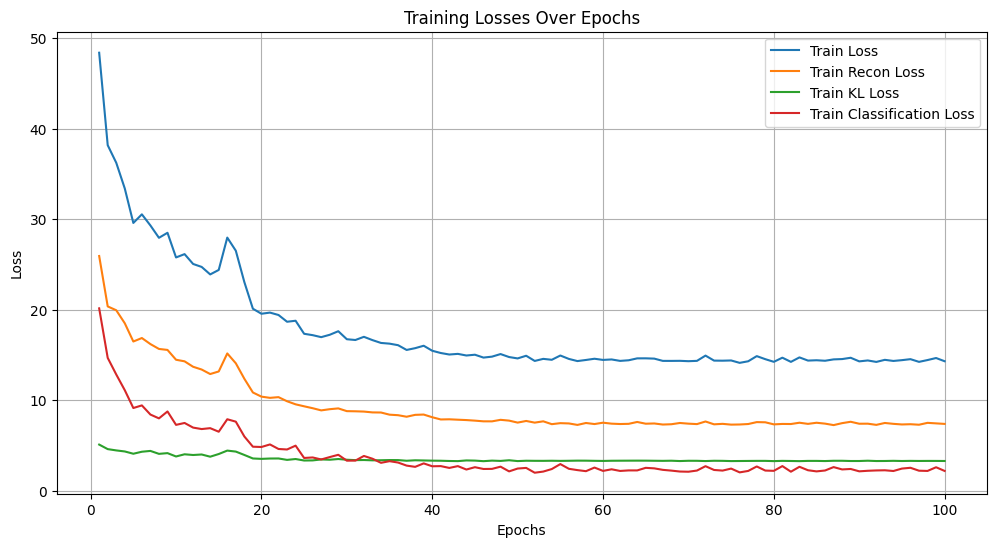

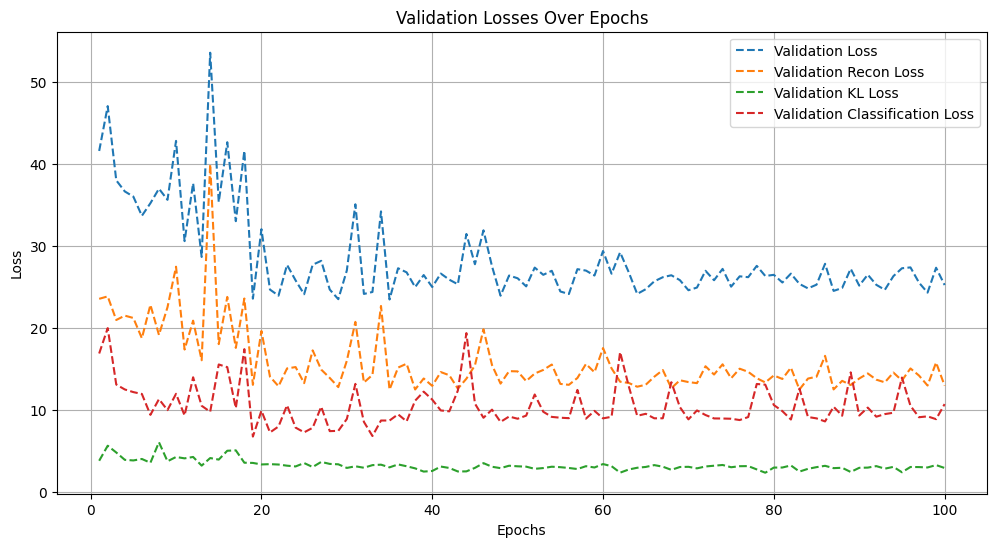

In [58]:
train_tensor = torch.tensor(train_data, dtype=torch.float32)
val_tensor = torch.tensor(val_data, dtype=torch.float32)
train_labels_tensor = torch.tensor(train_labels.values, dtype=torch.long)
val_labels_tensor = torch.tensor(val_labels.values, dtype=torch.long)

train_dataset = TensorDataset(train_tensor, train_labels_tensor)
val_dataset = TensorDataset(val_tensor, val_labels_tensor)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

best_model = SupervisedVAE(
    input_dim, 
    best_params["hidden_dim"], 
    best_params["latent_dim"], 
    best_params["dropout_rate"], 
    activation=get_activation_function(best_params["activation"])
).to(device)

optimizer = torch.optim.Adam(best_model.parameters(), lr=1e-3)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=4)


# # Train the model
# for epoch in range(1, num_epochs + 1):
#     # avg_loss, avg_recon, avg_kl, avg_class, accuracy
#     train_loss, train_recon_loss, train_kl_loss, train_class_loss, train_accuracy = train_supervised(best_model, optimizer, scheduler, epoch, beta, gamma, best_params["class_weight"])
    
#     val_loss, val_recon_loss, val_kl_loss, val_class_loss, val_accuracy = validate_supervised(best_model, optimizer, scheduler, epoch, beta, gamma, best_params["class_weight"])
#     scheduler.step(val_loss)
    
#     # Early stopping
#     if early_stopping([val_loss], stop_patience):
#         print(f"Early stopping triggered at epoch {epoch}")
#         break

import matplotlib.pyplot as plt

# Initialize lists to store loss values
epochs_list = []
train_losses, val_losses = [], []
train_recon_losses, val_recon_losses = [], []
train_kl_losses, val_kl_losses = [], []
train_class_losses, val_class_losses = [], []

# Train the model
for epoch in range(1, num_epochs + 1):
    # avg_loss, avg_recon, avg_kl, avg_class, accuracy
    train_loss, train_recon_loss, train_kl_loss, train_class_loss, train_accuracy = train_supervised(
        best_model, optimizer, scheduler, epoch, beta, gamma, best_params["class_weight"], best_params["classification_multiplier"]
    )
    
    val_loss, val_recon_loss, val_kl_loss, val_class_loss, val_accuracy = validate_supervised(
        best_model, optimizer, scheduler, epoch, beta, gamma, best_params["class_weight"], best_params["classification_multiplier"]
    )
    scheduler.step(val_loss)
    
    # Store values for visualization
    epochs_list.append(epoch)
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_recon_losses.append(train_recon_loss)
    val_recon_losses.append(val_recon_loss)
    train_kl_losses.append(train_kl_loss)
    val_kl_losses.append(val_kl_loss)
    train_class_losses.append(train_class_loss)
    val_class_losses.append(val_class_loss)
    
    # Early stopping
    if early_stopping([val_loss], stop_patience):
        print(f"Early stopping triggered at epoch {epoch}")
        break

# Plot training losses
plt.figure(figsize=(12, 6))
plt.plot(epochs_list, train_losses, label='Train Loss', linestyle='-')
plt.plot(epochs_list, train_recon_losses, label='Train Recon Loss', linestyle='-')
plt.plot(epochs_list, train_kl_losses, label='Train KL Loss', linestyle='-')
plt.plot(epochs_list, train_class_losses, label='Train Classification Loss', linestyle='-')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Losses Over Epochs')
plt.legend()
plt.grid()
plt.show()



# Plot validation losses
plt.figure(figsize=(12, 6))
plt.plot(epochs_list, val_losses, label='Validation Loss', linestyle='--')
plt.plot(epochs_list, val_recon_losses, label='Validation Recon Loss', linestyle='--')
plt.plot(epochs_list, val_kl_losses, label='Validation KL Loss', linestyle='--')
plt.plot(epochs_list, val_class_losses, label='Validation Classification Loss', linestyle='--')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Validation Losses Over Epochs')
plt.legend()
plt.grid()
plt.show()



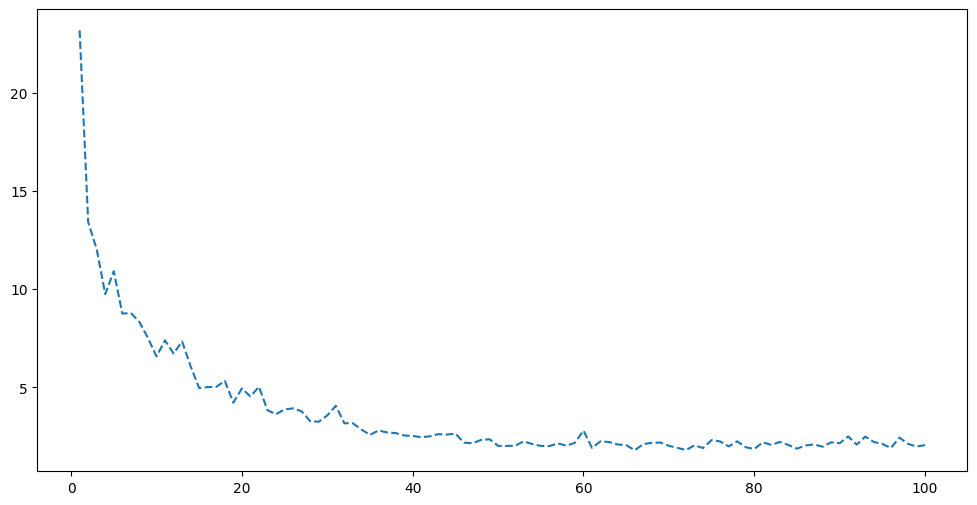

In [55]:
plt.figure(figsize=(12, 6))
plt.plot(epochs_list, train_class_losses, label='Validation Loss', linestyle='--')

In [51]:
best_params['gamma']

0.6997083514952235

In [59]:
result = evaluate_classifier_full(best_model, val_loader, device)

result[2]

array([[ 136,   14],
       [   8, 1575]])

In [30]:
def cross_val_performance(data, labels, best_params, num_epochs=50, n_folds=5, batch_size=64):
    """
    Given data (numpy array) and labels (pandas Series), train the model using n-fold CV
    and return the average validation accuracy.
    """
    skf = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
    fold_accuracies = []
    
    # Loop over each fold
    for fold, (train_idx, val_idx) in enumerate(skf.split(data, labels)):
        # Split the data
        train_data = data[train_idx]
        val_data = data[val_idx]
        train_labels = labels.iloc[train_idx]
        val_labels = labels.iloc[val_idx]
        
        # Convert to tensors and create DataLoaders
        train_tensor = torch.tensor(train_data, dtype=torch.float32)
        val_tensor = torch.tensor(val_data, dtype=torch.float32)
        train_labels_tensor = torch.tensor(train_labels.values, dtype=torch.long)
        val_labels_tensor = torch.tensor(val_labels.values, dtype=torch.long)
        
        train_dataset = TensorDataset(train_tensor, train_labels_tensor)
        val_dataset = TensorDataset(val_tensor, val_labels_tensor)
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
        
        # Update the input dimension based on the current data shape
        input_dim = train_data.shape[1]
        
        # Initialize the model using the best hyperparameters
        model = SupervisedVAE(
            input_dim=input_dim,
            hidden_dim=best_params["hidden_dim"],
            latent_dim=best_params["latent_dim"],
            dropout_rate=best_params["dropout_rate"],
            activation=get_activation_function(best_params["activation"])
        ).to(device)
        
        optimizer = torch.optim.Adam(model.parameters(), lr=best_params["lr"])
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=best_params["scheduler_patience"])
        
        # Train the model for a set number of epochs
        for epoch in range(1, num_epochs + 1):
            model.train()
            for batch_data, batch_labels in train_loader:
                batch_data = batch_data.to(device)
                batch_labels = batch_labels.to(device)
                optimizer.zero_grad()
                recon_batch, mu, logvar, class_logits = model(batch_data)
                loss, _, _, _ = loss_function(
                    recon_batch, batch_data, mu, logvar, class_logits, batch_labels,
                    best_params["beta"], best_params["gamma"],
                    best_params["class_weight"], best_params["classification_multiplier"]
                )
                loss.backward()
                optimizer.step()
            # Optionally update scheduler on the validation loss at each epoch
            model.eval()
            val_loss = 0
            total_correct = 0
            total_samples = 0
            with torch.no_grad():
                for batch_data, batch_labels in val_loader:
                    batch_data = batch_data.to(device)
                    batch_labels = batch_labels.to(device)
                    recon_batch, mu, logvar, class_logits = model(batch_data)
                    loss, _, _, _ = loss_function(
                        recon_batch, batch_data, mu, logvar, class_logits, batch_labels,
                        best_params["beta"], best_params["gamma"],
                        best_params["class_weight"], best_params["classification_multiplier"]
                    )
                    val_loss += loss.item()
                    # Get predictions and count correct predictions
                    preds = (class_logits > 0.5).float().squeeze()
                    total_correct += (preds == batch_labels).sum().item()
                    total_samples += batch_labels.size(0)
            # Use the validation loss to step the scheduler (optional)
            scheduler.step(val_loss)
            # For simplicity, we take the last epoch’s accuracy as the fold's accuracy
            fold_accuracy = total_correct / total_samples
        fold_accuracies.append(fold_accuracy)
    return np.mean(fold_accuracies)


def feature_ablation_analysis(features, frb_data_clean, labels, best_params, num_epochs=50, n_folds=5, batch_size=64):
    """
    For each feature in the list, remove it from the dataset, retrain the model using cross-validation,
    and record the change in validation accuracy.
    """
    ablation_results = {}
    
    # Baseline: performance using all features
    baseline_df = frb_data_clean[features].fillna(0)
    scaler = StandardScaler()
    full_data_scaled = scaler.fit_transform(baseline_df)
    baseline_acc = cross_val_performance(full_data_scaled, labels, best_params, num_epochs, n_folds, batch_size)
    print("Baseline accuracy with all features: {:.4f}".format(baseline_acc))
    
    # Loop over each feature and remove it
    for feature in features:
        reduced_features = [f for f in features if f != feature]
        print(f"\nEvaluating without feature: {feature}")
        df_reduced = frb_data_clean[reduced_features].fillna(0)
        scaler = StandardScaler()
        reduced_data_scaled = scaler.fit_transform(df_reduced)
        
        acc = cross_val_performance(reduced_data_scaled, labels, best_params, num_epochs, n_folds, batch_size)
        drop = baseline_acc - acc
        ablation_results[feature] = {"accuracy": acc, "drop_in_accuracy": drop}
        print(f"Accuracy without {feature}: {acc:.4f} (drop: {drop:.4f})")
    
    return baseline_acc, ablation_results


baseline_acc, ablation_results = feature_ablation_analysis(features, frb_data_clean, labels, best_params, num_epochs=50, n_folds=5, batch_size=64)

print("\n=== Feature Ablation Results ===")
for feature, result in ablation_results.items():
    print(f"{feature}: Accuracy = {result['accuracy']:.4f}, Drop = {result['drop_in_accuracy']:.4f}")


baseline_acc, ablation_results = feature_ablation_analysis(features, frb_data_clean, labels, best_params, num_epochs=50, n_folds=5, batch_size=64)

print("\n=== Feature Ablation Results ===")
for feature, result in ablation_results.items():
    print(f"{feature}: Accuracy = {result['accuracy']:.4f}, Drop = {result['drop_in_accuracy']:.4f}")

Baseline accuracy with all features: 0.9878

Evaluating without feature: Observing_band
Accuracy without Observing_band: 0.9825 (drop: 0.0053)

Evaluating without feature: SNR
Accuracy without SNR: 0.9830 (drop: 0.0047)

Evaluating without feature: Freq_high
Accuracy without Freq_high: 0.9855 (drop: 0.0023)

Evaluating without feature: Freq_low
Accuracy without Freq_low: 0.9850 (drop: 0.0028)

Evaluating without feature: Freq_peak
Accuracy without Freq_peak: 0.9807 (drop: 0.0070)

Evaluating without feature: Width
Accuracy without Width: 0.9793 (drop: 0.0084)

Evaluating without feature: DM_SNR
Accuracy without DM_SNR: 0.9840 (drop: 0.0038)

Evaluating without feature: DM_alig
Accuracy without DM_alig: 0.9886 (drop: -0.0008)

Evaluating without feature: Flux_density
Accuracy without Flux_density: 0.9878 (drop: 0.0000)

Evaluating without feature: Fluence
Accuracy without Fluence: 0.9860 (drop: 0.0017)

Evaluating without feature: Energy
Accuracy without Energy: 0.9870 (drop: 0.0008)

E

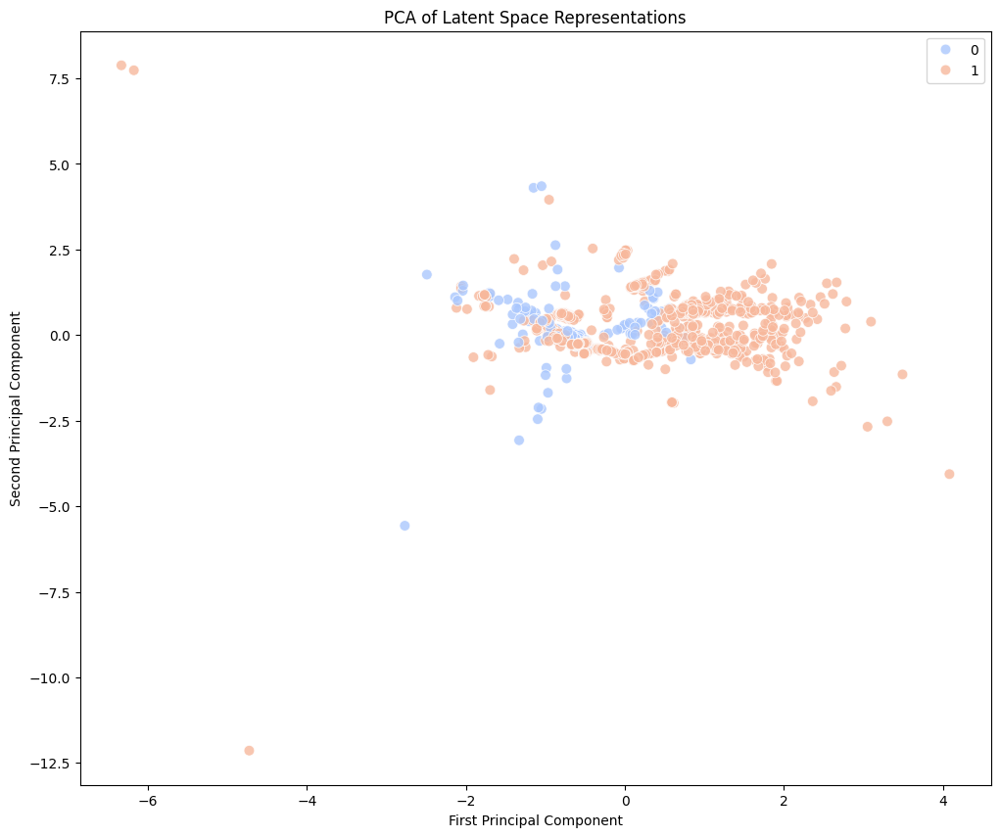

(150,)


In [60]:
def get_latent_representations(model, dataloader, device):
    model.eval()
    latent_representations = []
    all_labels = []
    with torch.no_grad():
        for data, labels in dataloader:
            data = data.to(device)
            mu, _ = model.encode(data)
            latent_representations.append(mu.cpu().numpy())
            all_labels.append(labels.numpy())
    return np.concatenate(latent_representations), np.concatenate(all_labels)


def visualize_latent_space_pca(latent_representations, labels, model, device, title='PCA of Latent Space Representations'):
    # Perform PCA
    pca = PCA(n_components=2)
    latent_2d = pca.fit_transform(latent_representations)

    # Plot the 2D latent space
    plt.figure(figsize=(12, 10))
    #scatter = plt.scatter(latent_2d[:, 0], latent_2d[:, 1], c=labels, cmap='plasma', s=10)
    sns.scatterplot(x=latent_2d[:, 0], y=latent_2d[:, 1], hue=labels, palette='coolwarm', s=60, alpha=0.8)
    plt.title(title)
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    plt.show()

train_latent, train_labels_np = get_latent_representations(best_model, train_loader, device)
val_latent, val_labels_np = get_latent_representations(best_model, val_loader, device)
visualize_latent_space_pca(val_latent, val_labels_np, best_model, device)

print(val_labels_np[val_labels_np == 0].shape)

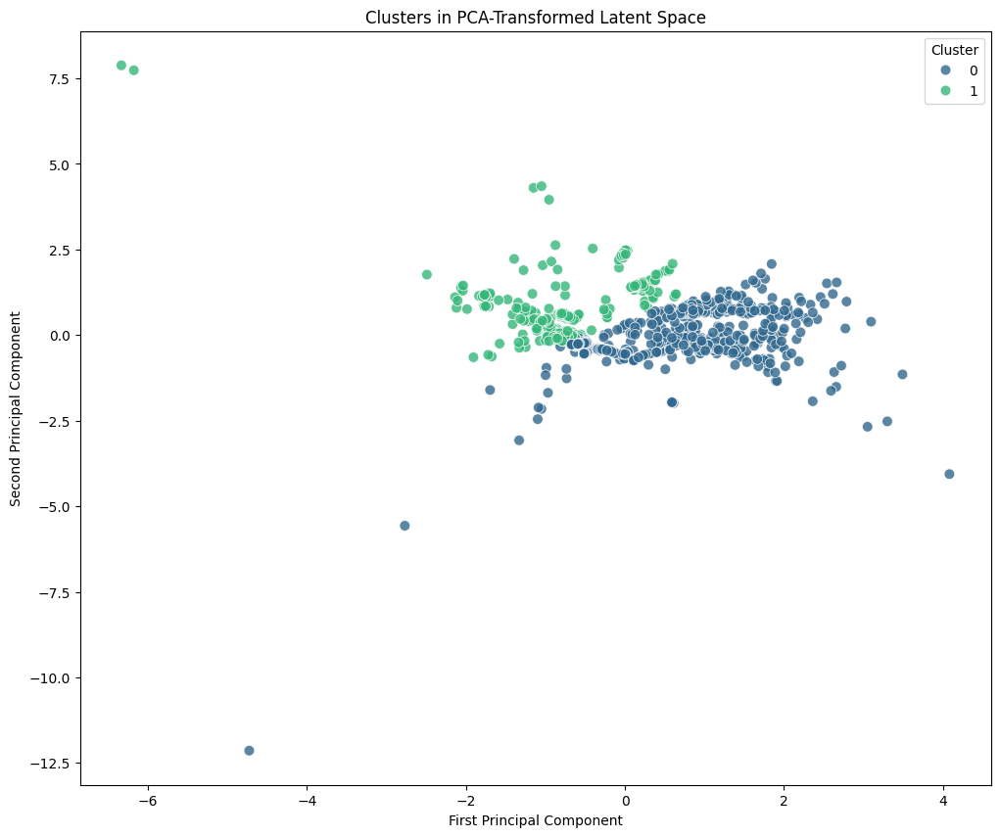

Silhouette Score: 0.3364785611629486
Adjusted Rand Index (ARI): 0.15490517658158487


In [61]:
def cluster_and_visualize(latent_representations, labels, title='Clusters in PCA-Transformed Latent Space'):
    pca = PCA(n_components=2)
    latent_2d = pca.fit_transform(latent_representations)

    n_clusters = len(np.unique(labels))
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(latent_2d)
    
    plt.figure(figsize=(12, 10))
    sns.scatterplot(x=latent_2d[:, 0], y=latent_2d[:, 1], hue=cluster_labels, palette='viridis', s=60, alpha=0.8)
    plt.title(title)
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    plt.legend(title="Cluster")
    plt.show()

    silhouette = silhouette_score(latent_2d, cluster_labels)
    print(f"Silhouette Score: {silhouette}")

    ari = adjusted_rand_score(labels, cluster_labels)
    print(f"Adjusted Rand Index (ARI): {ari}")

cluster_and_visualize(val_latent, val_labels_np)

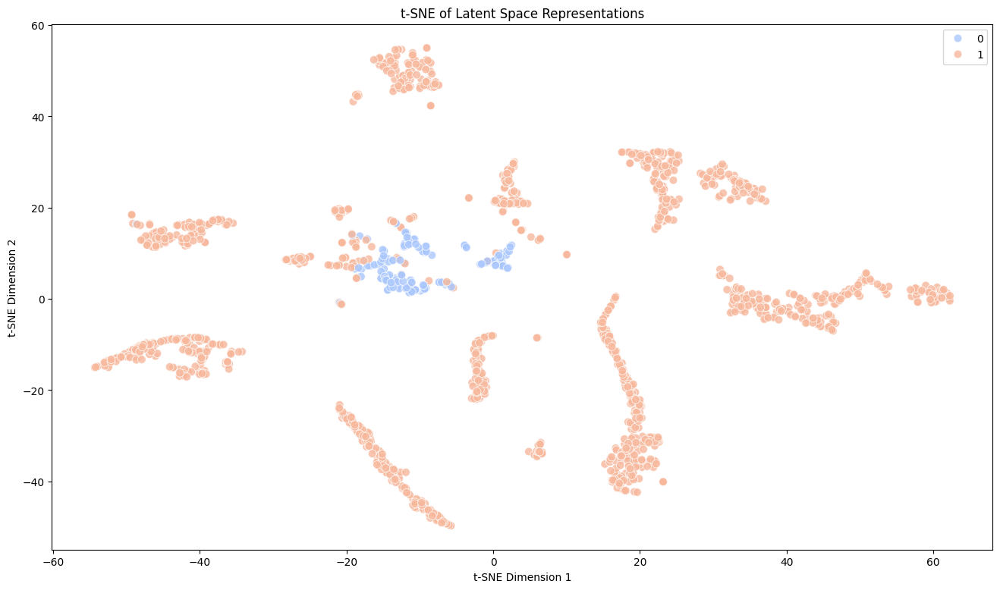

In [62]:
def visualize_latent_space_tsne(latent_representations, labels, title='t-SNE of Latent Space Representations', palette='tab20'):
    tsne = TSNE(n_components=2, random_state=42)
    latent_2d = tsne.fit_transform(latent_representations)

    
    plt.figure(figsize=(16, 9))
    sns.scatterplot(x=latent_2d[:, 0], y=latent_2d[:, 1], hue=labels, palette=palette, s=60, alpha=0.8)
    plt.title(title)
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.savefig(f'{title}.png'.replace(' ', '_'), dpi=500)

    plt.show()

visualize_latent_space_tsne(val_latent, val_labels_np, palette='coolwarm')

/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


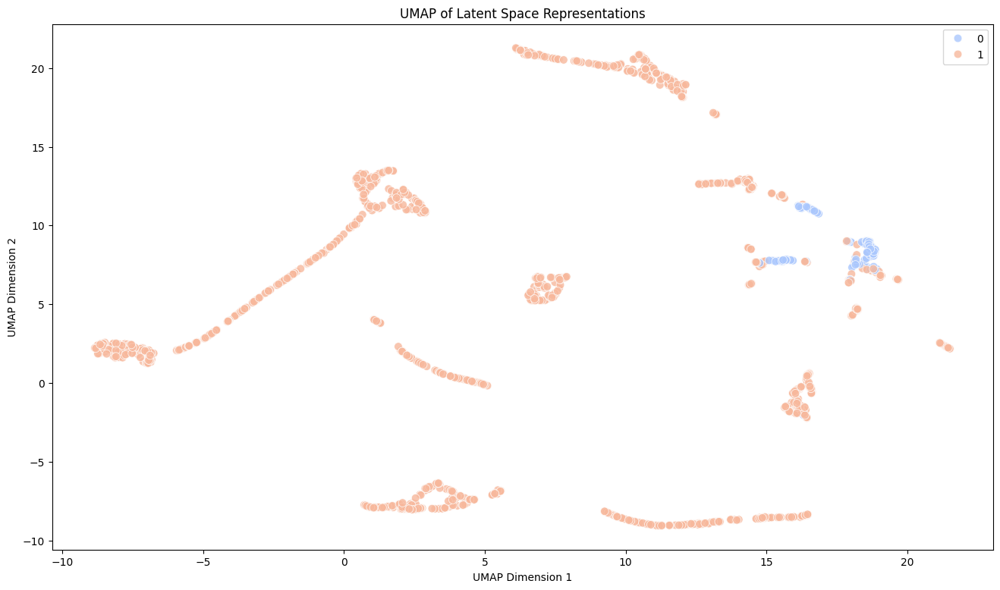

In [63]:
import umap

def visualize_latent_space_umap(latent_representations, labels, title="UMAP of Latent Space Representations", palette='tab20'):
    reducer = umap.UMAP(n_components=2, random_state=42)
    latent_2d = reducer.fit_transform(latent_representations)
        
    plt.figure(figsize=(16, 9))
    sns.scatterplot(x=latent_2d[:, 0], y=latent_2d[:, 1], hue=labels, palette=palette, s=60, alpha=0.8)
    plt.title(title)
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.savefig(f'{title}.png'.replace(' ', '_'), dpi=500)
    plt.show()

visualize_latent_space_umap(val_latent, val_labels_np, palette='coolwarm')

/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/manifold/_isomap.py:383: UserWarning: The number of connected components of the neighbors graph is 4 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])
/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr

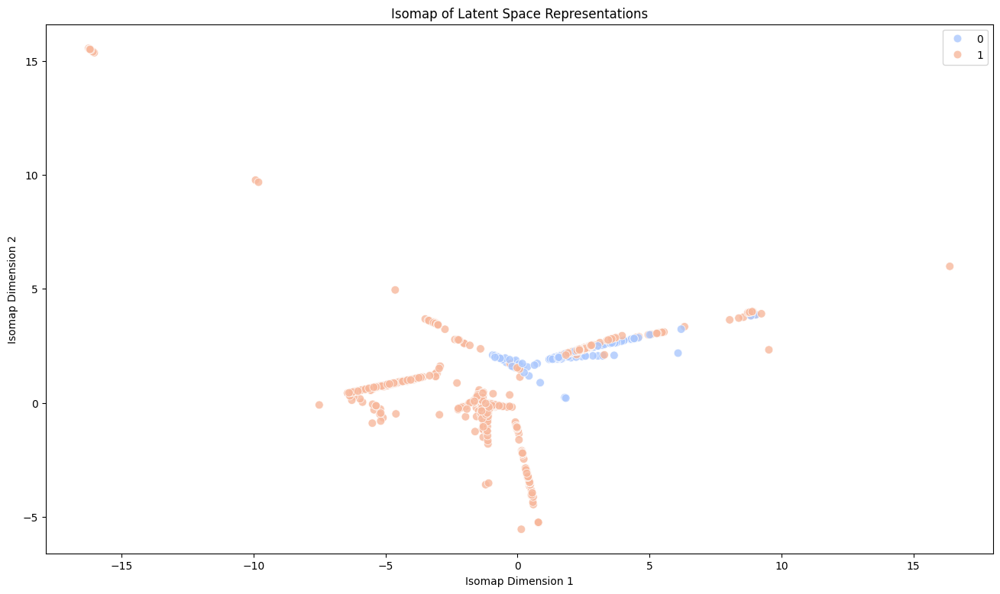

In [64]:
from sklearn.manifold import Isomap

def visualize_latent_space_isomap(latent_representations, labels, title="Isomap of Latent Space Representations"):
    isomap = Isomap(n_components=2)
    latent_2d = isomap.fit_transform(latent_representations)
    
    plt.figure(figsize=(16, 9))
    sns.scatterplot(x=latent_2d[:, 0], y=latent_2d[:, 1], hue=labels, palette='coolwarm', s=60, alpha=0.8)
    plt.title(title)
    plt.xlabel('Isomap Dimension 1')
    plt.ylabel('Isomap Dimension 2')
    plt.show()

visualize_latent_space_isomap(val_latent, val_labels_np)

In [65]:
from sklearn.metrics import mutual_info_score

def mutual_information(latent_representations, labels):
    mi = mutual_info_score(labels, np.argmax(latent_representations, axis=1))
    print(f"Mutual Information between Latent Variables and Labels: {mi}")

mutual_information(val_latent, val_labels_np)

Mutual Information between Latent Variables and Labels: 0.2022571714389898


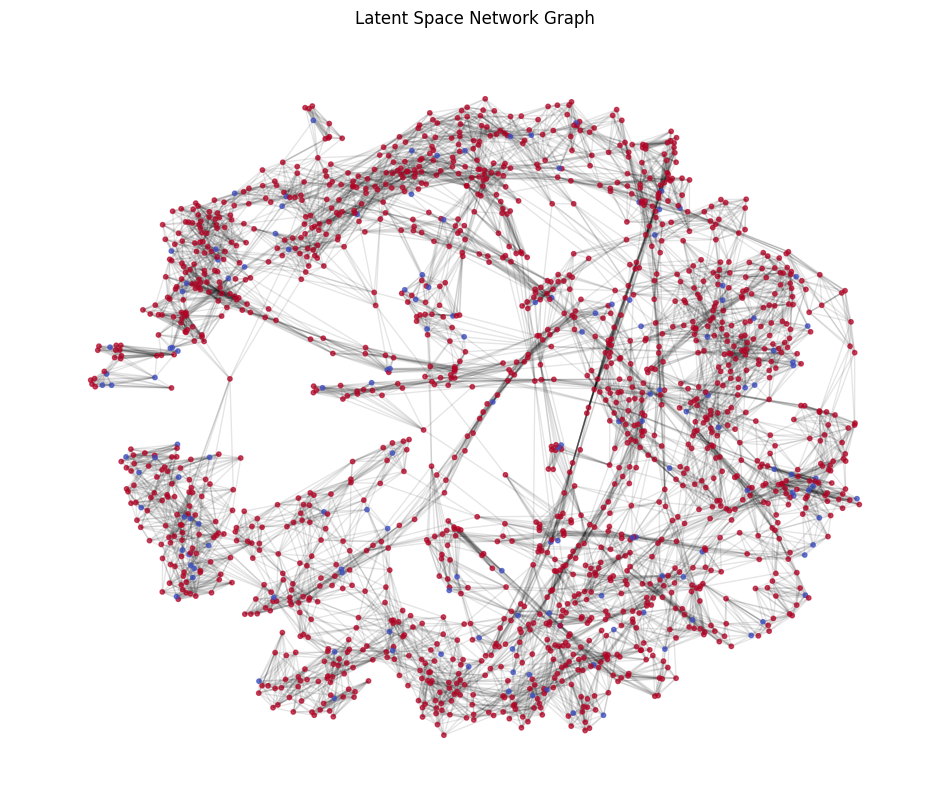

In [66]:
import networkx as nx
from sklearn.neighbors import NearestNeighbors

def network_analysis(latent_representations, labels, n_neighbors=10):
    nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree').fit(latent_representations)
    distances, indices = nbrs.kneighbors(latent_representations)
    
    G = nx.Graph()
    for i in range(len(latent_representations)):
        for j in indices[i]:
            if i != j:
                G.add_edge(i, j)
    
    plt.figure(figsize=(12, 10))
    pos = nx.spring_layout(G, k=0.1)
    nx.draw_networkx_nodes(G, pos, node_size=10, node_color=labels, cmap='coolwarm', alpha=0.7)
    nx.draw_networkx_edges(G, pos, alpha=0.1)
    plt.title('Latent Space Network Graph')
    plt.axis('off')
    plt.show()

network_analysis(val_latent, val_labels_np)

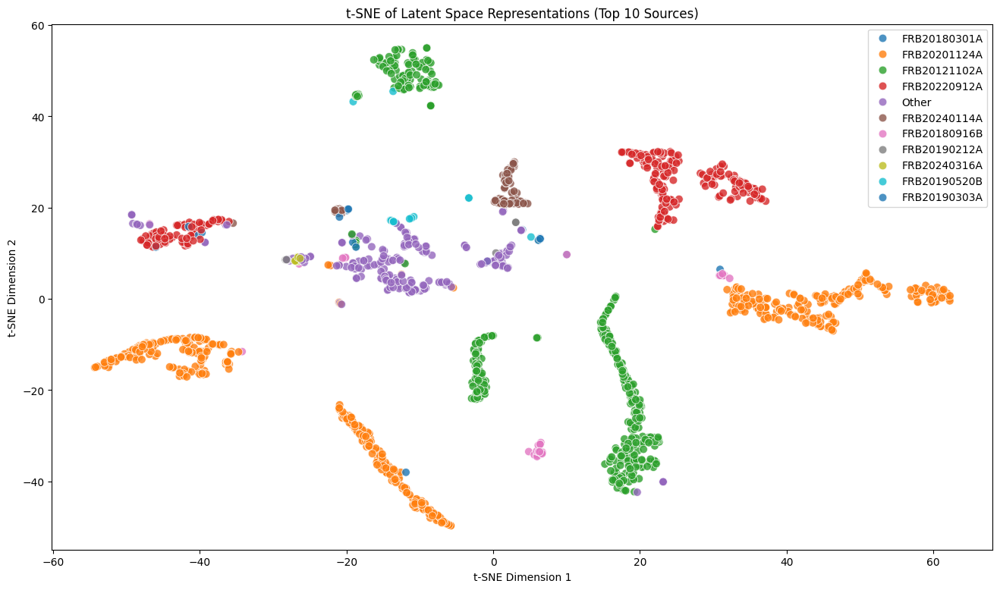

In [67]:
visualize_latent_space_tsne(val_latent, get_source_data_val_freq(10), title='t-SNE of Latent Space Representations (Top 10 Sources)', palette='tab10')

/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


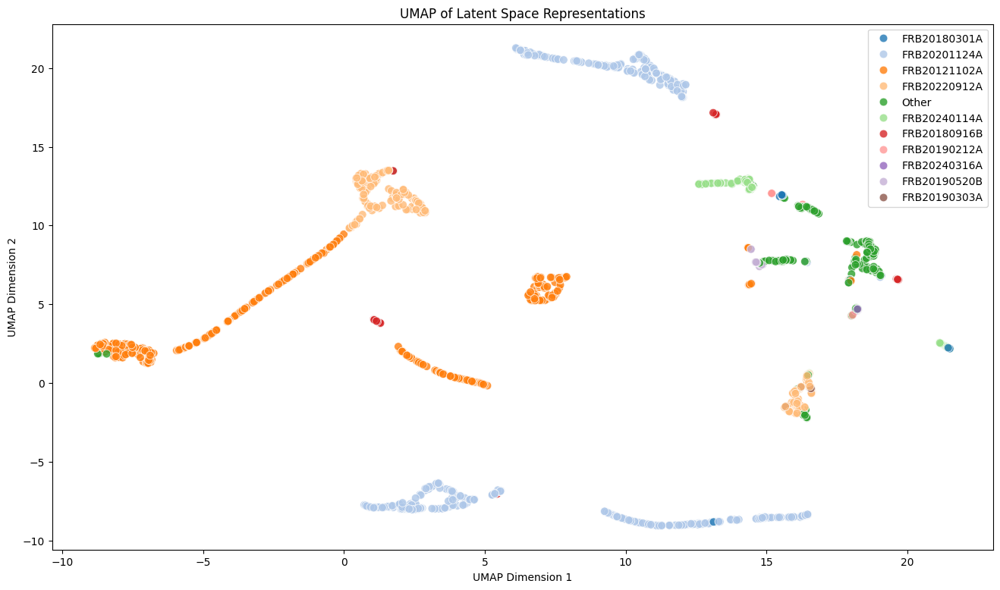

In [68]:
visualize_latent_space_umap(val_latent, get_source_data_val_freq(10))

In [69]:
def visualize_latent_space_tsne_interactive(latent_representations, labels):
    tsne = TSNE(n_components=2, random_state=42)
    latent_2d = tsne.fit_transform(latent_representations)

    tsne_df = pd.DataFrame({
        'TSNE-1': latent_2d[:, 0],
        'TSNE-2': latent_2d[:, 1],
        'Label': labels
    })

    fig = px.scatter(
        tsne_df, 
        x='TSNE-1', 
        y='TSNE-2', 
        color='Label', 
        hover_data=['Label'], 
        title='Interactive t-SNE of Latent Space Representations',
        width=800,
        height=800
    )

    fig.show()

visualize_latent_space_tsne_interactive(val_latent, get_source_data_val_freq(10))

In [70]:
# Step 1: Identify the 5 most frequent repeaters
repeater_counts = frb_data[frb_data['Repeater'] == 1]['Source'].value_counts()
top_5_repeaters = repeater_counts.head(5).index.tolist()

# Step 2: Filter the dataset to exclude these repeaters
filtered_indices = frb_data[~frb_data['Source'].isin(top_5_repeaters)].index
filtered_data_clean = frb_data_clean.loc[filtered_indices]
filtered_labels = labels.loc[filtered_indices]

# Step 3: Standardize the filtered dataset
scaler = StandardScaler()
filtered_data_scaled = scaler.fit_transform(filtered_data_clean)

# Step 4: Split the filtered dataset into train and validation sets
train_data_filtered, val_data_filtered, train_labels_filtered, val_labels_filtered = train_test_split(
    filtered_data_scaled, filtered_labels, test_size=0.2, random_state=42, stratify=filtered_labels
)

# Step 5: Convert to PyTorch tensors
train_tensor_filtered = torch.tensor(train_data_filtered, dtype=torch.float32)
val_tensor_filtered = torch.tensor(val_data_filtered, dtype=torch.float32)
train_labels_tensor_filtered = torch.tensor(train_labels_filtered.values, dtype=torch.long)
val_labels_tensor_filtered = torch.tensor(val_labels_filtered.values, dtype=torch.long)

# Step 6: Create datasets and dataloaders
batch_size = 64
train_dataset_filtered = TensorDataset(train_tensor_filtered, train_labels_tensor_filtered)
val_dataset_filtered = TensorDataset(val_tensor_filtered, val_labels_tensor_filtered)

train_loader_filtered = DataLoader(train_dataset_filtered, batch_size=batch_size, shuffle=True)
val_loader_filtered = DataLoader(val_dataset_filtered, batch_size=batch_size, shuffle=False)

def train_supervised_filtered(model, optimizer, scheduler, epoch, beta, gamma, class_weight, classification_multiplier):
    model.train()
    train_loss = 0
    recon_loss_total = 0
    kl_loss_total = 0
    classification_loss_total = 0
    
    correct = 0
    total = 0
    
    for batch_idx, (data, labels) in enumerate(train_loader_filtered):
        data, labels = data.to(device), labels.to(device)
        optimizer.zero_grad()
        recon_batch, mu, logvar, class_logits = model(data)
        
        # Supervised loss function
        loss, recon_loss, kl_loss, classification_loss = loss_function(
            recon_batch, data, mu, logvar, class_logits, labels, beta, gamma, class_weight, classification_multiplier
        )
        
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        recon_loss_total += recon_loss.item()
        kl_loss_total += kl_loss.item()
        classification_loss_total += classification_loss.item()
        
        predicted = (class_logits > 0.5).float()
        total += labels.size(0)
        correct += (predicted.squeeze() == labels).sum().item()
        
        # if batch_idx % 100 == 0:
            # print(classification_loss)
            # print(f'Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)} '
            #       f'({100. * batch_idx / len(train_loader):.0f}%)]\tLoss: {loss.item() / len(data):.6f}')
    
    # Calculate average loss and accuracy for the epoch
    avg_loss = train_loss / len(train_loader.dataset)
    avg_recon = recon_loss_total / len(train_loader.dataset)
    avg_kl = kl_loss_total / len(train_loader.dataset)
    avg_class = classification_loss_total / len(train_loader.dataset)
    accuracy = correct / total
    
    # print(f'====> Epoch: {epoch} Average loss: {avg_loss:.4f}, Recon: {avg_recon:.4f}, KL: {avg_kl:.4f}, '
    #       f'Class: {avg_class:.4f}, Accuracy: {accuracy:.4f}')
    return avg_loss, avg_recon, avg_kl, avg_class, accuracy

def validate_supervised_filtered(model, scheduler, optimizer, epoch, beta, gamma, class_weight, classification_multiplier):
    model.eval()
    val_loss = 0
    recon_loss_total = 0
    kl_loss_total = 0
    classification_loss_total = 0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for data, labels in val_loader_filtered:
            data, labels = data.to(device), labels.to(device)
            recon_batch, mu, logvar, class_logits = model(data)
            
            loss, recon_loss, kl_loss, classification_loss = loss_function(
                recon_batch, data, mu, logvar, class_logits, labels, beta, gamma, class_weight, classification_multiplier
            )
            
            val_loss += loss.item()
            recon_loss_total += recon_loss.item()
            kl_loss_total += kl_loss.item()
            classification_loss_total += classification_loss.item()
            
            predicted = (class_logits > 0.5).float()
            total += labels.size(0)
            correct += (predicted.squeeze() == labels).sum().item()
    
    avg_loss = val_loss / len(val_loader.dataset)
    avg_recon = recon_loss_total / len(val_loader.dataset)
    avg_kl = kl_loss_total / len(val_loader.dataset)
    avg_class = classification_loss_total / len(val_loader.dataset)
    accuracy = correct / total
    
    # print(f'====> Validation loss: {avg_loss:.4f}, Recon: {avg_recon:.4f}, KL: {avg_kl:.4f}, '
    #       f'Class: {avg_class:.4f}, Accuracy: {accuracy:.4f}')
    return avg_loss, avg_recon, avg_kl, avg_class, accuracy


def early_stopping(val_losses, patience):
    if len(val_losses) > patience:
        if all(val_losses[-i-1] <= val_losses[-i] for i in range(1, patience+1)):
            return True
    return False


In [73]:


# Step 7: Train the model with the filtered dataset
best_model = SupervisedVAE(
    input_dim, 
    best_params["hidden_dim"], 
    best_params["latent_dim"], 
    best_params["dropout_rate"], 
    activation=get_activation_function(best_params["activation"])
).to(device)

optimizer = torch.optim.Adam(best_model.parameters(), lr=best_params["lr"])
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=best_params["scheduler_patience"])

num_epochs = 100
for epoch in range(1, num_epochs + 1):
    train_loss, _, _, _, train_accuracy = train_supervised_filtered(
        best_model, optimizer, scheduler, epoch, best_params["beta"], 
        best_params["gamma"], best_params["class_weight"], best_params["classification_multiplier"]
    )
    
    val_loss, _, _, _, val_accuracy = validate_supervised_filtered(
        best_model, optimizer, scheduler, epoch, best_params["beta"], 
        best_params["gamma"], best_params["class_weight"], best_params["classification_multiplier"]
    )
    scheduler.step(val_loss)
    
    if early_stopping([val_loss], stop_patience):
        print(f"Early stopping triggered at epoch {epoch}")
        break

# Evaluate the model after training
val_accuracy, val_class_report, val_conf_matrix, val_preds, val_labels = evaluate_classifier_full(best_model, val_loader_filtered, device)

print("\n=== Final Evaluation ===")
print(f"Validation Accuracy: {val_accuracy:.4f}")
print("Classification Report:\n", val_class_report)
print("Confusion Matrix:\n", val_conf_matrix)


=== Final Evaluation ===
Validation Accuracy: 0.9008
Classification Report:
               precision    recall  f1-score   support

Non-Repeater       0.90      0.94      0.92       150
    Repeater       0.92      0.88      0.90       124

    accuracy                           0.91       274
   macro avg       0.91      0.91      0.91       274
weighted avg       0.91      0.91      0.91       274

Confusion Matrix:
 [[141   9]
 [ 15 109]]



=== PCA Visualization ===


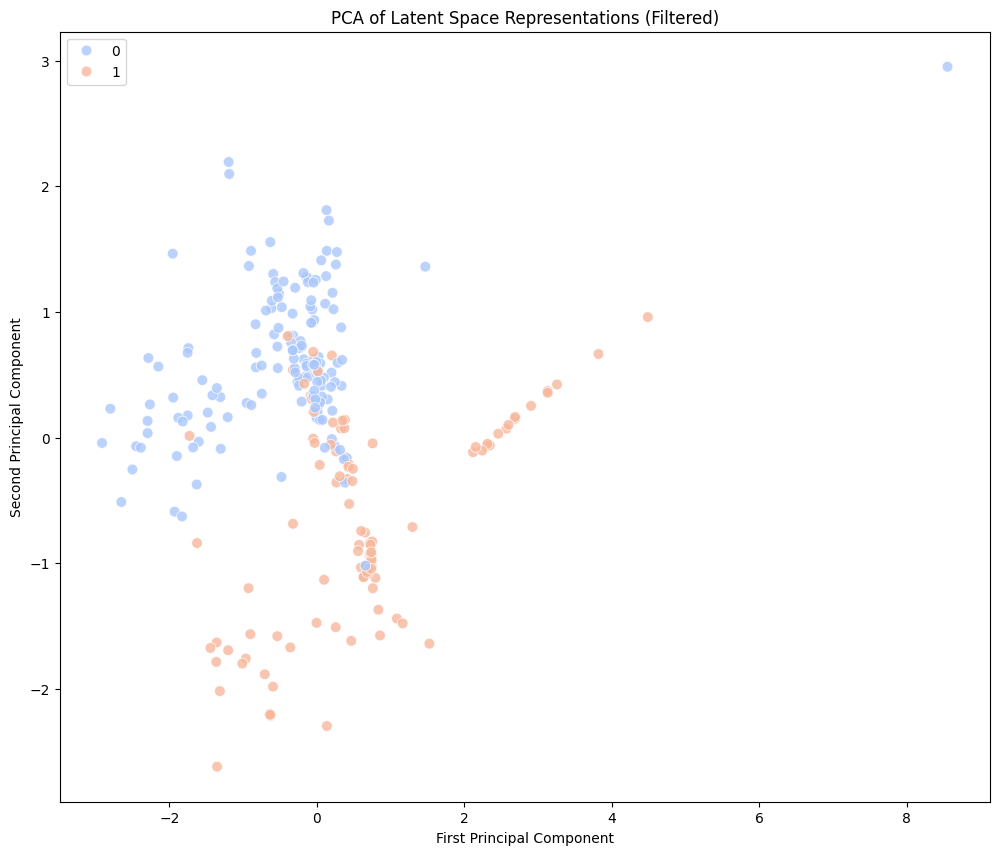


=== Clustering Analysis in Latent Space ===


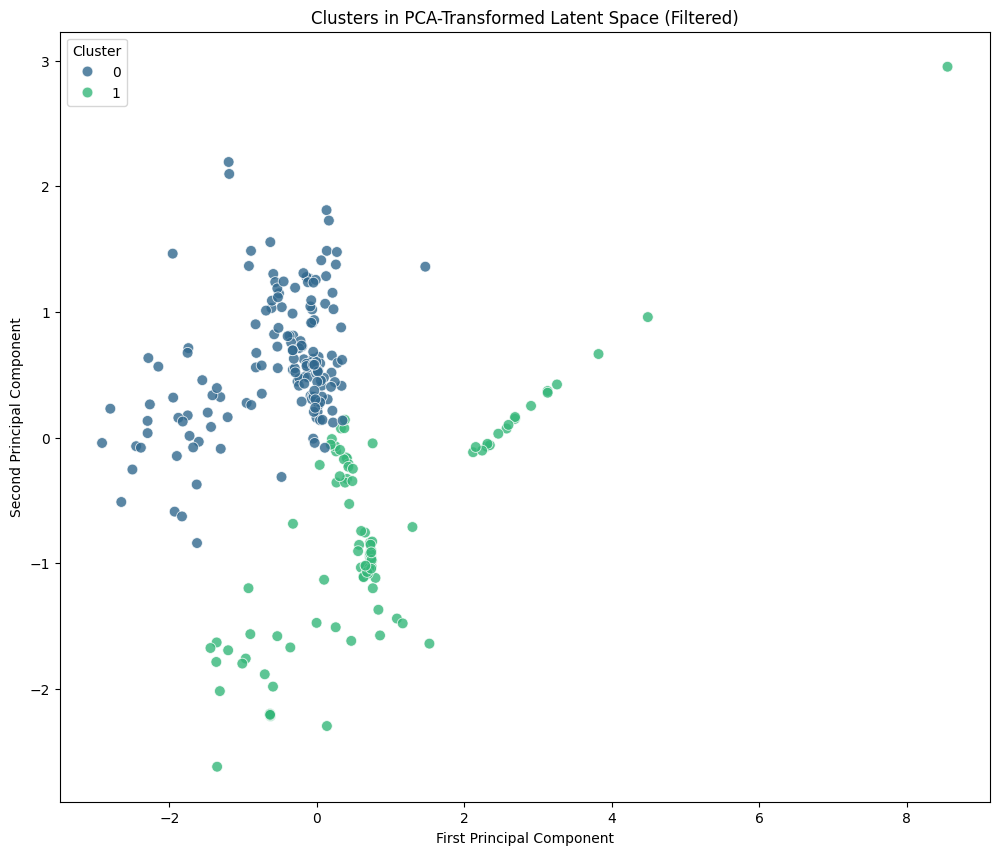

Silhouette Score: 0.43627867102622986
Adjusted Rand Index (ARI): 0.6791186135329668

=== t-SNE Visualization ===


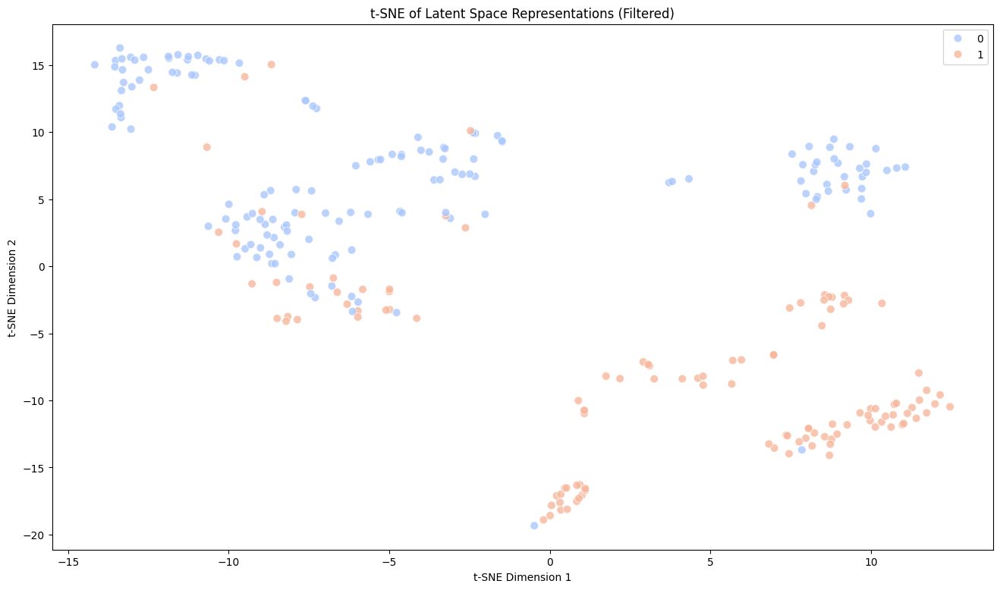


=== UMAP Visualization ===


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



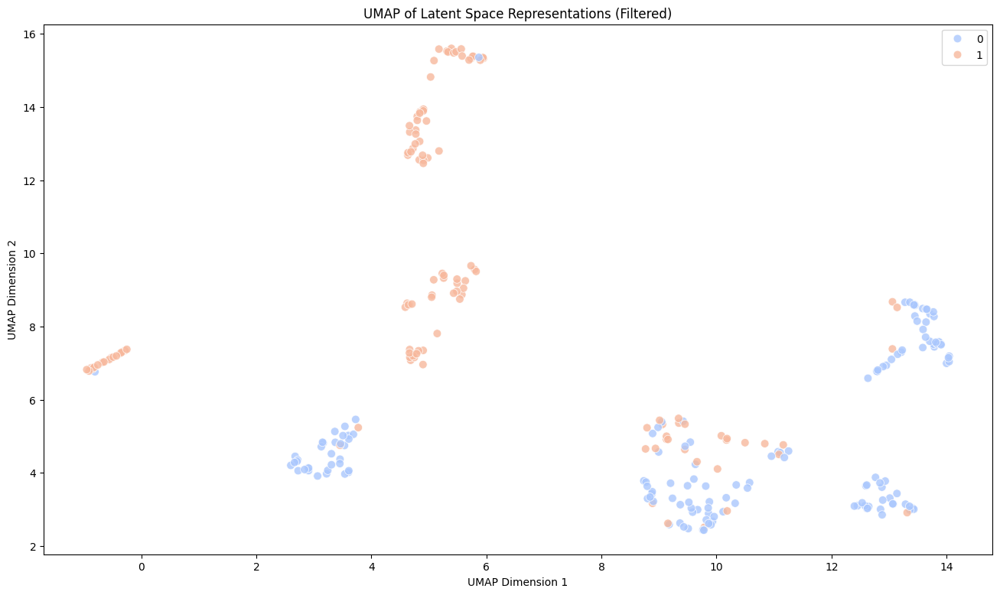


=== Isomap Visualization ===


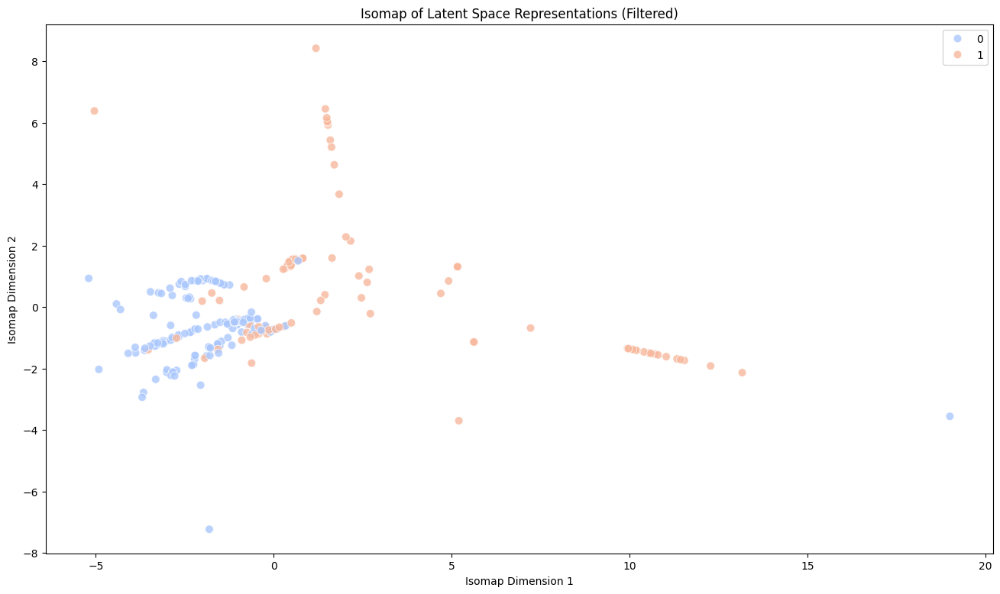

In [74]:
# Step 1: Extract latent representations
train_latent, train_labels_np = get_latent_representations(best_model, train_loader_filtered, device)
val_latent, val_labels_np = get_latent_representations(best_model, val_loader_filtered, device)

# Step 2: Visualize the latent space using PCA
print("\n=== PCA Visualization ===")
visualize_latent_space_pca(val_latent, val_labels_np, best_model, device, title='PCA of Latent Space Representations (Filtered)')

# Step 3: Perform clustering analysis
print("\n=== Clustering Analysis in Latent Space ===")
cluster_and_visualize(val_latent, val_labels_np, title='Clusters in PCA-Transformed Latent Space (Filtered)')

# Step 4: Visualize the latent space using t-SNE
print("\n=== t-SNE Visualization ===")
visualize_latent_space_tsne(val_latent, val_labels_np, title='t-SNE of Latent Space Representations (Filtered)', palette='coolwarm')

# Step 5: Visualize the latent space using UMAP
print("\n=== UMAP Visualization ===")
visualize_latent_space_umap(val_latent, val_labels_np, title='UMAP of Latent Space Representations (Filtered)', palette='coolwarm')

# Step 6: Visualize the latent space using Isomap
print("\n=== Isomap Visualization ===")
visualize_latent_space_isomap(val_latent, val_labels_np, title='Isomap of Latent Space Representations (Filtered)')


In [75]:
# Step 1: Remove all repeaters from the dataset
non_repeater_indices = frb_data[frb_data['Repeater'] == 0].index
no_repeater_data_clean = frb_data_clean.loc[non_repeater_indices]
no_repeater_labels = labels.loc[non_repeater_indices]

# Step 2: Standardize the no_repeater dataset
scaler = StandardScaler()
no_repeater_data_scaled = scaler.fit_transform(no_repeater_data_clean)

# Step 3: Split the no_repeater dataset into train and validation sets
train_data_no_repeater, val_data_no_repeater, train_labels_no_repeater, val_labels_no_repeater = train_test_split(
    no_repeater_data_scaled, no_repeater_labels, test_size=0.2, random_state=42, stratify=no_repeater_labels
)

# Step 4: Convert to PyTorch tensors
train_tensor_no_repeater = torch.tensor(train_data_no_repeater, dtype=torch.float32)
val_tensor_no_repeater = torch.tensor(val_data_no_repeater, dtype=torch.float32)
train_labels_tensor_no_repeater = torch.tensor(train_labels_no_repeater.values, dtype=torch.long)
val_labels_tensor_no_repeater = torch.tensor(val_labels_no_repeater.values, dtype=torch.long)

# Step 5: Create datasets and dataloaders
batch_size = 64
train_dataset_no_repeater = TensorDataset(train_tensor_no_repeater, train_labels_tensor_no_repeater)
val_dataset_no_repeater = TensorDataset(val_tensor_no_repeater, val_labels_tensor_no_repeater)

train_loader_no_repeater = DataLoader(train_dataset_no_repeater, batch_size=batch_size, shuffle=True)
val_loader_no_repeater = DataLoader(val_dataset_no_repeater, batch_size=batch_size, shuffle=False)

def train_supervised_no_repeater(model, optimizer, scheduler, epoch, beta, gamma, class_weight, classification_multiplier):
    model.train()
    train_loss = 0
    recon_loss_total = 0
    kl_loss_total = 0
    classification_loss_total = 0
    
    correct = 0
    total = 0
    
    for batch_idx, (data, labels) in enumerate(train_loader_no_repeater):
        data, labels = data.to(device), labels.to(device)
        optimizer.zero_grad()
        recon_batch, mu, logvar, class_logits = model(data)
        
        # Supervised loss function
        loss, recon_loss, kl_loss, classification_loss = loss_function(
            recon_batch, data, mu, logvar, class_logits, labels, beta, gamma, class_weight, classification_multiplier
        )
        
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        recon_loss_total += recon_loss.item()
        kl_loss_total += kl_loss.item()
        classification_loss_total += classification_loss.item()
        
        predicted = (class_logits > 0.5).float()
        total += labels.size(0)
        correct += (predicted.squeeze() == labels).sum().item()
    
    avg_loss = train_loss / len(train_loader_no_repeater.dataset)
    avg_recon = recon_loss_total / len(train_loader_no_repeater.dataset)
    avg_kl = kl_loss_total / len(train_loader_no_repeater.dataset)
    avg_class = classification_loss_total / len(train_loader_no_repeater.dataset)
    accuracy = correct / total
    
    return avg_loss, avg_recon, avg_kl, avg_class, accuracy

def validate_supervised_no_repeater(model, scheduler, optimizer, epoch, beta, gamma, class_weight, classification_multiplier):
    model.eval()
    val_loss = 0
    recon_loss_total = 0
    kl_loss_total = 0
    classification_loss_total = 0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for data, labels in val_loader_no_repeater:
            data, labels = data.to(device), labels.to(device)
            recon_batch, mu, logvar, class_logits = model(data)
            
            loss, recon_loss, kl_loss, classification_loss = loss_function(
                recon_batch, data, mu, logvar, class_logits, labels, beta, gamma, class_weight, classification_multiplier
            )
            
            val_loss += loss.item()
            recon_loss_total += recon_loss.item()
            kl_loss_total += kl_loss.item()
            classification_loss_total += classification_loss.item()
            
            predicted = (class_logits > 0.5).float()
            total += labels.size(0)
            correct += (predicted.squeeze() == labels).sum().item()
    
    avg_loss = val_loss / len(val_loader_no_repeater.dataset)
    avg_recon = recon_loss_total / len(val_loader_no_repeater.dataset)
    avg_kl = kl_loss_total / len(val_loader_no_repeater.dataset)
    avg_class = classification_loss_total / len(val_loader_no_repeater.dataset)
    accuracy = correct / total
    
    return avg_loss, avg_recon, avg_kl, avg_class, accuracy

def early_stopping(val_losses, patience):
    if len(val_losses) > patience:
        if all(val_losses[-i-1] <= val_losses[-i] for i in range(1, patience+1)):
            return True
    return False

# Step 7: Train the model with the no_repeater dataset
best_model = SupervisedVAE(
    input_dim, 
    best_params["hidden_dim"], 
    best_params["latent_dim"], 
    best_params["dropout_rate"], 
    activation=get_activation_function(best_params["activation"])
).to(device)

optimizer = torch.optim.Adam(best_model.parameters(), lr=best_params["lr"])
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=best_params["scheduler_patience"])

num_epochs = 100
for epoch in range(1, num_epochs + 1):
    train_loss, _, _, _, train_accuracy = train_supervised_no_repeater(
        best_model, optimizer, scheduler, epoch, best_params["beta"], 
        best_params["gamma"], best_params["class_weight"], best_params["classification_multiplier"]
    )
    
    val_loss, _, _, _, val_accuracy = validate_supervised_no_repeater(
        best_model, optimizer, scheduler, epoch, best_params["beta"], 
        best_params["gamma"], best_params["class_weight"], best_params["classification_multiplier"]
    )
    scheduler.step(val_loss)
    
    if early_stopping([val_loss], stop_patience):
        print(f"Early stopping triggered at epoch {epoch}")
        break
    
def evaluate_classifier_full_oneclass(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, labels in dataloader:
            data = data.to(device)
            class_logits = model(data)[-1]
            preds = (class_logits > 0.5).float().cpu().numpy().squeeze()
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())
    
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    
    accuracy = accuracy_score(all_labels, all_preds)
    # f1 = sklearn.metrics.f1_score(all_labels, all_preds)
    # class_report = classification_report(all_labels, all_preds, target_names=["Non-Repeater", "Repeater"])
    conf_matrix = confusion_matrix(all_labels, all_preds)
    
    return conf_matrix, all_preds, all_labels

# Evaluate the model after training

conf_mat_no_repeaters, _, _ = evaluate_classifier_full_oneclass(best_model, val_loader_no_repeater, device)

conf_mat_no_repeaters

/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/sklearn/metrics/_classification.py:409: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.



array([[150]])


=== PCA Visualization ===


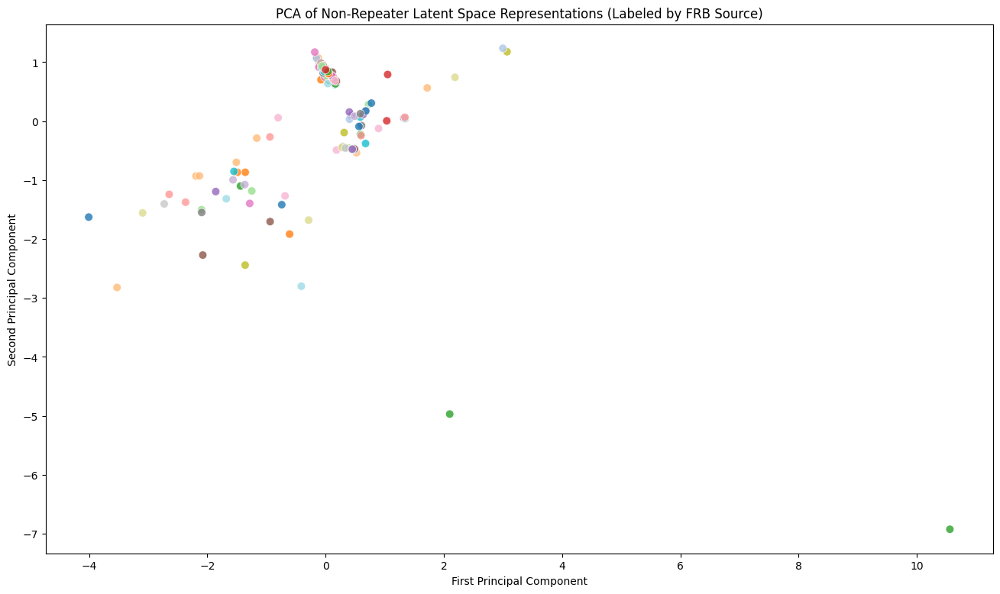


=== t-SNE Visualization ===


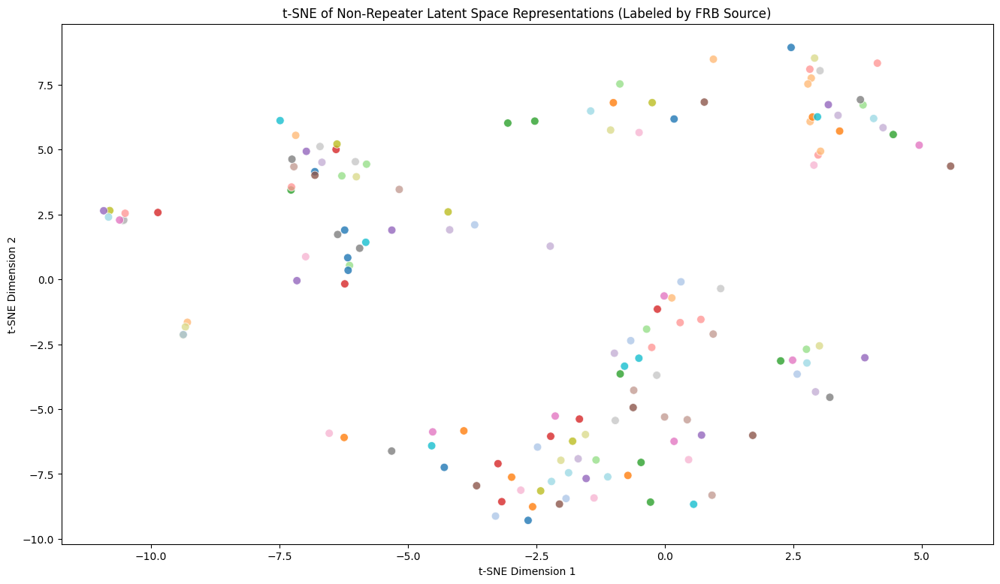


=== UMAP Visualization ===


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



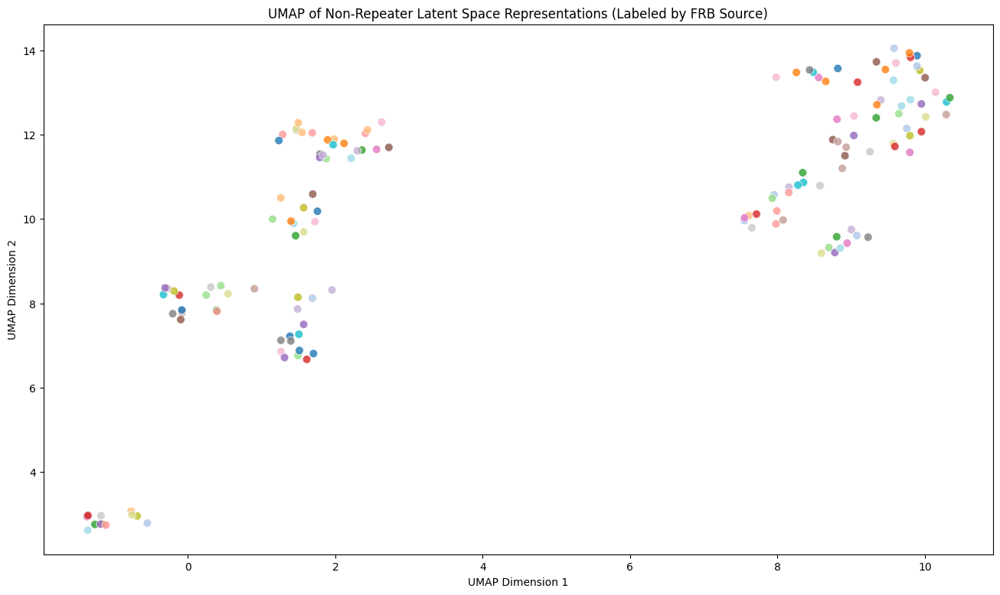

In [45]:
# Step 1: Extract latent representations
train_latent, train_labels_np = get_latent_representations(best_model, train_loader_no_repeater, device)
val_latent, val_labels_np = get_latent_representations(best_model, val_loader_no_repeater, device)


def visualize_latent_space_pca_source_nolegend(latent_representations, sources):
    pca = PCA(n_components=2)
    latent_2d = pca.fit_transform(latent_representations)

    plt.figure(figsize=(16, 9))
    sns.scatterplot(x=latent_2d[:, 0], y=latent_2d[:, 1], hue=sources, palette="tab20", s=60, alpha=0.8, legend=False)
    plt.title('PCA of Non-Repeater Latent Space Representations (Labeled by FRB Source)')
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    plt.savefig('PCA of Latent Space Representations (Labeled by FRB Source).png'.replace(" ", "_"), dpi=500) 
    plt.show()
    
def visualize_latent_space_tsne_nolegend(latent_representations, sources):
    tsne = TSNE(n_components=2, random_state=42)
    latent_2d = tsne.fit_transform(latent_representations)

    plt.figure(figsize=(16, 9))
    sns.scatterplot(x=latent_2d[:, 0], y=latent_2d[:, 1], hue=sources, palette="tab20", s=60, alpha=0.8, legend=False)
    plt.title('t-SNE of Non-Repeater Latent Space Representations (Labeled by FRB Source)')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.savefig('t-SNE of Latent Space Representations (Labeled by FRB Source).png'.replace(" ", "_"), dpi=500)
    plt.show()
    
def visualize_latent_space_umap_source_nolegend(latent_representations, sources):
    reducer = umap.UMAP(n_components=2, random_state=42)
    latent_2d = reducer.fit_transform(latent_representations)

    plt.figure(figsize=(16, 9))
    sns.scatterplot(x=latent_2d[:, 0], y=latent_2d[:, 1], hue=sources, palette="tab20", s=60, alpha=0.8, legend=False)
    plt.title('UMAP of Non-Repeater Latent Space Representations (Labeled by FRB Source)')
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.savefig('UMAP of Latent Space Representations (Labeled by FRB Source).png'.replace(" ", "_"), dpi=500)
    plt.show()




# Extract the source names for the validation set
val_sources_no_repeater = original_data.loc[val_labels_no_repeater.index, "Source"].values


# Step 2: Visualize the latent space using PCA
print("\n=== PCA Visualization ===")
visualize_latent_space_pca_source_nolegend(val_latent, val_sources_no_repeater)

# Step 4: Visualize the latent space using t-SNE
print("\n=== t-SNE Visualization ===")
visualize_latent_space_tsne_nolegend(val_latent, val_sources_no_repeater)

# Step 5: Visualize the latent space using UMAP
print("\n=== UMAP Visualization ===")
visualize_latent_space_umap_source_nolegend(val_latent, val_sources_no_repeater)


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



,Dynamic Spectral,PulseID,Source,Telescope,Date,Repeater,Receiver,Observing_band,MJD,GL,...,RM_syn,RM_syn_err,RM_QUfit,RM_QUfit_err,Scatt_t,Scatt_t_err,Scin_f,Scin_f_err,Reference,UMAP_cluster
3173,https://fastzjlab-imgs.alkaidos.cn/img/plain/b...,3571,FRB20190517C,CHIME,NaN,0.0,NaN,400-800,58620.921231,182.4800,...,NaN,NaN,NaN,NaN,0.149,+0.012/-0.012,NaN,NaN,https://www.chime-frb.ca/catalog,1
3408,https://fastzjlab-imgs.alkaidos.cn/img/plain/b...,3642,FRB20190625C,CHIME,NaN,0.0,NaN,400-800,58659.775190,188.2000,...,NaN,NaN,NaN,NaN,<0.63,NaN,NaN,NaN,https://www.chime-frb.ca/catalog,1
3401,https://fastzjlab-imgs.alkaidos.cn/img/plain/b...,3620,FRB20190614B,CHIME,NaN,0.0,NaN,400-800,58648.528685,82.6500,...,NaN,NaN,NaN,NaN,<0.68,NaN,NaN,NaN,https://www.chime-frb.ca/catalog,1
5313,https://fastzjlab-imgs.alkaidos.cn/img/plain/b...,5574,FRB20000925A,Parkes,NaN,0.0,13 beam,1230-1518,51812.769565,281.0488,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://doi.org/10.1093/mnras/stab2275,2
3223,https://fastzjlab-imgs.alkaidos.cn/img/plain/b...,3443,FRB20190224A,CHIME,NaN,0.0,NaN,400-800,58538.095049,128.2200,...,NaN,NaN,NaN,NaN,5.77,+0.75/-0.75,NaN,NaN,https://www.chime-frb.ca/catalog,1


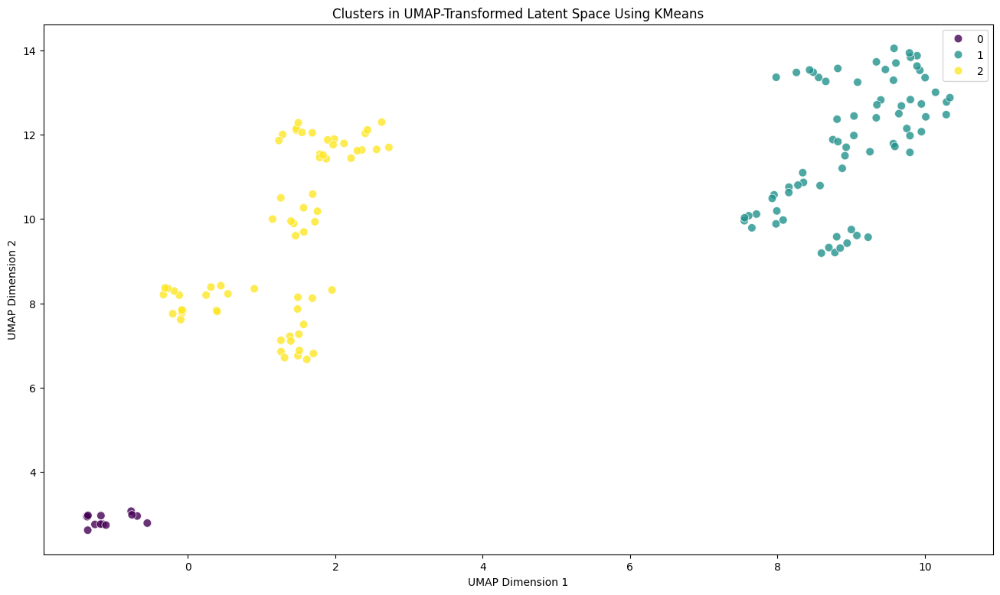

In [46]:
umap_reducer = umap.UMAP(n_components=2, random_state=42)
umap_embedding = umap_reducer.fit_transform(val_latent)  # val_latent from no_repeater data

# Here we use KMeans with 3 clusters as an example
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=42)
cluster_labels = kmeans.fit_predict(umap_embedding)

# plot clusters
plt.figure(figsize=(16, 9))
sns.scatterplot(x=umap_embedding[:, 0], y=umap_embedding[:, 1], hue=cluster_labels, palette='viridis', s=60, alpha=0.8)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('Clusters in UMAP-Transformed Latent Space Using KMeans')
plt.savefig('Clusters in UMAP-Transformed Latent Space.png', dpi=500)

val_indices_no_repeater = val_labels_no_repeater.index
df_val_original = original_data.loc[val_indices_no_repeater].copy()
df_val_original['UMAP_cluster'] = cluster_labels

# Display a preview of the dataframe
df_val_original.head() 

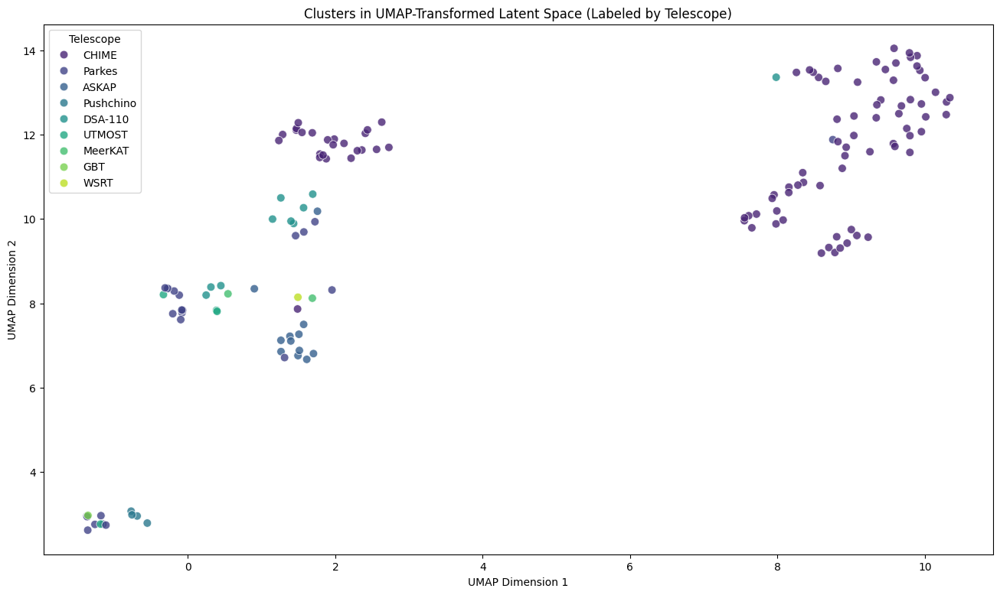

In [47]:
plt.figure(figsize=(16, 9))
sns.scatterplot(x=umap_embedding[:, 0], y=umap_embedding[:, 1], hue=df_val_original["Telescope"], palette='viridis', s=60, alpha=0.8)
plt.title('Clusters in UMAP-Transformed Latent Space (Labeled by Telescope)')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.savefig('Clusters in UMAP-Transformed Latent Space (Labeled by Telescope).png', dpi=500)

,Dynamic Spectral,PulseID,Source,Telescope,Date,Repeater,Receiver,Observing_band,MJD,GL,...,RM_syn_err,RM_QUfit,RM_QUfit_err,Scatt_t,Scatt_t_err,Scin_f,Scin_f_err,Reference,UMAP_cluster,TSNE_Cluster
3173,https://fastzjlab-imgs.alkaidos.cn/img/plain/b...,3571,FRB20190517C,CHIME,NaN,0.0,NaN,400-800,58620.921231,182.4800,...,NaN,NaN,NaN,0.149,+0.012/-0.012,NaN,NaN,https://www.chime-frb.ca/catalog,1,1
3408,https://fastzjlab-imgs.alkaidos.cn/img/plain/b...,3642,FRB20190625C,CHIME,NaN,0.0,NaN,400-800,58659.775190,188.2000,...,NaN,NaN,NaN,<0.63,NaN,NaN,NaN,https://www.chime-frb.ca/catalog,1,1
3401,https://fastzjlab-imgs.alkaidos.cn/img/plain/b...,3620,FRB20190614B,CHIME,NaN,0.0,NaN,400-800,58648.528685,82.6500,...,NaN,NaN,NaN,<0.68,NaN,NaN,NaN,https://www.chime-frb.ca/catalog,1,1
5313,https://fastzjlab-imgs.alkaidos.cn/img/plain/b...,5574,FRB20000925A,Parkes,NaN,0.0,13 beam,1230-1518,51812.769565,281.0488,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://doi.org/10.1093/mnras/stab2275,2,0
3223,https://fastzjlab-imgs.alkaidos.cn/img/plain/b...,3443,FRB20190224A,CHIME,NaN,0.0,NaN,400-800,58538.095049,128.2200,...,NaN,NaN,NaN,5.77,+0.75/-0.75,NaN,NaN,https://www.chime-frb.ca/catalog,1,1


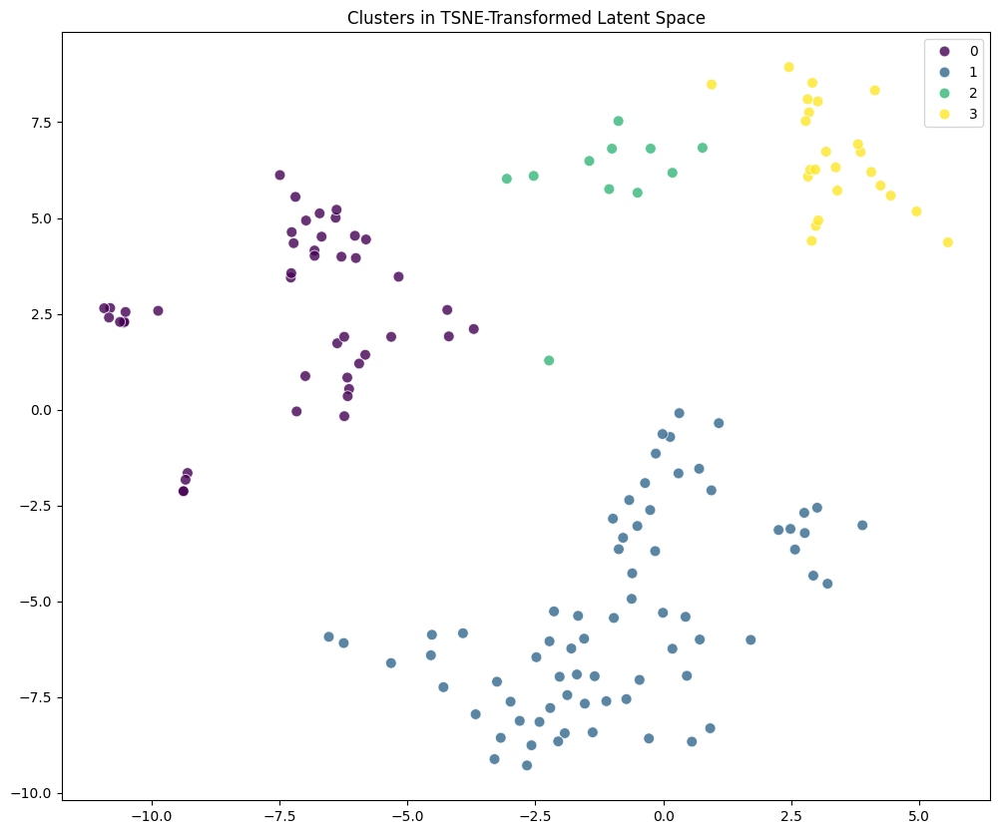

In [48]:
tsne_reducer = TSNE(n_components=2, random_state=42)
tsne_embedding = tsne_reducer.fit_transform(val_latent)  # val_latent from no_repeater data

# Here we use KMeans with 3 clusters as an example
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4, random_state=42)
cluster_labels = kmeans.fit_predict(tsne_embedding)

# plot clusters
plt.figure(figsize=(12, 10))
sns.scatterplot(x=tsne_embedding[:, 0], y=tsne_embedding[:, 1], hue=cluster_labels, palette='viridis', s=60, alpha=0.8)
plt.title('Clusters in TSNE-Transformed Latent Space')

val_indices_no_repeater = val_labels_no_repeater.index
df_val_original['TSNE_Cluster'] = cluster_labels

# Display a preview of the dataframe
df_val_original.head() 

Telescope
CHIME        93
Parkes       23
ASKAP        12
DSA-110      10
Pushchino     4
UTMOST        4
MeerKAT       2
GBT           1
WSRT          1
Name: count, dtype: int64

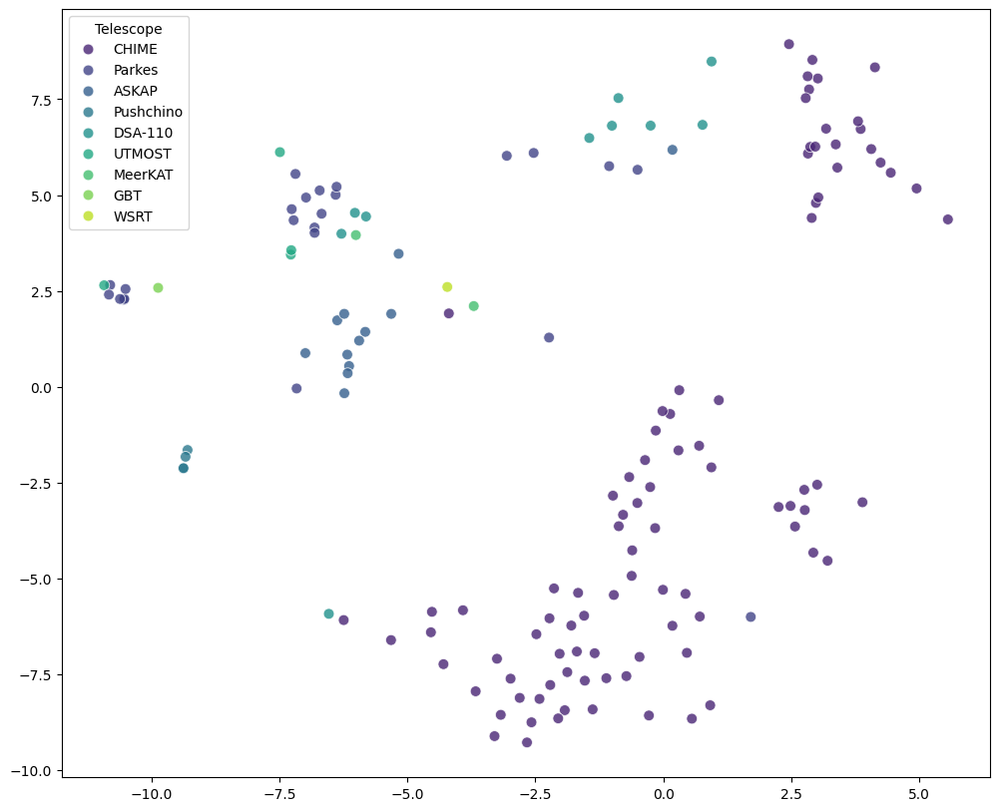

In [49]:
plt.figure(figsize=(12, 10))
sns.scatterplot(x=tsne_embedding[:, 0], y=tsne_embedding[:, 1], hue=df_val_original["Telescope"], palette='viridis', s=60, alpha=0.8)

df_val_original["Telescope"].value_counts()


=== Final Evaluation ===
Validation Accuracy: 0.8676
Classification Report:
               precision    recall  f1-score   support

Non-Repeater       0.92      0.83      0.87       150
    Repeater       0.83      0.91      0.87       129

    accuracy                           0.87       279
   macro avg       0.87      0.87      0.87       279
weighted avg       0.88      0.87      0.87       279

Confusion Matrix:
 [[125  25]
 [ 11 118]]

=== PCA Visualization ===


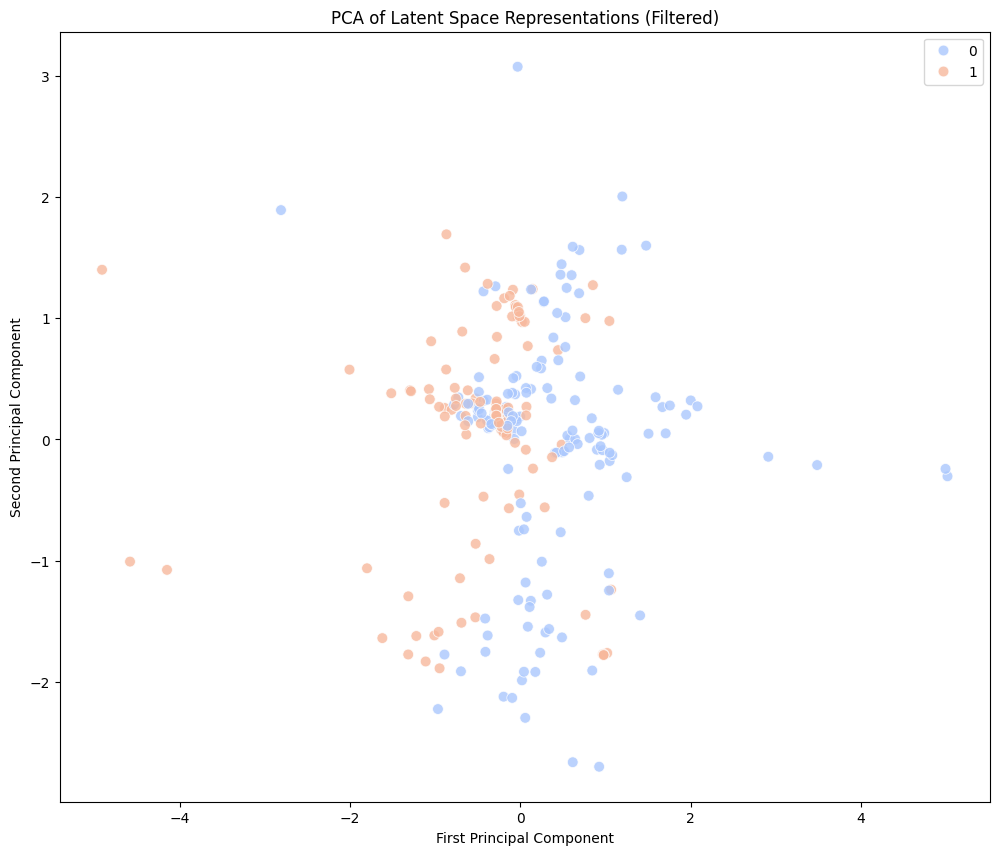


=== Clustering Analysis in Latent Space ===


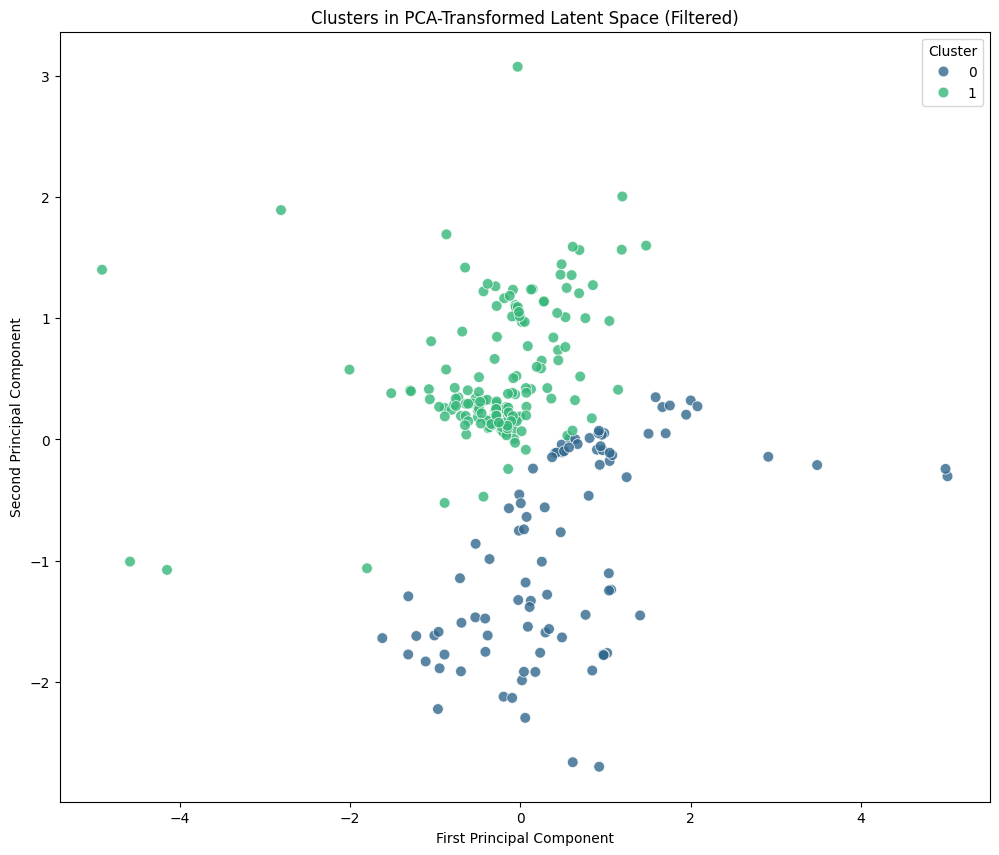

Silhouette Score: 0.4198760986328125
Adjusted Rand Index (ARI): 0.047369566482146665

=== t-SNE Visualization ===


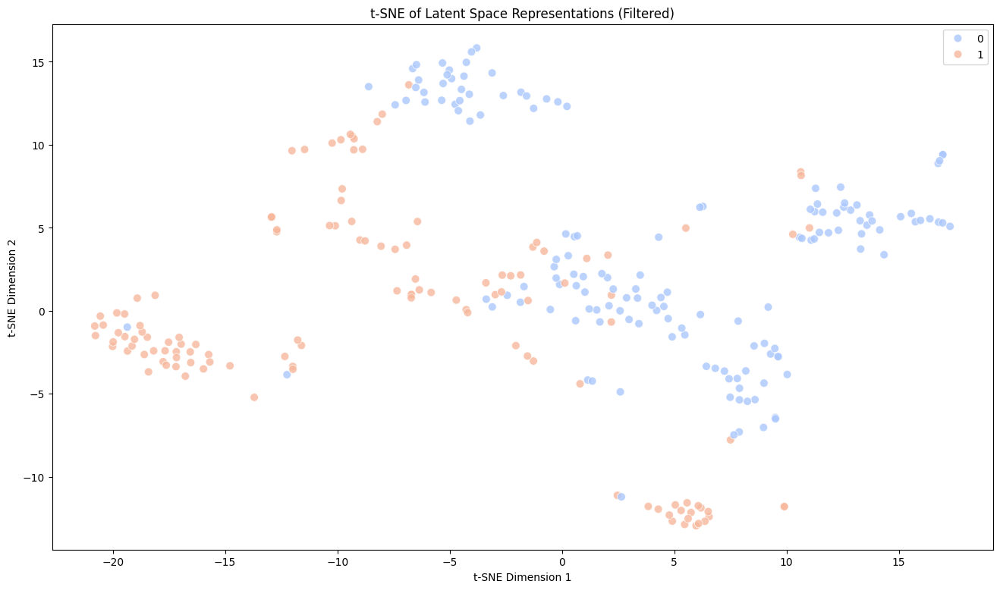


=== UMAP Visualization ===


/home/rtenacity/Projects/frb-analysis/.frb/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



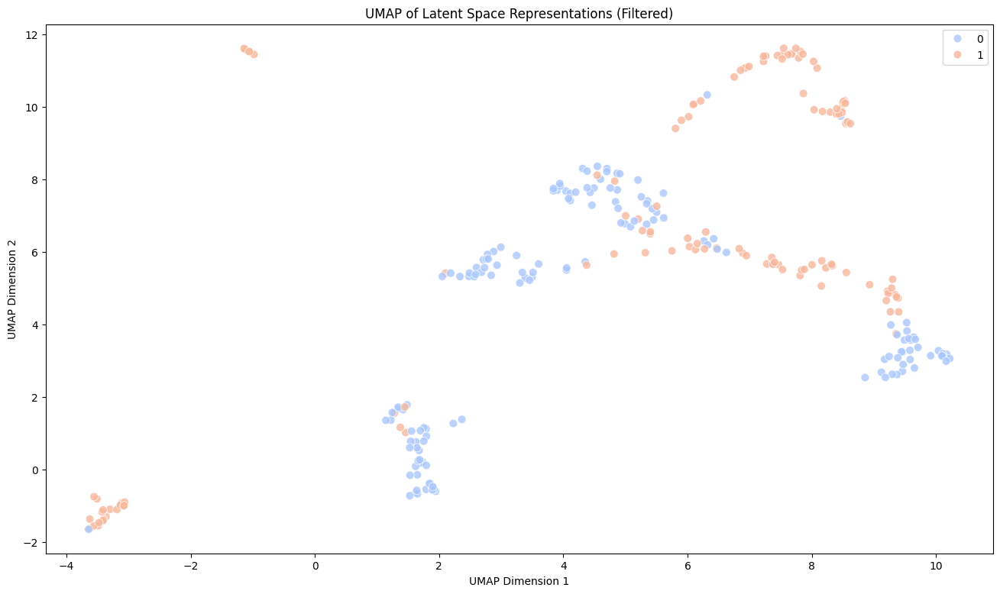


=== Isomap Visualization ===


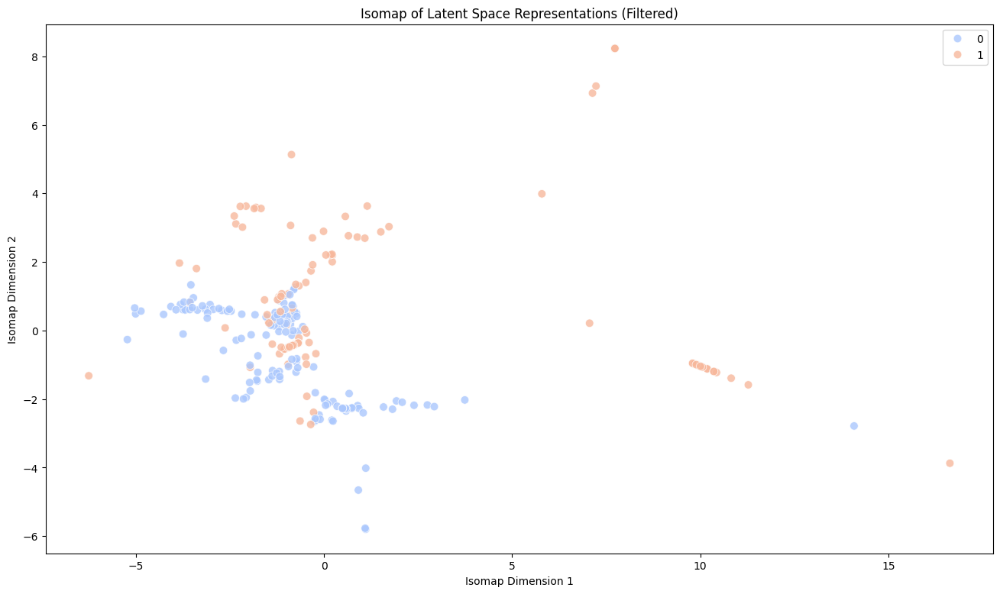

Cluster membership counts:
 cluster
 1    219
-1     38
 0     17
 2      5
Name: count, dtype: int64 

Top 10 members of each non‑noise cluster:
Cluster 0: {'FRB20190520B': 17}
Cluster 1: {'FRB20180814A': 8, 'FRB20180301A': 8, 'FRB20190303A': 8, 'FRB20191106C': 6, 'FRB20240316A': 5, 'FRB20200120E': 4, 'FRB20181128A': 3, 'FRB20190212A': 3, 'FRB20190915D': 3, 'FRB20240114A': 2}
Cluster 2: {'FRB20190417A': 5}

Top 5 same‑cluster FRBs similar to FRB20190128D:
 {'FRB20190320C': 0.09307998429434484, 'FRB20190124D': 0.11833748226203798, 'FRB20180915A': 0.17092990220165893, 'FRB20181118B': 0.21993121528951048, 'FRB20180920B': 0.2564944763033363}
FRB20181022E is similar to FRB20180909A which is a repeater
FRB20190112A is similar to FRB20191106C which is a repeater
FRB20190112A is similar to FRB20190915D which is a repeater
FRB20190323D is similar to FRB20180909A which is a repeater
FRB20190601C is similar to FRB20180909A which is a repeater
FRB20190601C is similar to FRB20180909A which is a re

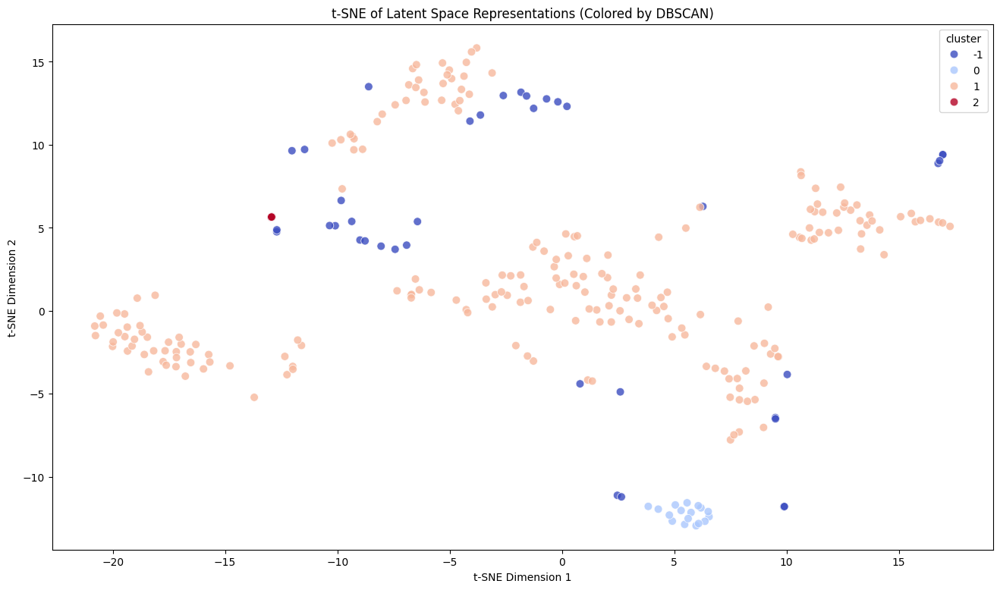

In [78]:
#import DBSCAN
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

# Step 1: Identify the 5 most frequent repeaters
repeater_counts = frb_data[frb_data['Repeater'] == 1]['Source'].value_counts()
top_5_repeaters = repeater_counts.head(5).index.tolist()

# # Step 2: Filter the dataset to exclude these repeaters
# filtered_indices = frb_data[~frb_data['Source'].isin(top_5_repeaters)].index
# filtered_data_clean = frb_data_clean.loc[filtered_indices]
# filtered_labels = labels.loc[filtered_indices]

top_5_repeaters = frb_data[frb_data['Repeater'] == 1]['Source'].value_counts().head(5).index.tolist()

# Sample 10 signals from each top repeater
sampled_indices = []
for repeater in top_5_repeaters:
    repeater_indices = frb_data[frb_data['Source'] == repeater].index
    sampled = np.random.choice(repeater_indices, size=min(5, len(repeater_indices)), replace=False)
    sampled_indices.extend(sampled)

# Get all other indices excluding the top 5 repeaters
non_top5_indices = frb_data[~frb_data['Source'].isin(top_5_repeaters)].index

# Combine the sampled top5 and the rest
final_indices = np.concatenate([non_top5_indices, sampled_indices])

# Filter the clean data and labels accordingly
filtered_data_clean = frb_data_clean.loc[final_indices]
filtered_labels = labels.loc[final_indices]


# Step 3: Standardize the filtered dataset
scaler = StandardScaler()
filtered_data_scaled = scaler.fit_transform(filtered_data_clean)

# Step 4: Split the filtered dataset into train and validation sets
train_data_filtered, val_data_filtered, train_labels_filtered, val_labels_filtered = train_test_split(
    filtered_data_scaled, filtered_labels, test_size=0.2, random_state=42, stratify=filtered_labels
)

# Step 5: Convert to PyTorch tensors
train_tensor_filtered = torch.tensor(train_data_filtered, dtype=torch.float32)
val_tensor_filtered = torch.tensor(val_data_filtered, dtype=torch.float32)
train_labels_tensor_filtered = torch.tensor(train_labels_filtered.values, dtype=torch.long)
val_labels_tensor_filtered = torch.tensor(val_labels_filtered.values, dtype=torch.long)

# Step 6: Create datasets and dataloaders
batch_size = 64
train_dataset_filtered = TensorDataset(train_tensor_filtered, train_labels_tensor_filtered)
val_dataset_filtered = TensorDataset(val_tensor_filtered, val_labels_tensor_filtered)

train_loader_filtered = DataLoader(train_dataset_filtered, batch_size=batch_size, shuffle=True)
val_loader_filtered = DataLoader(val_dataset_filtered, batch_size=batch_size, shuffle=False)

def train_supervised_filtered(model, optimizer, scheduler, epoch, beta, gamma, class_weight, classification_multiplier):
    model.train()
    train_loss = 0
    recon_loss_total = 0
    kl_loss_total = 0
    classification_loss_total = 0
    
    correct = 0
    total = 0
    
    for batch_idx, (data, labels) in enumerate(train_loader_filtered):
        data, labels = data.to(device), labels.to(device)
        optimizer.zero_grad()
        recon_batch, mu, logvar, class_logits = model(data)
        
        # Supervised loss function
        loss, recon_loss, kl_loss, classification_loss = loss_function(
            recon_batch, data, mu, logvar, class_logits, labels, beta, gamma, class_weight, classification_multiplier
        )
        
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        recon_loss_total += recon_loss.item()
        kl_loss_total += kl_loss.item()
        classification_loss_total += classification_loss.item()
        
        predicted = (class_logits > 0.5).float()
        total += labels.size(0)
        correct += (predicted.squeeze() == labels).sum().item()
        
        # if batch_idx % 100 == 0:
            # print(classification_loss)
            # print(f'Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)} '
            #       f'({100. * batch_idx / len(train_loader):.0f}%)]\tLoss: {loss.item() / len(data):.6f}')
    
    # Calculate average loss and accuracy for the epoch
    avg_loss = train_loss / len(train_loader.dataset)
    avg_recon = recon_loss_total / len(train_loader.dataset)
    avg_kl = kl_loss_total / len(train_loader.dataset)
    avg_class = classification_loss_total / len(train_loader.dataset)
    accuracy = correct / total
    
    # print(f'====> Epoch: {epoch} Average loss: {avg_loss:.4f}, Recon: {avg_recon:.4f}, KL: {avg_kl:.4f}, '
    #       f'Class: {avg_class:.4f}, Accuracy: {accuracy:.4f}')
    return avg_loss, avg_recon, avg_kl, avg_class, accuracy

def validate_supervised_filtered(model, scheduler, optimizer, epoch, beta, gamma, class_weight, classification_multiplier):
    model.eval()
    val_loss = 0
    recon_loss_total = 0
    kl_loss_total = 0
    classification_loss_total = 0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for data, labels in val_loader_filtered:
            data, labels = data.to(device), labels.to(device)
            recon_batch, mu, logvar, class_logits = model(data)
            
            loss, recon_loss, kl_loss, classification_loss = loss_function(
                recon_batch, data, mu, logvar, class_logits, labels, beta, gamma, class_weight, classification_multiplier
            )
            
            val_loss += loss.item()
            recon_loss_total += recon_loss.item()
            kl_loss_total += kl_loss.item()
            classification_loss_total += classification_loss.item()
            
            predicted = (class_logits > 0.5).float()
            total += labels.size(0)
            correct += (predicted.squeeze() == labels).sum().item()
    
    avg_loss = val_loss / len(val_loader.dataset)
    avg_recon = recon_loss_total / len(val_loader.dataset)
    avg_kl = kl_loss_total / len(val_loader.dataset)
    avg_class = classification_loss_total / len(val_loader.dataset)
    accuracy = correct / total
    
    # print(f'====> Validation loss: {avg_loss:.4f}, Recon: {avg_recon:.4f}, KL: {avg_kl:.4f}, '
    #       f'Class: {avg_class:.4f}, Accuracy: {accuracy:.4f}')
    return avg_loss, avg_recon, avg_kl, avg_class, accuracy


def early_stopping(val_losses, patience):
    if len(val_losses) > patience:
        if all(val_losses[-i-1] <= val_losses[-i] for i in range(1, patience+1)):
            return True
    return False



# Step 7: Train the model with the filtered dataset
best_model = SupervisedVAE(
    input_dim, 
    best_params["hidden_dim"], 
    best_params["latent_dim"], 
    best_params["dropout_rate"], 
    activation=get_activation_function(best_params["activation"])
).to(device)

optimizer = torch.optim.Adam(best_model.parameters(), lr=best_params["lr"])
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=best_params["scheduler_patience"])

num_epochs = 100
for epoch in range(1, num_epochs + 1):
    train_loss, _, _, _, train_accuracy = train_supervised_filtered(
        best_model, optimizer, scheduler, epoch, best_params["beta"], 
        best_params["gamma"], best_params["class_weight"], best_params["classification_multiplier"]
    )
    
    val_loss, _, _, _, val_accuracy = validate_supervised_filtered(
        best_model, optimizer, scheduler, epoch, best_params["beta"], 
        best_params["gamma"], best_params["class_weight"], best_params["classification_multiplier"]
    )
    scheduler.step(val_loss)
    
    if early_stopping([val_loss], stop_patience):
        print(f"Early stopping triggered at epoch {epoch}")
        break

# Evaluate the model after training
val_accuracy, val_class_report, val_conf_matrix, val_preds, val_labels = evaluate_classifier_full(best_model, val_loader_filtered, device)

print("\n=== Final Evaluation ===")
print(f"Validation Accuracy: {val_accuracy:.4f}")
print("Classification Report:\n", val_class_report)
print("Confusion Matrix:\n", val_conf_matrix)
# Step 1: Extract latent representations
train_latent, train_labels_np = get_latent_representations(best_model, train_loader_filtered, device)
val_latent, val_labels_np = get_latent_representations(best_model, val_loader_filtered, device)

# Step 2: Visualize the latent space using PCA
print("\n=== PCA Visualization ===")
visualize_latent_space_pca(val_latent, val_labels_np, best_model, device, title='PCA of Latent Space Representations (Filtered)')

# Step 3: Perform clustering analysis
print("\n=== Clustering Analysis in Latent Space ===")
cluster_and_visualize(val_latent, val_labels_np, title='Clusters in PCA-Transformed Latent Space (Filtered)')

# Step 4: Visualize the latent space using t-SNE
print("\n=== t-SNE Visualization ===")
visualize_latent_space_tsne(val_latent, val_labels_np, title='t-SNE of Latent Space Representations (Filtered)', palette='coolwarm')

# Step 5: Visualize the latent space using UMAP
print("\n=== UMAP Visualization ===")
visualize_latent_space_umap(val_latent, val_labels_np, title='UMAP of Latent Space Representations (Filtered)', palette='coolwarm')

# Step 6: Visualize the latent space using Isomap
print("\n=== Isomap Visualization ===")
visualize_latent_space_isomap(val_latent, val_labels_np, title='Isomap of Latent Space Representations (Filtered)')



val_index = val_labels_filtered.index
val_sources = original_data.loc[val_index, 'Source'].values

latent_df = pd.DataFrame(
    val_latent, 
    index=val_index,
)
latent_df['Source'] = val_sources

db = DBSCAN(eps=1, min_samples=5).fit(val_latent)
latent_df['cluster'] = db.labels_

print("Cluster membership counts:\n", latent_df['cluster'].value_counts(), "\n")
print("Top 10 members of each non‑noise cluster:")
for cluster_label in sorted(latent_df['cluster'].unique()):
    if cluster_label >= 0:
        members = latent_df[latent_df['cluster']==cluster_label]['Source']
        print(f"Cluster {cluster_label}:", members.value_counts().head(10).to_dict())

nbrs = NearestNeighbors(n_neighbors=6).fit(val_latent)
distances, indices = nbrs.kneighbors(val_latent)



def find_similar(source):
    idx = latent_df[latent_df['Source'] == source].index[0]
    source_cluster = latent_df.loc[idx, 'cluster']
    
    # If it’s noise (cluster = -1), nothing to return
    if source_cluster == -1:
        return []
    
    pos = list(latent_df.index).index(idx)
    
    neighbors = {}
    for i, neighbor_pos in enumerate(indices[pos][1:]):
        neighbor_idx = latent_df.index[neighbor_pos]
        if latent_df.loc[neighbor_idx, 'cluster'] == source_cluster:
            neighbors[latent_df.loc[neighbor_idx, 'Source']] = float(distances[pos][i+1])


    return neighbors

print()
example = latent_df['Source'].iloc[2]
print(f"Top 5 same‑cluster FRBs similar to {example}:\n", find_similar(example))
for source in garcia_list:
    if source in latent_df['Source'].values:
        similar_source_data = find_similar(source)
        if similar_source_data != []:
            for similar_source in similar_source_data.keys():
                if original_data[original_data['Source'] == similar_source]['Repeater'].values[0] == 1:
                    print(f"{source} is similar to {similar_source} which is a repeater")
for source in zhu_ge_list:
    if source in latent_df['Source'].values:
        similar_source_data = find_similar(source)
        if similar_source_data != []:
            for similar_source in similar_source_data.keys():
                if original_data[original_data['Source'] == similar_source]['Repeater'].values[0] == 1:
                    print(f"{source} is similar to {similar_source} which is a repeater")
for source in garcia_list:
    if source in zhu_ge_list and source in luo_list and source in latent_df['Source'].values:
            similar_source_data = find_similar(source)
            if similar_source_data != []:
                for similar_source, score in similar_source_data.items():
                    if frb_data[frb_data['Source'] == similar_source]['Repeater'].values[0] == 1:
                        print(f"{source} is similar to {similar_source} with a score of {score:.5f} which is a repeater")
                        
visualize_latent_space_tsne(val_latent, latent_df['cluster'], title='t-SNE of Latent Space Representations (Colored by DBSCAN)', palette='coolwarm')